# Identify amyloidogenic and polyclonal plasma-cell clones

**Biology rationale.** The study distinguishes pathogenic amyloidogenic plasma cells from normal polyclonal plasma cells using paired transcriptome and immunoglobulin clonotype information.

**Aim.** Assign clonotypes, define predominant amyloidogenic clones, and compare their transcriptional states with polyclonal plasma cells.

**Data input.** `./250817-AL-all78umap-singletonly-umap.rds`, `sce1_ALl19clustermeta.data.csv`, `Fig1e.pdf`, `Figs3a.pdf`, `Fig1f.pdf`

**Data outputs.** `figures2a.pdf`, `../BCR/sc0413/lcwc3-5/outs/filtered_contig_annotations.csv`, `../BCR/sc0413/lcwc3-5/outs/consensus_annotations.csv`, `../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LFM-5-b/LFM-5-b/outs/filtered_contig_annotations.csv`, `../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LFM-5-b/LFM-5-b/outs/consensus_annotations.csv`

## 1. Packages and setup


In [1]:
library(Seurat)
library(patchwork)
library(speckle)
library(limma)
library(ggplot2)
library(DropletUtils)
library(Matrix)
library(celda)
library(SingleCellExperiment)
library(SingleR)
library(celldex)
set.seed(123)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t






Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollaps

In [2]:
# Set these *before* library(reticulate) or library(sceasy)
Sys.setenv(RETICULATE_PYTHON = "/home/miniconda3/envs/carlin/bin/python")
options(reticulate.conda_binary = "/home/miniconda3/bin/conda")

library(reticulate)
py_config()  # should now show your conda 'jupyter' Python


python:         /home/miniconda3/envs/carlin/bin/python
libpython:      /home/miniconda3/envs/carlin/lib/libpython3.8.so
pythonhome:     /home/miniconda3/envs/carlin:/home/miniconda3/envs/carlin
version:        3.8.19 | packaged by conda-forge | (default, Mar 20 2024, 12:47:35)  [GCC 12.3.0]
numpy:          /home/miniconda3/envs/carlin/lib/python3.8/site-packages/numpy
numpy_version:  1.24.4

NOTE: Python version was forced by RETICULATE_PYTHON

In [3]:
sce1<-readRDS(file='./250817-AL-all78umap-singletonly-umap.rds')

In [4]:
sce1

An object of class Seurat 
36601 features across 630111 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

Separate plasma cells from non-plasma-cells

In [5]:
clusters_to_keep <- setdiff(0:86, c(60,48,61,50,38,36,37,9,14,26,56,5,65,12,83,55,32,31,42,80,46,57,16,11,4,6,34,64,52,68,64,0,8,41,2,63,53,2,1,3,66,67) )  # Replace with the cluster IDs you want to keep
# Define the barcodes to keep
ALl19cluster<-read.csv(file='sce1_ALl19clustermeta.data.csv')
barcodes_to_keep <- ALl19cluster$X
# <-- replace with your real barcodes

# Subset Seurat object: keep cells in chosen clusters OR in the barcode list
sce1_plasma <- subset(
  sce1,
  subset = (seurat_clusters %in% clusters_to_keep) | (Cells(sce1) %in% barcodes_to_keep)
)

## 2. Normalization, integration, and dimensional reduction


scCustomize v2.1.2
If you find the scCustomize useful please cite.
See 'samuel-marsh.github.io/scCustomize/articles/FAQ.html' for citation info.



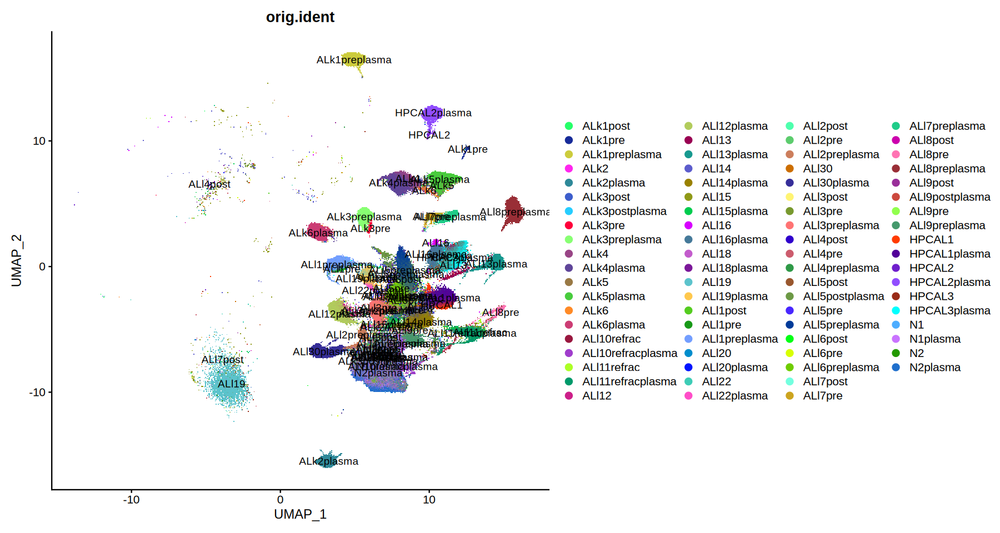

In [6]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=15)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("orig.ident"),label=T) 

In [7]:
# run standard anlaysis workflow
sce1_plasma <- NormalizeData(sce1_plasma)
sce1_plasma <- FindVariableFeatures(sce1_plasma)

Normalizing layer: counts

Finding variable features for layer counts



In [8]:
# Step 1: Identify genes starting with "IG"
ig_genes <- grep("^IGK|^IGH|^IGL", rownames(sce1_plasma), value = TRUE)

# Step 2: Exclude these genes from variable features
current_variable_features <- VariableFeatures(sce1_plasma)
filtered_variable_features <- setdiff(current_variable_features, ig_genes)
VariableFeatures(sce1_plasma) <- filtered_variable_features

# Step 3: Proceed with PCA and UMAP
sce1_plasma <- ScaleData(sce1_plasma, features = VariableFeatures(sce1_plasma))
sce1_plasma <- RunPCA(sce1_plasma, features = VariableFeatures(sce1_plasma))

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”
PC_ 1 
Positive:  RHOB, CITED2, DUSP5, CD79A, QPCT, JSRP1, FCRLA, PELI1, CD9, NFKBIA 
	   CDKN1A, ATF5, FBP1, CAV1, SLC22A17, LMNA, P2RX1, HSPB1, DPEP1, NR4A1 
	   FAM92B, IRF4, BMP6, PHGDH, ABCB9, OTUD1, PTP4A3, CTHRC1, AMPD1, FAM30A 
Negative:  NKG7, GNLY, IL32, FGFBP2, CCL5, PTPRC, GZMA, GZMH, GZMB, CD3D 
	   KLRD1, CST7, HCST, CD2, CD8B, CD3G, FCGR3A, CD52, TRBC2, GIMAP7 
	   CD3E, PRF1, KLRG1, GZMM, PTGDS, CD8A, GIMAP4, LCP1, HLA-DPB1, MYOM2 
PC_ 2 
Positive:  CD99, TMSB4X, SLC22A17, CTSW, CD79A, P2RX1, WFDC2, TMC6, RBP1, CD81 
	   MYADM, SLC22A31, WARS, TNFRSF18, LINC01781, PCSK1N, CD44, TGFBR3L, TCN2, PGLYRP2 
	   ERN1, TIMP1, FAM30A, HLA-DMA, CTHRC1, FCER2, MT1F, TMEM176B, ATF5, ALOX5AP 
Negative:  MT-ND5, PTP4A3, RPS17, NEB, MT-ND2, MT-ND4, NEAT1, MT-CO3, RPL23, HIST1H1C 
	   GAS5, MT-ATP6, CST6, AL353753.1, DHRS9, LINC01088, NUDT12, MT-ND3, TXNIP, HIST

## 3. Normalization, integration, and dimensional reduction


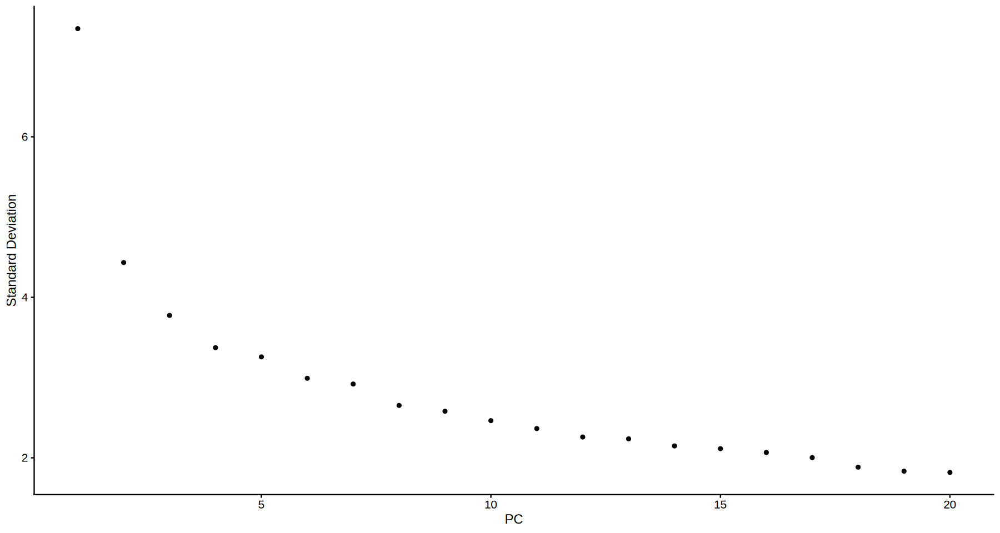

In [9]:
ElbowPlot(sce1_plasma)

In [10]:
sce1_plasma <- FindNeighbors(sce1_plasma, dims = 1:15, reduction = "pca")
sce1_plasma <- FindClusters(sce1_plasma, resolution = 1, cluster.name = "seurat_clusters")

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 232300
Number of edges: 6542590

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9443
Number of communities: 52
Elapsed time: 81 seconds


In [11]:
sce1_plasma <- RunUMAP(sce1_plasma, dims = 1:15, reduction = "pca", reduction.name = "UMAP")

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
15:21:39 UMAP embedding parameters a = 0.9922 b = 1.112

15:21:39 Read 232300 rows and found 15 numeric columns

15:21:39 Using Annoy for neighbor search, n_neighbors = 30

15:21:39 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:21:58 Writing NN index file to temp file /tmp/RtmpACj9FZ/file2162f37a470bd5

15:21:58 Searching Annoy index using 1 thread, search_k = 3000

15:23:25 Annoy recall = 100%

15:23:27 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbo

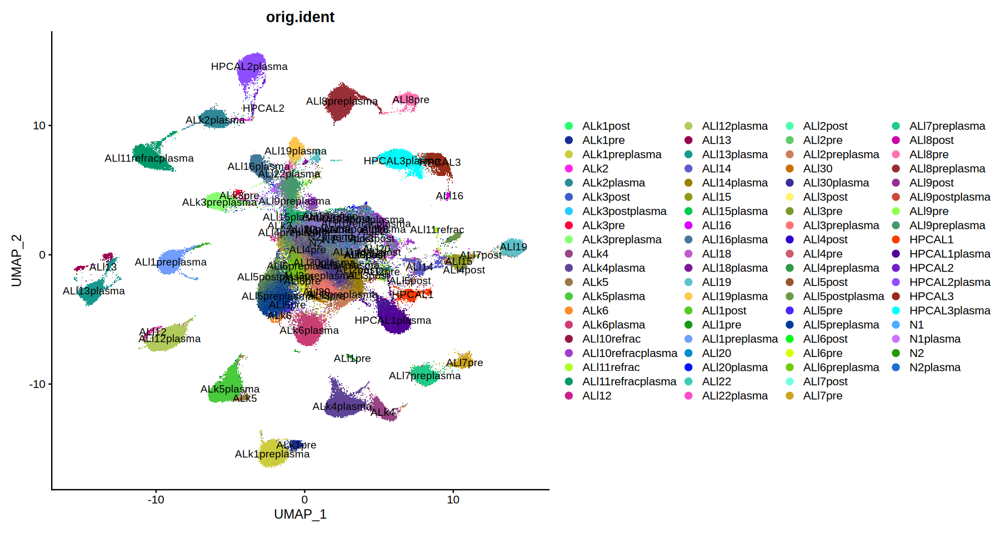

In [12]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=15)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("orig.ident"),label=T) 

In [13]:
p <-DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("orig.ident"),label=T) 
ggsave("Fig1e.pdf", plot = p, width = 15, height =8)


## 4. Visualization and figure generation



NOTE: DimPlot_scCustom returns split plots as layout of all plots each
with their own axes as opposed to Seurat which returns with shared x or y axis.
To return to Seurat behvaior set `split_seurat = TRUE`.

-----This message will be shown once per session.-----


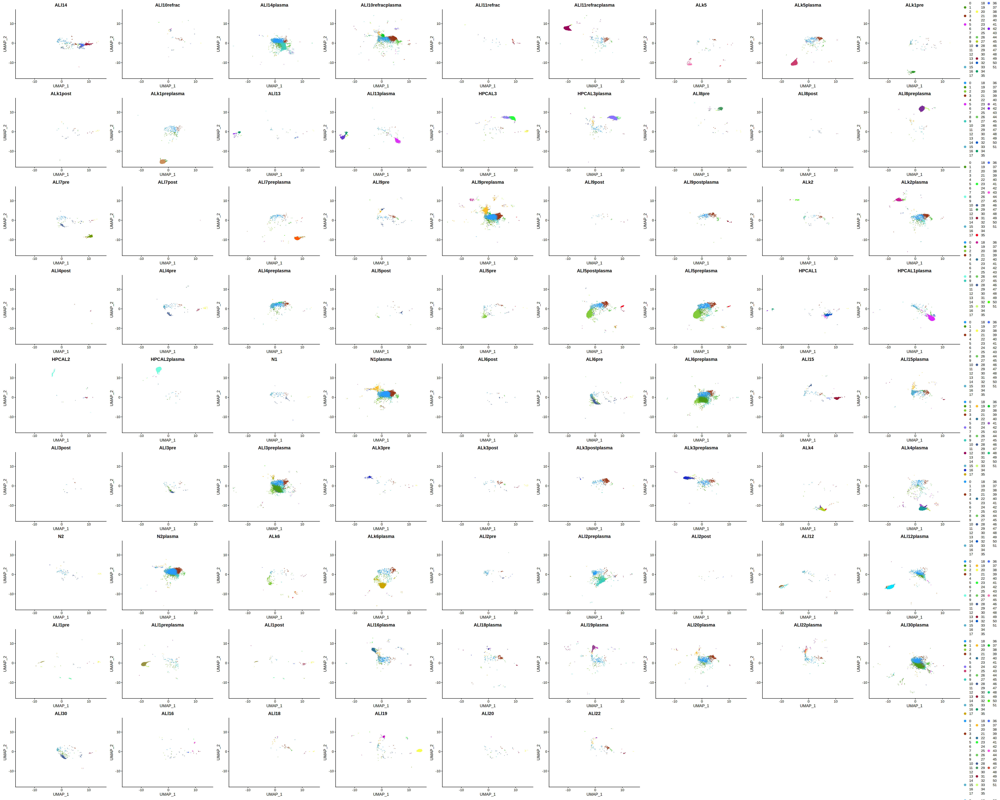

In [14]:
library(scCustomize)
options(repr.plot.height=40,repr.plot.width=50)
DimPlot_scCustom(sce1_plasma, pt.size=2,reduction = "UMAP", split.by = c("orig.ident"),label=F) 

See how the clinical features are linked to transcriptomic heterogeneity

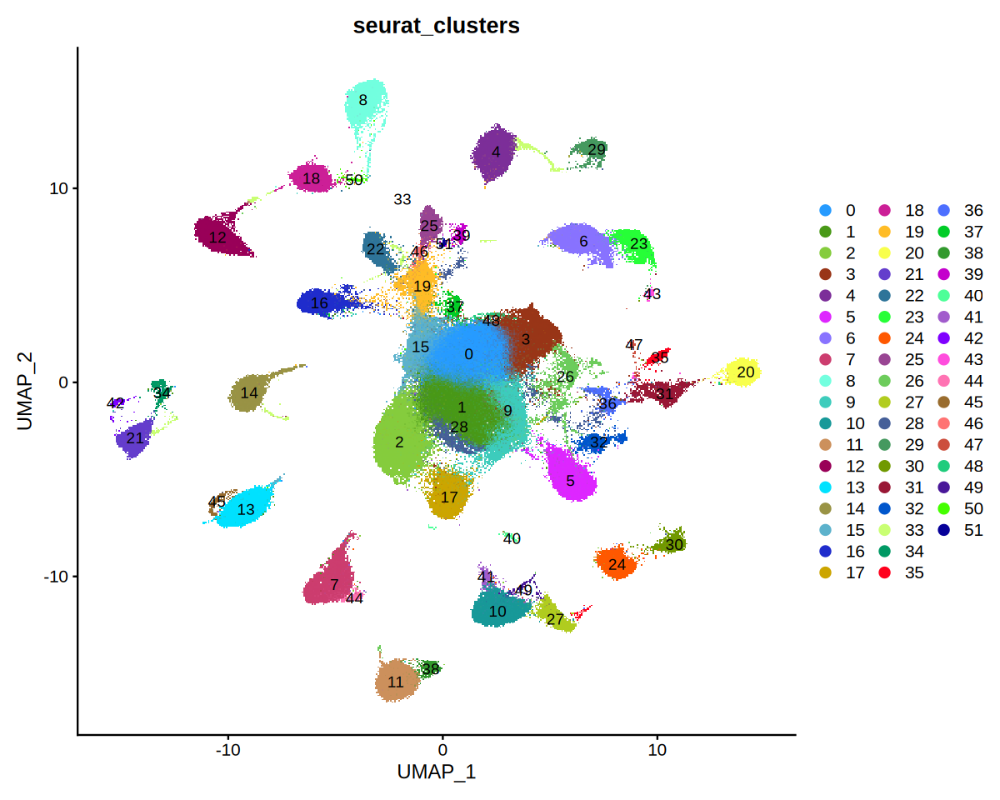

In [15]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=10)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("seurat_clusters"),label=T) 

In [16]:
p <- DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("seurat_clusters"),label=T) 
ggsave("Figs3a.pdf", plot = p, width = 11, height =8)


## 5. Sample metadata and clinical groups


In [17]:
sce1_plasma

An object of class Seurat 
36601 features across 232300 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [18]:
sce1_plasma@meta.data$subtype<-sce1_plasma@meta.data$orig.ident

In [19]:
sce1_plasma@meta.data$subtype<-gsub('HPCAL1','ALl',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('HPCAL2','ALl',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('HPCAL3','ALl',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('HPCALplasma','ALl',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('N1','N',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('N2','N',sce1_plasma@meta.data$subtype)
sce1_plasma@meta.data$subtype<-gsub('Nplasma','N',sce1_plasma@meta.data$subtype)

In [20]:
sce1_plasma@meta.data$subtype <- substr(sce1_plasma@meta.data$subtype, 1, 3)

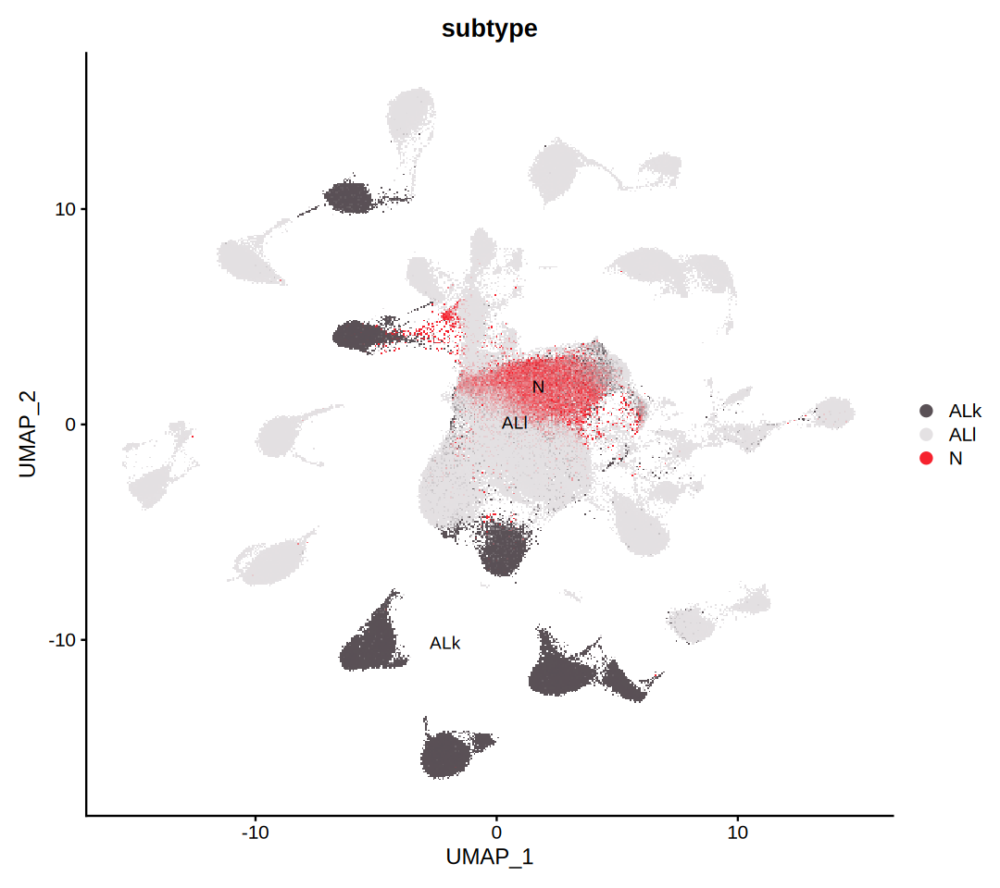

In [21]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=9)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("subtype"),label=T,order=T) 

## 6. Save and export results


In [22]:
p <- DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("subtype"),label=T,order=T) 
ggsave("Fig1f.pdf", plot = p, width = 9, height =8)


In [23]:
#assgin baseline translocation to the treated sample
sce1_plasma@meta.data$mutation<-sce1_plasma@meta.data$orig.ident
sce1_plasma@meta.data$mutation<-gsub('ALl10refracplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl10refrac','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl11refracplasma','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl11refrac','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk4plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk4','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk5plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk5','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk2plasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk2','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk6plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk6','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk1preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk1pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk1postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk1post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk3preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk3pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk3postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALk3post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl1preplasma','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl1pre','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl1postplasma','1q21(gain)_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl1post','1q21(gain)_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl2preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl2pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl2postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl2post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl3preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl3pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl3postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl3post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl5preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl5pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl5postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl5post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl7preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl7pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl7postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl7post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl8preplasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl8pre','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl8postplasma','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl8post','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl9preplasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl9pre','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl9postplasma','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl9post','None_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl4preplasma','NA',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl4pre','NA',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl4postplasma','NA',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl4post','NA',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl6preplasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl6pre','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl6postplasma','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl6post','IgH/CCND1(t(11;14))_Post',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl12plasma','IgH/FGFR3(t(4;14))/1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl12','IgH/FGFR3(t(4;14))/1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl13plasma','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl13','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl14plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl14','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl15plasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl15','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl16plasma','17p13.1(del)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl16','17p13.1(del)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl18plasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl18','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl19plasma','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl19','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl20plasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl20','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl22plasma','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl22','None_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL1plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL1','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl30plasma','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('ALl30','IgH/CCND1(t(11;14))_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL2plasma','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL2','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL3plasma','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('HPCAL3','1q21(gain)_Pre',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('N1plasma','Normal',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('N1','Normal',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('N2plasma','Normal',sce1_plasma@meta.data$mutation)
sce1_plasma@meta.data$mutation<-gsub('N2','Normal',sce1_plasma@meta.data$mutation)

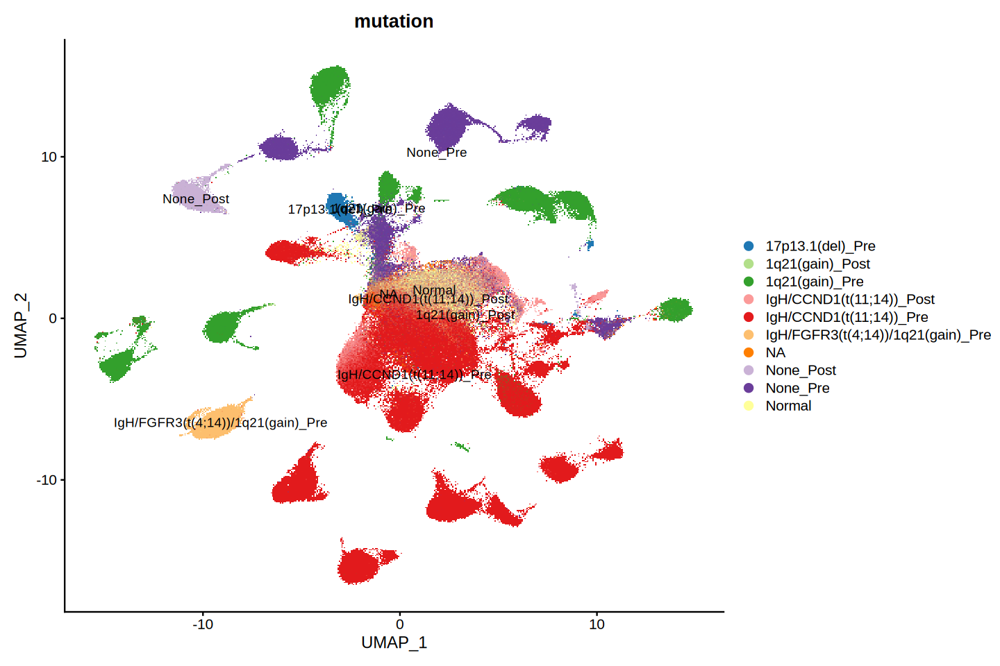

In [24]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=12)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("mutation"),label=T,order=T, colors_use = RColorBrewer::brewer.pal(n = 11, name = "Paired")[2:11])

## 7. Save and export results


In [25]:
p <- DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("mutation"),label=T,order=T, colors_use = RColorBrewer::brewer.pal(n = 11, name = "Paired")[2:11])
ggsave("Fig1g.pdf", plot = p, width = 12, height =8)


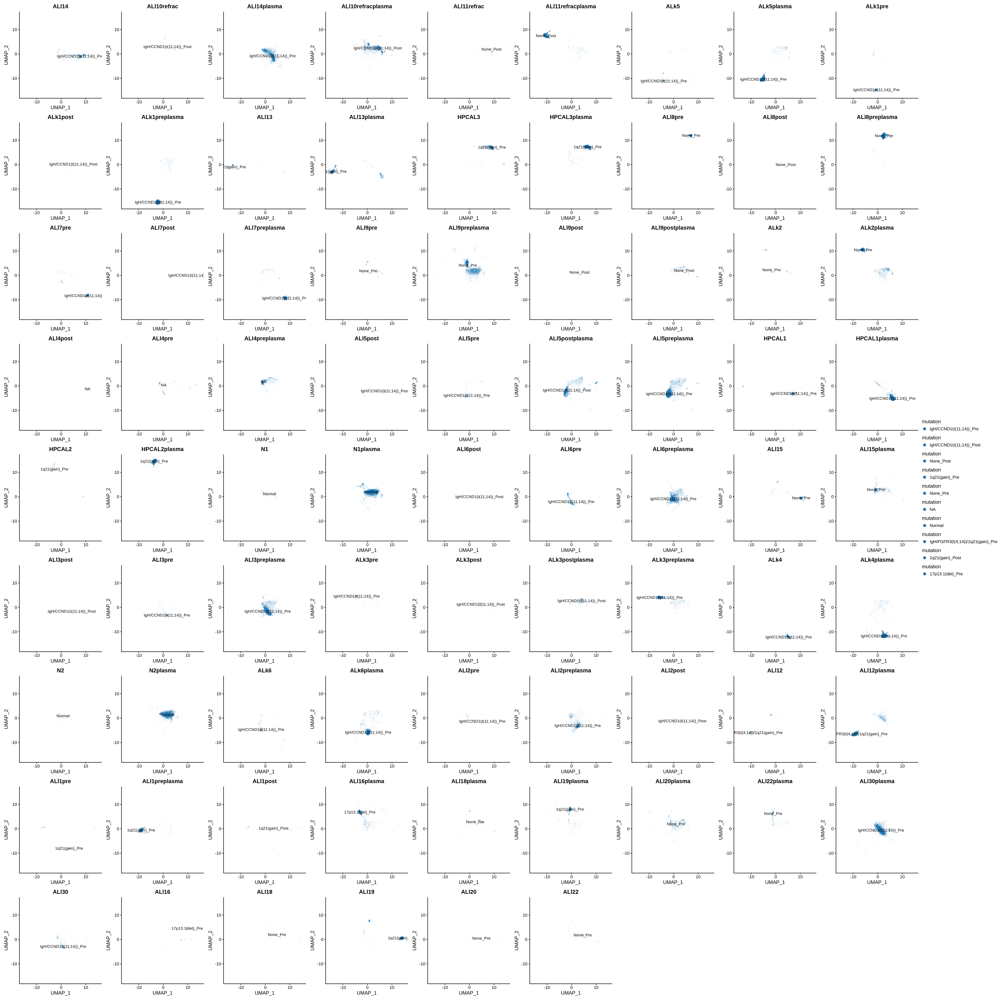

In [26]:
library(scCustomize)
options(repr.plot.height=40,repr.plot.width=40)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("mutation"),split.by='orig.ident',label=T,order=T, colors_use = RColorBrewer::brewer.pal(n = 11, name = "Paired")[2:11])

In [27]:
length(ig_genes)

[1] 411

In [28]:
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.genes

In [29]:
sce1_plasma<- CellCycleScoring(sce1_plasma, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

Warning message:
“The following features are not present in the object: MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, HN1, not searching for symbol synonyms”


## 8. Visualization and figure generation


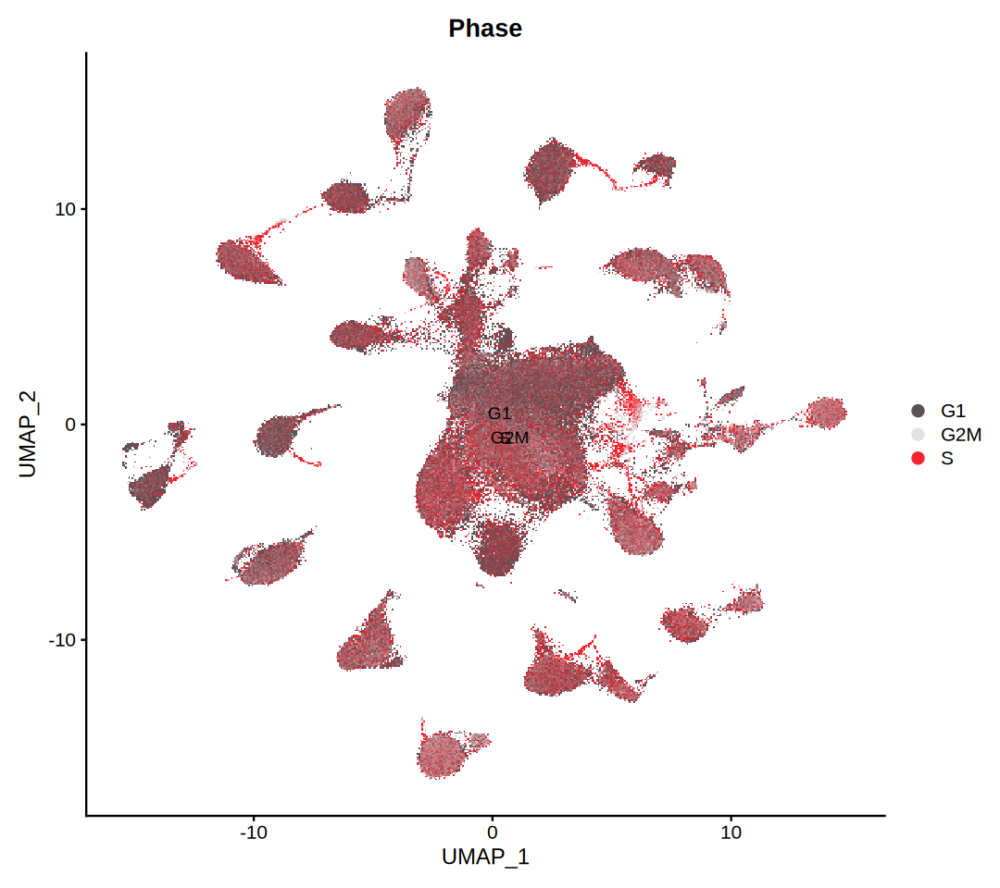

In [30]:
options(repr.plot.height=8,repr.plot.width=9)
DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("Phase"),label=T,order=T) 

In [31]:
library(sceasy)
library(reticulate)
sce1_plasma[["RNA"]] <- as(sce1_plasma[["RNA"]], "Assay")
sceasy::convertFormat(sce1_plasma, from="seurat", to="anndata",outFile='counts.h5ad')

Warning message:
“Assay RNA changing from Assay5 to Assay”
Warning message in .regularise_df(obj@meta.data, drop_single_values = drop_single_values):
“Dropping single category variables:singlet”


AnnData object with n_obs × n_vars = 232300 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'subtype', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'

In [32]:
# Assuming `seurat_obj` is your Seurat object
library(ggplot2)

Idents(sce1_plasma)<-"orig.ident"
# Generate the UMAP plot with DimPlot_scCustom
umap_plot <- DimPlot_scCustom(sce1_plasma, pt.size=1,reduction = "UMAP", group.by = c("orig.ident"),label=T) 

# Extract the ggplot object
plot_data <- ggplot_build(umap_plot)

# Extract color mapping
color_mapping <- unique(plot_data$data[[1]]$colour)  # Unique colors

# Extract numeric cluster indices
numeric_indices <- unique(plot_data$data[[1]]$group)

# Map numeric indices to cluster names from Seurat object
cluster_ids <- as.character(Idents(sce1_plasma))  # Extract cluster names from Seurat object
numeric_to_name <- setNames(cluster_ids, as.numeric(factor(cluster_ids)))

# Map the numeric indices to cluster names
cluster_names <- numeric_to_name[as.character(numeric_indices)]

# Combine cluster names and colors into a data frame
color_cluster_df <- data.frame(
  Cluster = cluster_names,
  Color = color_mapping
)

## 9. Visualization and figure generation


In [33]:
plasmacellnumber<-as.data.frame(table(sce1_plasma@meta.data$orig.ident))
plasmacellnumber$log10Freq<-log10(plasmacellnumber$Freq)
plasmacellnumber<-merge(plasmacellnumber,color_cluster_df,by.y='Cluster',by.x='Var1')
plasmacellnumber <- plasmacellnumber[order(-plasmacellnumber$Freq), ]

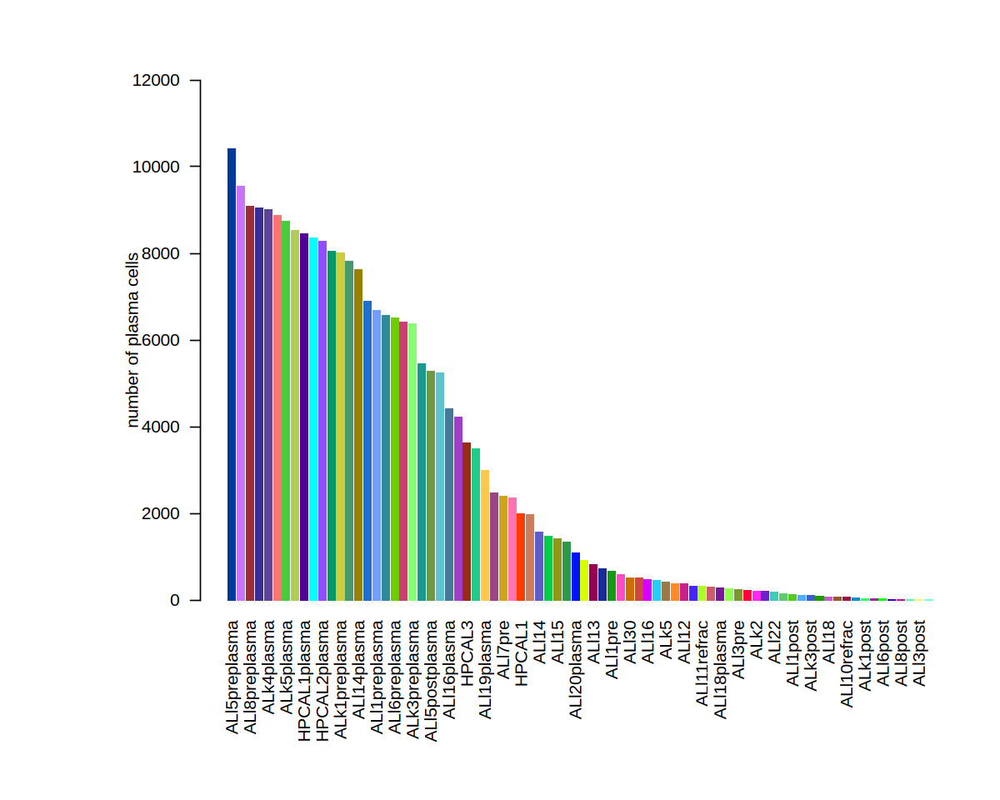

In [34]:
# Plotting the barplot
par(mar = c(10, 10, 4, 2))  # Adjust margins
options(repr.plot.height=8,repr.plot.width=10)
barplot(
  plasmacellnumber$Freq,
  names.arg = plasmacellnumber$Var1,
  col = plasmacellnumber$Color,
  ylab = "number of plasma cells",
  las = 2 ,
  border = NA,
ylim=range(pretty(c(0, plasmacellnumber$Freq))))

In [35]:
pdf("figures2a.pdf", width = 10, height = 8)  # inches

par(mar = c(10, 10, 4, 2))  # margins
barplot(
  plasmacellnumber$Freq,
  names.arg = plasmacellnumber$Var1,
  col = plasmacellnumber$Color,
  ylab = "number of plasma cells",
  las = 2,
  border = NA,
  ylim = range(pretty(c(0, plasmacellnumber$Freq)))
)

dev.off()


pdf 
  2

In [36]:
sce1_plasma@meta.data$"seurat_clusters"<-paste('cluster',sce1_plasma@meta.data$"seurat_clusters",sep='')

In [37]:
label<-sce1_plasma@meta.data
label$barcode<-rownames(label)
label<-label[,c('barcode','subtype')]
label$clonotype <- 'PlasmaCells'
write.csv(label,file='PC.noverlabel.csv')

Match scBCR-seq library with scRNA-seq library

## 10. Load input data


In [38]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl9postplasma")
oneplasma

An object of class Seurat 
36601 features across 508 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [39]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/lcwc3-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/lcwc3-5/outs/consensus_annotations.csv")

See the cell barcode overlap between the two libraries

Loading required package: grid

Loading required package: futile.logger



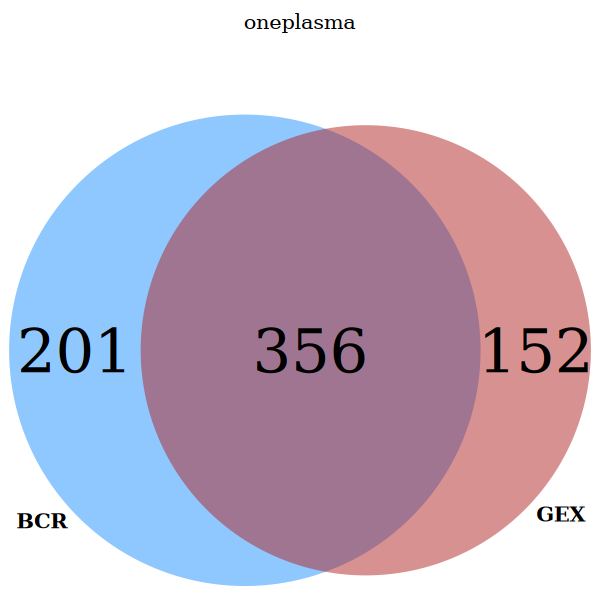

In [40]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl9postplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 11. Clonotype assignment and repertoire analysis


In [41]:
unlabeled1<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

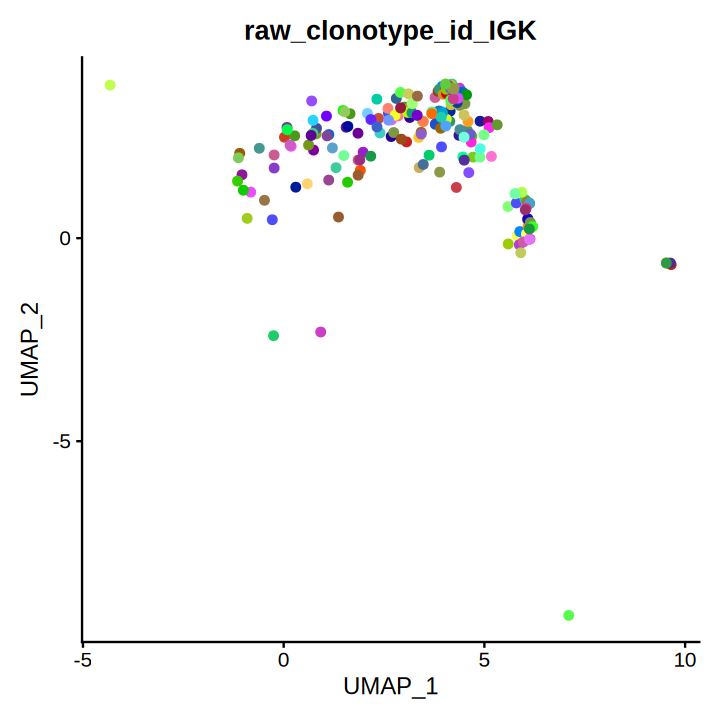

In [42]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

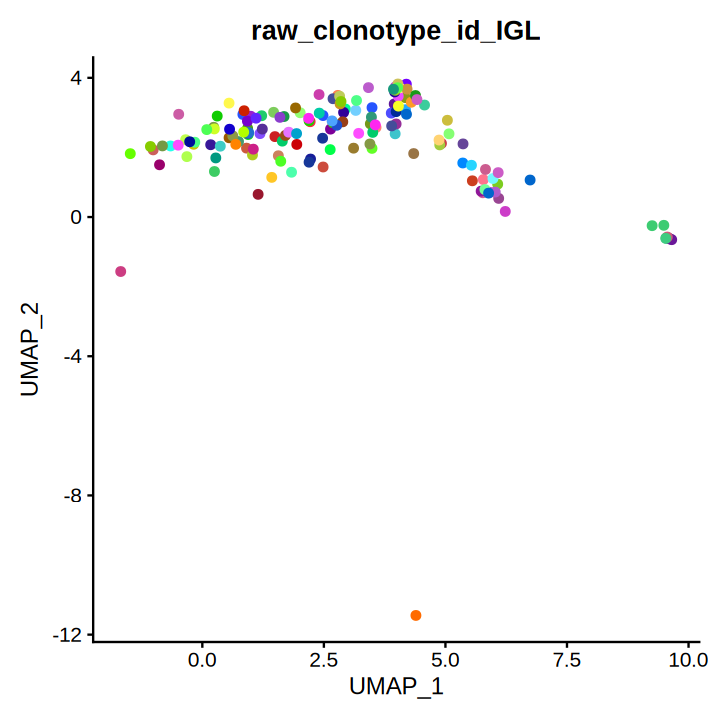

In [43]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [44]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]


Attaching package: ‘tidyr’


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack


The following object is masked from ‘package:S4Vectors’:

    expand




Find the predominant clone

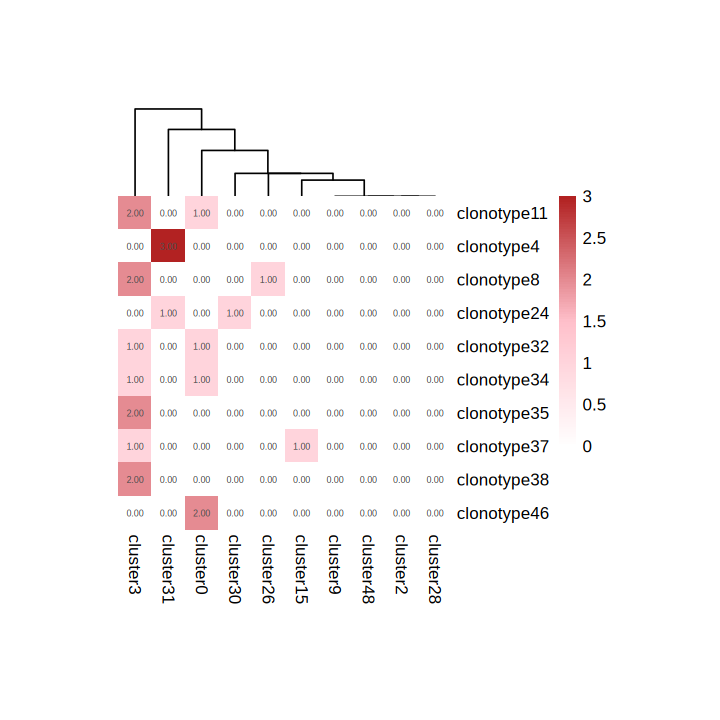

In [45]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
#meta1

## 12. Clonotype assignment and repertoire analysis


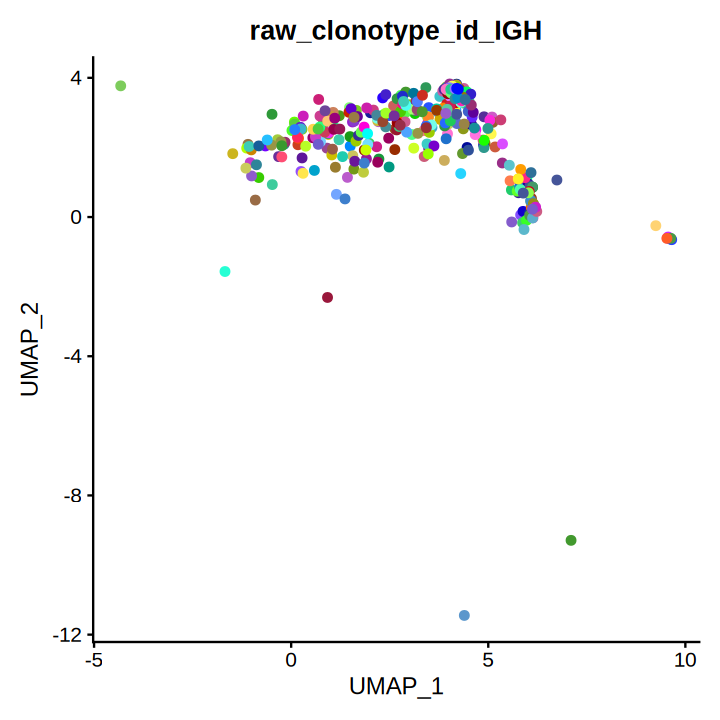

In [46]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [47]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk2plasma")
oneplasma

An object of class Seurat 
36601 features across 6559 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [48]:
oneplasmafiltered <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LFM-5-b/LFM-5-b/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LFM-5-b/LFM-5-b/outs/consensus_annotations.csv")

## 13. Clonotype assignment and repertoire analysis


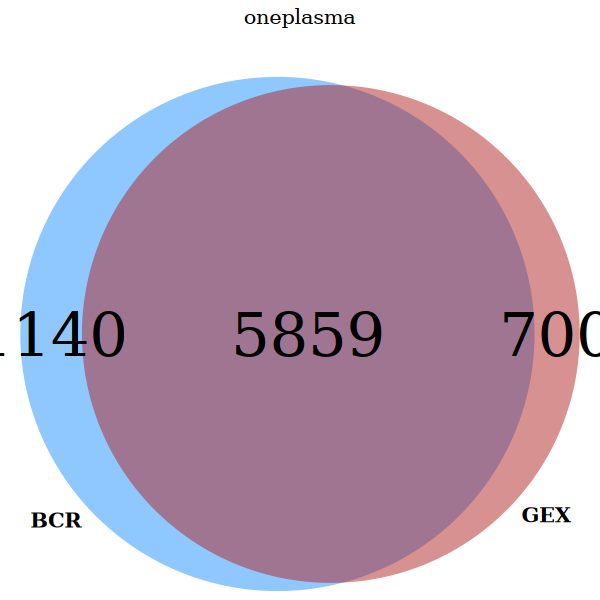

In [49]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk2plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [50]:
unlabeled2<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

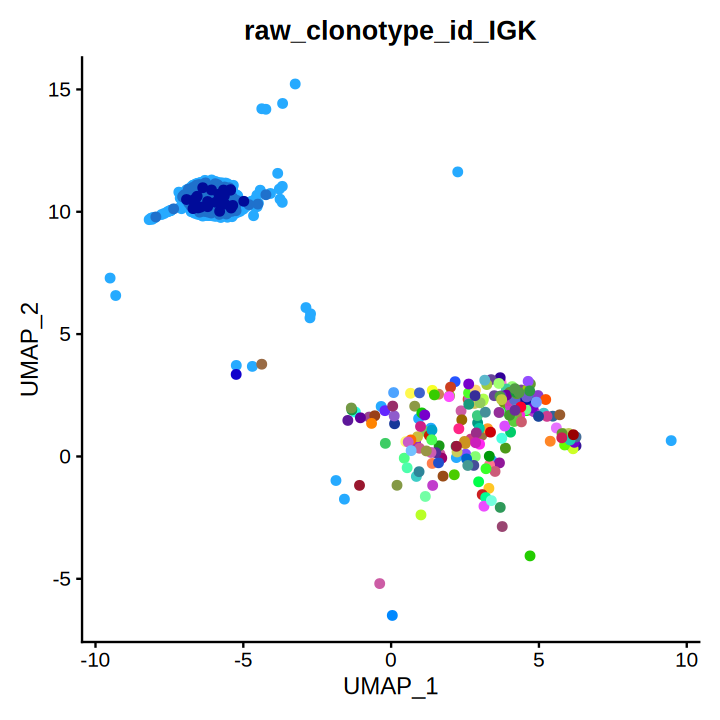

In [51]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [52]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

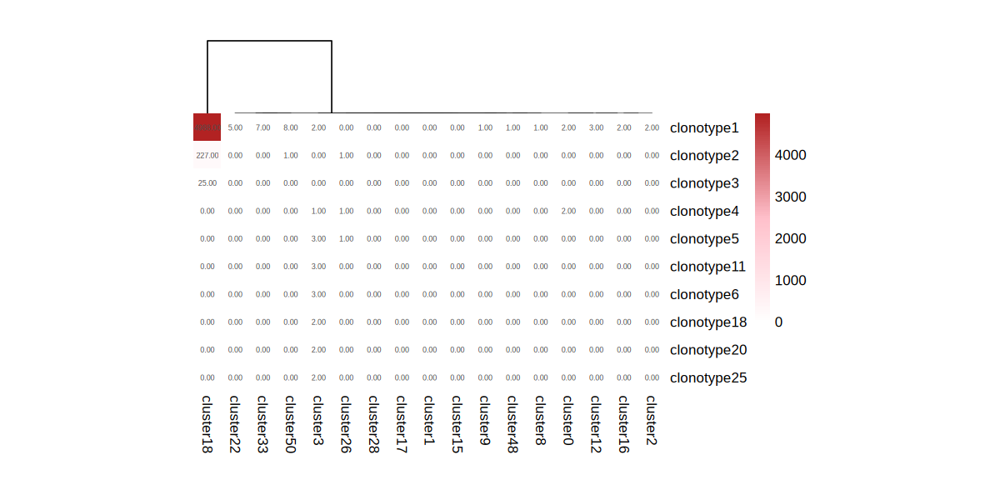

In [53]:
options(repr.plot.height=5,repr.plot.width=10)
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta2<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1','clonotype2')),]
meta2$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 14. Clonotype assignment and repertoire analysis


In [54]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta2$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk2_IGKV1D-43_1',meta2$'raw_clonotype_id_IGK')
meta2$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk2_IGKV1D-43_2',meta2$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,738,IGH,IGHV4-30-4,,IGHJ1,IGHG1,true,true,⋯,300,357,357,372,372,486,486,525,525,556
2,clonotype1,clonotype1_consensus2,613,IGK,IGKV1D-43,,IGKJ4,IGKC,true,true,⋯,257,302,302,323,323,416,416,449,449,477
3,clonotype2,clonotype2_consensus1,613,IGK,IGKV1D-43,,IGKJ4,IGKC,true,true,⋯,257,302,302,323,323,416,416,449,449,477


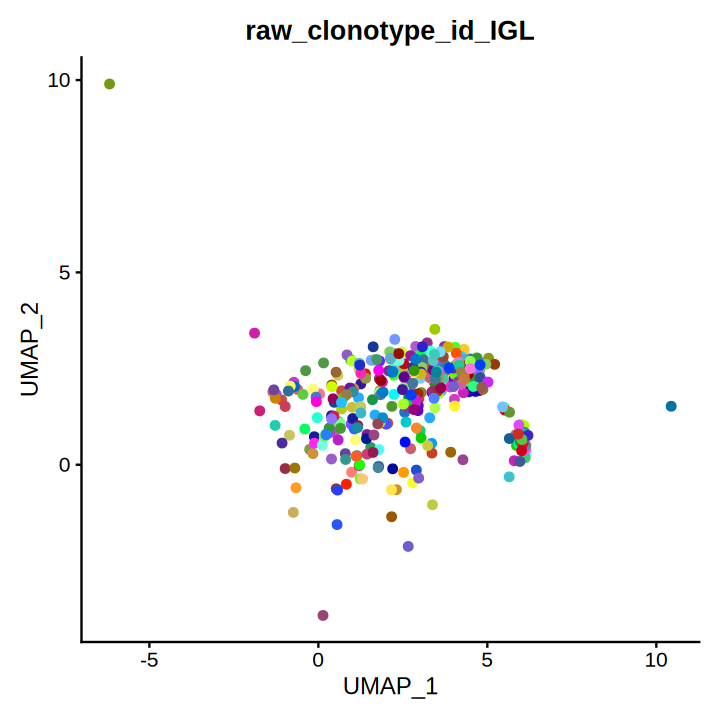

In [55]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

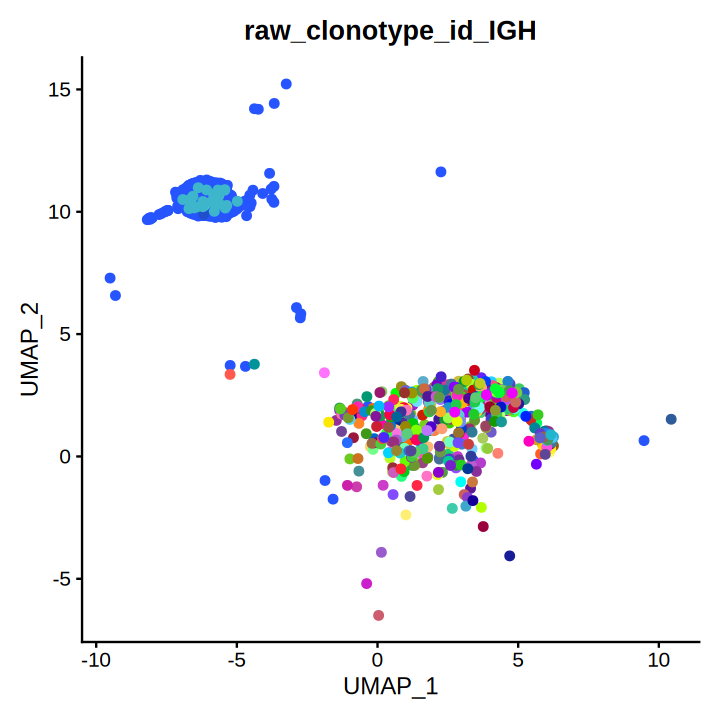

In [56]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 15. Clonotype assignment and repertoire analysis


In [57]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk3preplasma")
oneplasma

An object of class Seurat 
36601 features across 6380 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [58]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/YCS-5/YCS-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/YCS-5/YCS-5/outs/consensus_annotations.csv")

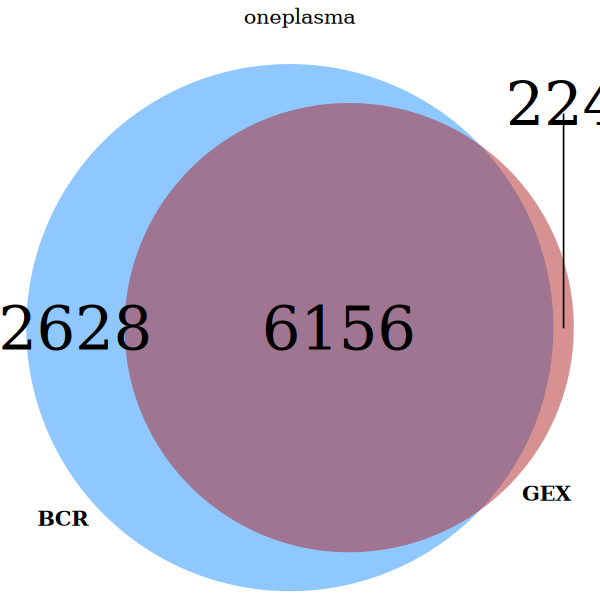

In [59]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk3preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [60]:
unlabeled3<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

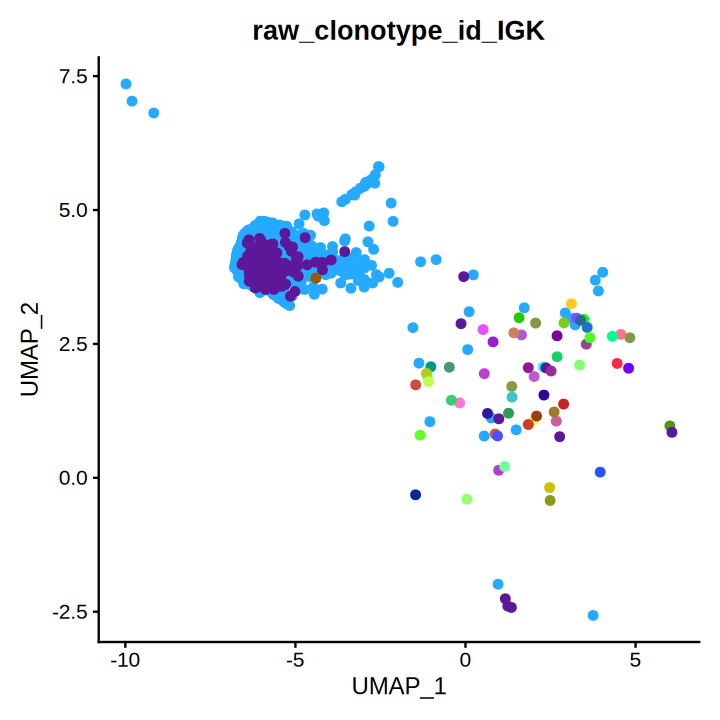

In [61]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 16. Clonotype assignment and repertoire analysis


In [62]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

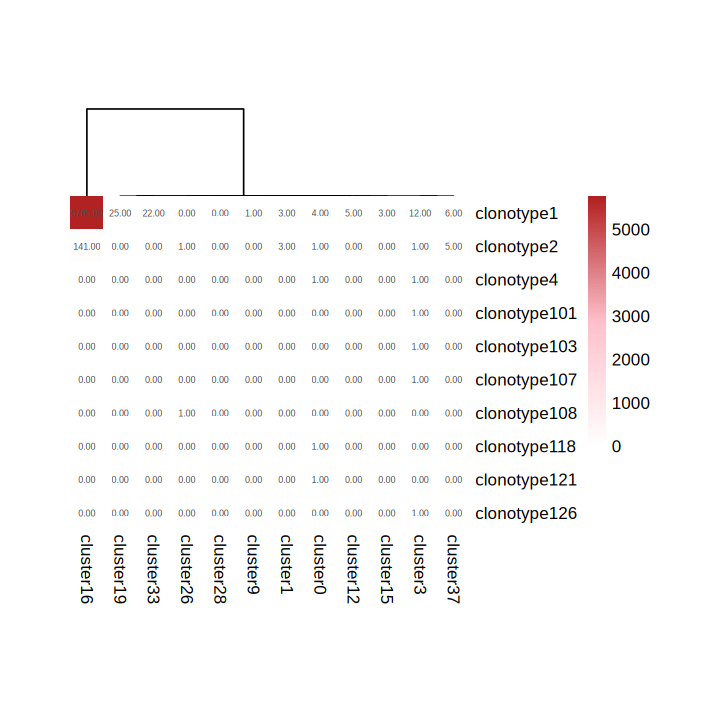

In [63]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta3<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1','clonotype2')),]
meta3$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [64]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta3$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk3_IGKV1-33_1',meta3$'raw_clonotype_id_IGK')
meta3$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk3_IGKV1-33_2',meta3$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,674,IGH,IGHV1-18,,IGHJ4,IGHG1,true,true,⋯,212,269,269,287,287,401,401,461,461,492
2,clonotype1,clonotype1_consensus2,691,IGH,IGHV3-7,,IGHJ5,IGHG1,true,true,⋯,232,289,289,307,307,421,421,478,478,509
3,clonotype1,clonotype1_consensus3,555,IGK,IGKV1-33,,IGKJ3,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419
4,clonotype1,clonotype1_consensus4,552,IGK,IGKV1-33,,IGKJ3,IGKC,true,true,⋯,199,244,244,265,265,358,358,388,388,416
5,clonotype2,clonotype2_consensus1,555,IGK,IGKV1-33,,IGKJ3,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419


## 17. Clonotype assignment and repertoire analysis


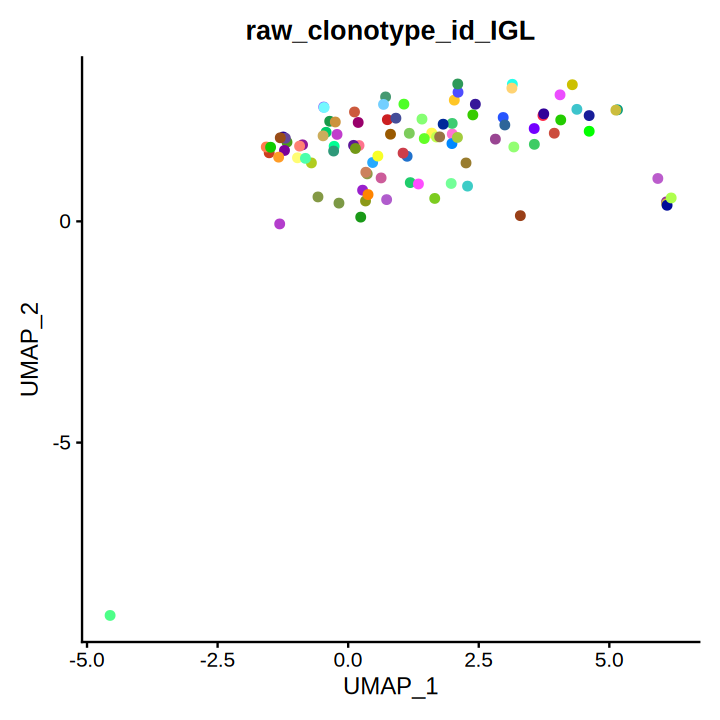

In [65]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

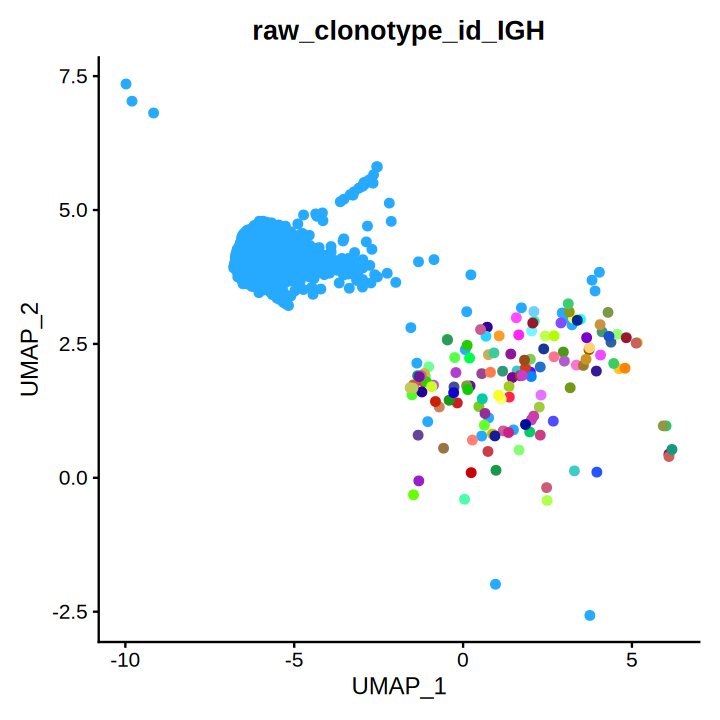

In [66]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [67]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk4plasma")
oneplasma

An object of class Seurat 
36601 features across 9013 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [68]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/ZHZ-5/ZHZ-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/ZHZ-5/ZHZ-5/outs/consensus_annotations.csv")

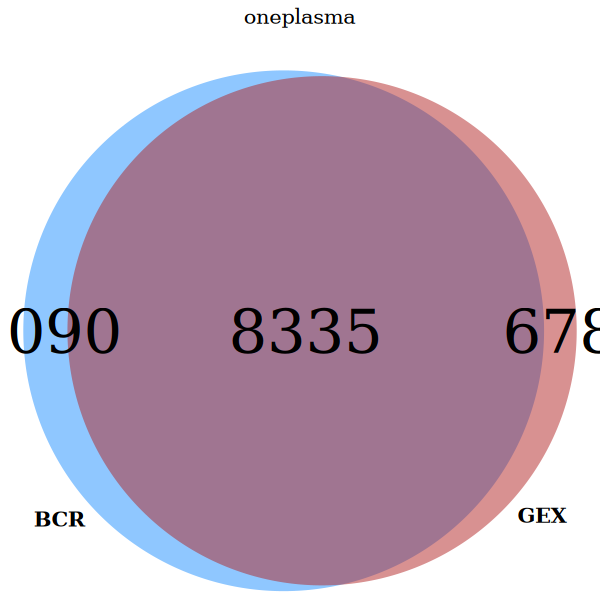

In [69]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk4plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 18. Clonotype assignment and repertoire analysis


In [70]:
unlabeled4<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

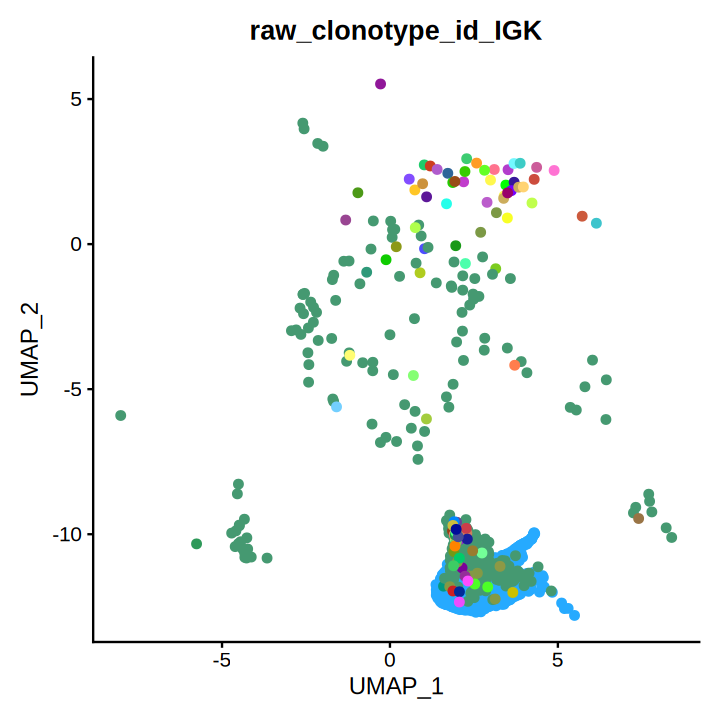

In [71]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [72]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 19. Clonotype assignment and repertoire analysis


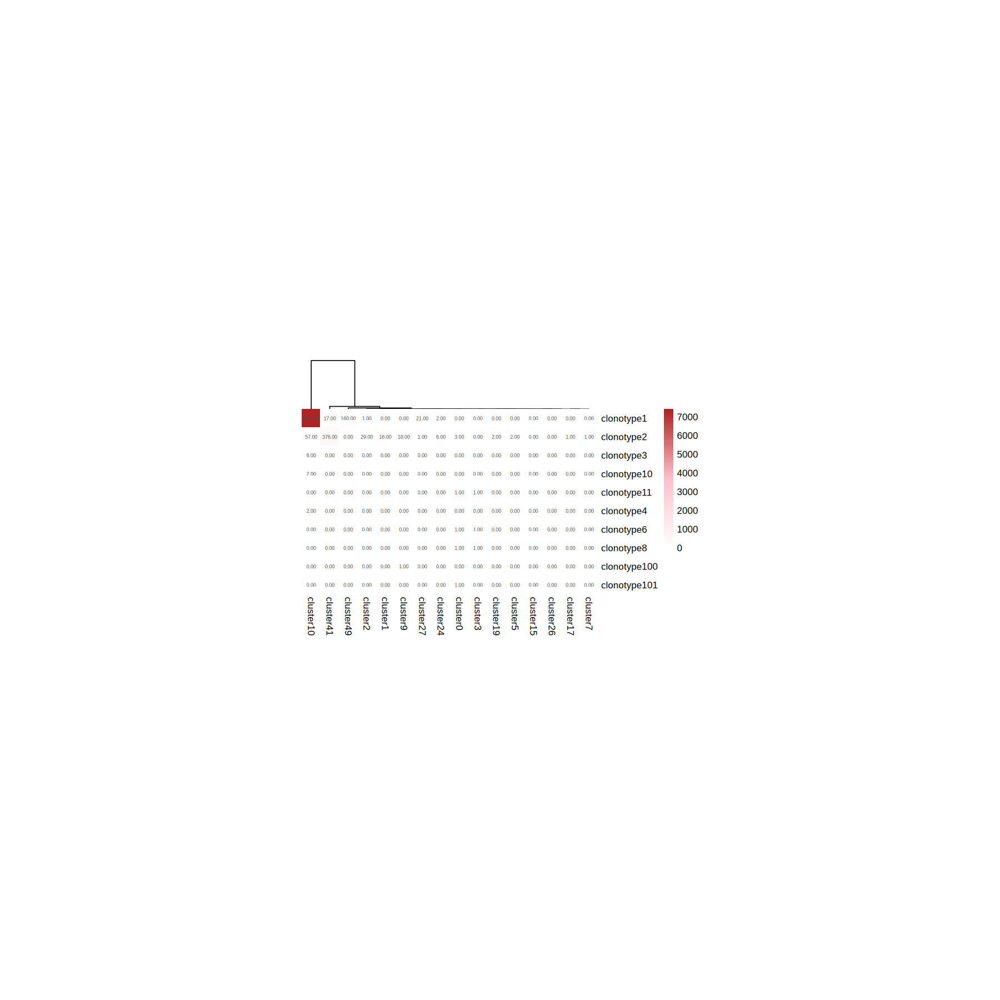

In [73]:
options(repr.plot.height=15,repr.plot.width=15)
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta4<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1','clonotype2')),]
meta4$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [74]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta4$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk4_IGKV1-8_1',meta4$'raw_clonotype_id_IGK')
meta4$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk4_IGKV1-8_2',meta4$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,551,IGK,IGKV1-8,,IGKJ1,IGKC,true,true,⋯,195,240,240,261,261,354,354,387,387,415
2,clonotype2,clonotype2_consensus1,682,IGH,IGHV3-11,IGHD3-22,IGHJ4,IGHA1,true,true,⋯,233,290,290,308,308,422,422,491,491,522
3,clonotype2,clonotype2_consensus2,551,IGK,IGKV1-8,,IGKJ1,IGKC,true,true,⋯,195,240,240,261,261,354,354,387,387,415


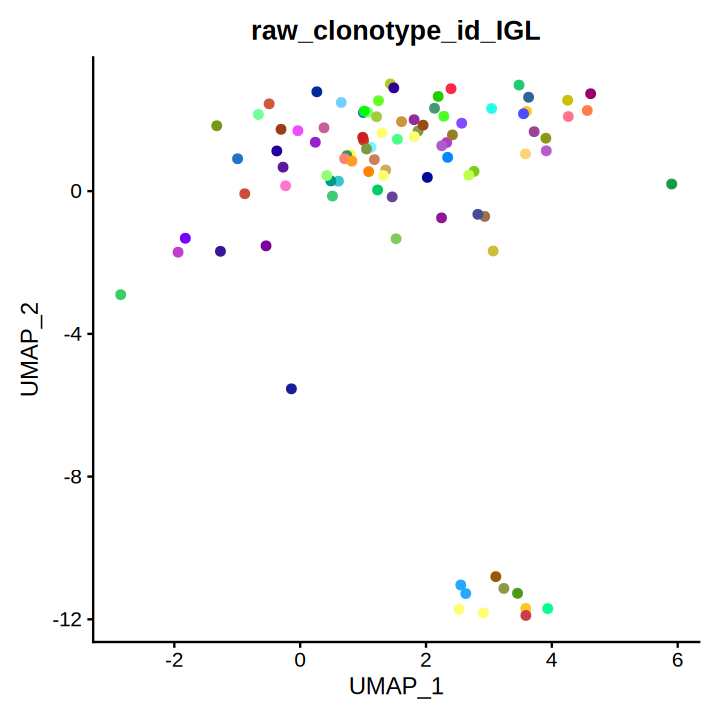

In [75]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

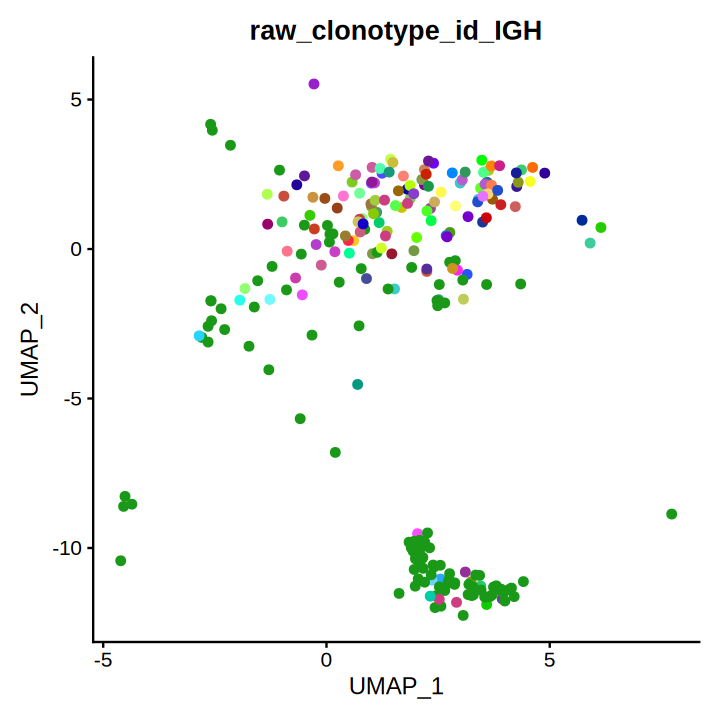

In [76]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [77]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk5plasma")
oneplasma

An object of class Seurat 
36601 features across 8737 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 20. Load input data


In [78]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/CZX-5/CZX-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/CZX-5/CZX-5/outs/consensus_annotations.csv")

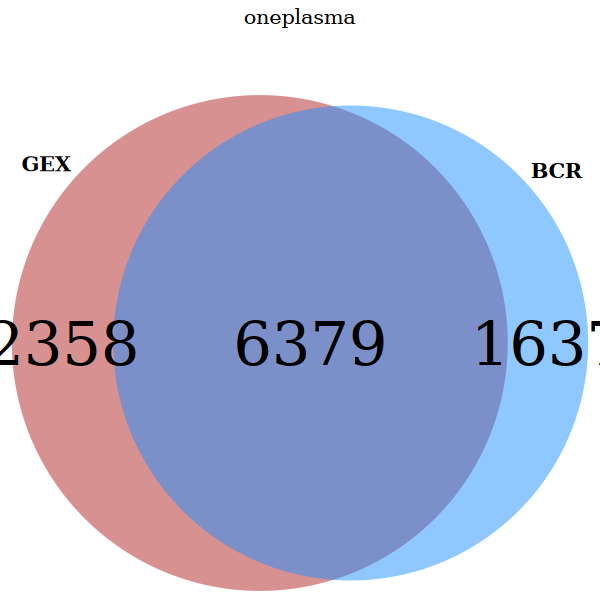

In [79]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk5plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [80]:
unlabeled5<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 21. Clonotype assignment and repertoire analysis


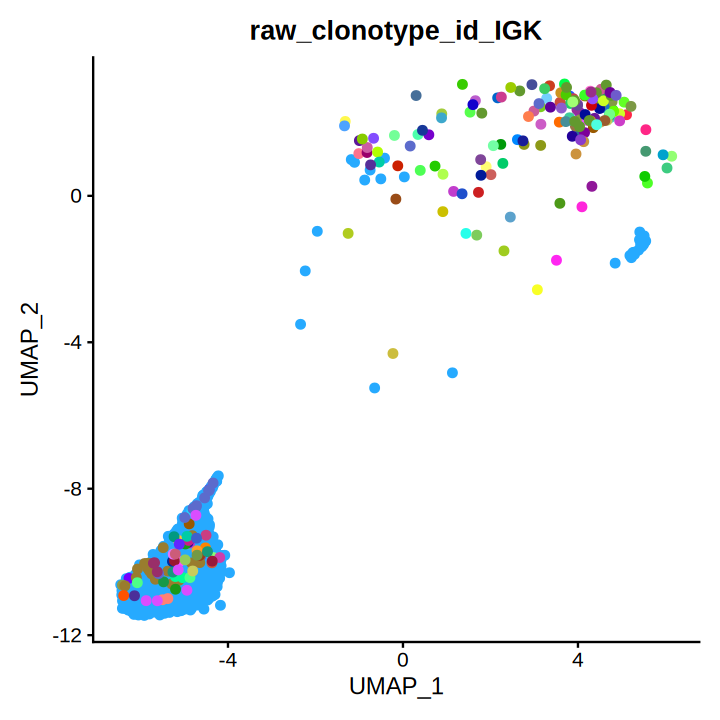

In [81]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [82]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

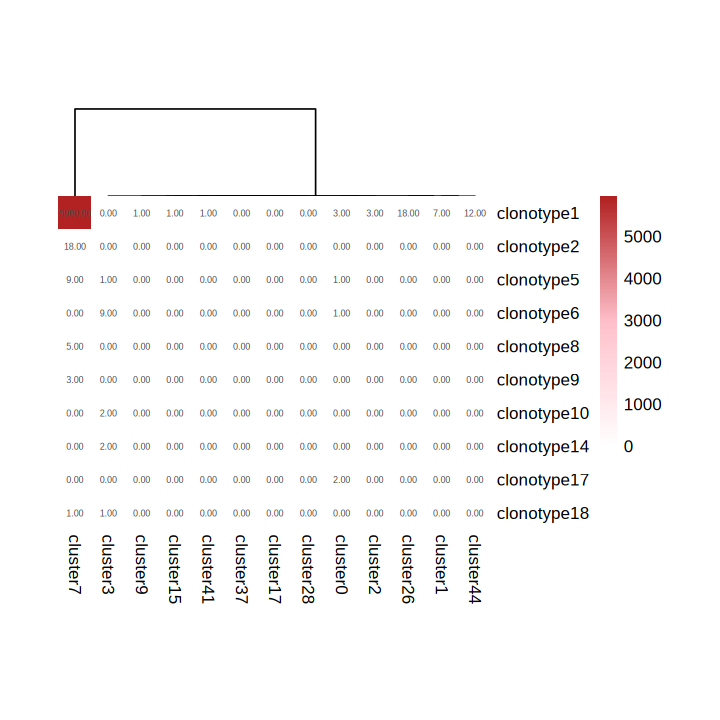

In [83]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta5<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1','clonotype2')),]
meta5$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [84]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta5$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk5_IGKV4-1',meta5$'raw_clonotype_id_IGK')
meta5$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk5_IGKV4-1',meta5$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,566,IGK,IGKV4-1,,IGKJ1,IGKC,true,true,⋯,210,255,255,276,276,369,369,402,402,430
2,clonotype2,clonotype2_consensus1,661,IGH,IGHV4-59,IGHD3-10,IGHJ4,IGHA2,true,true,⋯,221,278,278,293,293,407,407,470,470,501
3,clonotype2,clonotype2_consensus2,569,IGK,IGKV4-1,,IGKJ3,IGKC,true,true,⋯,210,255,255,276,276,369,369,405,405,433
4,clonotype2,clonotype2_consensus3,581,IGK,IGKV4-1,,IGKJ1,IGKC,true,true,⋯,225,270,270,291,291,384,384,417,417,445


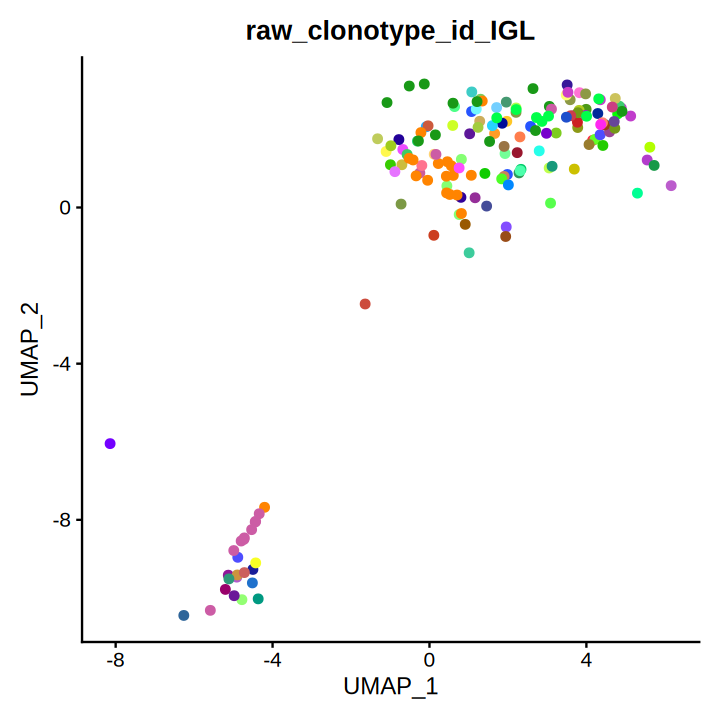

In [85]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 22. Clonotype assignment and repertoire analysis


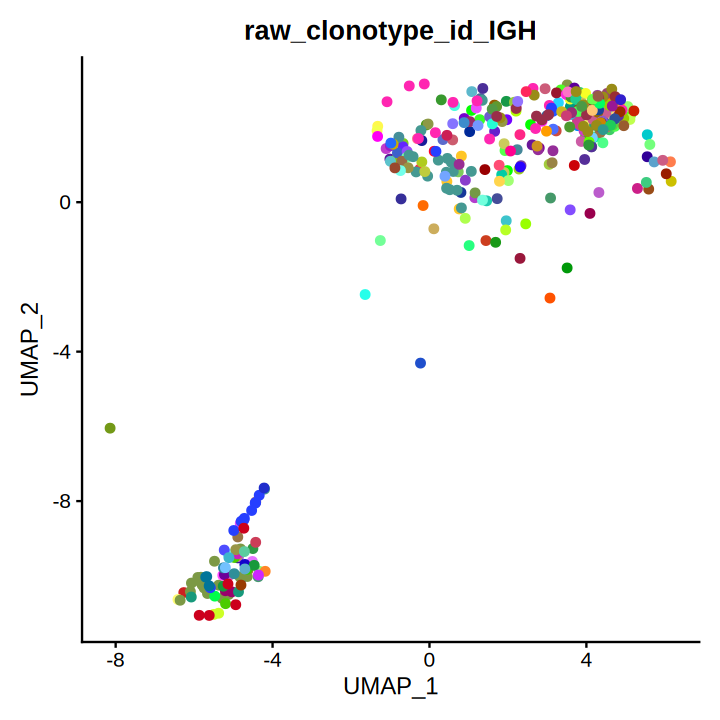

In [86]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [87]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk6plasma")
oneplasma

An object of class Seurat 
36601 features across 6414 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [88]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/zlj-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/zlj-5/outs/consensus_annotations.csv")

## 23. Clonotype assignment and repertoire analysis


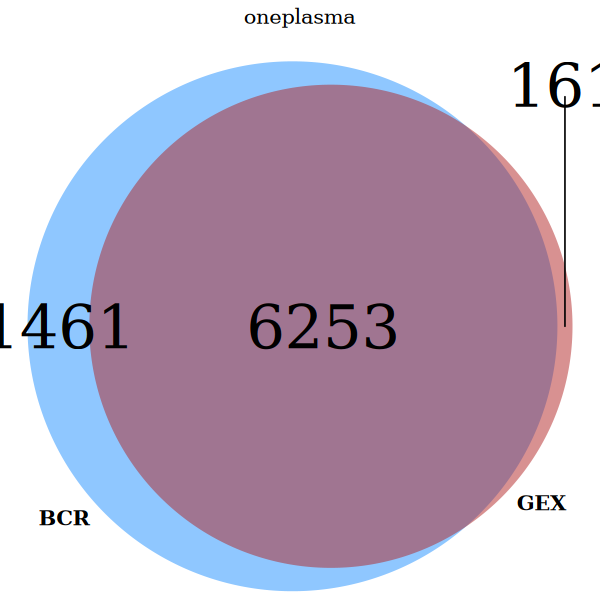

In [89]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk6plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [90]:
unlabeled6<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

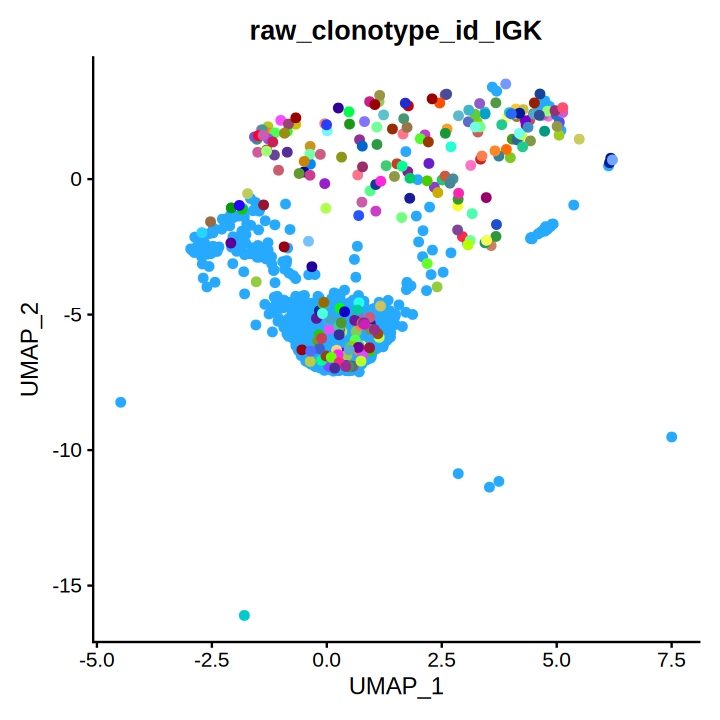

In [91]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [92]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

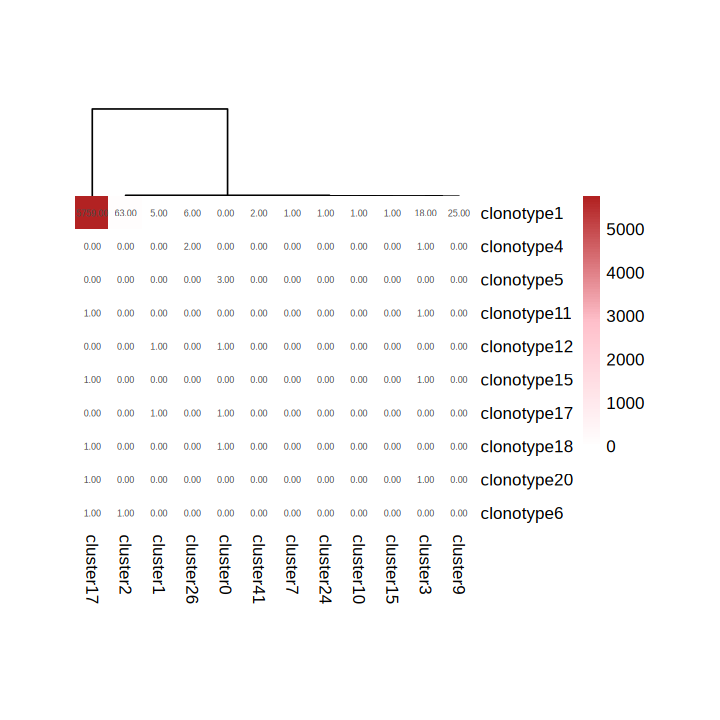

In [93]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta6<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1')),]
meta6$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 24. Clonotype assignment and repertoire analysis


In [94]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta6$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk6_IGKV1-33',meta6$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,555,IGK,IGKV1-33,,IGKJ2,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419


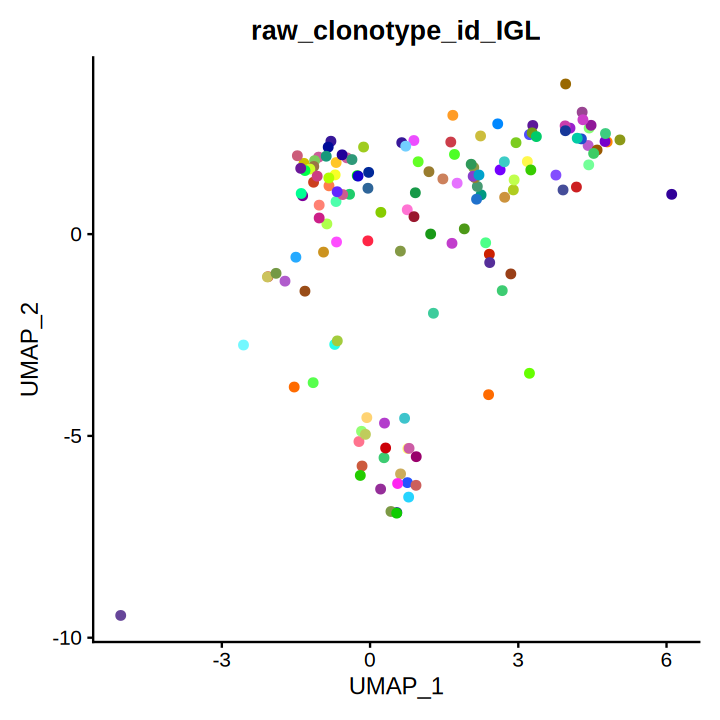

In [95]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

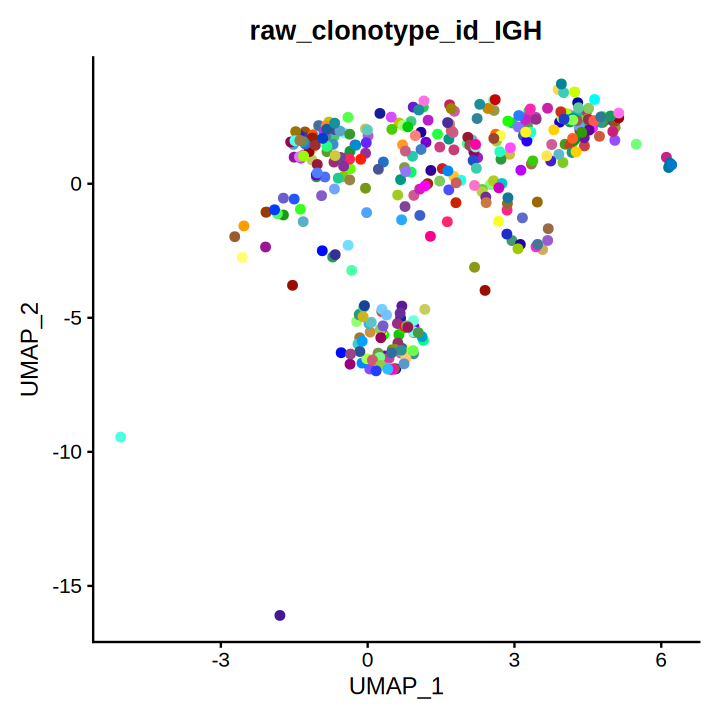

In [96]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 25. Clonotype assignment and repertoire analysis


In [97]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl7preplasma")
oneplasma

An object of class Seurat 
36601 features across 3481 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [98]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/Hyl-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/Hyl-5/outs/consensus_annotations.csv")

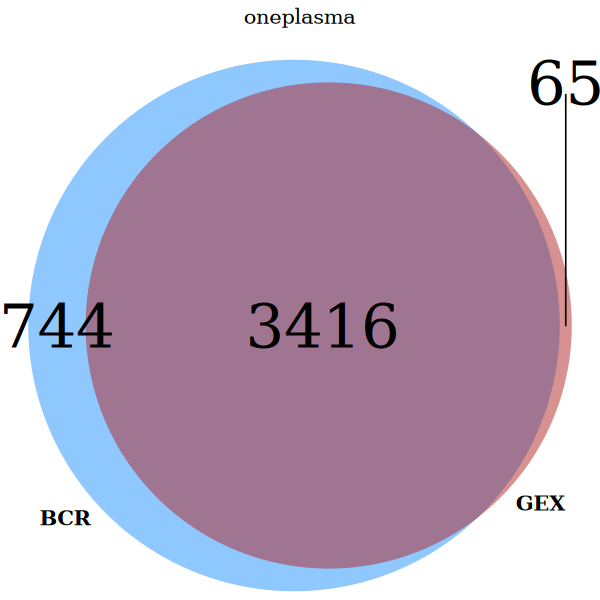

In [99]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl7preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [100]:
unlabeled7<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

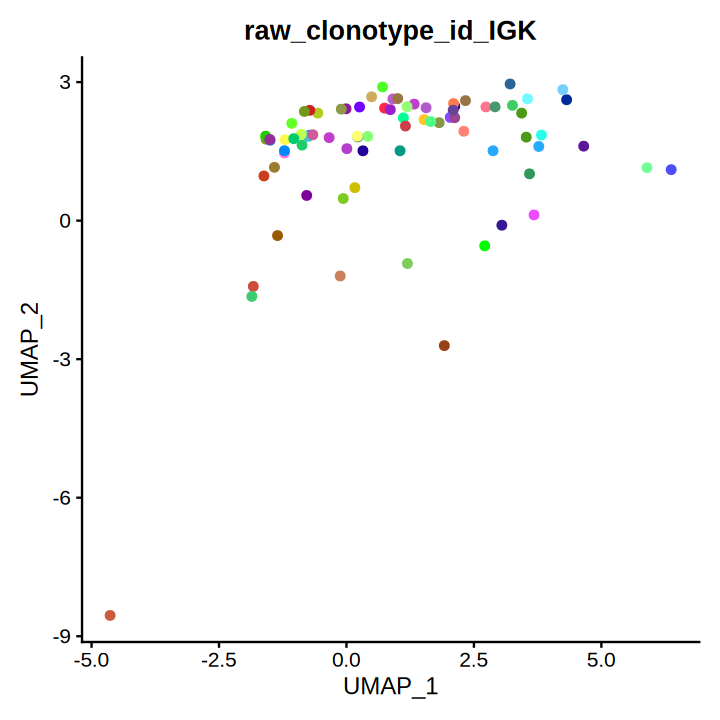

In [101]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 26. Clonotype assignment and repertoire analysis


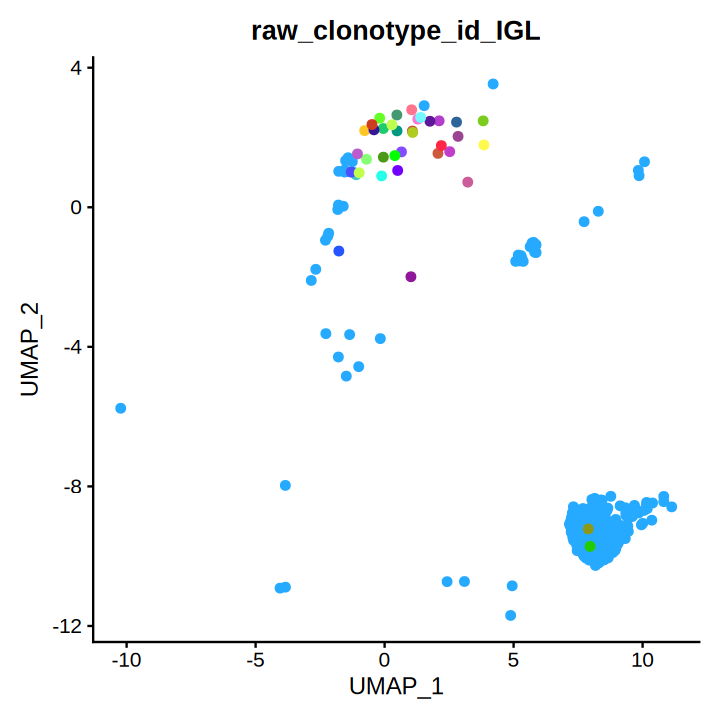

In [102]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [103]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

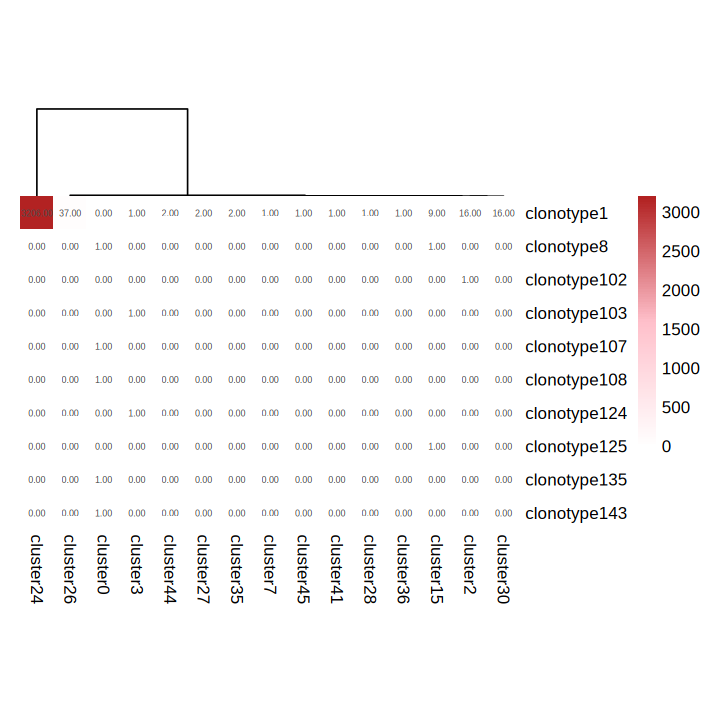

In [104]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta7<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta7$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 27. Clonotype assignment and repertoire analysis


In [105]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta7$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl7_IGLV2-14',meta7$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,596,IGH,IGHV1-3,,IGHJ4,IGHE,true,true,⋯,195,252,252,270,270,384,384,432,432,463
2,clonotype1,clonotype1_consensus2,703,IGL,IGLV2-14,,IGLJ3,IGLC2,true,true,⋯,269,314,314,335,335,428,428,464,464,492


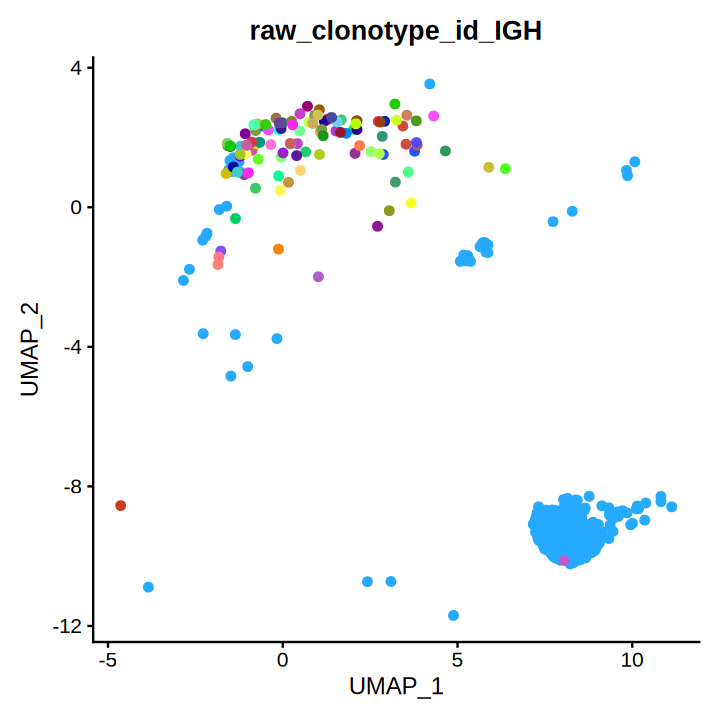

In [106]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [107]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl1preplasma")
oneplasma

An object of class Seurat 
36601 features across 6689 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [108]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/zyz-5v2/zyz-5v2/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/zyz-5v2/zyz-5v2/outs/consensus_annotations.csv")

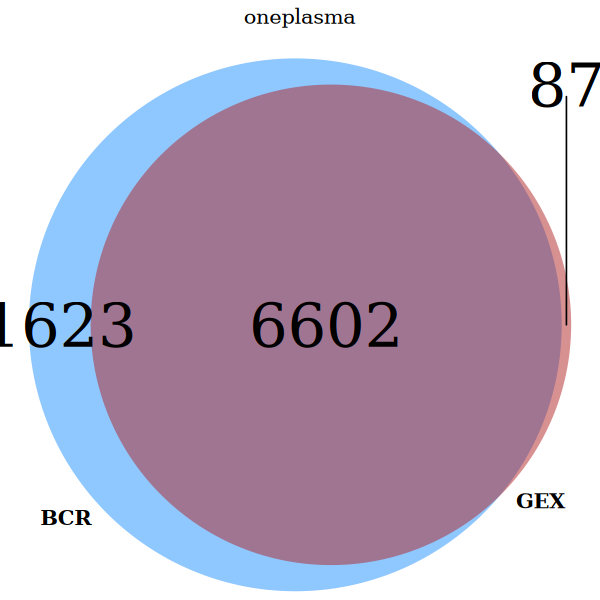

In [109]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl1preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 28. Clonotype assignment and repertoire analysis


In [110]:
unlabeled8<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

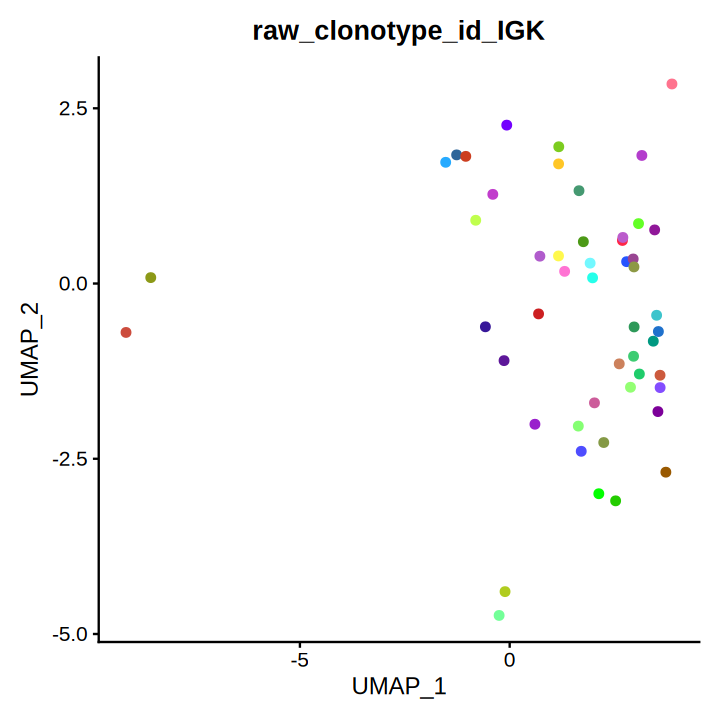

In [111]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

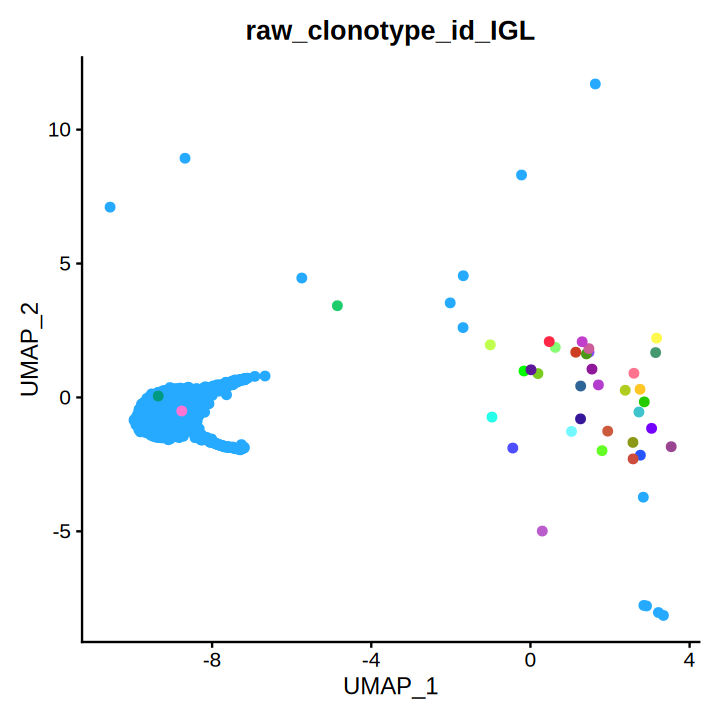

In [112]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 29. Clonotype assignment and repertoire analysis


In [113]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

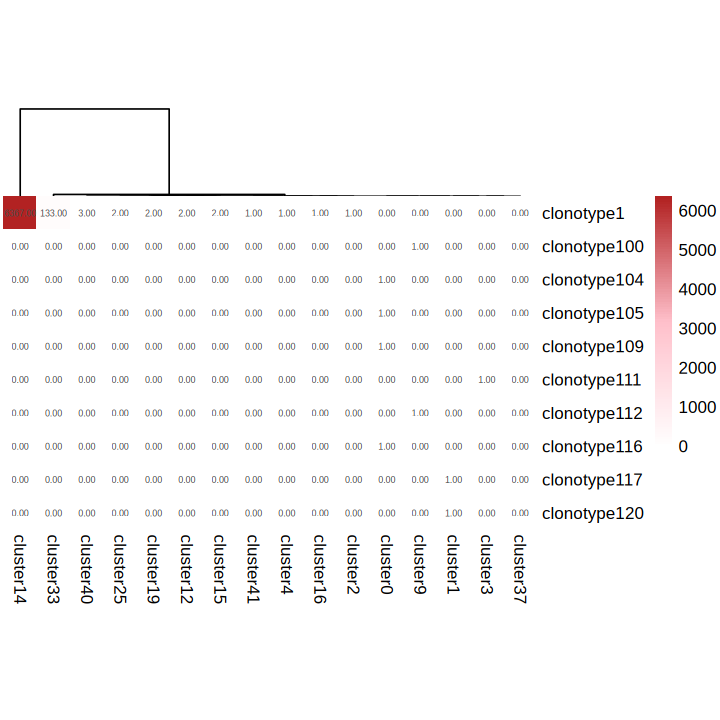

In [114]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta8<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta8$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [115]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta8$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl1_IGLV3-21',meta8$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,676,IGH,IGHV3-49,,IGHJ4,IGHA1,true,true,⋯,233,290,290,314,314,428,428,485,485,516
2,clonotype1,clonotype1_consensus2,633,IGL,IGLV3-21,,IGLJ3,IGLC2,true,true,⋯,196,241,241,262,262,355,355,394,394,422


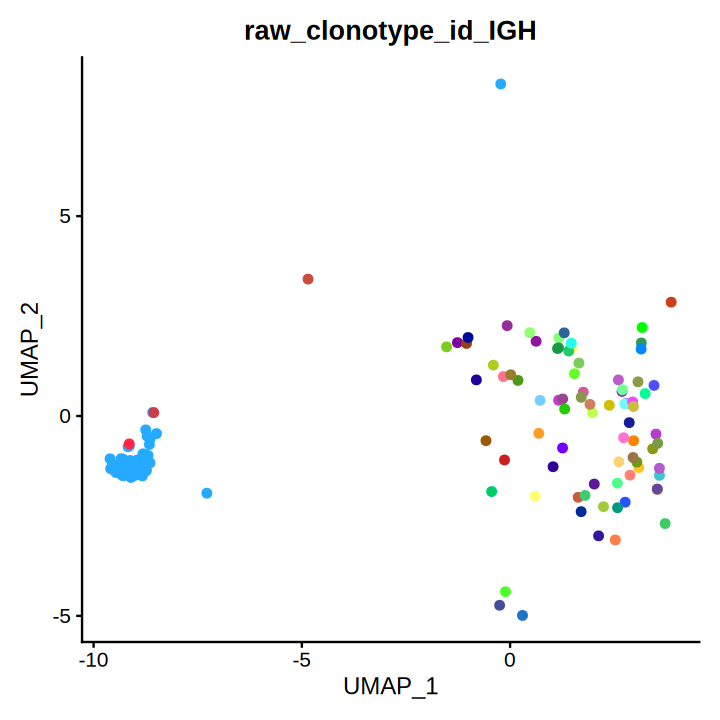

In [116]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [117]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl2preplasma")
oneplasma

An object of class Seurat 
36601 features across 1977 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 30. Load input data


In [118]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/zq-5v2/zq-5v2/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/zq-5v2/zq-5v2/outs/consensus_annotations.csv")

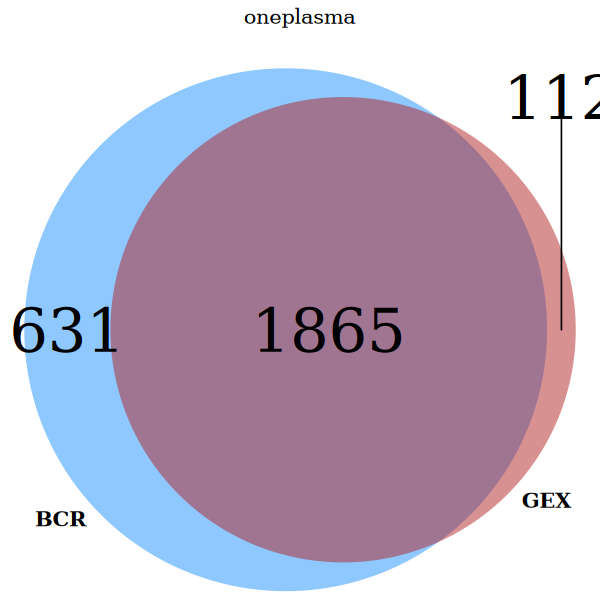

In [119]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl2preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [120]:
unlabeled9<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 31. Clonotype assignment and repertoire analysis


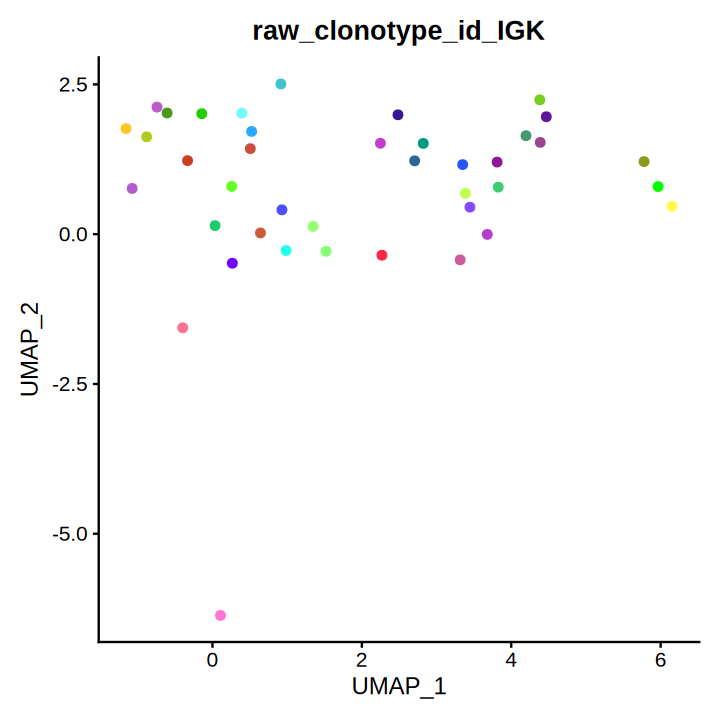

In [121]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

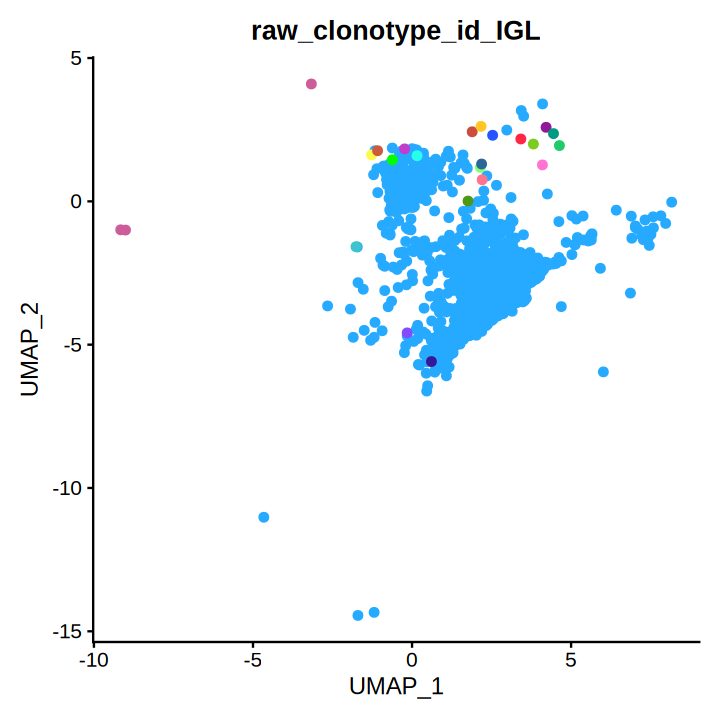

In [122]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [123]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

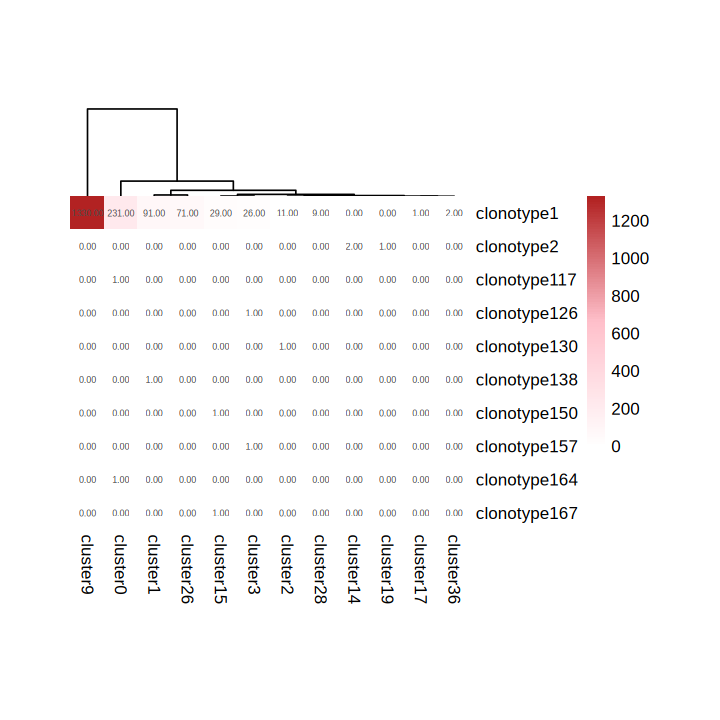

In [124]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta9<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta9$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [125]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta9$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl2_IGLV2-14',meta9$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,682,IGH,IGHV3-33,,IGHJ4,IGHG1,true,true,⋯,220,277,277,295,295,409,409,469,469,500
2,clonotype1,clonotype1_consensus2,703,IGL,IGLV2-14,,IGLJ1,IGLC1,true,true,⋯,269,314,314,335,335,428,428,464,464,492


## 32. Clonotype assignment and repertoire analysis


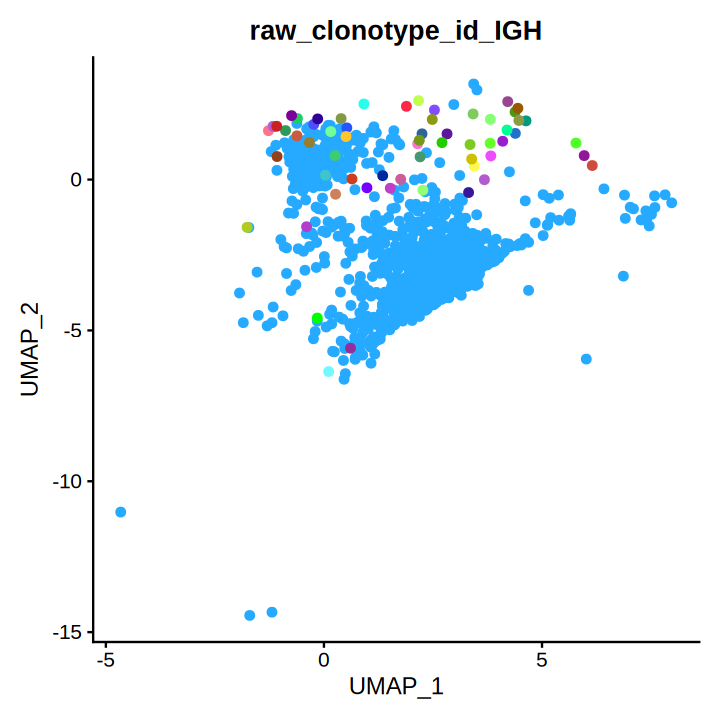

In [126]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [127]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl3preplasma")
oneplasma

An object of class Seurat 
36601 features across 8882 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [128]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/Xlg-5/Xlg-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/Xlg-5/Xlg-5/outs/consensus_annotations.csv")

## 33. Clonotype assignment and repertoire analysis


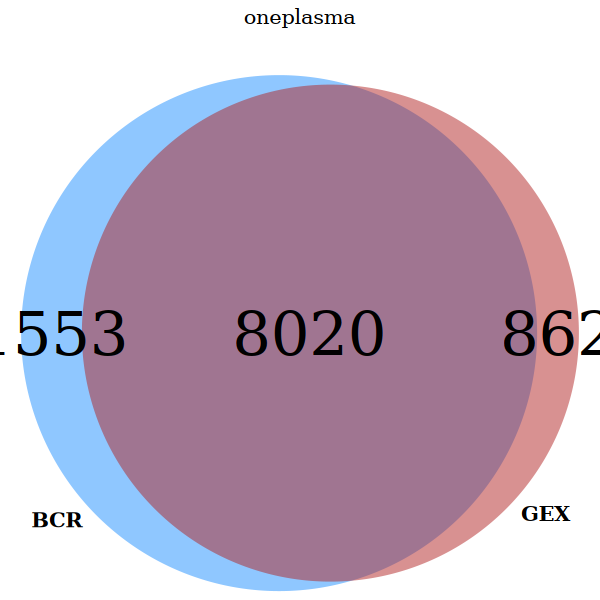

In [129]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl3preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [130]:
unlabeled10<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

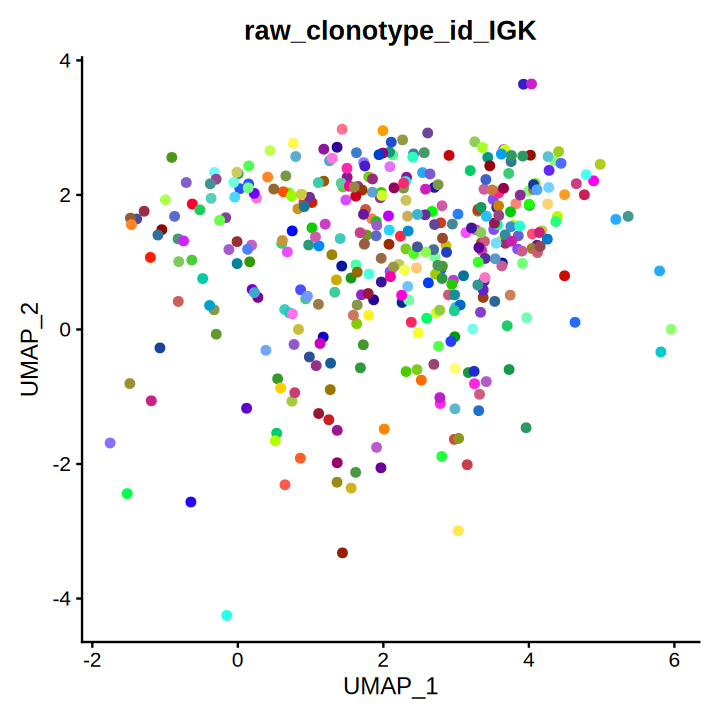

In [131]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

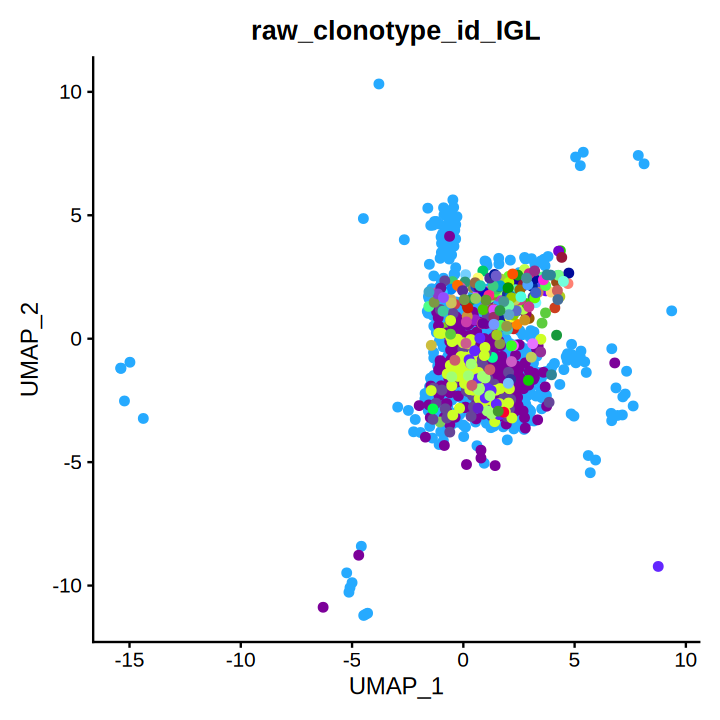

In [132]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [133]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 34. Clonotype assignment and repertoire analysis


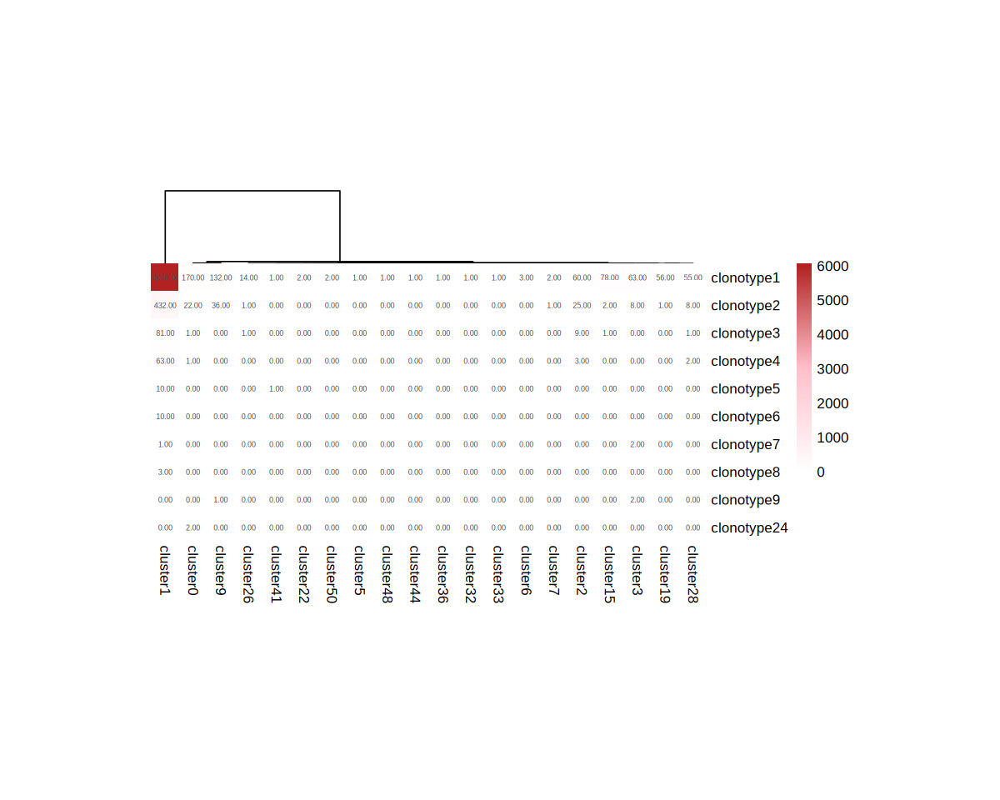

In [134]:
options(repr.plot.height=8,repr.plot.width=10)
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta10<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype2','clonotype3','clonotype4')),]
meta10$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [135]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2','clonotype3','clonotype4')),]
meta10$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl3_IGLV6-57_1',meta10$'raw_clonotype_id_IGL')
meta10$'raw_clonotype_id_IGL'<-gsub('clonotype2','ALl3_IGLV6-57_2',meta10$'raw_clonotype_id_IGL')
meta10$'raw_clonotype_id_IGL'<-gsub('clonotype3','ALl3_IGLV6-57_3',meta10$'raw_clonotype_id_IGL')
meta10$'raw_clonotype_id_IGL'<-gsub('clonotype4','ALl3_IGLV6-57_4',meta10$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,780,IGH,IGHV4-30-4,,IGHJ4,IGHG2,true,true,⋯,339,396,396,411,411,525,525,567,567,598
2,clonotype1,clonotype1_consensus2,685,IGL,IGLV6-57,,IGLJ1,IGLC1,true,true,⋯,248,293,293,314,314,413,413,446,446,474
3,clonotype2,clonotype2_consensus1,740,IGH,IGHV4-61,,IGHJ4,IGHG2,true,true,⋯,299,356,356,371,371,485,485,527,527,558
4,clonotype2,clonotype2_consensus2,685,IGL,IGLV6-57,,IGLJ1,IGLC1,true,true,⋯,248,293,293,314,314,413,413,446,446,474
5,clonotype3,clonotype3_consensus1,685,IGL,IGLV6-57,,IGLJ1,IGLC1,true,true,⋯,248,293,293,314,314,413,413,446,446,474
6,clonotype4,clonotype4_consensus1,685,IGL,IGLV6-57,,IGLJ1,IGLC1,true,true,⋯,248,293,293,314,314,413,413,446,446,474


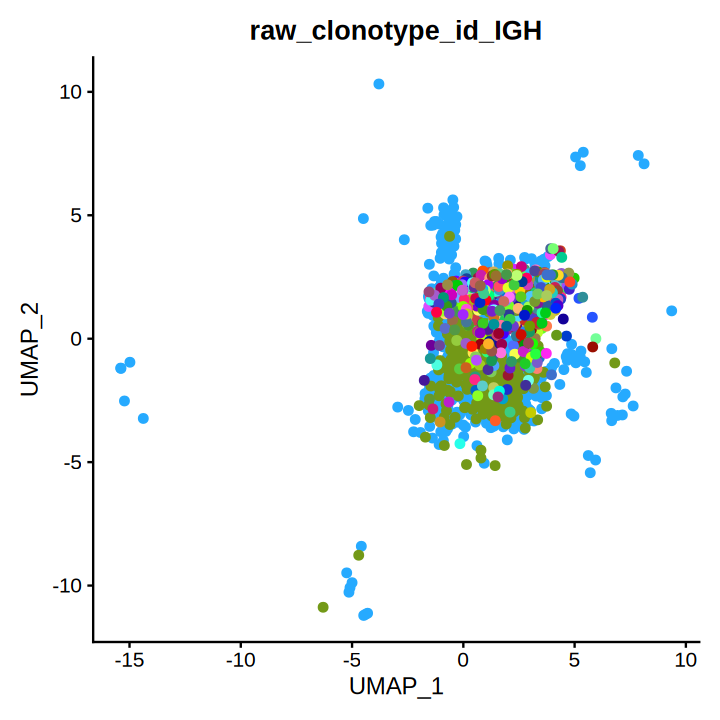

In [136]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredH <- oneplasmafilteredH[oneplasmafilteredH$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 35. Clonotype assignment and repertoire analysis


In [137]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl5postplasma")
oneplasma

An object of class Seurat 
36601 features across 5270 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [138]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/lxs-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/lxs-5/outs/consensus_annotations.csv")

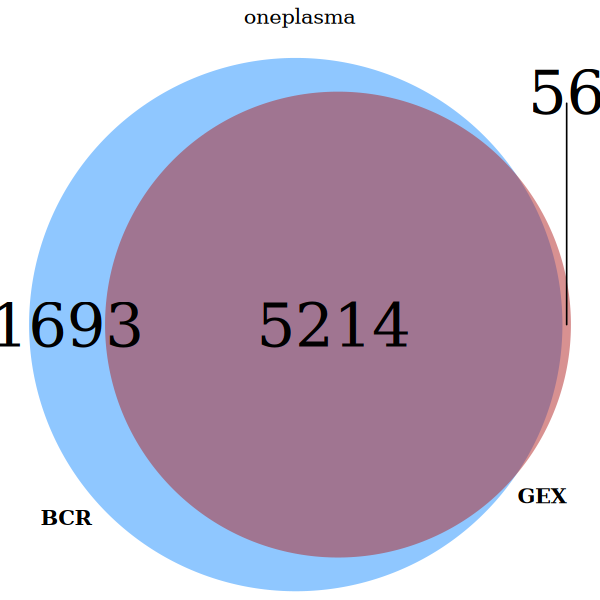

In [139]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl5postplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [140]:
unlabeled11<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

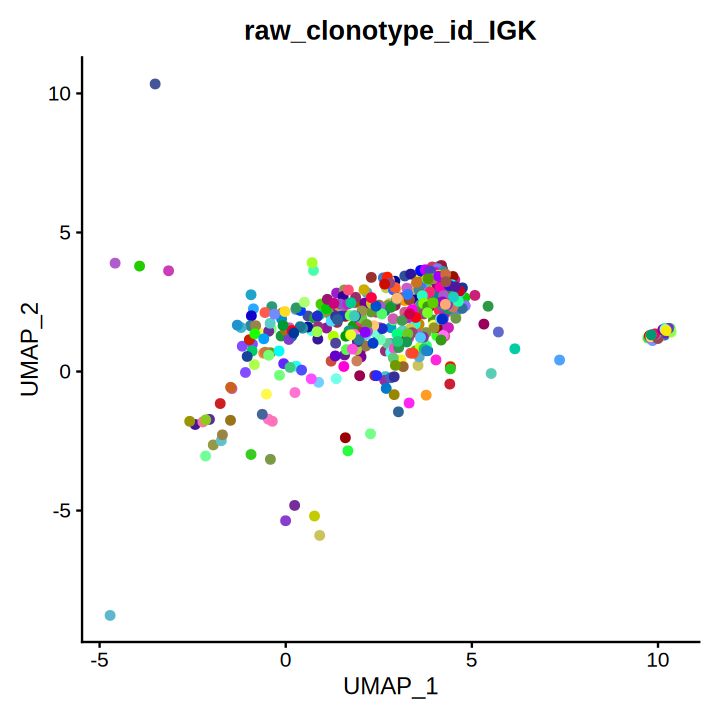

In [141]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 36. Clonotype assignment and repertoire analysis


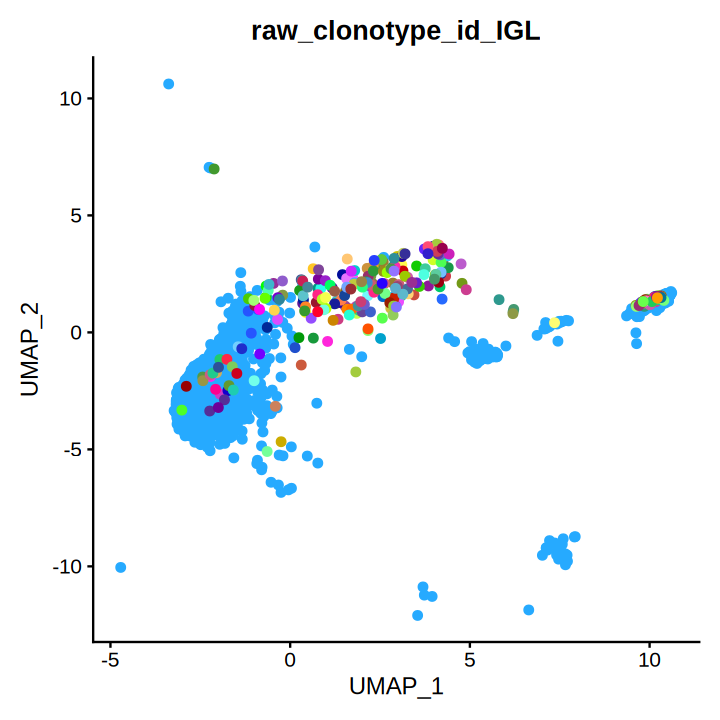

In [142]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [143]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

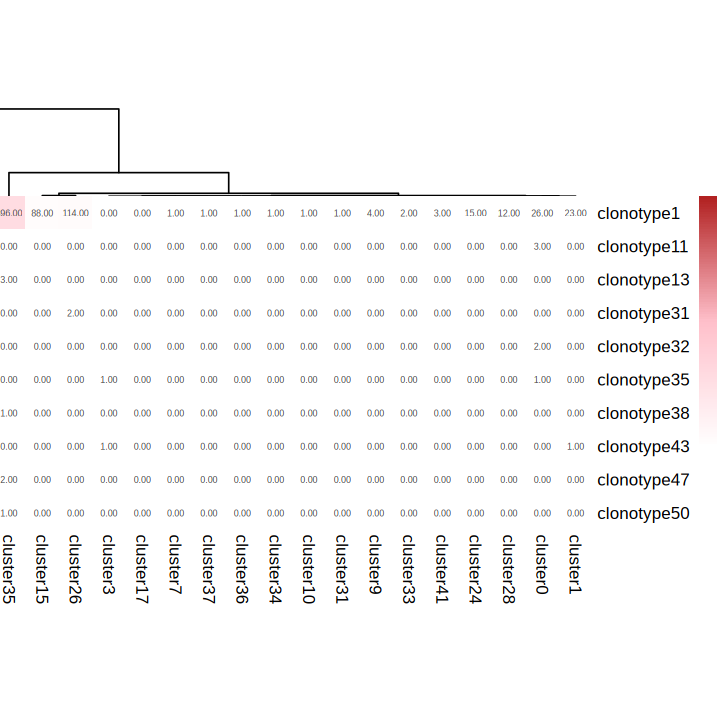

In [144]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta11<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta11$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 37. Clonotype assignment and repertoire analysis


In [145]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta11$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl5_IGLV6-57',meta11$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,685,IGL,IGLV6-57,,IGLJ3,IGLC2,true,true,⋯,248,293,293,314,314,413,413,446,446,474


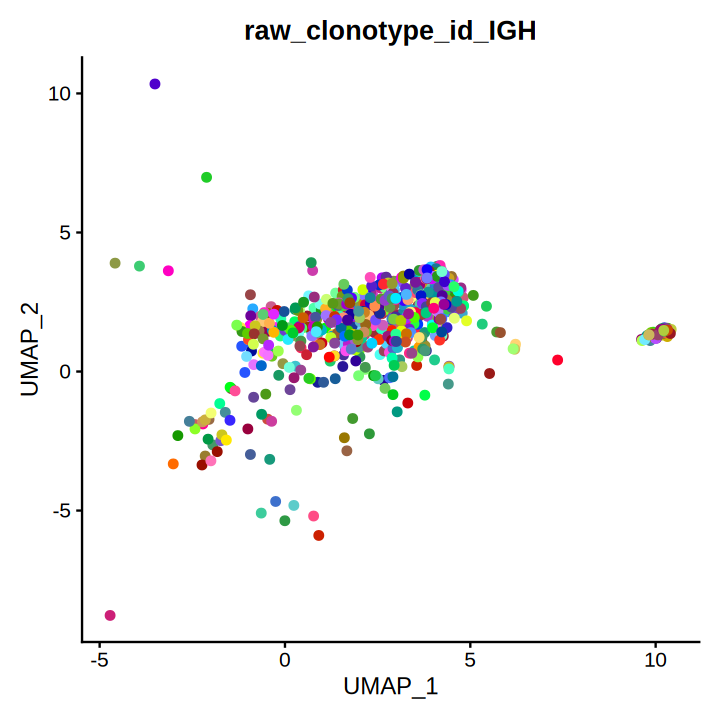

In [146]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [147]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl7preplasma")
oneplasma

An object of class Seurat 
36601 features across 3481 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [148]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/Hyl-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/Hyl-5/outs/consensus_annotations.csv")

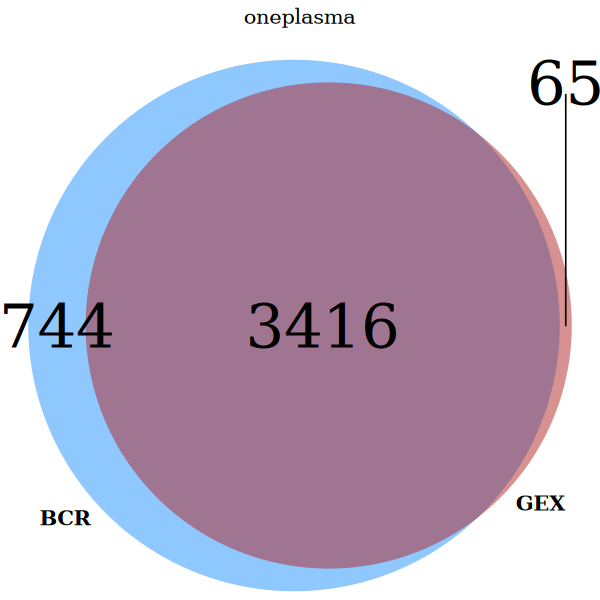

In [149]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl7preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 38. Clonotype assignment and repertoire analysis


In [150]:
unlabeled12<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

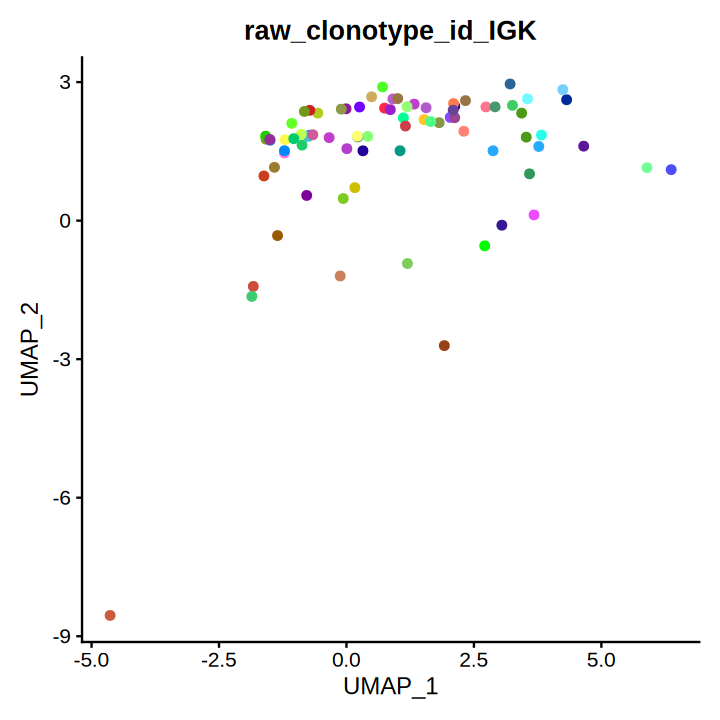

In [151]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

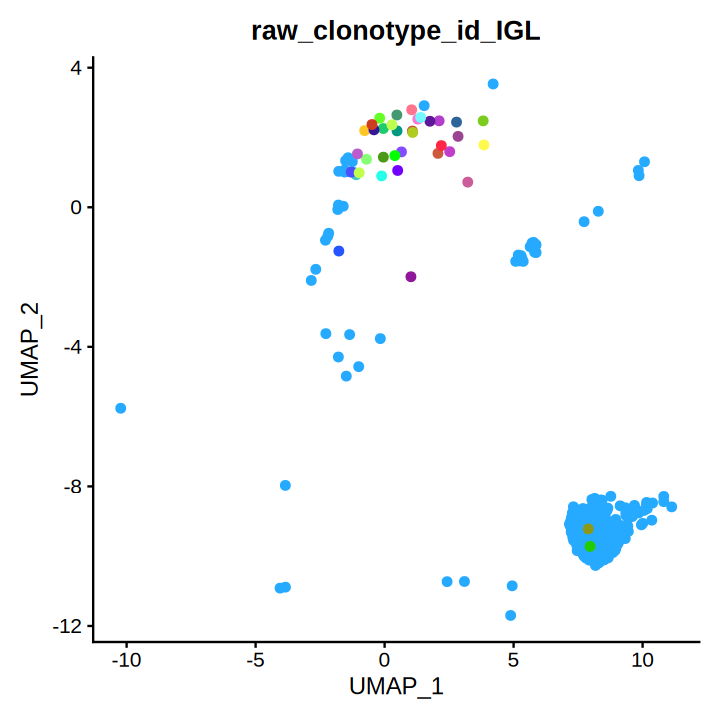

In [152]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 39. Clonotype assignment and repertoire analysis


In [153]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

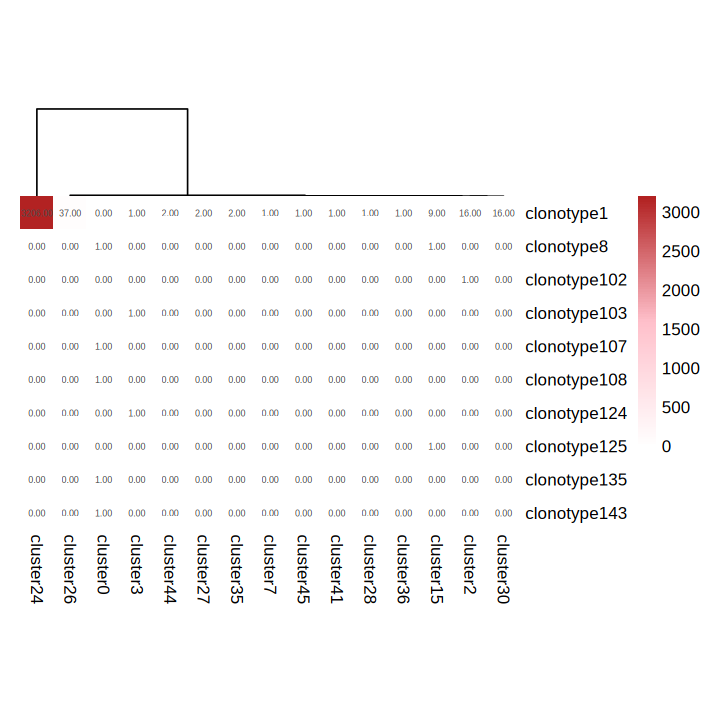

In [154]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta12<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta12$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [155]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta12$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl7_IGLV2-14',meta12$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,596,IGH,IGHV1-3,,IGHJ4,IGHE,true,true,⋯,195,252,252,270,270,384,384,432,432,463
2,clonotype1,clonotype1_consensus2,703,IGL,IGLV2-14,,IGLJ3,IGLC2,true,true,⋯,269,314,314,335,335,428,428,464,464,492


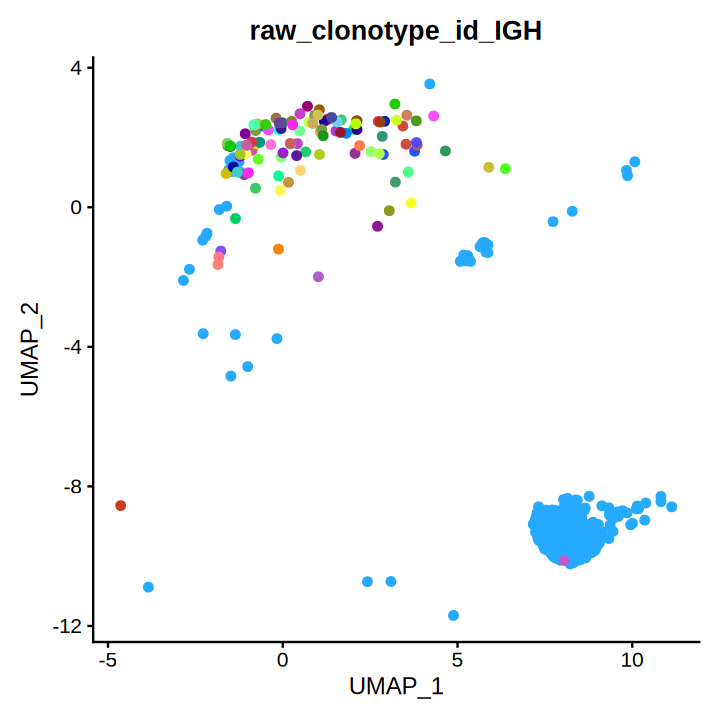

In [156]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [157]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl8preplasma")
oneplasma

An object of class Seurat 
36601 features across 9093 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 40. Load input data


In [158]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/hg-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/hg-5/outs/consensus_annotations.csv")

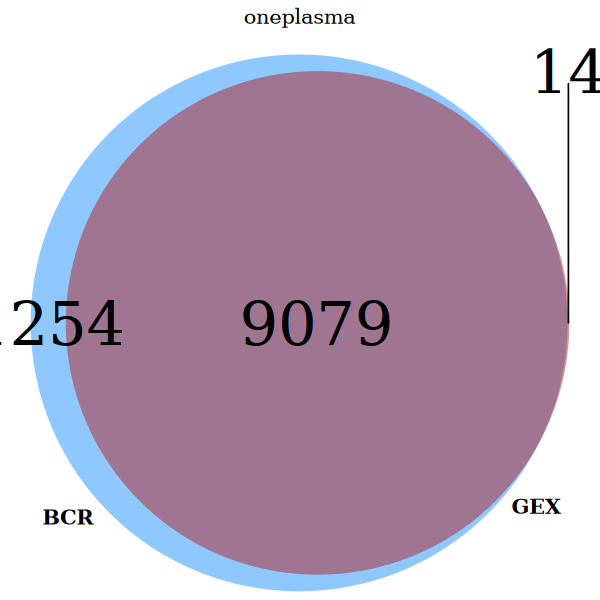

In [159]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl8preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [160]:
unlabeled13<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 41. Clonotype assignment and repertoire analysis


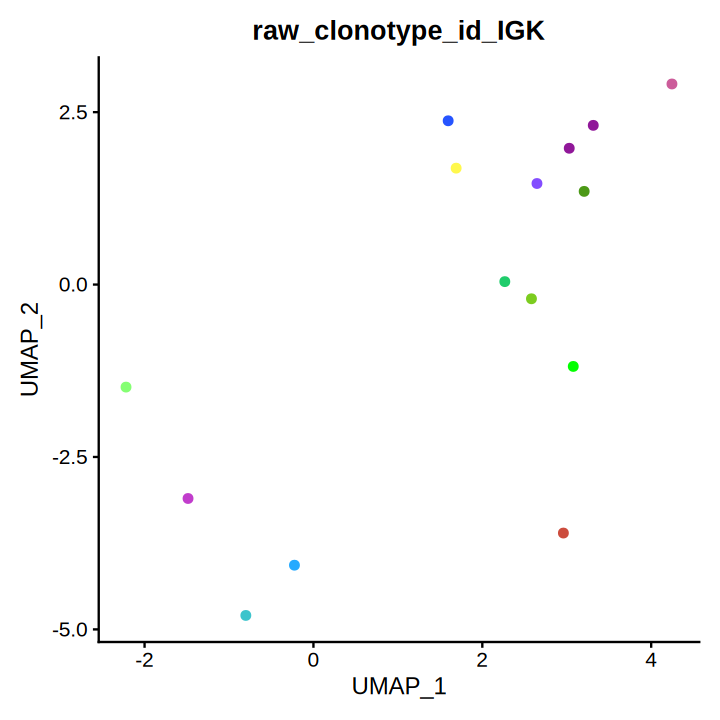

In [161]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

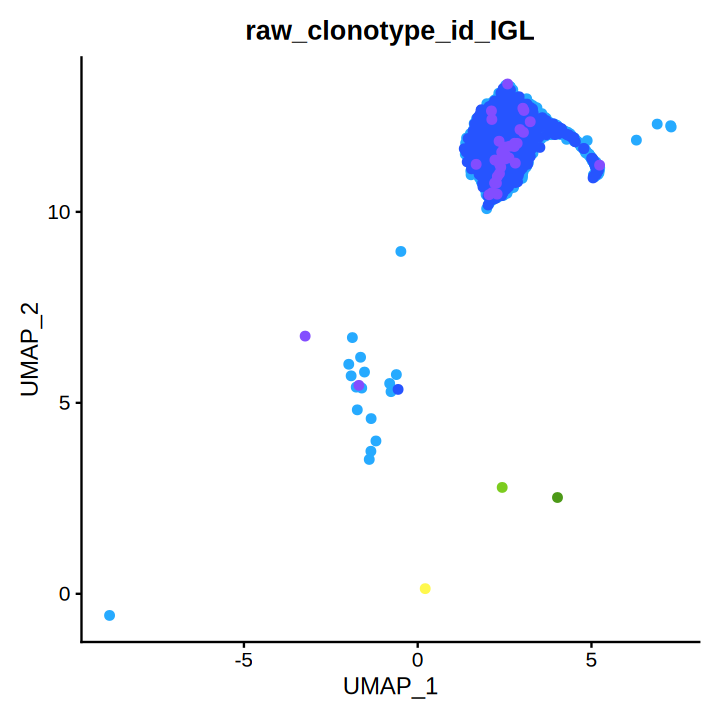

In [162]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [163]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

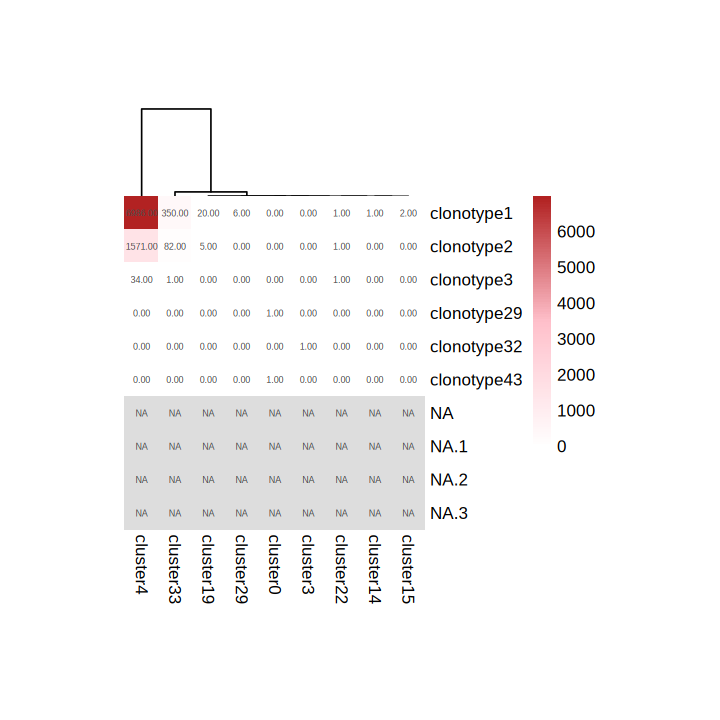

In [164]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta13<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype2')),]
meta13$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [165]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta13$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl8_IGLV3-1_1',meta13$'raw_clonotype_id_IGL')
meta13$'raw_clonotype_id_IGL'<-gsub('clonotype2','ALl8_IGLV3-1_2',meta13$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,718,IGH,IGHV4-34,,IGHJ4,IGHG1,true,true,⋯,274,331,331,346,346,460,460,505,505,536
2,clonotype1,clonotype1_consensus2,886,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,455,500,500,521,521,614,614,647,647,675
3,clonotype2,clonotype2_consensus1,742,IGH,IGHV4-59,,IGHJ4,IGHG1,true,true,⋯,298,355,355,370,370,484,484,529,529,560
4,clonotype2,clonotype2_consensus2,827,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,396,441,441,462,462,555,555,588,588,616


## 42. Clonotype assignment and repertoire analysis


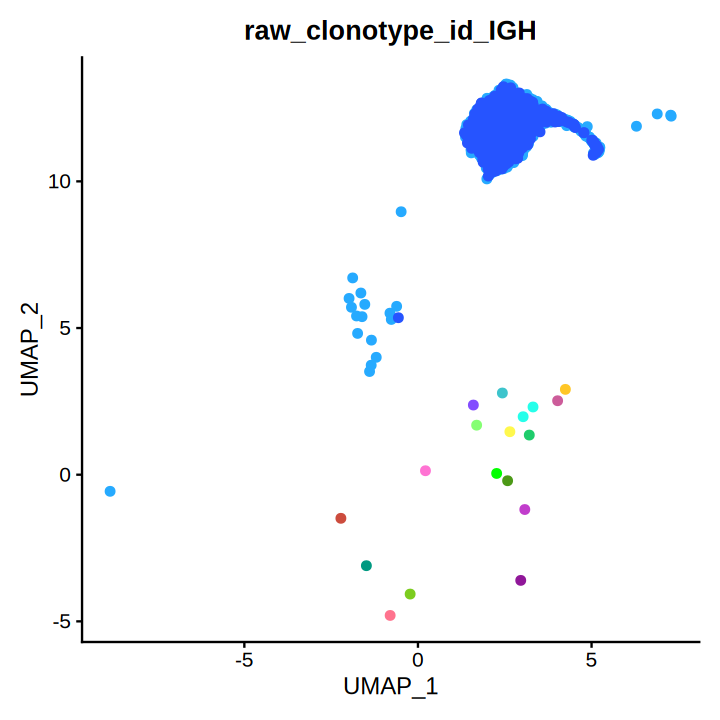

In [166]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [167]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk1preplasma")
oneplasma

An object of class Seurat 
36601 features across 8015 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [168]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/DGZ-5/DGZ-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/DGZ-5/DGZ-5/outs/consensus_annotations.csv")

## 43. Clonotype assignment and repertoire analysis


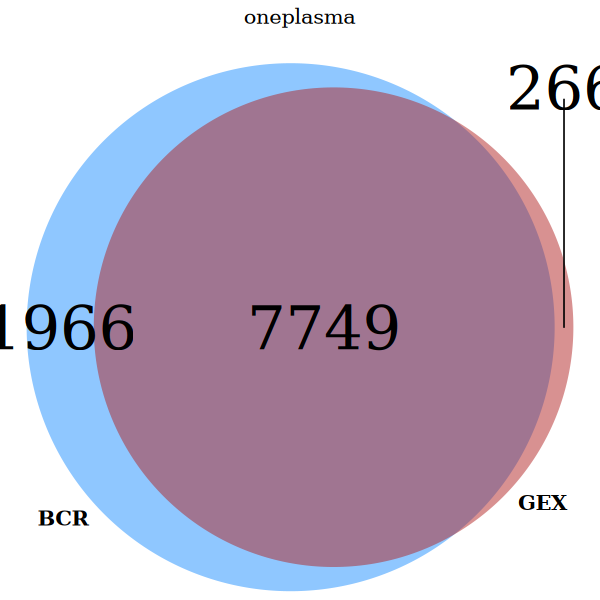

In [169]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk1preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [170]:
unlabeled14<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

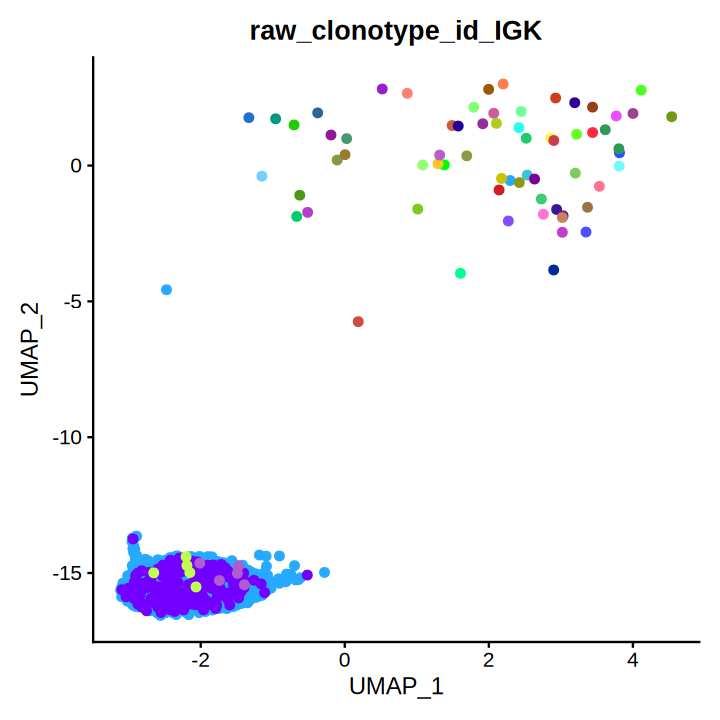

In [171]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [172]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

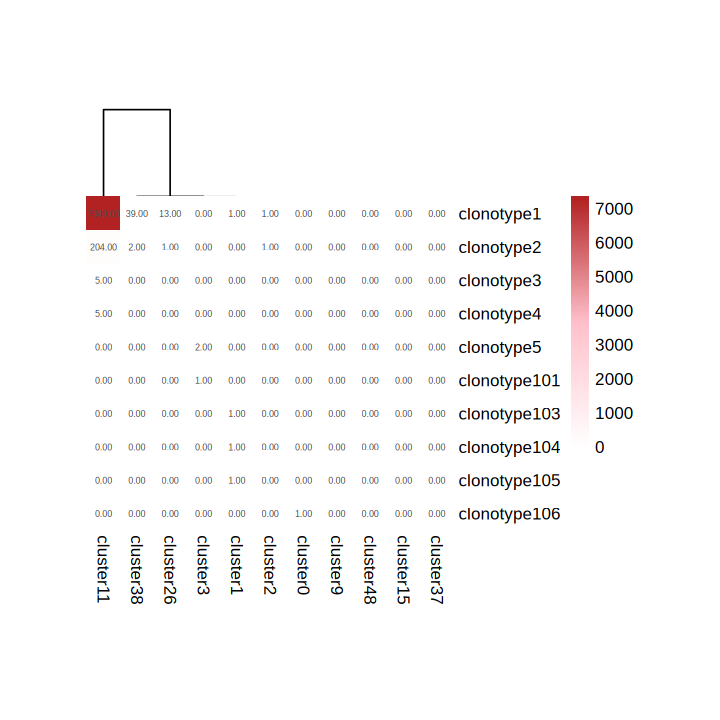

In [173]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta14<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1','clonotype2')),]
meta14$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 44. Clonotype assignment and repertoire analysis


In [174]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta14$'raw_clonotype_id_IGK'<-gsub('clonotype1','ALk1_IGKV1-33_1',meta14$'raw_clonotype_id_IGK')
meta14$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk1_IGKV1-33_2',meta14$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,632,IGH,IGHV2-5,,IGHJ4,IGHG2,true,true,⋯,188,245,245,260,260,374,374,419,419,450
2,clonotype1,clonotype1_consensus2,646,IGH,IGHV4-59,,IGHJ6,IGHA1,true,true,⋯,215,272,272,287,287,401,401,455,455,486
3,clonotype1,clonotype1_consensus3,555,IGK,IGKV1-33,,IGKJ4,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419
4,clonotype2,clonotype2_consensus1,555,IGK,IGKV1-33,,IGKJ4,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419


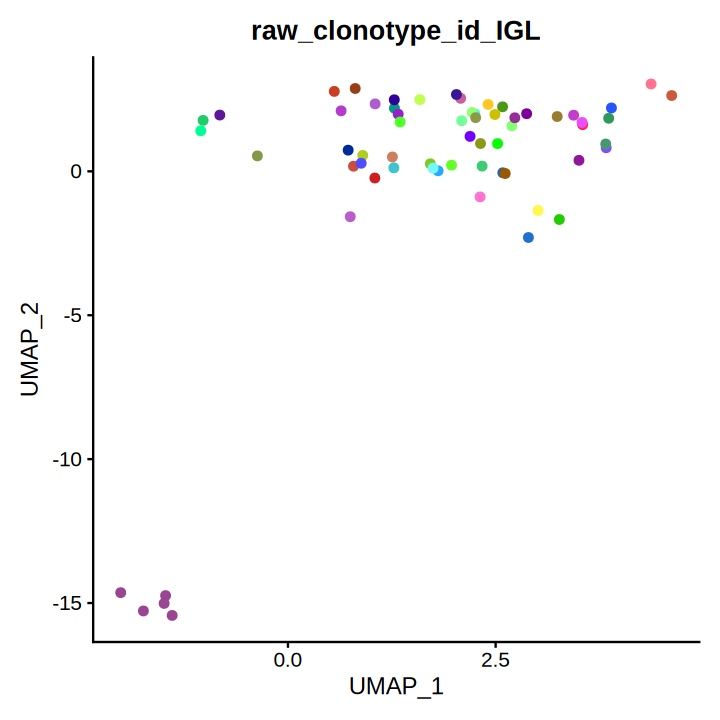

In [175]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

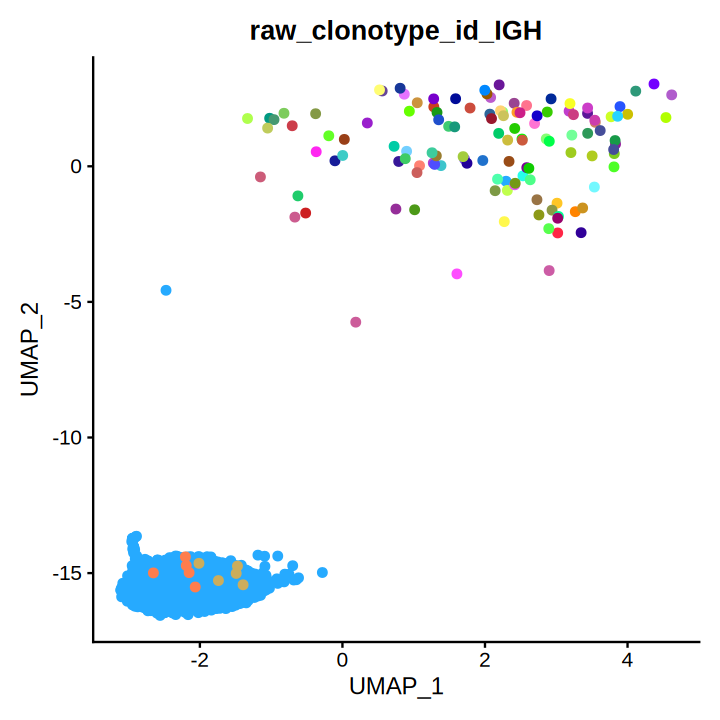

In [176]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 45. Clonotype assignment and repertoire analysis


In [177]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "HPCAL1plasma")
oneplasma

An object of class Seurat 
36601 features across 8443 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [178]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/M5/M5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/M5/M5/outs/consensus_annotations.csv")

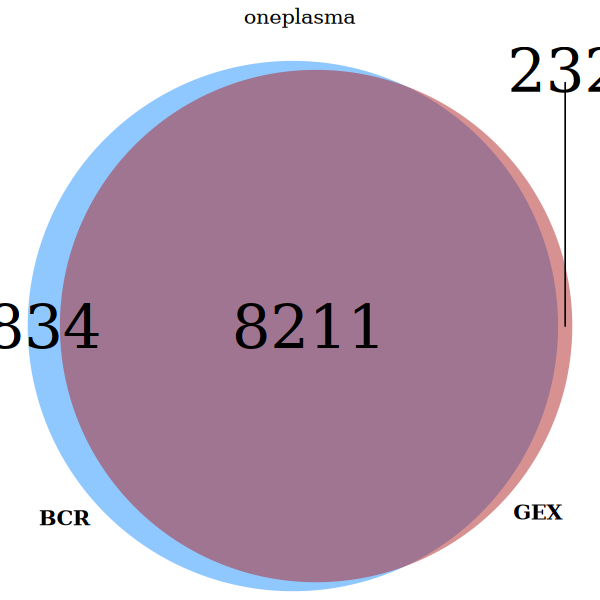

In [179]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('MM1plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [180]:
unlabeled15<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

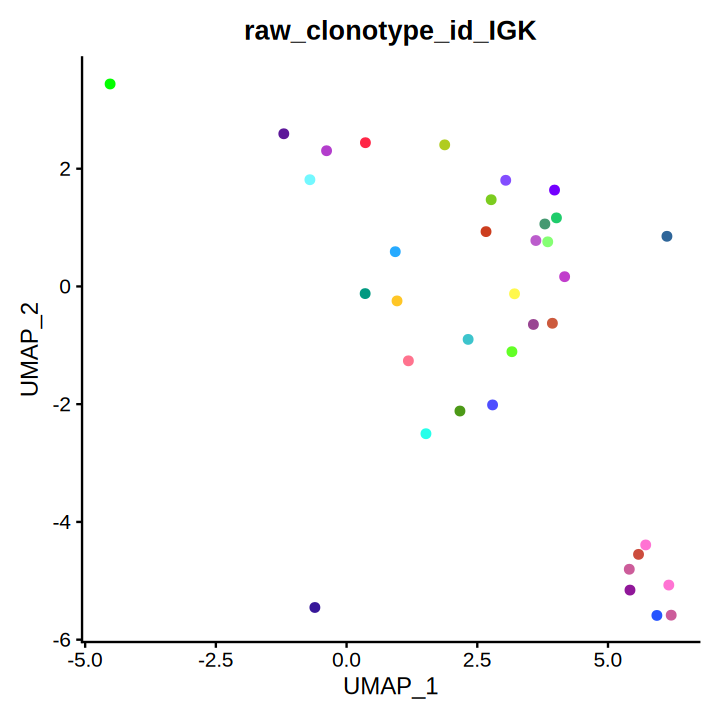

In [181]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 46. Clonotype assignment and repertoire analysis


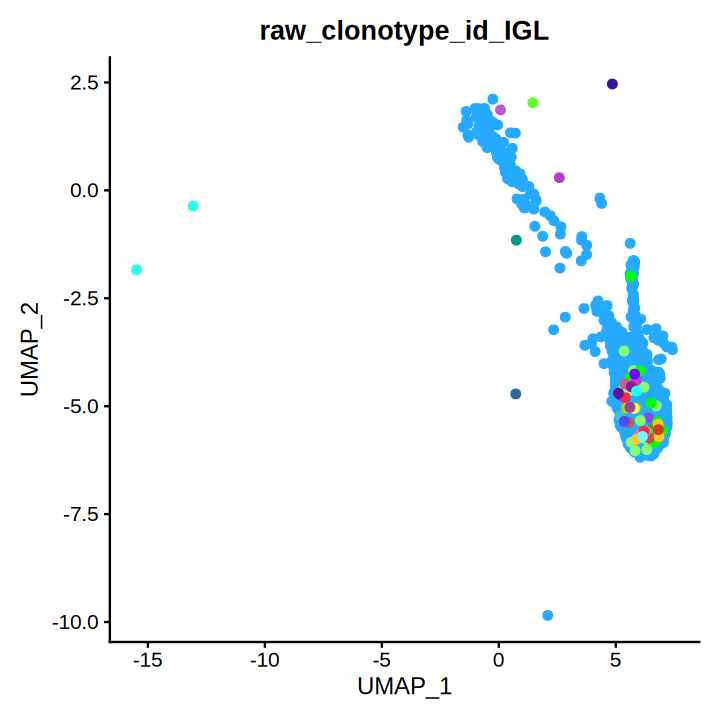

In [182]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [183]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

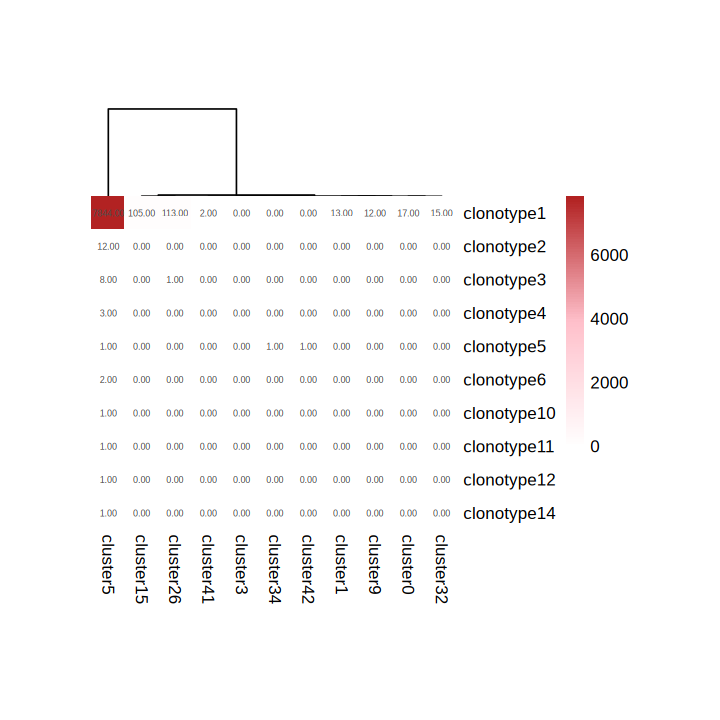

In [184]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta15<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta15$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 47. Clonotype assignment and repertoire analysis


In [185]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta15$'raw_clonotype_id_IGL'<-gsub('clonotype1','HPCAL1_IGLV2-14',meta15$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,722,IGL,IGLV2-14,,IGLJ3,IGLC2,true,true,⋯,288,333,333,354,354,447,447,483,483,511


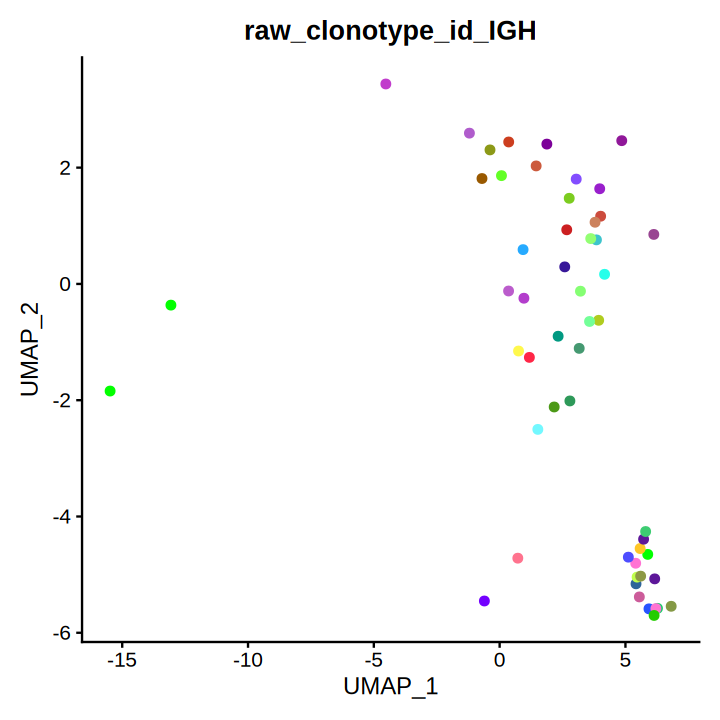

In [186]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [187]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "HPCAL2plasma")
oneplasma

An object of class Seurat 
36601 features across 8283 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [188]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/tbt-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/tbt-5/outs/consensus_annotations.csv")

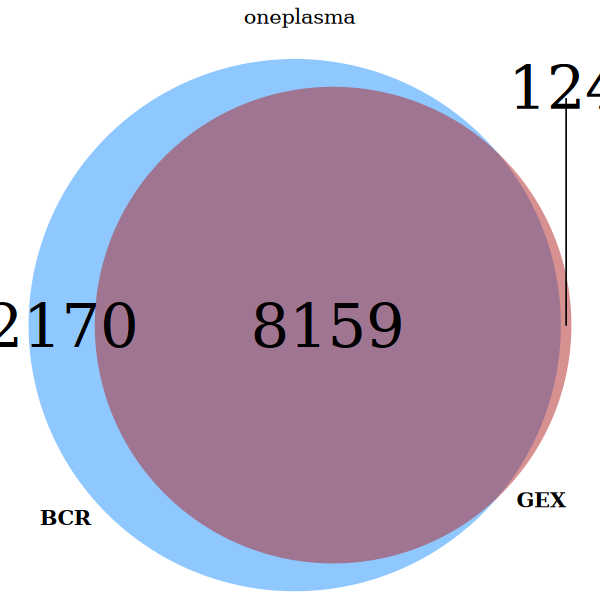

In [189]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('MM2plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 48. Clonotype assignment and repertoire analysis


In [190]:
unlabeled16<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

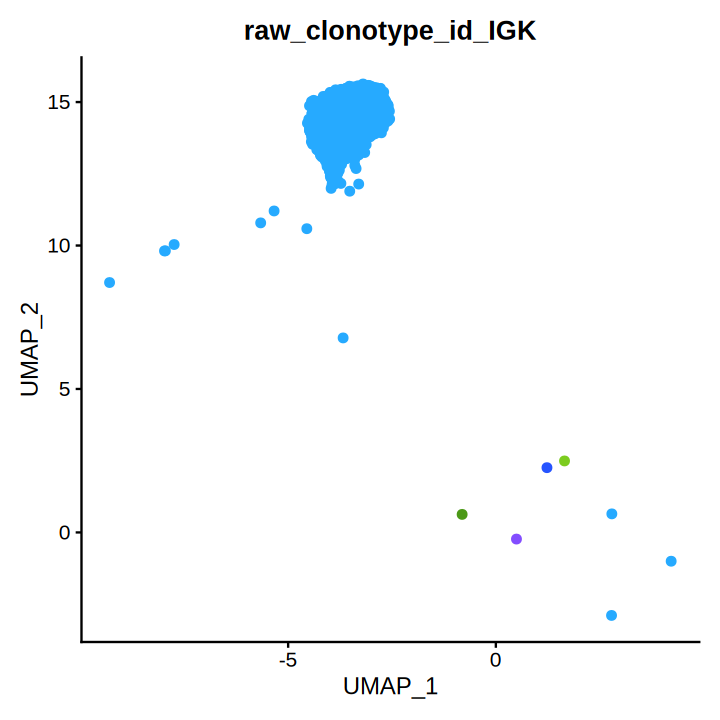

In [191]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [192]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 49. Clonotype assignment and repertoire analysis


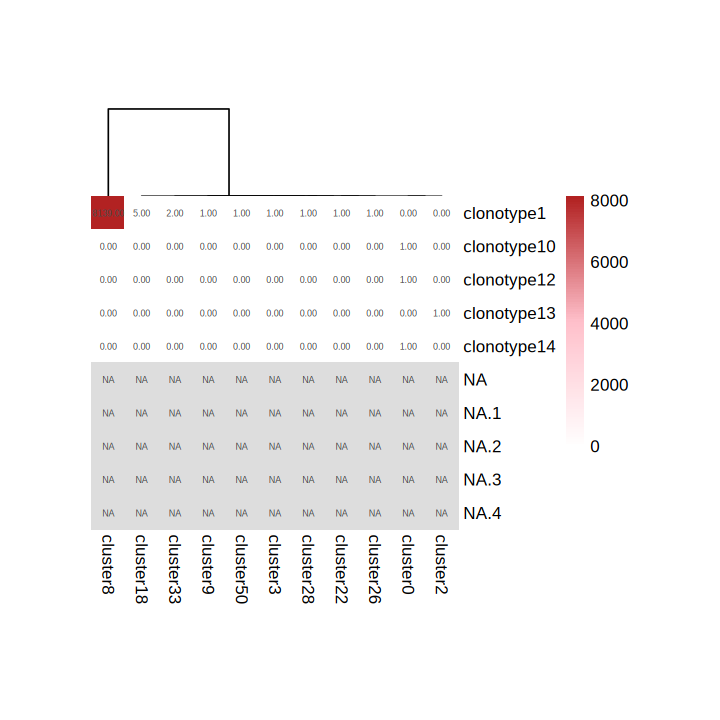

In [193]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta16<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype1')),]
meta16$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [194]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta16$'raw_clonotype_id_IGK'<-gsub('clonotype1','HPCAL2_IGKV1-33',meta16$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,697,IGH,IGHV3-23,NA,IGHJ5,IGHG1,true,true,⋯,232,289,289,307,307,421,421,484,484,515
2,clonotype1,clonotype1_consensus2,555,IGK,IGKV1-33,NA,IGKJ4,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419


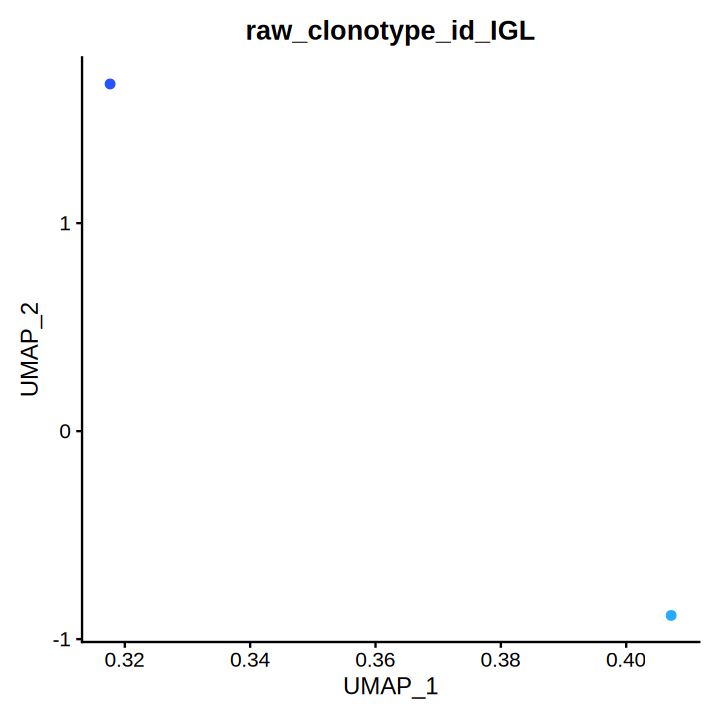

In [195]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

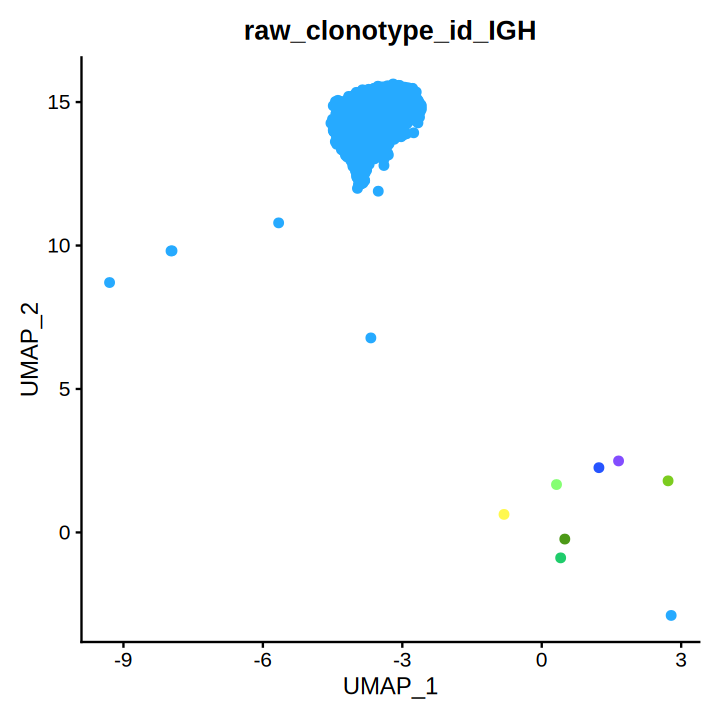

In [196]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [197]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "HPCAL3plasma")
oneplasma

An object of class Seurat 
36601 features across 8360 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 50. Load input data


In [198]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/GGT-5/GGT-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/GGT-5/GGT-5/outs/consensus_annotations.csv")

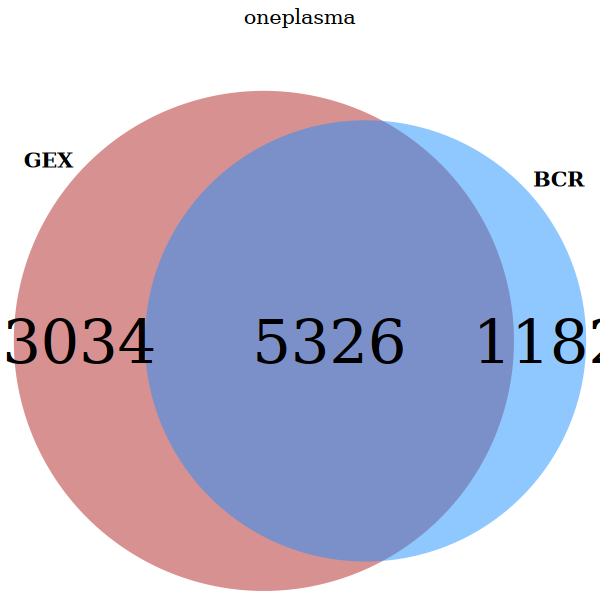

In [199]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('MM3plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [200]:
unlabeled17<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 51. Clonotype assignment and repertoire analysis


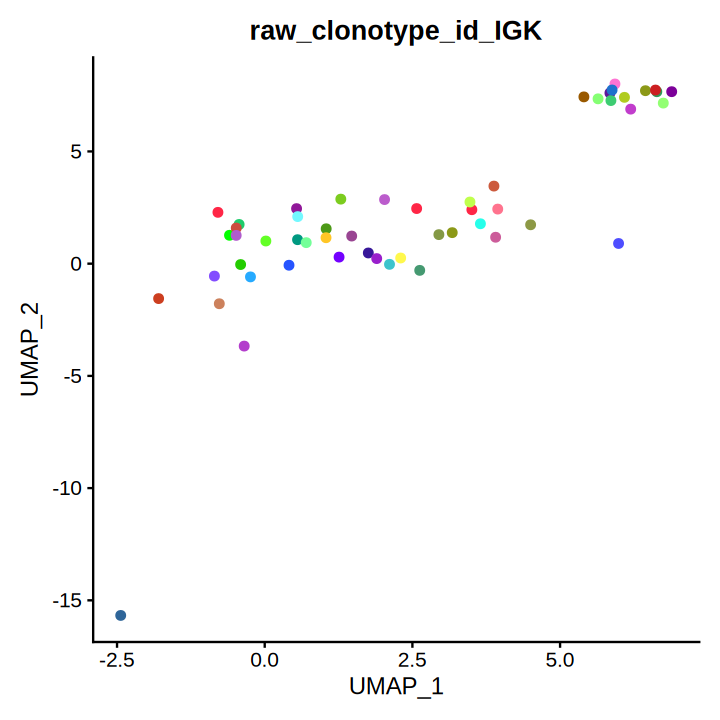

In [201]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

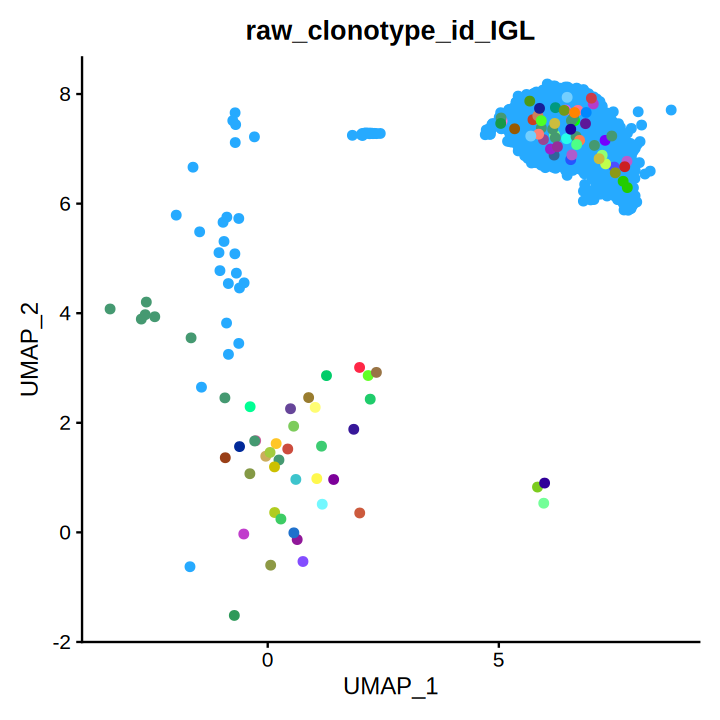

In [202]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [203]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

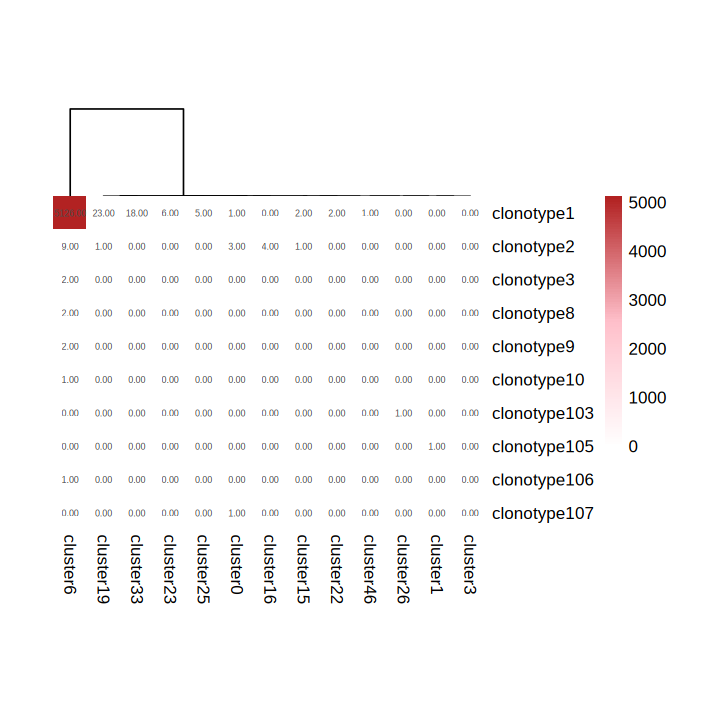

In [204]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta17<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta17$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [205]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta17$'raw_clonotype_id_IGL'<-gsub('clonotype1','HPCAL3_IGLV3-21',meta17$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,633,IGL,IGLV3-21,,IGLJ3,IGLC2,true,true,⋯,196,241,241,262,262,355,355,394,394,422


## 52. Clonotype assignment and repertoire analysis


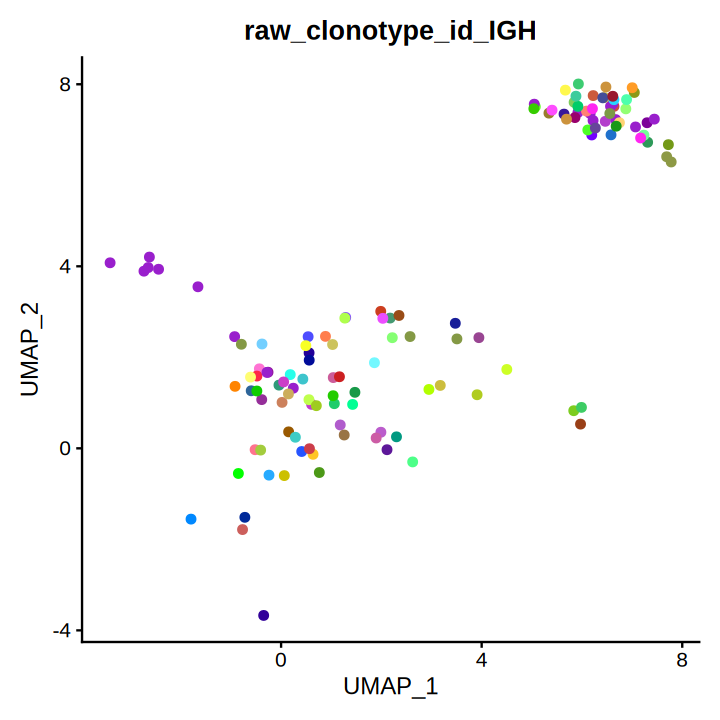

In [206]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [207]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl12plasma")
oneplasma

An object of class Seurat 
36601 features across 8532 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [208]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/Zyg-5/Zyg-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/Zyg-5/Zyg-5/outs/consensus_annotations.csv")

## 53. Clonotype assignment and repertoire analysis


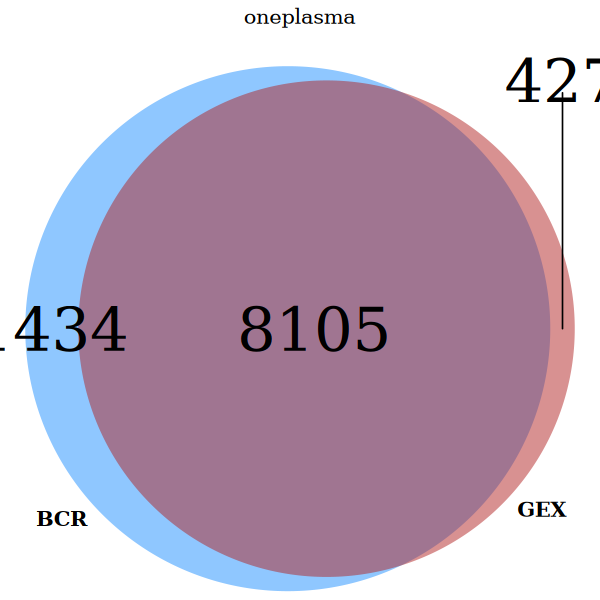

In [209]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl12plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [210]:
unlabeled18<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

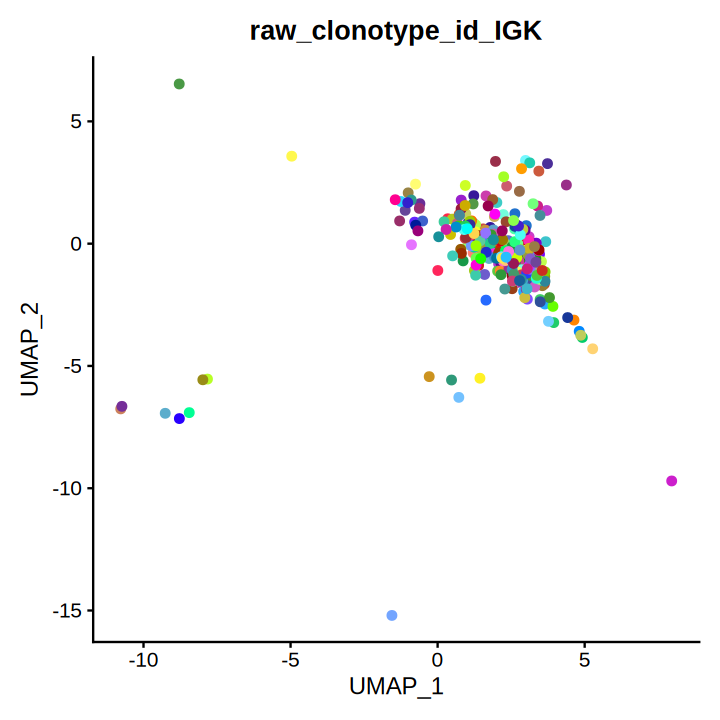

In [211]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

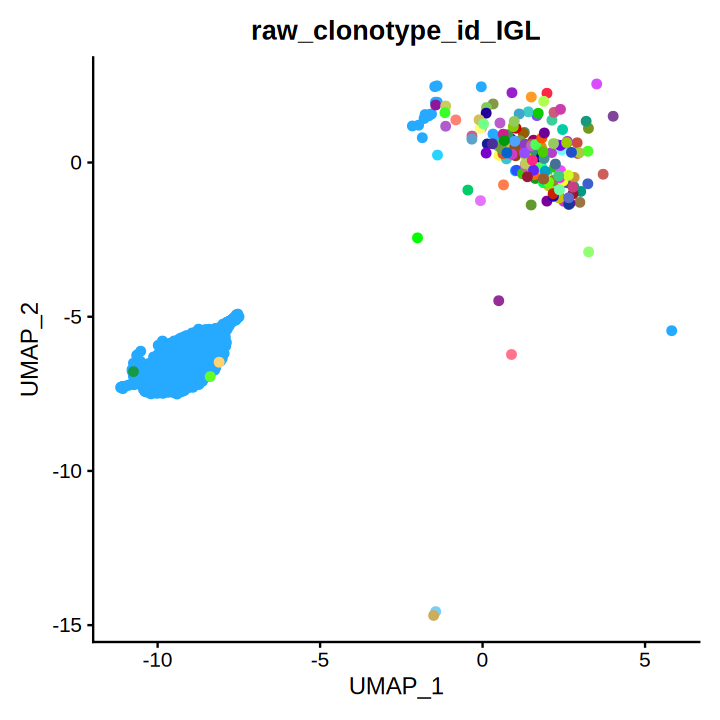

In [212]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [213]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 54. Clonotype assignment and repertoire analysis


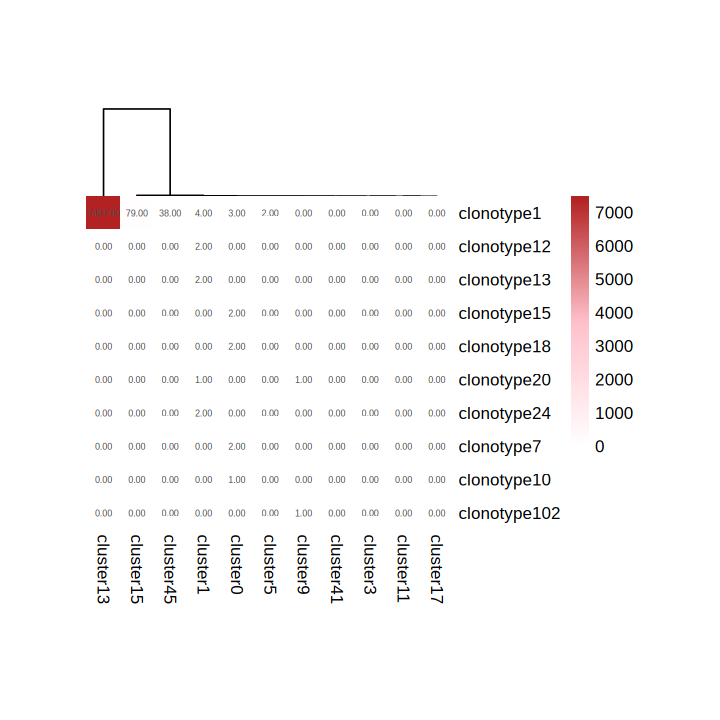

In [214]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta18<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta18$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [215]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta18$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl12_IGLV3-1',meta18$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,671,IGH,IGHV3-43,,IGHJ4,IGHG1,true,true,⋯,233,290,290,308,308,422,422,458,458,489
2,clonotype1,clonotype1_consensus2,639,IGL,IGLV3-1,,IGLJ2,IGLC2,true,true,⋯,208,253,253,274,274,367,367,400,400,428
3,clonotype1,clonotype1_consensus3,657,IGL,IGLV2-14,,IGLJ1,IGLC1,true,true,⋯,223,268,268,289,289,382,382,418,418,446


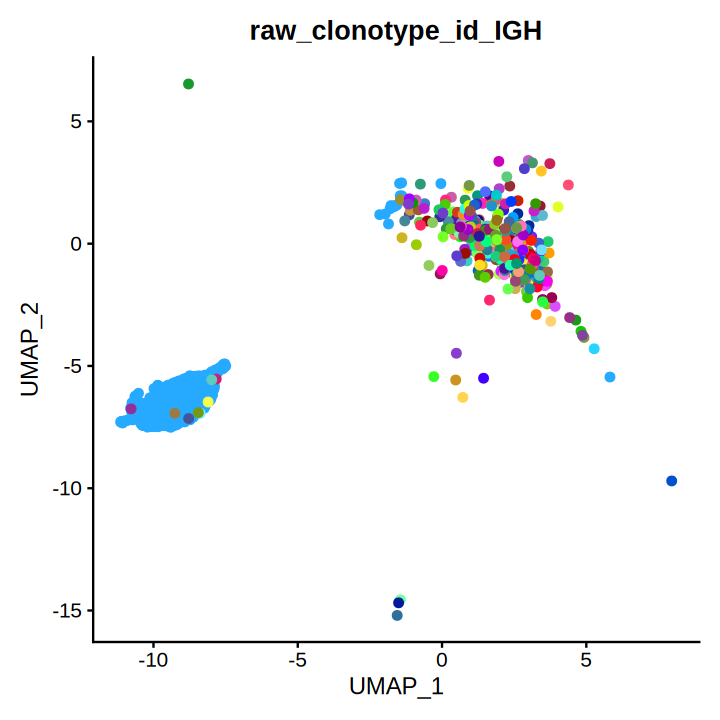

In [216]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredH <- oneplasmafilteredH[oneplasmafilteredH$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 55. Clonotype assignment and repertoire analysis


In [217]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl13plasma")
oneplasma

An object of class Seurat 
36601 features across 5445 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [218]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/F5/F5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/F5/F5/outs/consensus_annotations.csv")

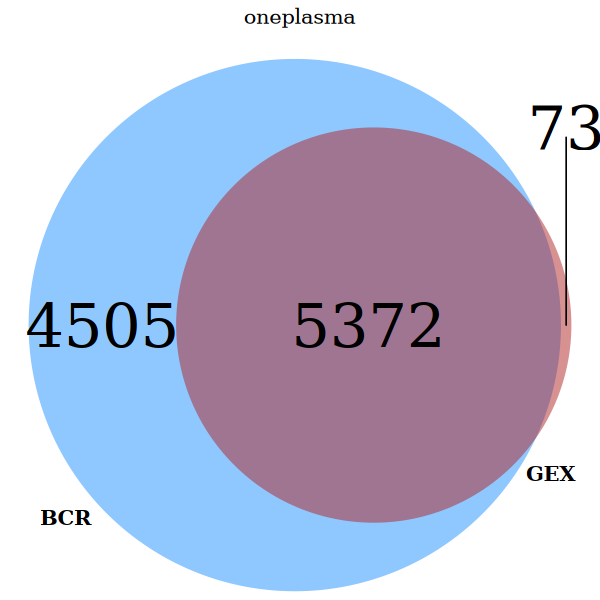

In [219]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl13plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [220]:
unlabeled19<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

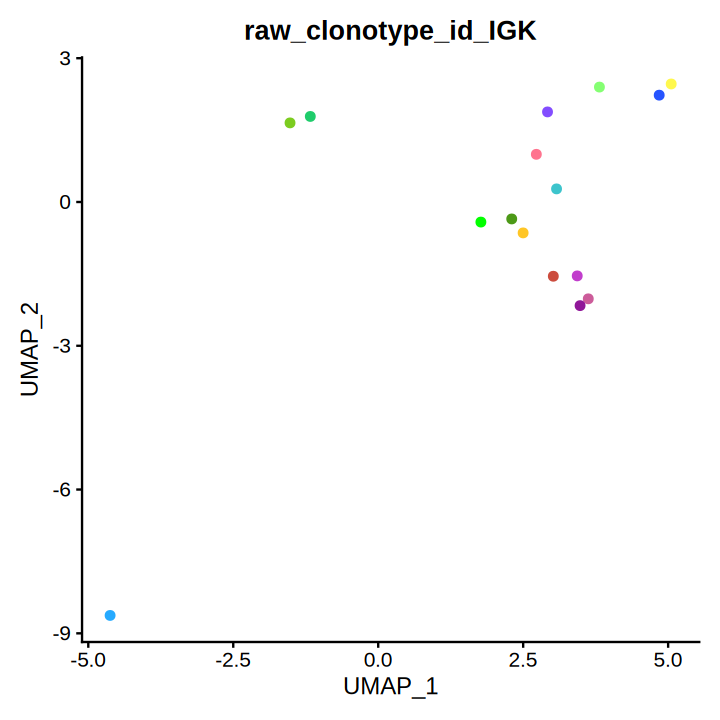

In [221]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 56. Clonotype assignment and repertoire analysis


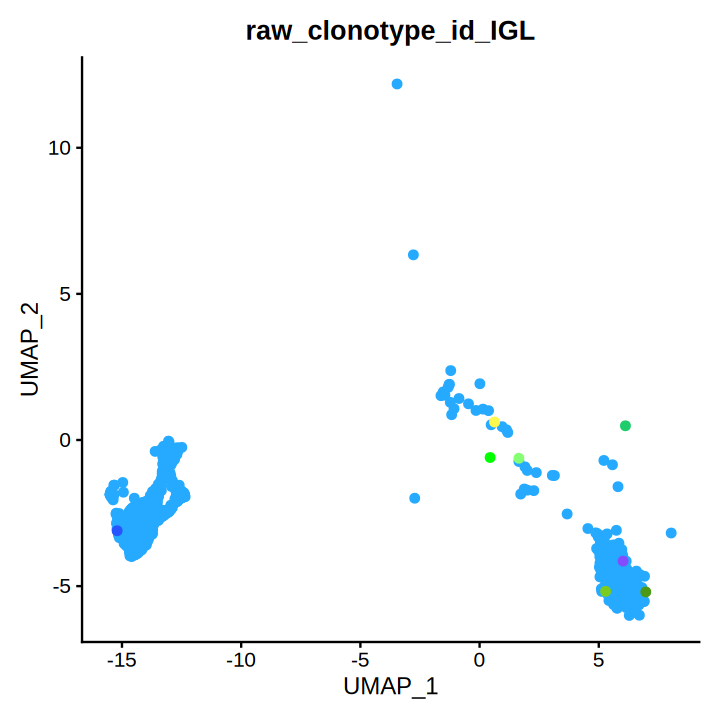

In [222]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [223]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

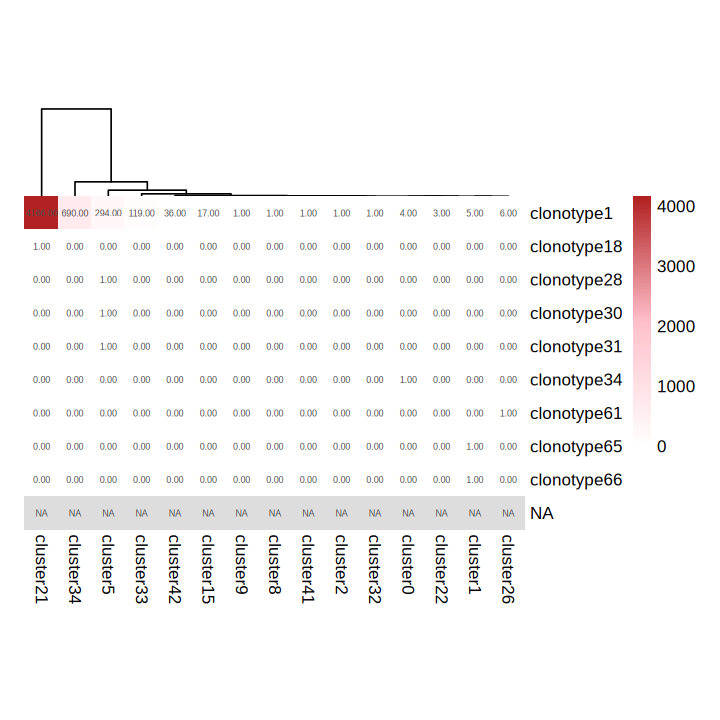

In [224]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta19<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta19$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 57. Clonotype assignment and repertoire analysis


In [225]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta19$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl13_IGLV3-21',meta19$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,699,IGH,IGHV4-59,,IGHJ4,IGHA1,true,true,⋯,298,355,355,370,370,472,472,508,508,539
2,clonotype1,clonotype1_consensus2,636,IGL,IGLV3-21,,IGLJ1,IGLC1,true,true,⋯,196,241,241,262,262,355,355,397,397,425
3,clonotype1,clonotype1_consensus3,700,IGL,IGLV2-14,,IGLJ3,IGLC2,true,true,⋯,266,311,311,332,332,425,425,461,461,489


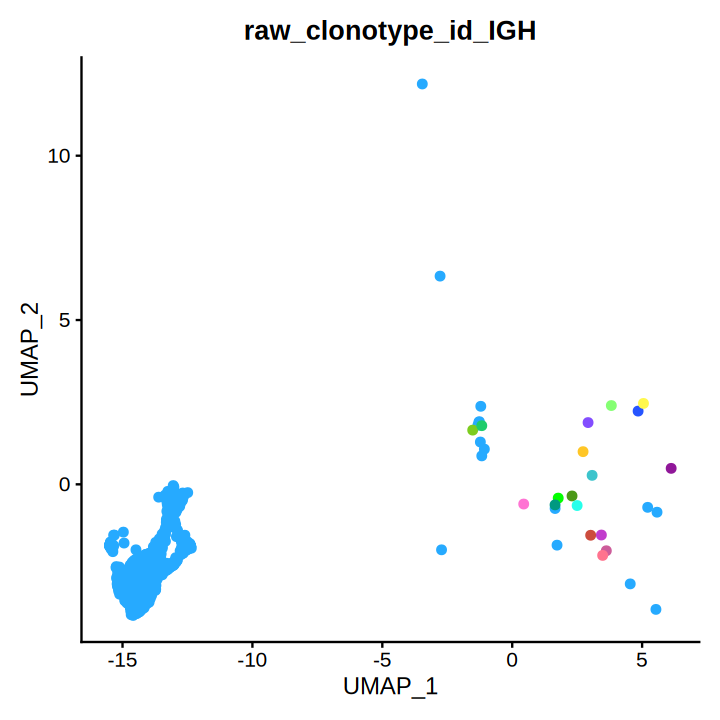

In [226]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [227]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl14plasma")
oneplasma

An object of class Seurat 
36601 features across 7620 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [228]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/AL-5/AL-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/AL-5/AL-5/outs/consensus_annotations.csv")

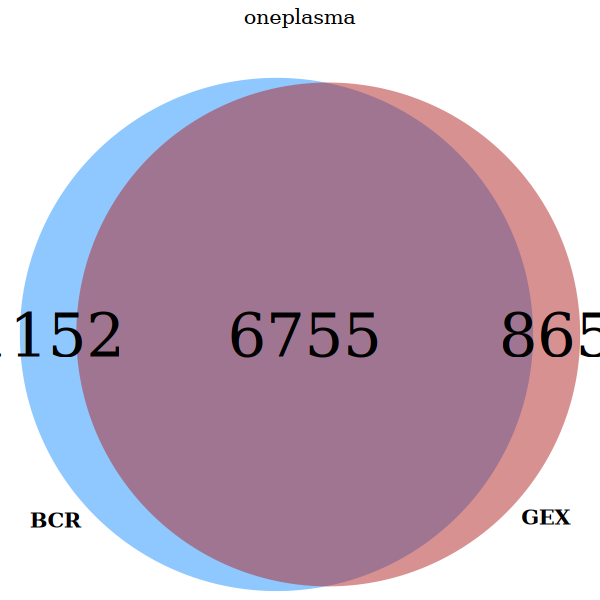

In [229]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl14plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 58. Clonotype assignment and repertoire analysis


In [230]:
unlabeled20<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

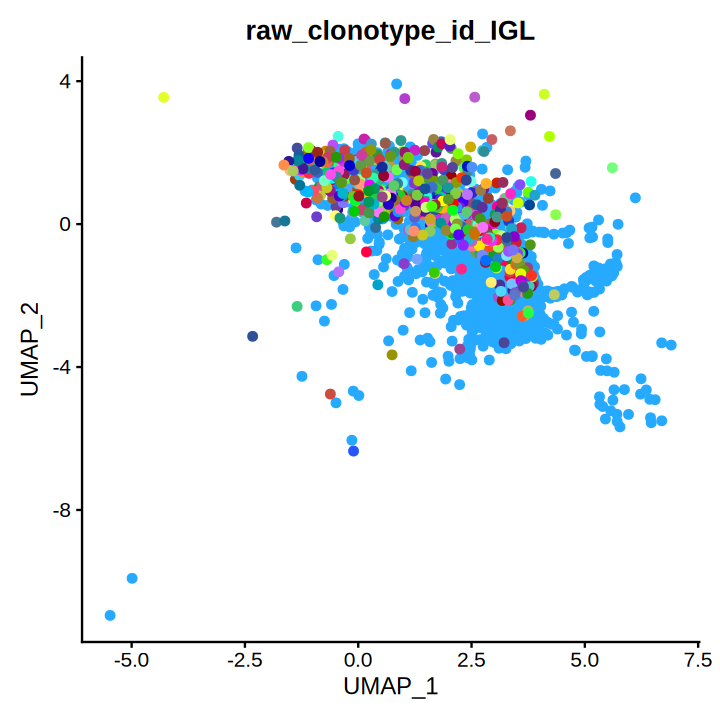

In [231]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [232]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 59. Clonotype assignment and repertoire analysis


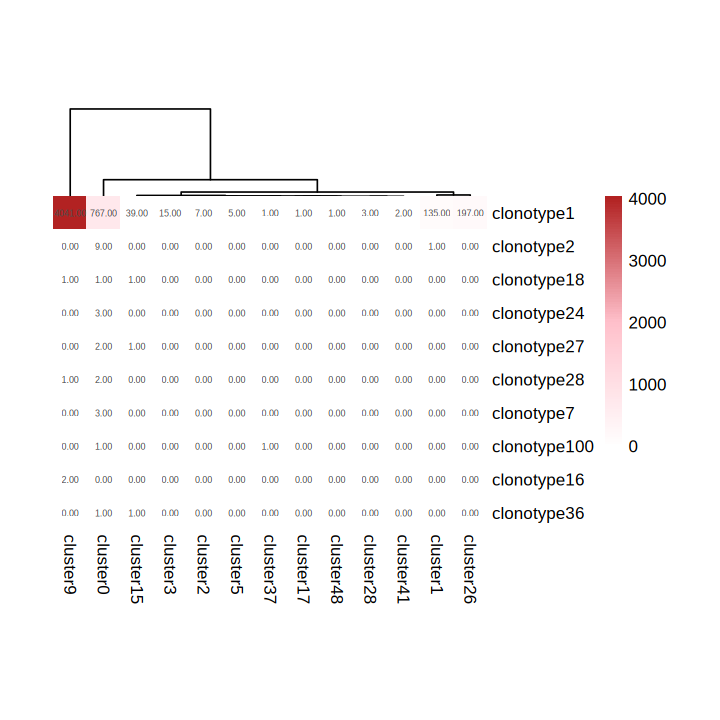

In [233]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta20<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta20$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [234]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta20$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl14_IGLV1-51',meta20$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,635,IGL,IGLV1-51,,IGLJ2,IGLC3,true,true,⋯,198,243,243,264,264,357,357,396,396,424


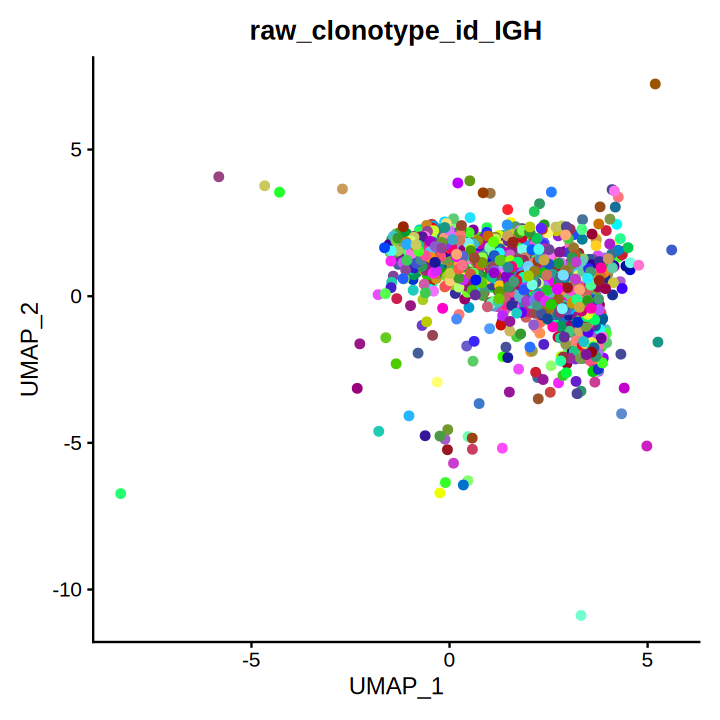

In [235]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1432,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [236]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl15plasma")
oneplasma

An object of class Seurat 
36601 features across 1472 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [237]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/newcontract/WYQ-5/WYQ-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/newcontract/WYQ-5/WYQ-5/outs/consensus_annotations.csv")

## 60. Clonotype assignment and repertoire analysis


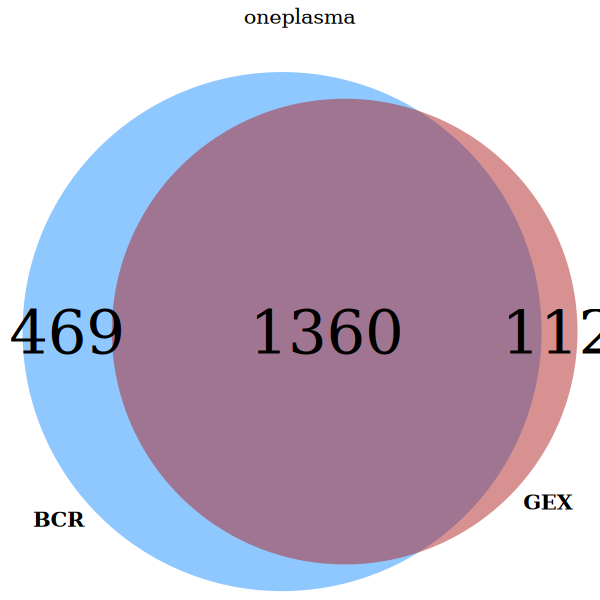

In [238]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl15plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [239]:
unlabeled21<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

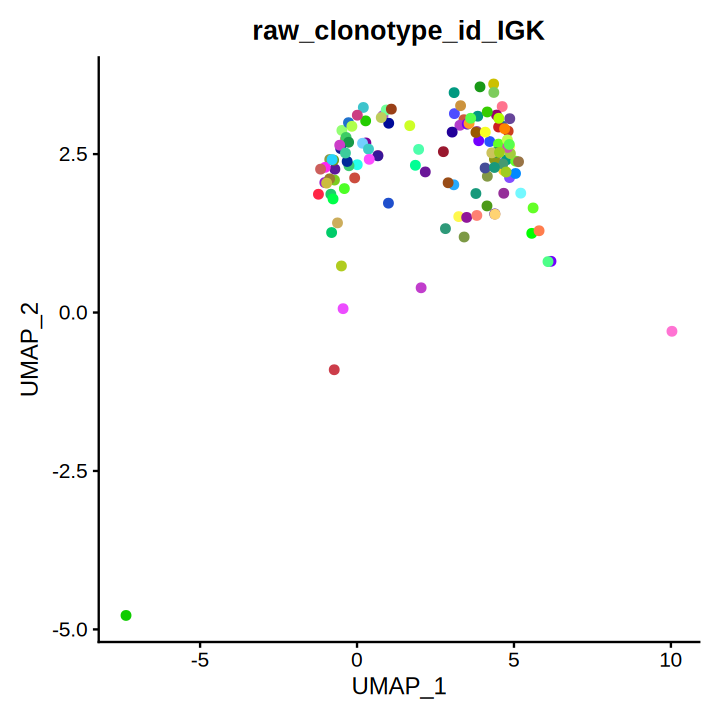

In [240]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 61. Clonotype assignment and repertoire analysis


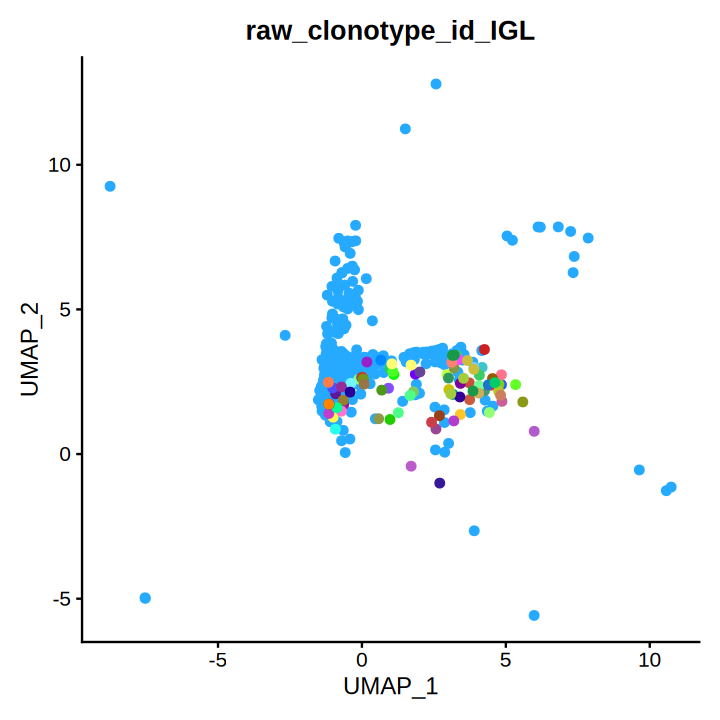

In [241]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [242]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

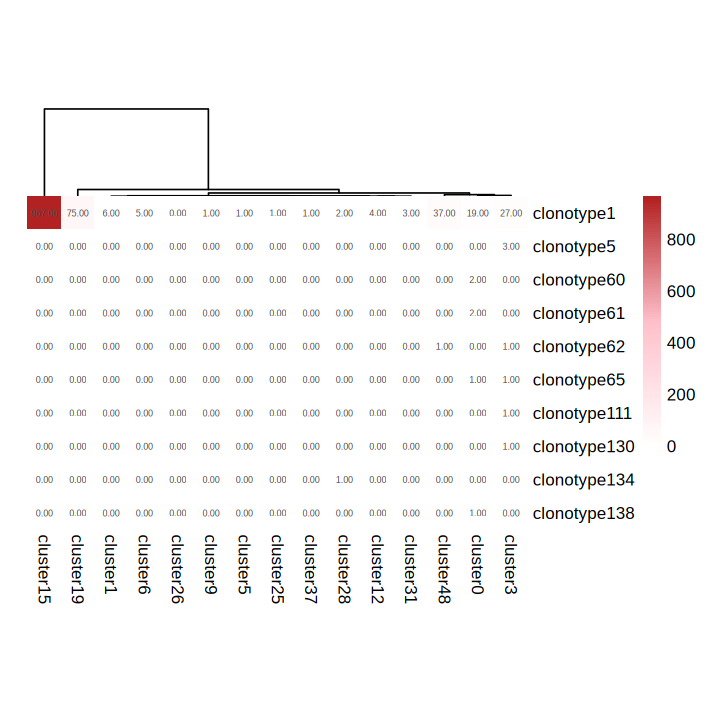

In [243]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta21<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta21$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [244]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta21$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl15_IGLV3-1',meta21$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,663,IGH,IGHV1-24,,IGHJ4,IGHG1,true,true,⋯,213,270,270,288,288,402,402,450,450,481
2,clonotype1,clonotype1_consensus2,624,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,193,238,238,259,259,352,352,385,385,413


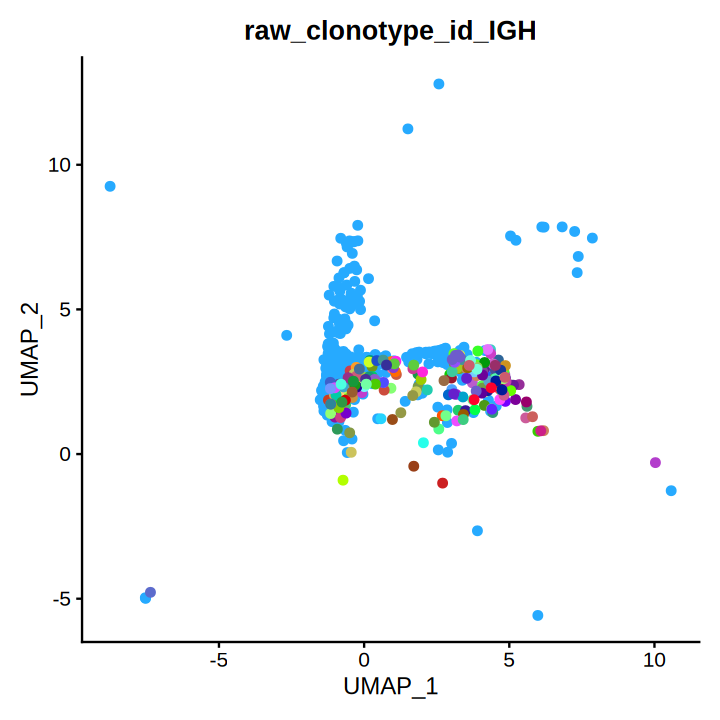

In [245]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 62. Load input data


In [246]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl10refracplasma")
oneplasma

An object of class Seurat 
36601 features across 4221 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [247]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/oldcontract/AL-5/AL-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/oldcontract/AL-5/AL-5/outs/consensus_annotations.csv")

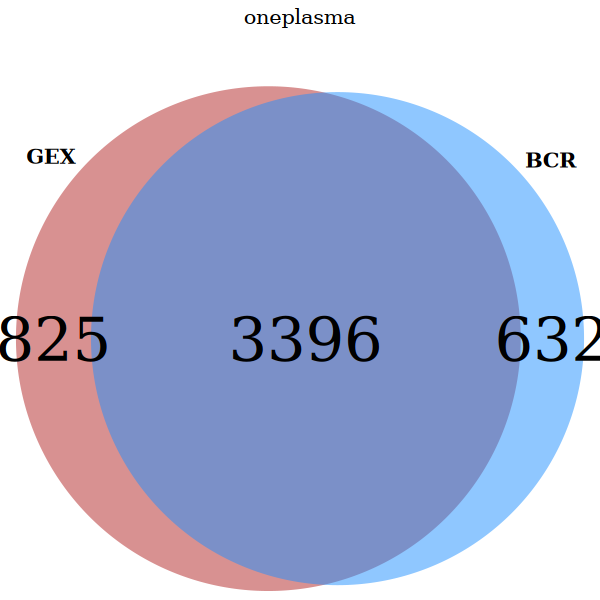

In [248]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl10refracplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 63. Clonotype assignment and repertoire analysis


In [249]:
unlabeled22<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

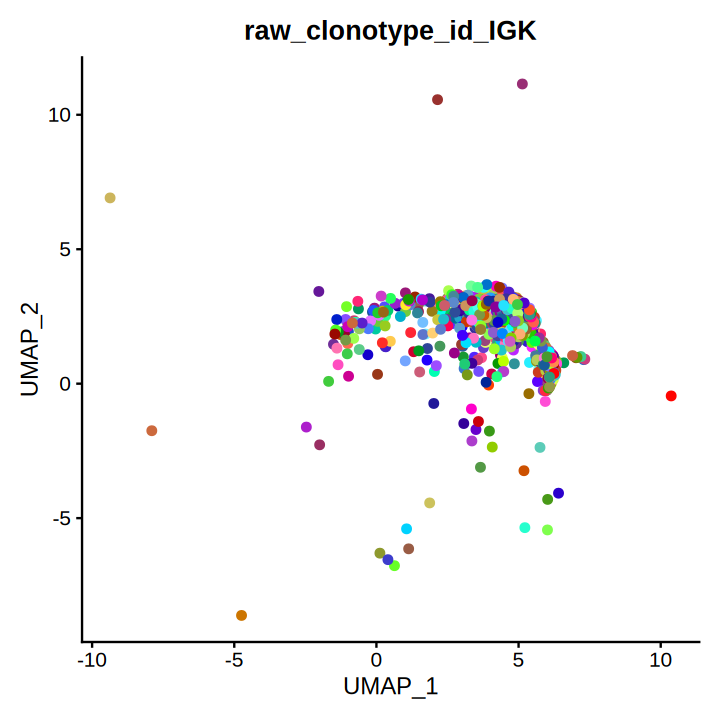

In [250]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1207,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

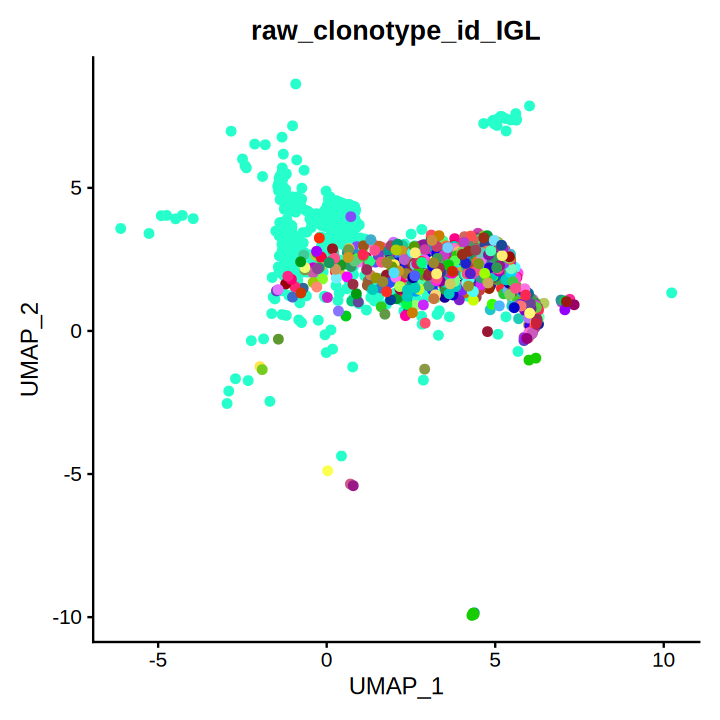

In [251]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 900,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [252]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

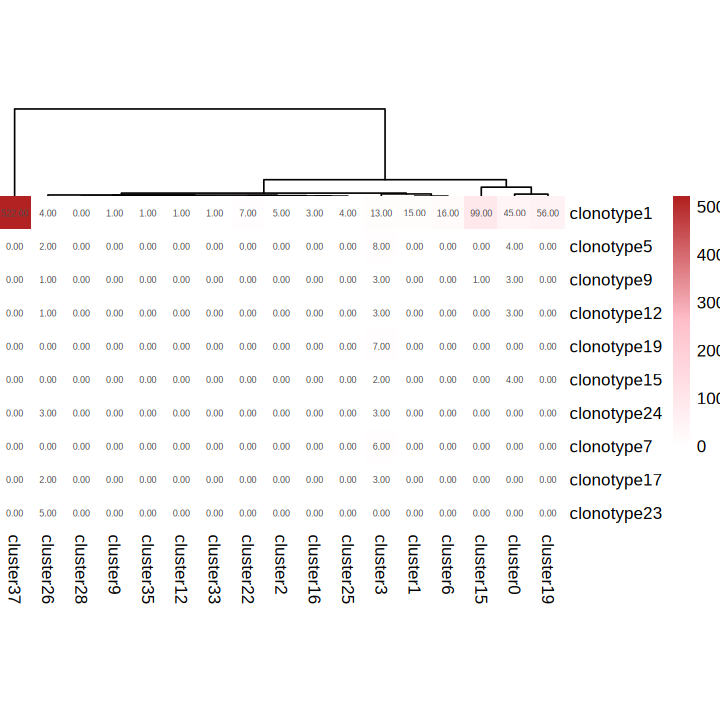

In [253]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta22<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta22$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 64. Clonotype assignment and repertoire analysis


In [254]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta22$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl10_IGLV1-44',meta22$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,639,IGH,IGHV4-61,,IGHJ6,IGHA1,true,true,⋯,190,247,247,262,262,376,376,448,448,479
2,clonotype1,clonotype1_consensus2,713,IGL,IGLV1-44,,IGLJ2,IGLC3,true,true,⋯,276,321,321,342,342,435,435,474,474,502


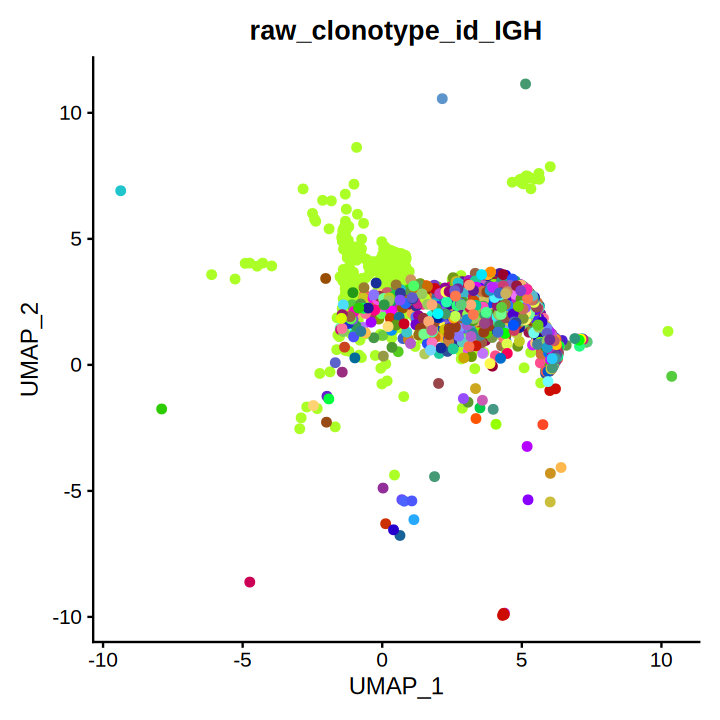

In [255]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2004,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")+ theme(legend.position = "none")

In [256]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl11refracplasma")
oneplasma

An object of class Seurat 
36601 features across 8056 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 65. Load input data


In [257]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1229/oldcontract/AL-V5/AL-V5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1229/oldcontract/AL-V5/AL-V5/outs/consensus_annotations.csv")

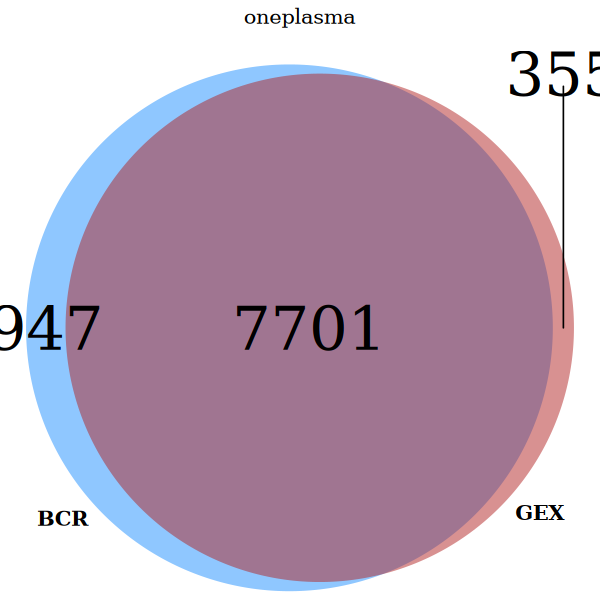

In [258]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl11refracplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [259]:
unlabeled23<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

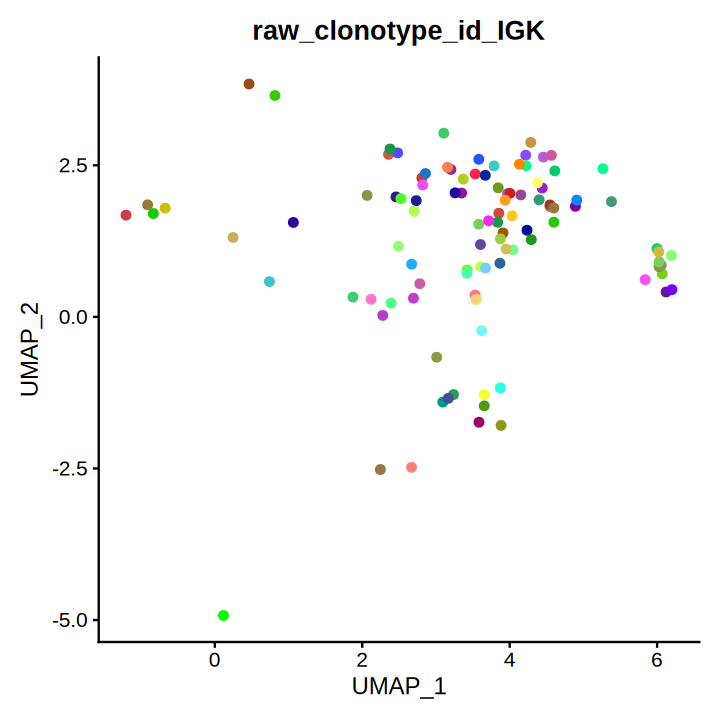

In [260]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

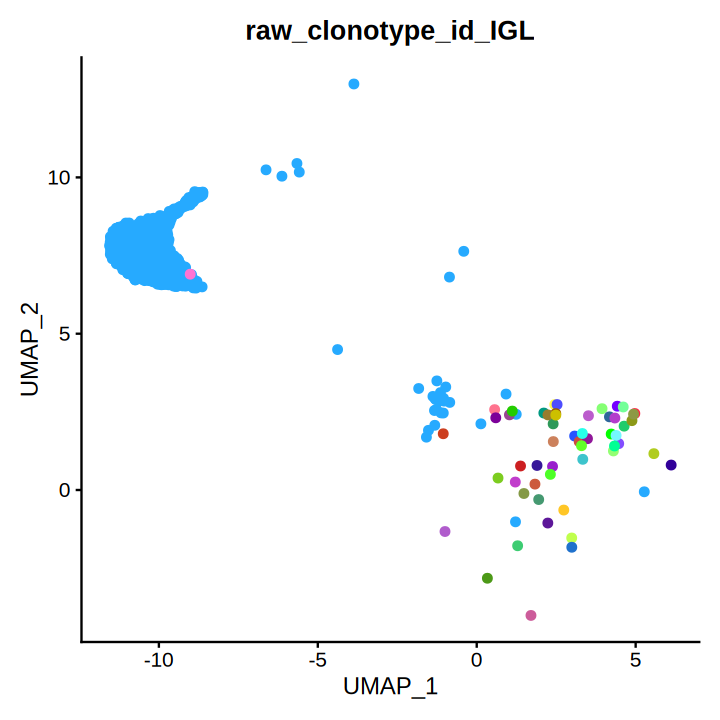

In [261]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 66. Clonotype assignment and repertoire analysis


In [262]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

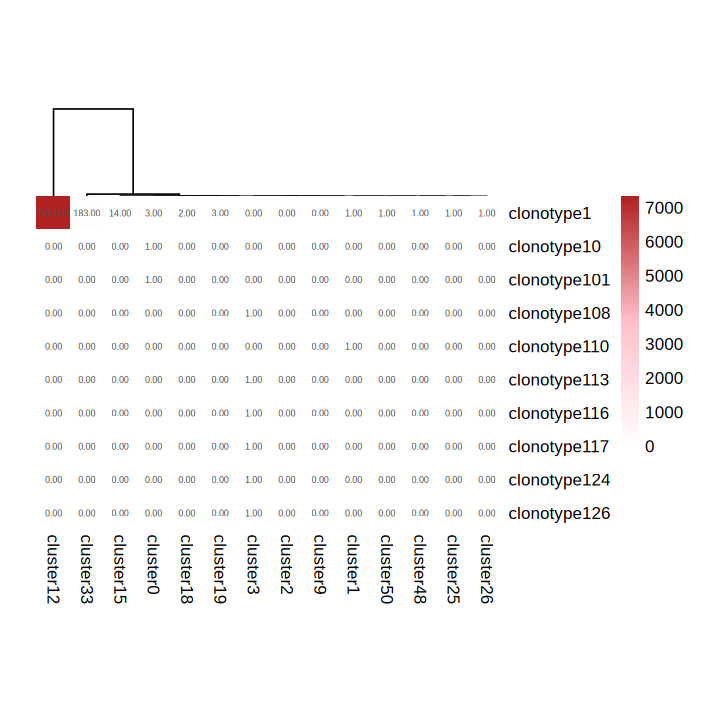

In [263]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta23<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta23$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [264]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta23$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl11_IGLV2-14',meta23$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,677,IGH,IGHV3-33,,IGHJ4,IGHG2,true,true,⋯,233,290,290,308,308,422,422,464,464,495
2,clonotype1,clonotype1_consensus2,1849,IGL,IGLV2-14,,IGLJ1,IGLC1,true,true,⋯,1415,1460,1460,1481,1481,1574,1574,1610,1610,1638


## 67. Clonotype assignment and repertoire analysis


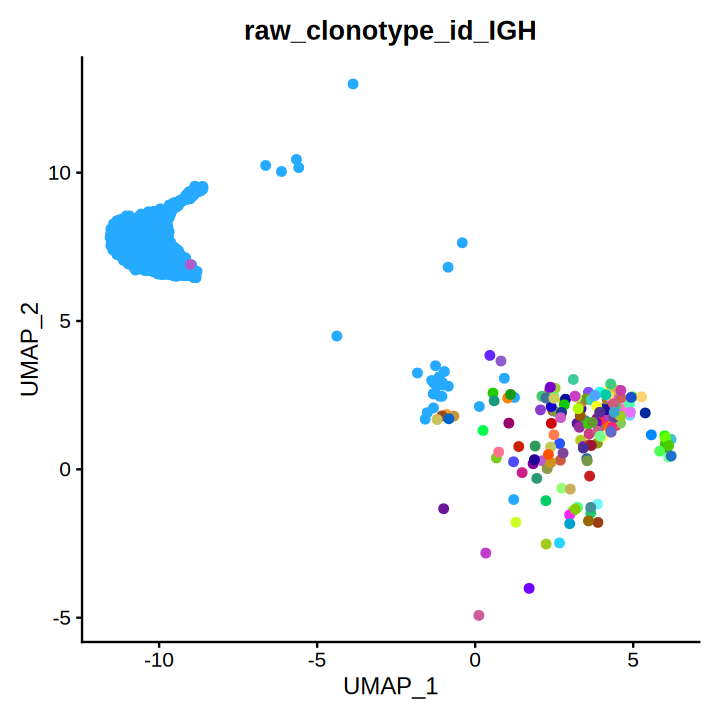

In [265]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [266]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALk3postplasma")
oneplasma

An object of class Seurat 
36601 features across 443 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [267]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/YCS3-5/YCS3-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/YCS3-5/YCS3-5/outs/consensus_annotations.csv")

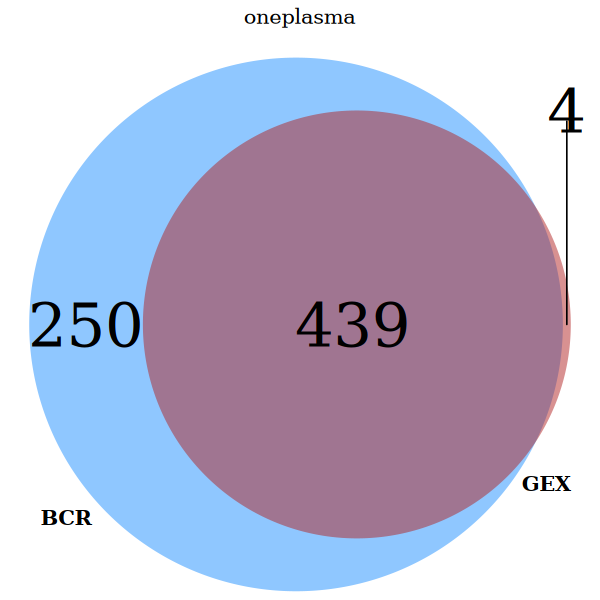

In [268]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALk3postplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [269]:
unlabeled24<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 68. Clonotype assignment and repertoire analysis


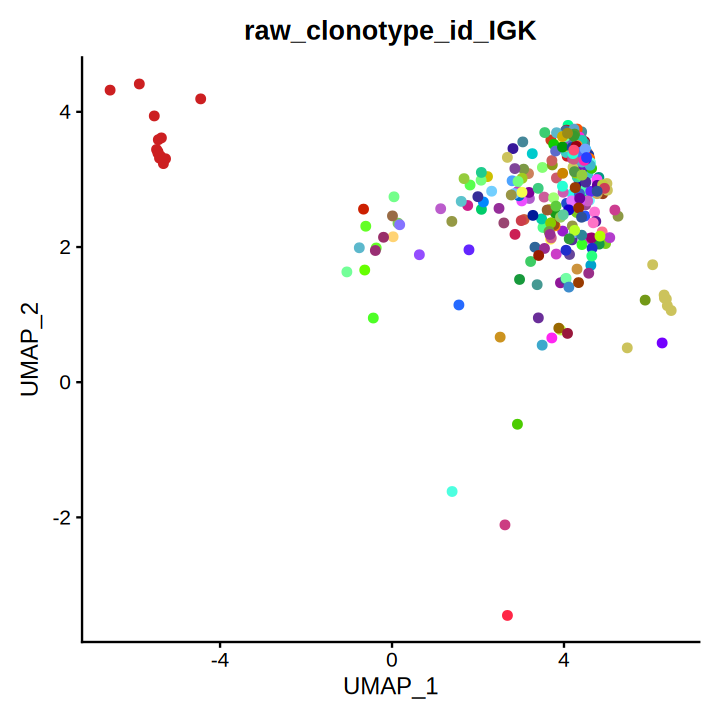

In [270]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredK <- oneplasmafilteredK[oneplasmafilteredK$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [271]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGK','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGK'
wideclone$'raw_clonotype_id_IGK'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

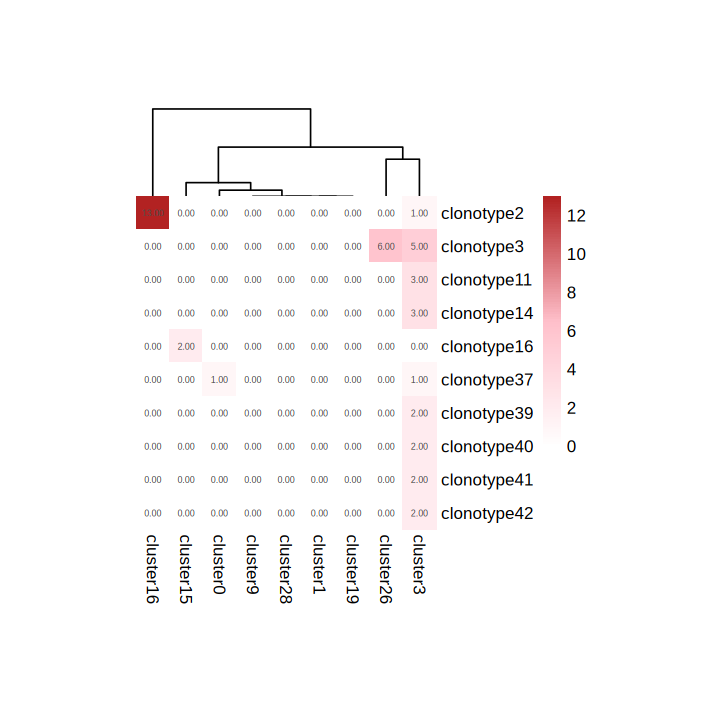

In [272]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta24<-oneplasmafilteredK[which(oneplasmafilteredK$'raw_clonotype_id_IGK'%in% c('clonotype2')),]
meta24$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 69. Clonotype assignment and repertoire analysis


In [273]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype2')),]
meta24$'raw_clonotype_id_IGK'<-gsub('clonotype2','ALk3_IGKV1-33',meta24$'raw_clonotype_id_IGK')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
3,clonotype2,clonotype2_consensus1,691,IGH,IGHV3-7,,IGHJ5,IGHG1,true,true,⋯,232,289,289,307,307,421,421,478,478,509
4,clonotype2,clonotype2_consensus2,555,IGK,IGKV1-33,,IGKJ3,IGKC,true,true,⋯,199,244,244,265,265,358,358,391,391,419


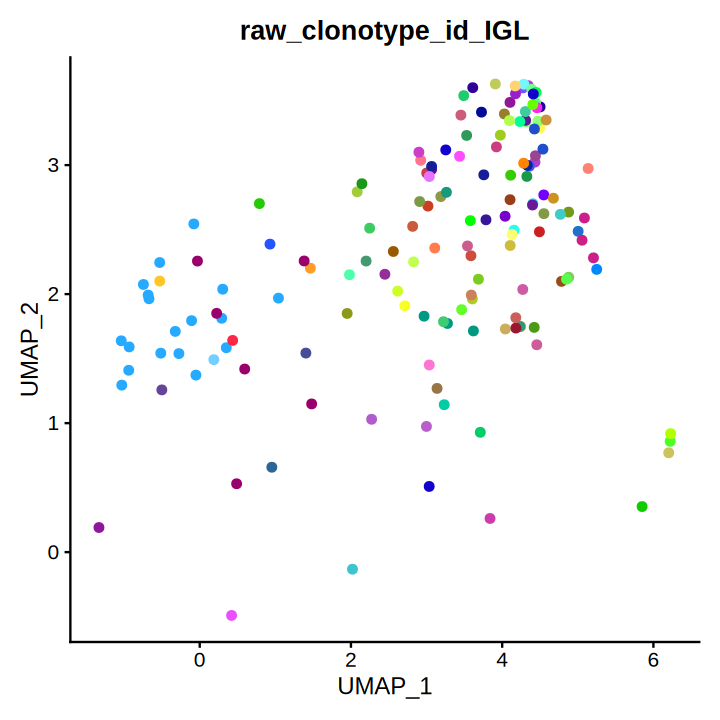

In [274]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

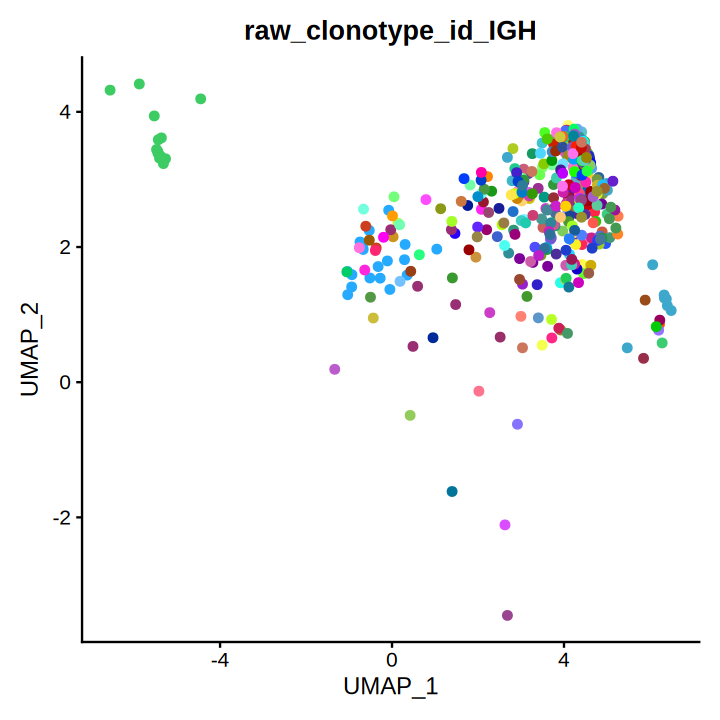

In [275]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [276]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl5preplasma")
oneplasma

An object of class Seurat 
36601 features across 10404 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [277]:
oneplasmafiltered <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LX5-5-b/LX5-5-b/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LX5-5-b/LX5-5-b/outs/consensus_annotations.csv")

## 70. Clonotype assignment and repertoire analysis


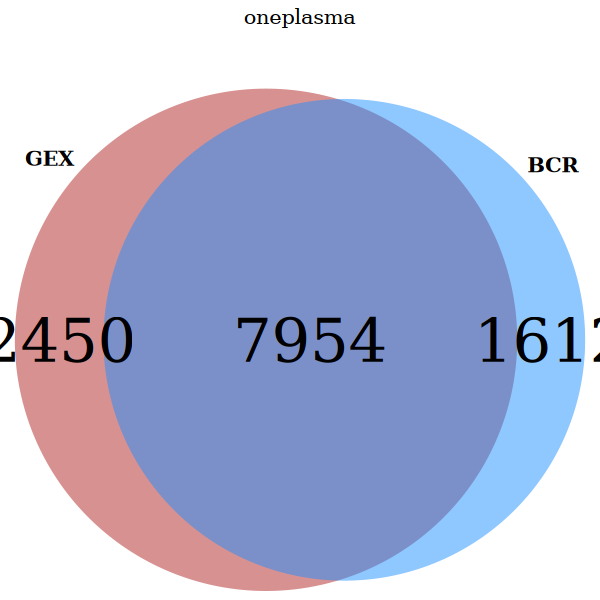

In [278]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl5preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [279]:
unlabeled25<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

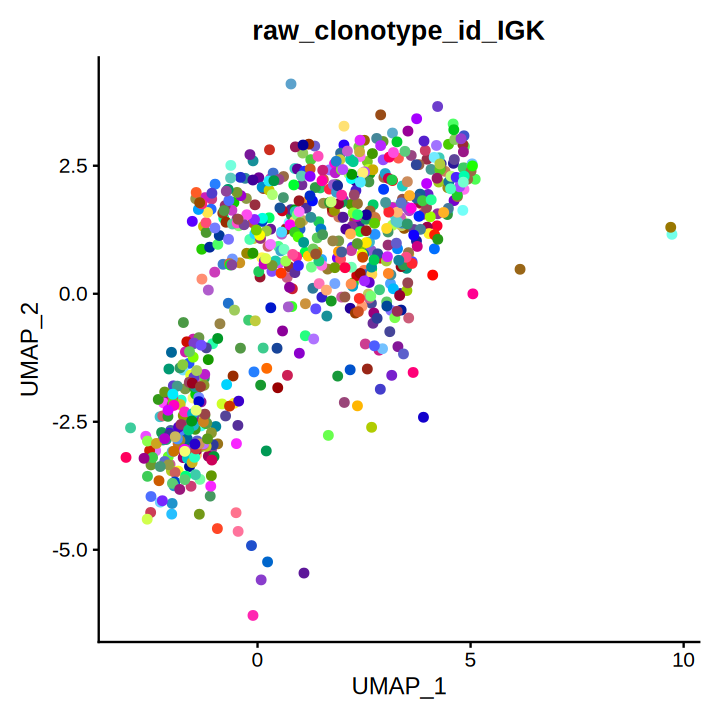

In [280]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 71. Clonotype assignment and repertoire analysis


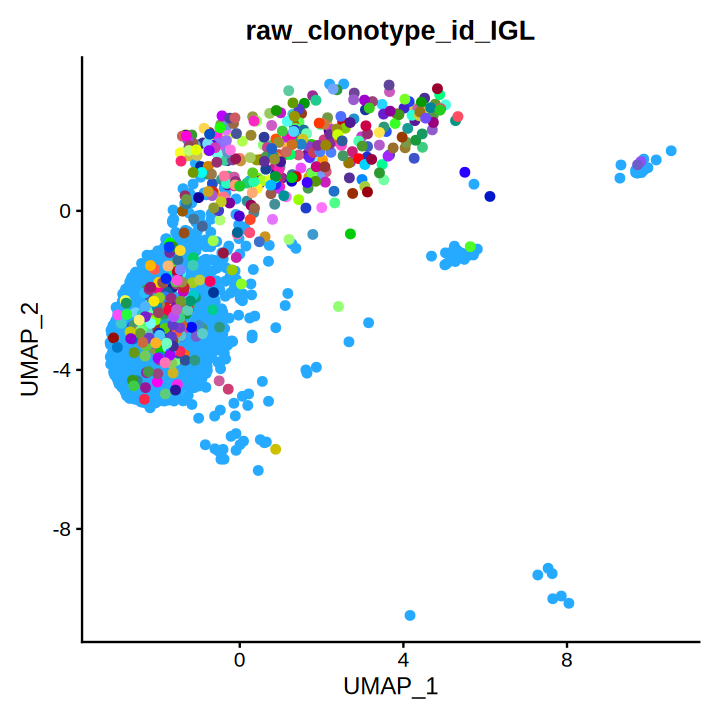

In [281]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 732,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [282]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

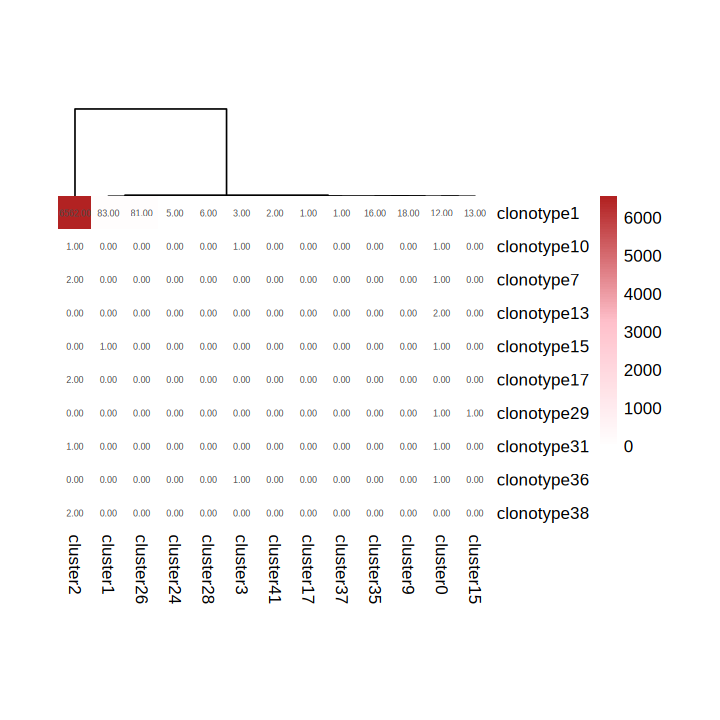

In [283]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=20,cellheight=20)
meta25<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta25$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [284]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta25$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl5_IGLV6-57',meta25$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,685,IGL,IGLV6-57,,IGLJ3,IGLC2,true,true,⋯,248,293,293,314,314,413,413,446,446,474


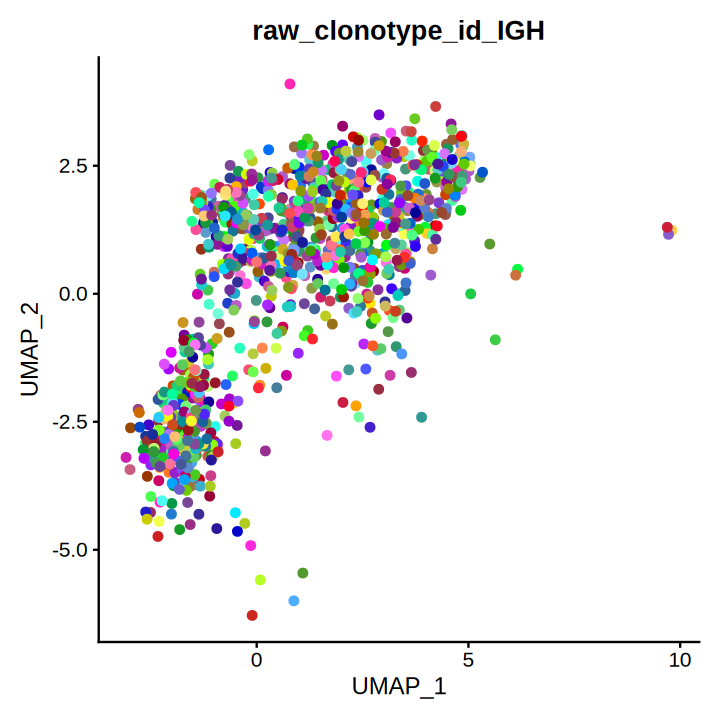

In [285]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1056,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 72. Load input data


In [286]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl9preplasma")
oneplasma

An object of class Seurat 
36601 features across 7814 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [287]:
oneplasmafiltered <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LCW-5-b/LCW-5-b/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../ANNO_XS01KF2024040123_PM-XS01KF2024040123-41/Cleandata/LCW-5-b/LCW-5-b/outs/consensus_annotations.csv")

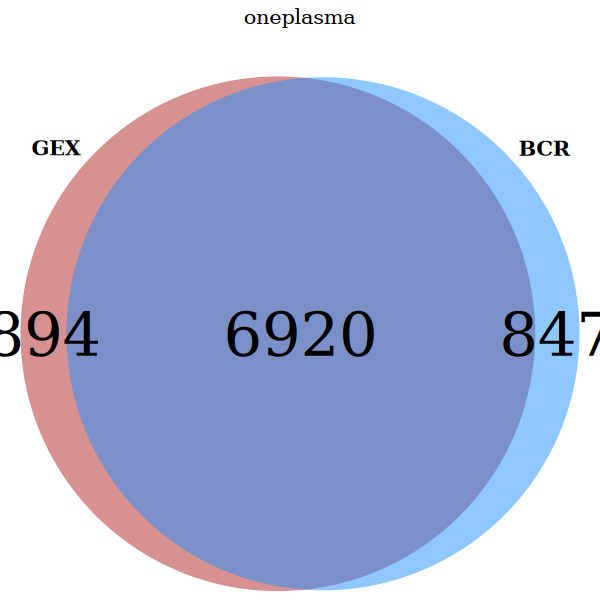

In [288]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl9preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 73. Clonotype assignment and repertoire analysis


In [289]:
unlabeled26<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

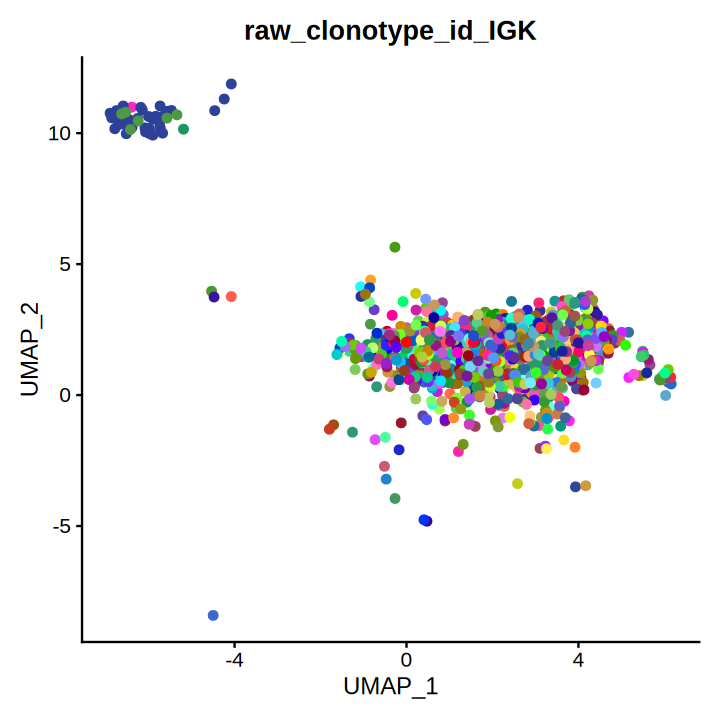

In [290]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1309,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

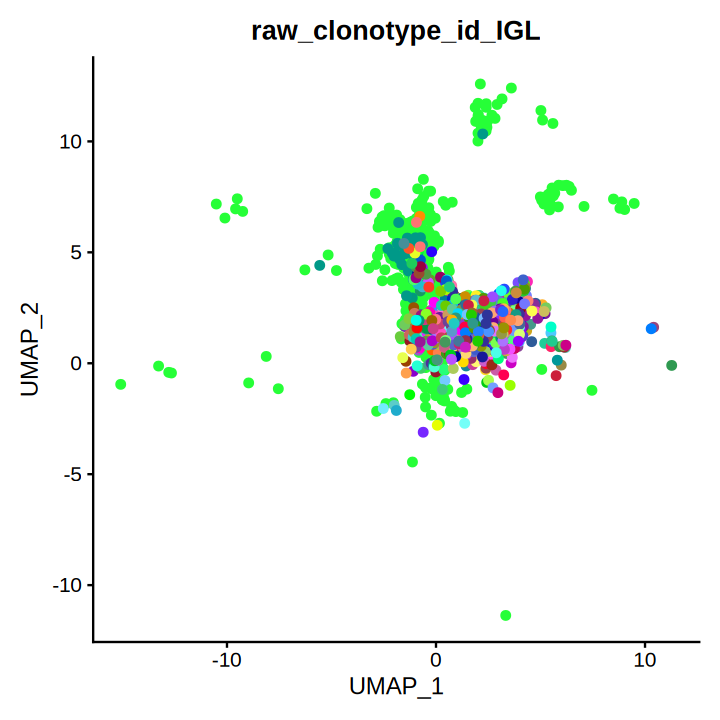

In [291]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1195,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [292]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

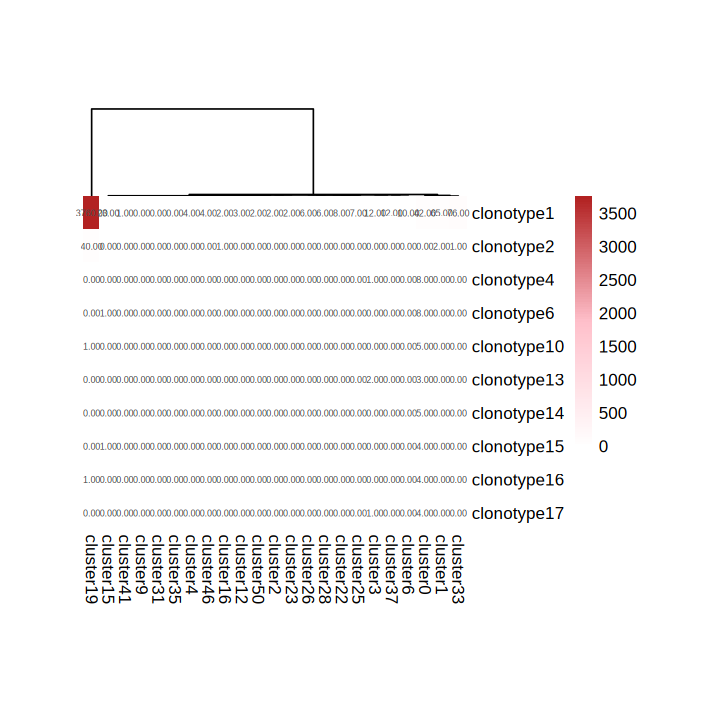

In [293]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta26<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype2')),]
meta26$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 74. Clonotype assignment and repertoire analysis


In [294]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta26$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl9_IGLV2-14_1',meta26$'raw_clonotype_id_IGL')
meta26$'raw_clonotype_id_IGL'<-gsub('clonotype2','ALl9_IGLV2-14_2',meta26$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,784,IGL,IGLV2-14,,IGLJ2,IGLC2,true,true,⋯,347,392,392,413,413,506,506,545,545,573
2,clonotype2,clonotype2_consensus1,726,IGH,IGHV4-59,IGHD6-19,IGHJ4,IGHA1,true,true,⋯,298,355,355,370,370,484,484,535,535,566
3,clonotype2,clonotype2_consensus2,685,IGL,IGLV2-14,,IGLJ2,IGLC2,true,true,⋯,248,293,293,314,314,407,407,446,446,474


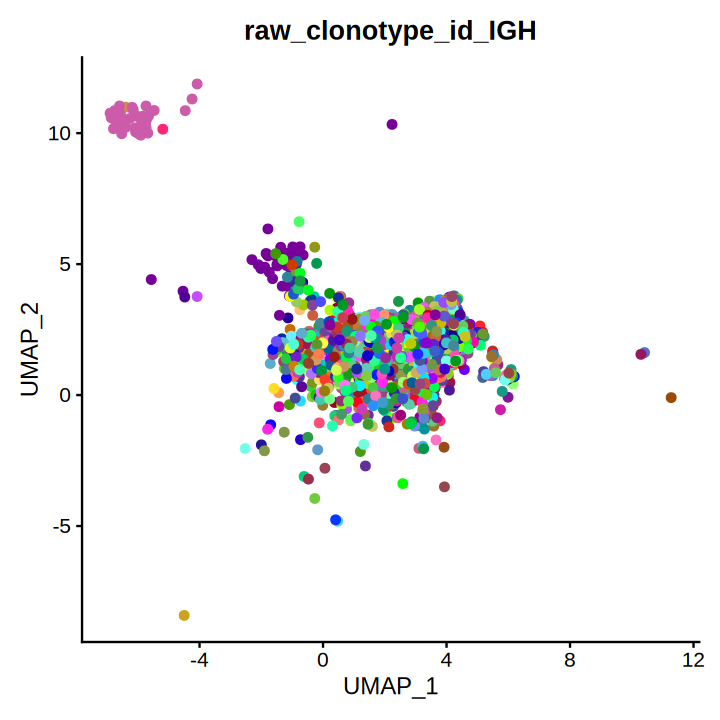

In [295]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2352,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [296]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl6preplasma")
oneplasma

An object of class Seurat 
36601 features across 6508 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 75. Load input data


In [297]:
oneplasmafiltered <- read.csv( file= "../disk1/sc241227/BCR/Cleandata/wjz-5/wjz-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc241227/BCR/Cleandata/wjz-5/wjz-5/outs/consensus_annotations.csv")

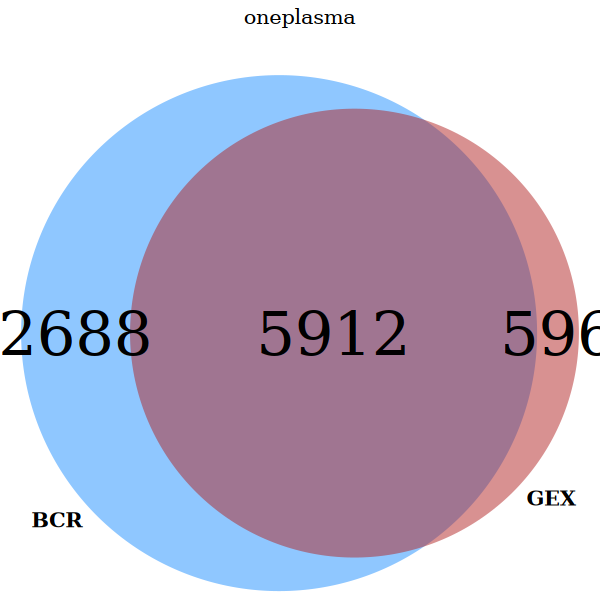

In [298]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl6preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [299]:
unlabeled27<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

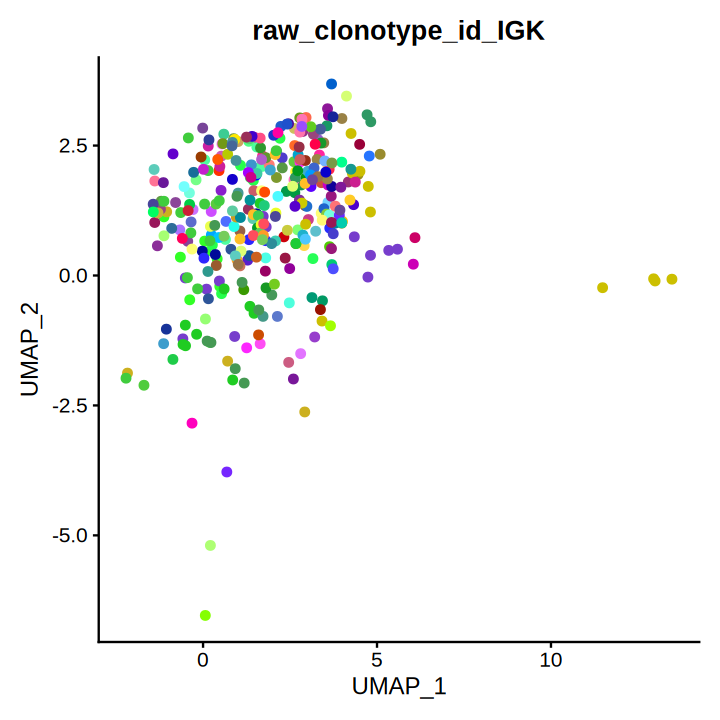

In [300]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

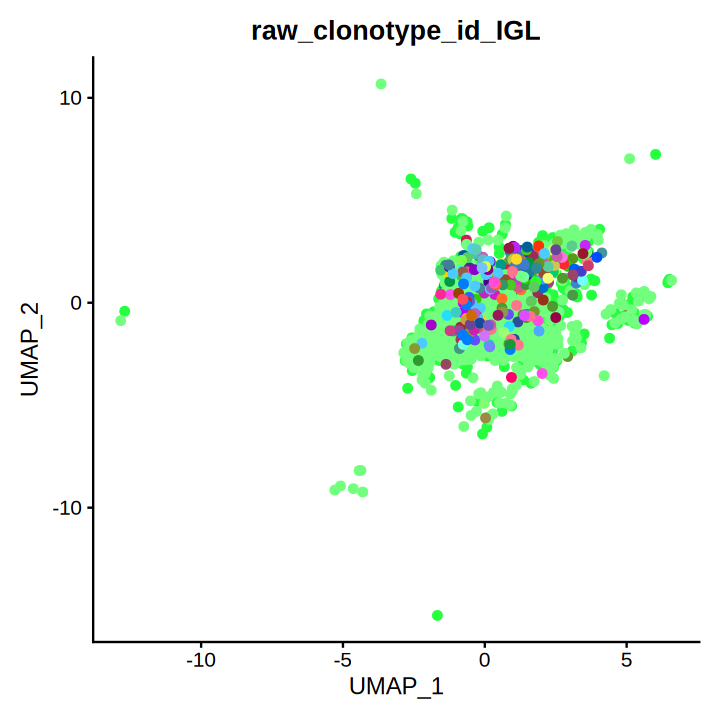

In [301]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 76. Clonotype assignment and repertoire analysis


In [302]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

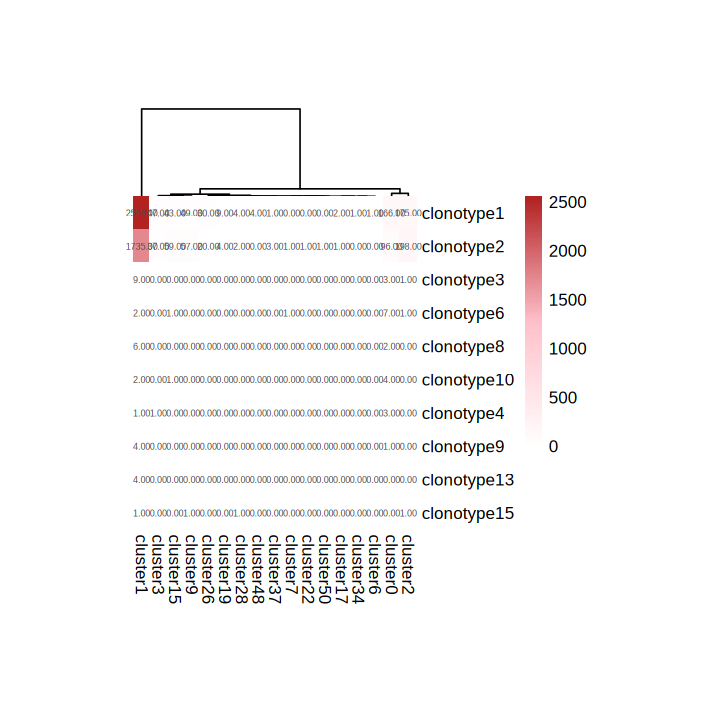

In [303]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta27<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype2')),]
meta27$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [304]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2')),]
meta27$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl6_IGLV3-1_1',meta27$'raw_clonotype_id_IGL')
meta27$'raw_clonotype_id_IGL'<-gsub('clonotype2','ALl6_IGLV3-1_2',meta27$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,772,IGL,IGLV3-1,,IGLJ2,IGLC2,true,true,⋯,341,386,386,407,407,500,500,533,533,561
2,clonotype2,clonotype2_consensus1,692,IGH,IGHV1-46,,IGHJ6,IGHG1,true,true,⋯,215,272,272,290,290,404,404,479,479,510
3,clonotype2,clonotype2_consensus2,479,IGH,IGHV4-34,,IGHJ4,IGHA1,true,true,⋯,198,255,255,270,270,384,384,432,432,463
4,clonotype2,clonotype2_consensus3,670,IGH,IGHV3-43,,IGHJ6,IGHA1,true,true,⋯,233,290,290,308,308,422,422,479,479,510
5,clonotype2,clonotype2_consensus4,562,IGK,IGKV3-11,,IGKJ2,IGKC,true,true,⋯,209,254,254,275,275,368,368,398,398,426
6,clonotype2,clonotype2_consensus5,571,IGK,IGKV3-11,,IGKJ4,IGKC,true,true,⋯,209,254,254,275,275,368,368,407,407,435
7,clonotype2,clonotype2_consensus6,552,IGK,IGKV1D-39,,IGKJ1,IGKC,true,true,⋯,196,241,241,262,262,355,355,388,388,416
8,clonotype2,clonotype2_consensus7,639,IGL,IGLV3-1,,IGLJ2,IGLC2,true,true,⋯,208,253,253,274,274,367,367,400,400,428


## 77. Clonotype assignment and repertoire analysis


In [305]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl4preplasma")
oneplasma

An object of class Seurat 
36601 features across 1335 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [306]:
oneplasmafiltered <- read.csv( file= "../disk1/sc241227/BCR/Cleandata/Lfy-5/Lfy-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc241227/BCR/Cleandata/Lfy-5/Lfy-5/outs/consensus_annotations.csv")

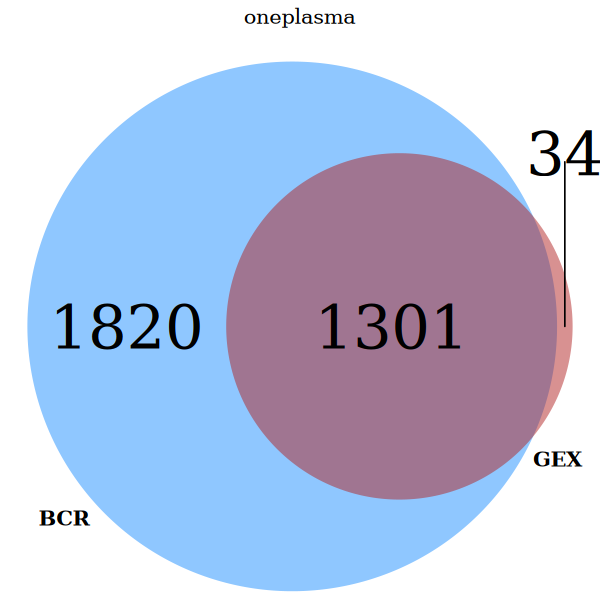

In [307]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl4preplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [308]:
unlabeled28<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

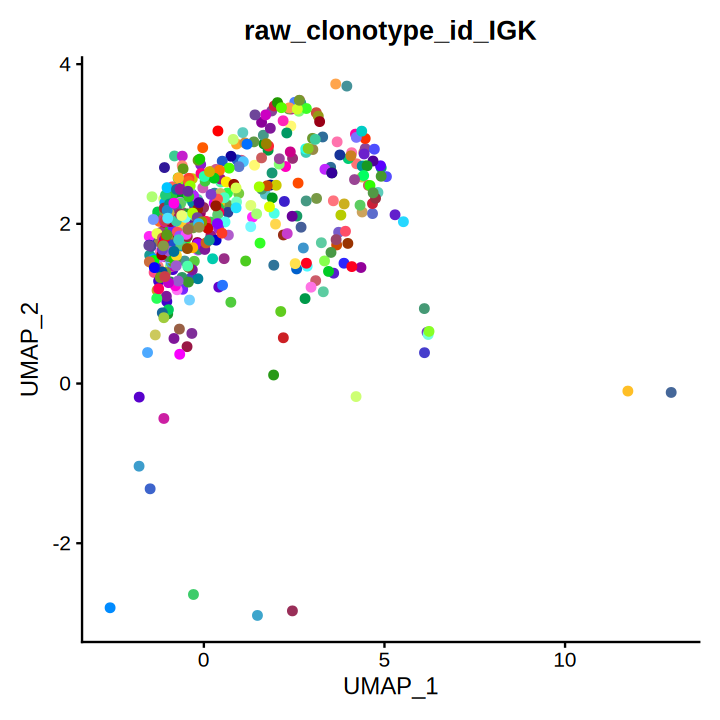

In [309]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 78. Clonotype assignment and repertoire analysis


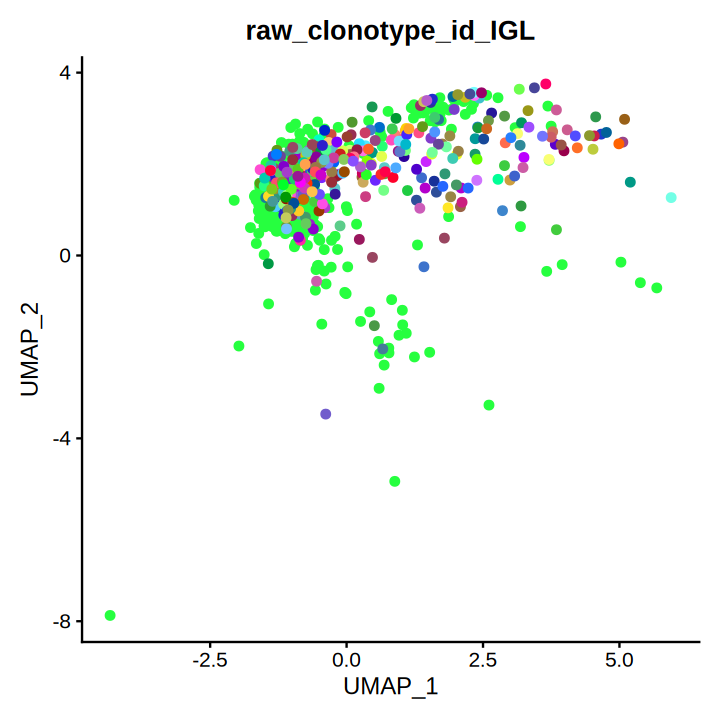

In [310]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [311]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

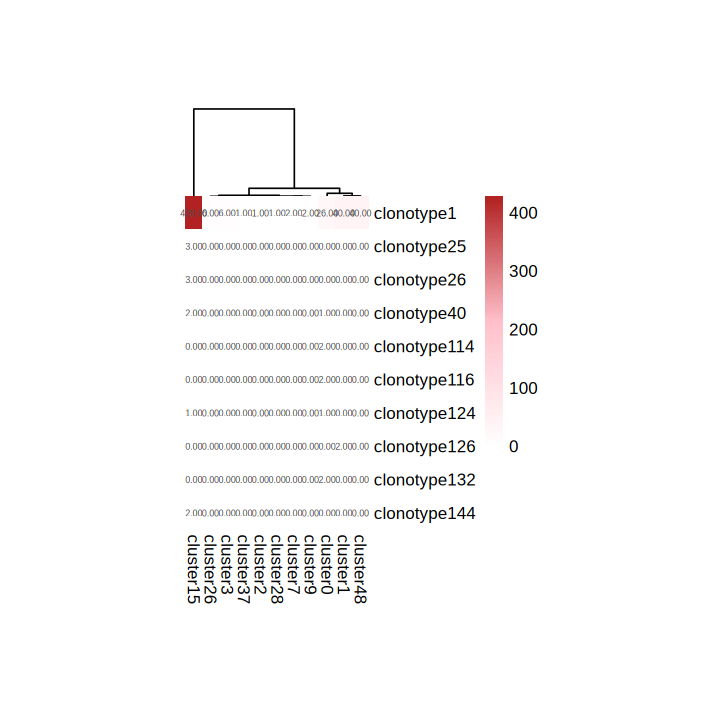

In [312]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta28<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta28$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 79. Clonotype assignment and repertoire analysis


In [313]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta28$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl4_IGLV3-1',meta28$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,746,IGL,IGLV3-1,,IGLJ2,IGLC2,true,true,⋯,315,360,360,381,381,474,474,507,507,535


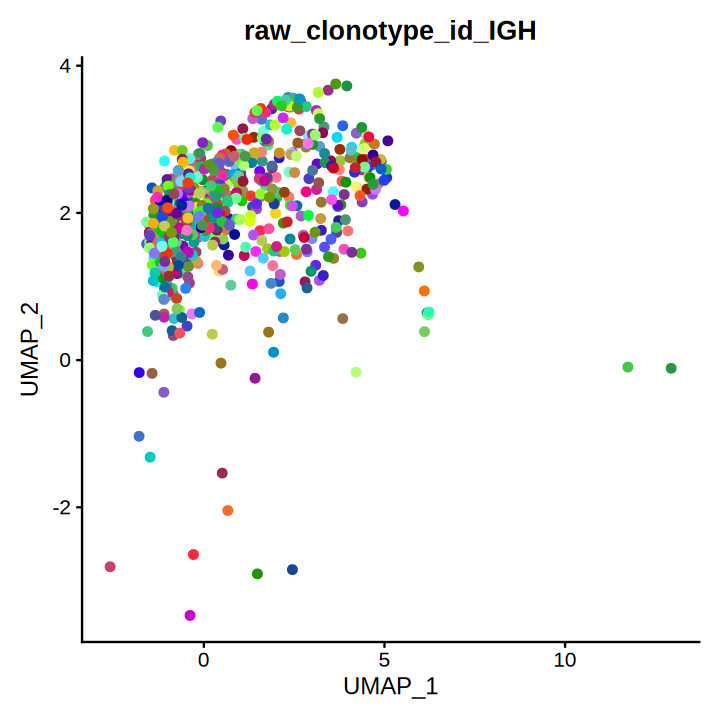

In [314]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [315]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "N1plasma")
oneplasma

An object of class Seurat 
36601 features across 9541 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [316]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/wdq-5/wdq-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/wdq-5/wdq-5/outs/consensus_annotations.csv")

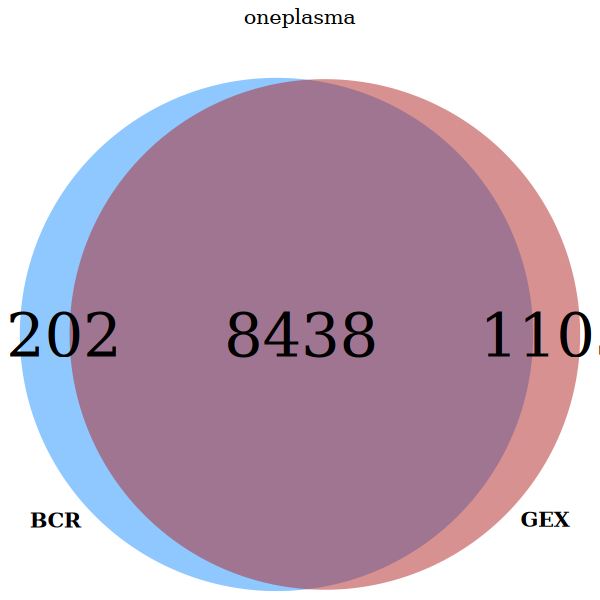

In [317]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('N1plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 80. Clonotype assignment and repertoire analysis


In [318]:
unlabeled29<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

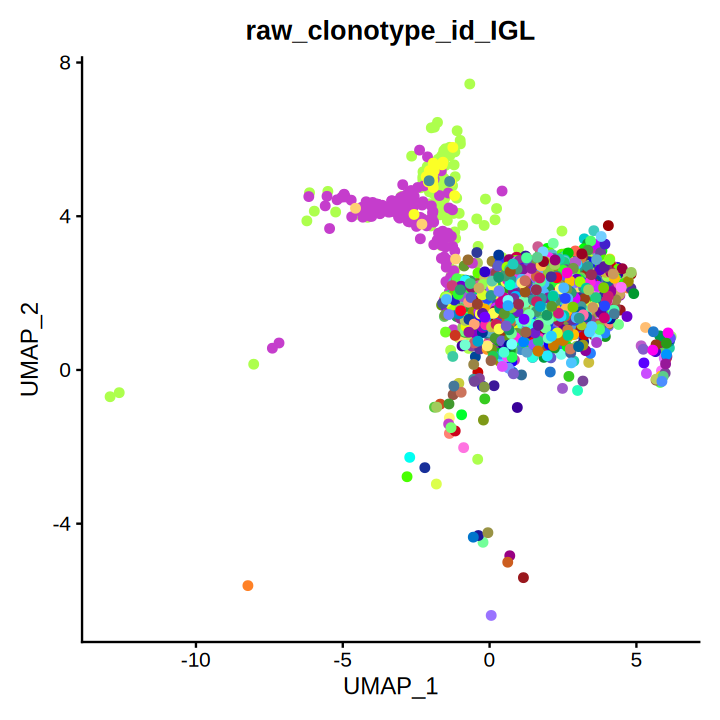

In [319]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2155,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [320]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 81. Clonotype assignment and repertoire analysis


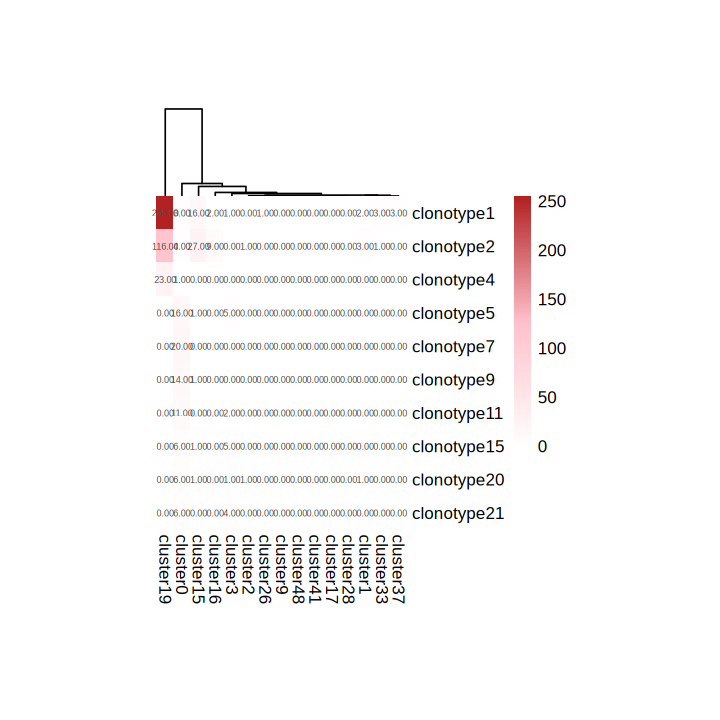

In [321]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta1<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype4')),]
meta1$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [322]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype4')),]
meta1$'raw_clonotype_id_IGL'<-gsub('clonotype1','N1_MGUS_IGLV1-44_1',meta1$'raw_clonotype_id_IGL')
meta1$'raw_clonotype_id_IGL'<-gsub('clonotype4','N1_MGUS_IGLV1-44_2',meta1$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,729,IGH,IGHV4-59,,IGHJ5,IGHA1,true,true,⋯,298,355,355,370,370,484,484,538,538,569
2,clonotype1,clonotype1_consensus2,713,IGL,IGLV1-44,,IGLJ2,IGLC3,true,true,⋯,276,321,321,342,342,435,435,474,474,502
7,clonotype4,clonotype4_consensus1,713,IGL,IGLV1-44,,IGLJ2,IGLC3,true,true,⋯,276,321,321,342,342,435,435,474,474,502


In [323]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "N2plasma")
oneplasma

An object of class Seurat 
36601 features across 6889 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [324]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/ZJY-5/ZJY-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/ZJY-5/ZJY-5/outs/consensus_annotations.csv")

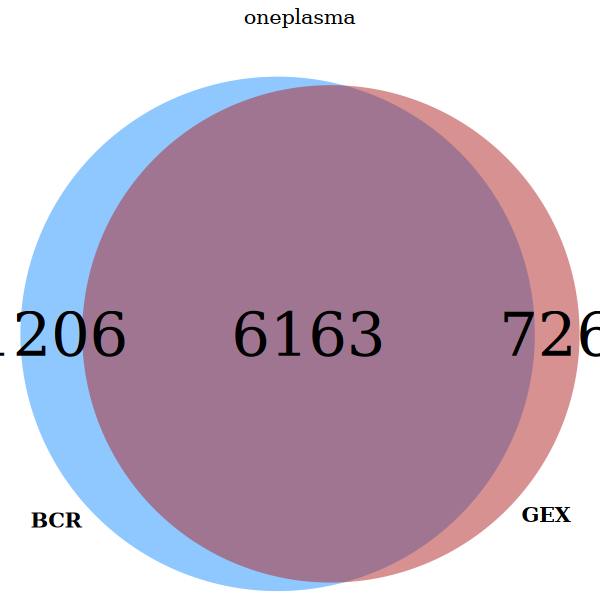

In [325]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('N2plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 82. Clonotype assignment and repertoire analysis


In [326]:
unlabeled30<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

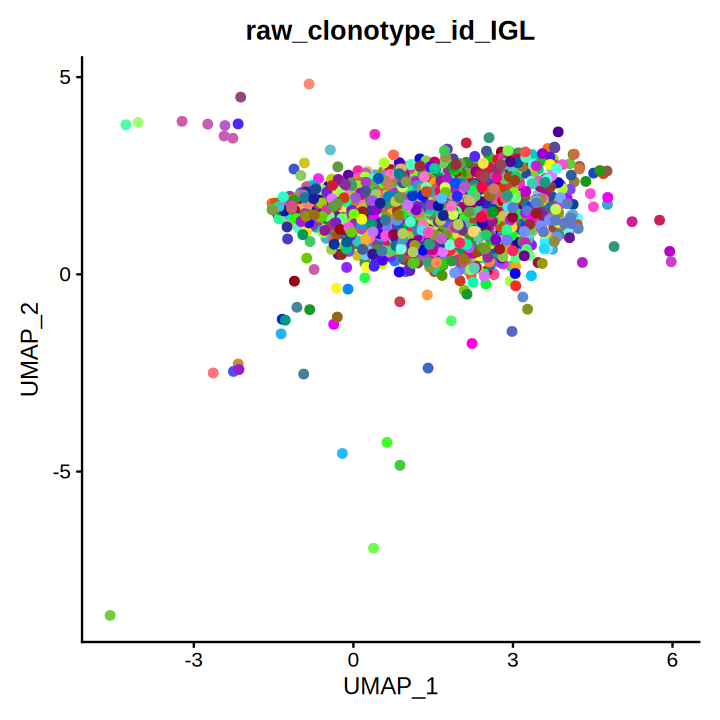

In [327]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2155,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [328]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 83. Load input data


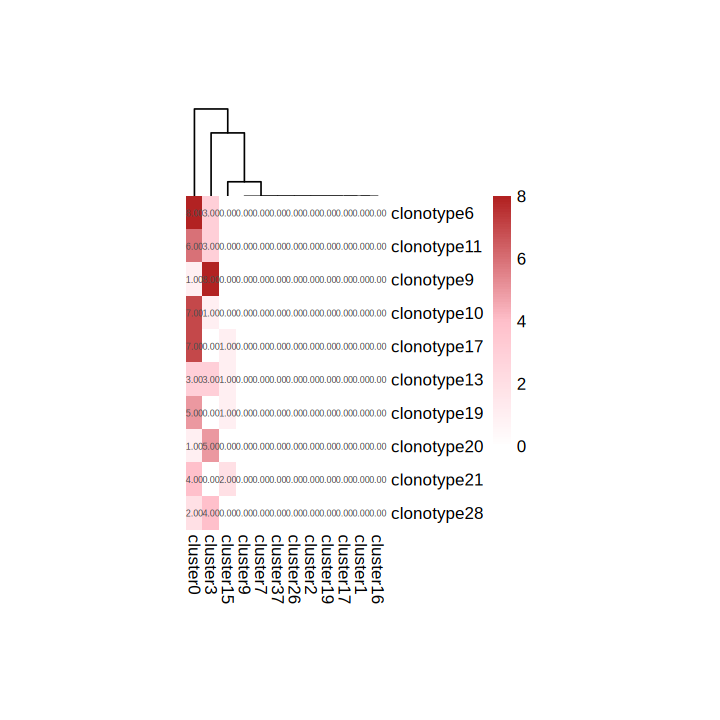

In [329]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)

In [330]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl9postplasma")
oneplasma

An object of class Seurat 
36601 features across 508 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [331]:
oneplasmafiltered <- read.csv( file= "../BCR/sc0413/lcwc3-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc0413/lcwc3-5/outs/consensus_annotations.csv")

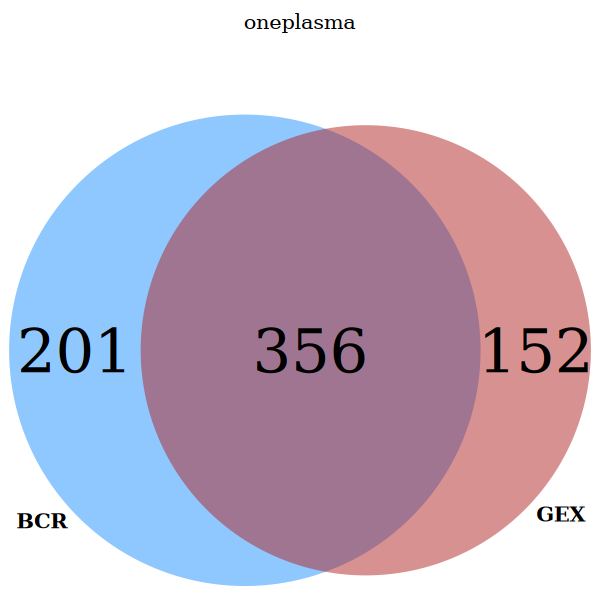

In [332]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl9postplasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [333]:
unlabeled31<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 84. Clonotype assignment and repertoire analysis


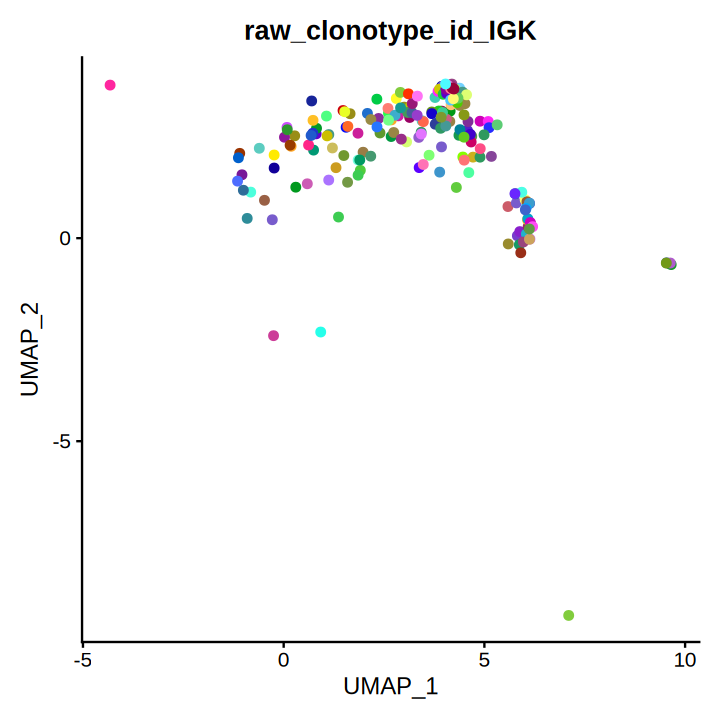

In [334]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

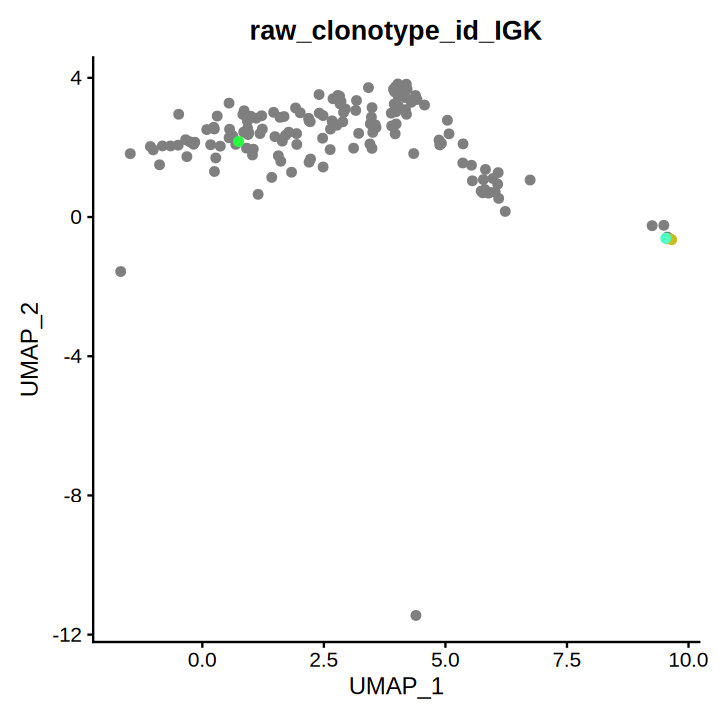

In [335]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [336]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 85. Load input data


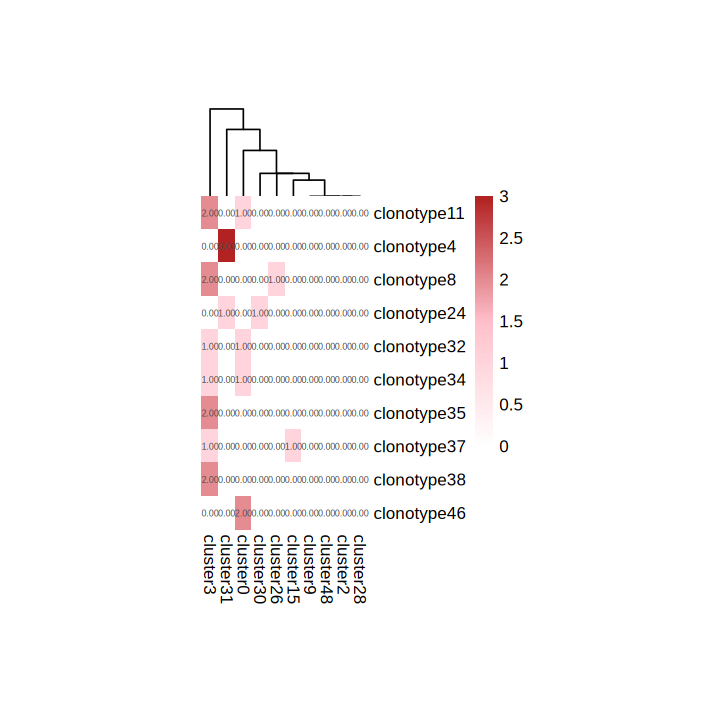

In [337]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)

In [338]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl16plasma")
oneplasma

An object of class Seurat 
36601 features across 4410 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [339]:
oneplasmafiltered <- read.csv( file= "../disk1/sc240930/BCR/LHQ-5/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc240930/BCR/LHQ-5/consensus_annotations.csv")

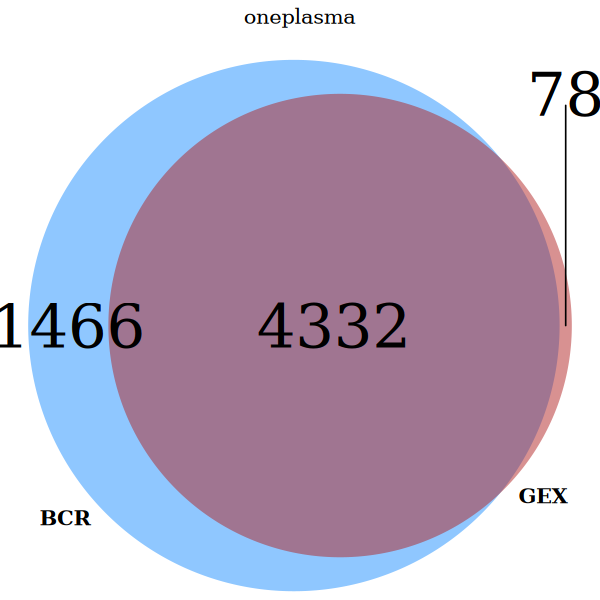

In [340]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl16plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [341]:
unlabeled32<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 86. Clonotype assignment and repertoire analysis


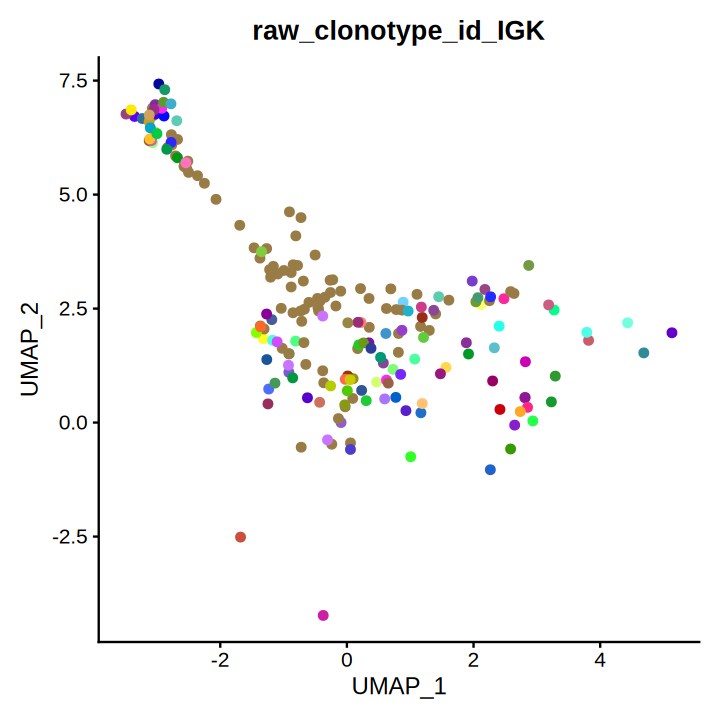

In [342]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

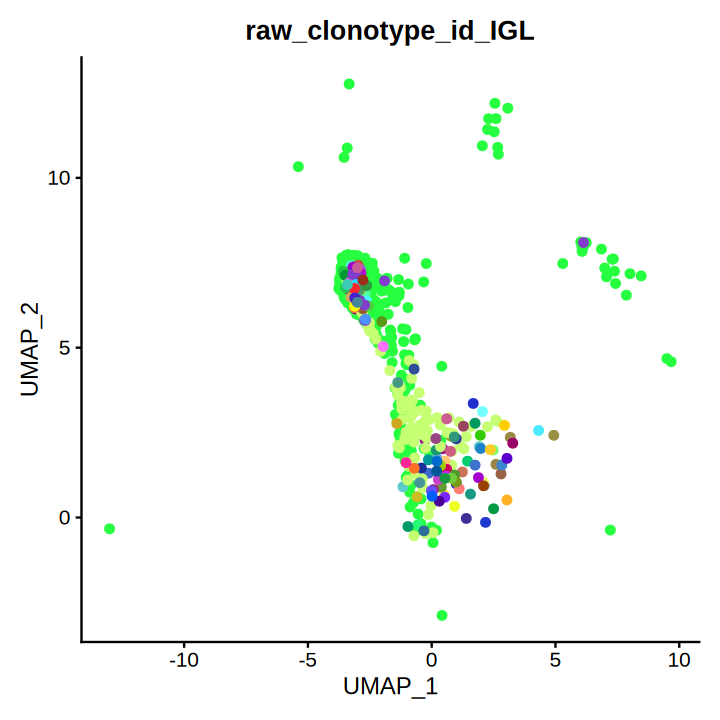

In [343]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [344]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 87. Clonotype assignment and repertoire analysis


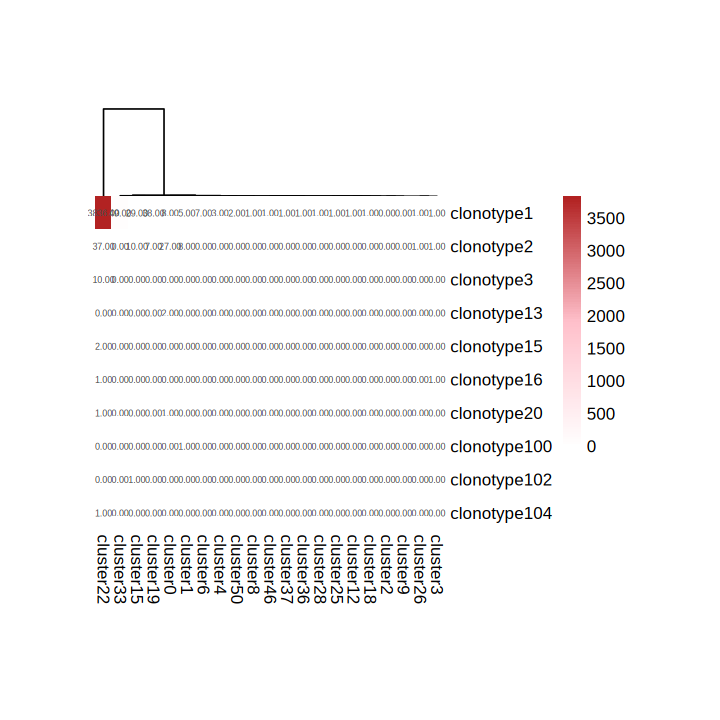

In [345]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta29<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1','clonotype2','clonotype3')),]
meta29$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [346]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1','clonotype2','clonotype3')),]
meta29$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl16_IGLV3-1_1',meta29$'raw_clonotype_id_IGL')
meta29$'raw_clonotype_id_IGL'<-gsub('clonotype2','ALl16_IGLV3-1_2',meta29$'raw_clonotype_id_IGL')
meta29$'raw_clonotype_id_IGL'<-gsub('clonotype3','ALl16_IGLV3-1_3',meta29$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,882,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,451,496,496,517,517,610,610,643,643,671
2,clonotype2,clonotype2_consensus1,657,IGH,IGHV6-1,,IGHJ5,IGHA1,true,true,⋯,214,271,271,292,292,406,406,466,466,497
3,clonotype2,clonotype2_consensus2,621,IGK,IGKV3-15,,IGKJ3,IGKC,true,true,⋯,259,304,304,325,325,418,418,457,457,485
4,clonotype2,clonotype2_consensus3,763,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,332,377,377,398,398,491,491,524,524,552
5,clonotype3,clonotype3_consensus1,747,IGL,IGLV3-1,,IGLJ1,IGLC1,true,true,⋯,316,361,361,382,382,475,475,508,508,536


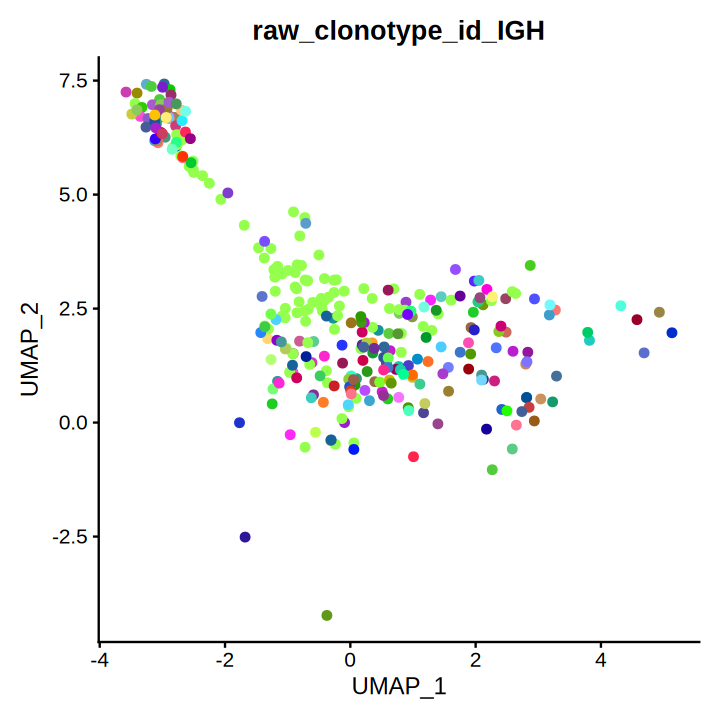

In [347]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [348]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl18plasma")
oneplasma

An object of class Seurat 
36601 features across 270 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [349]:
oneplasmafiltered <- read.csv( file= "../disk1/sc240930/BCR/XFL-5/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc240930/BCR/XFL-5/consensus_annotations.csv")

## 88. Clonotype assignment and repertoire analysis


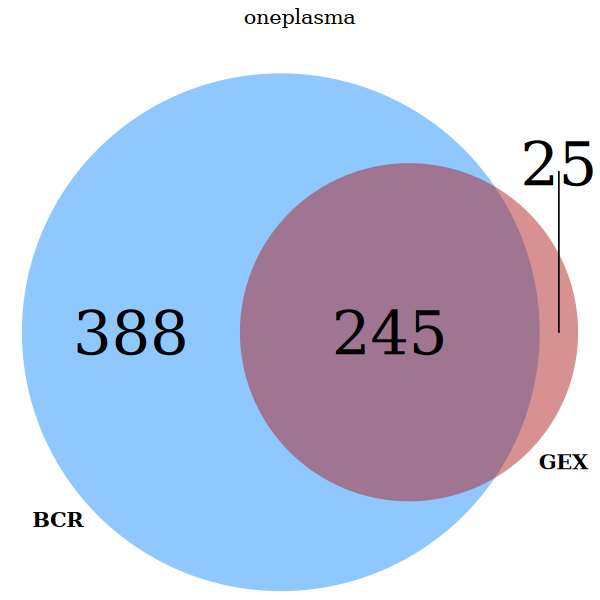

In [350]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl18plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [351]:
unlabeled33<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

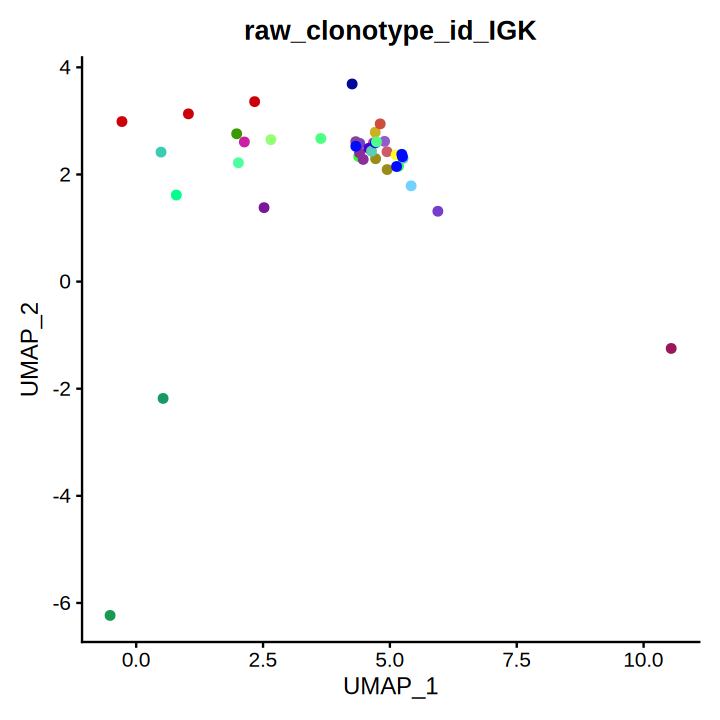

In [352]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 89. Clonotype assignment and repertoire analysis


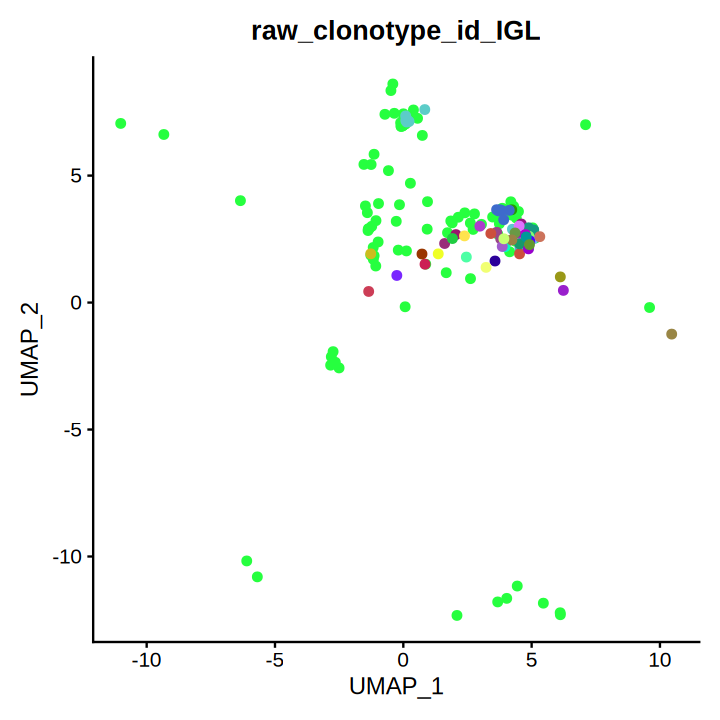

In [353]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [354]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

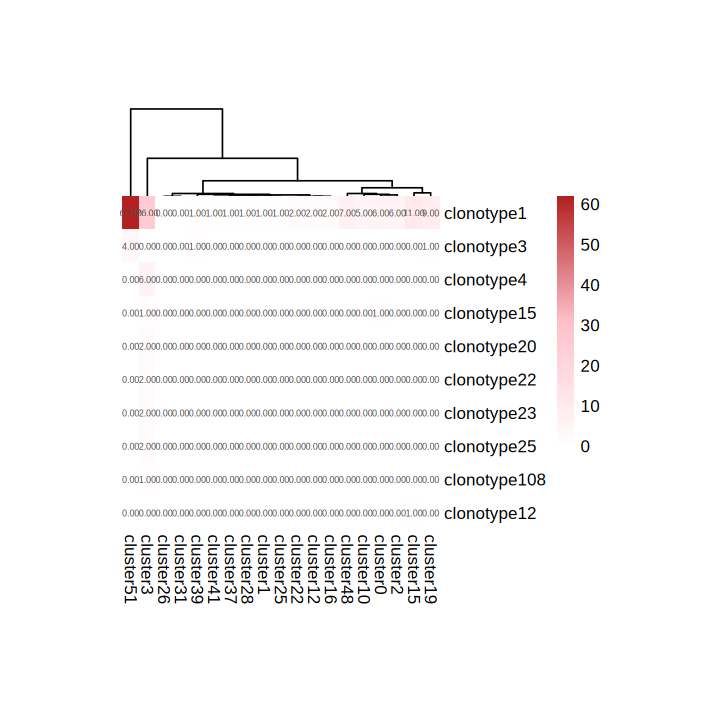

In [355]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta30<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta30$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [356]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta30$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl18_IGLV1-51',meta30$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,635,IGL,IGLV1-51,,IGLJ3,IGLC2,true,true,⋯,198,243,243,264,264,357,357,396,396,424


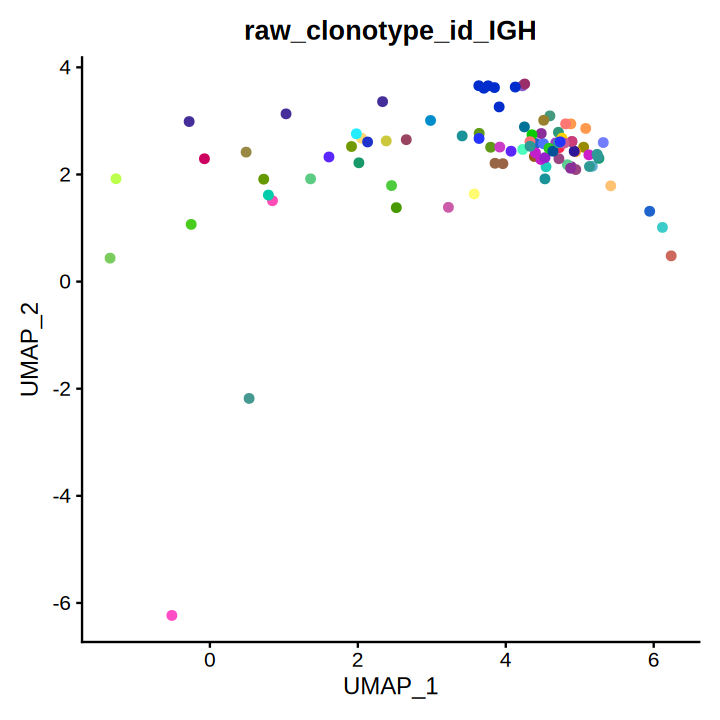

In [357]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 90. Load input data


In [358]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl19plasma")
oneplasma

An object of class Seurat 
36601 features across 2993 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [359]:
oneplasmafiltered <- read.csv( file= "../disk1/sc240930/BCR/ZRT-5/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc240930/BCR/ZRT-5/consensus_annotations.csv")

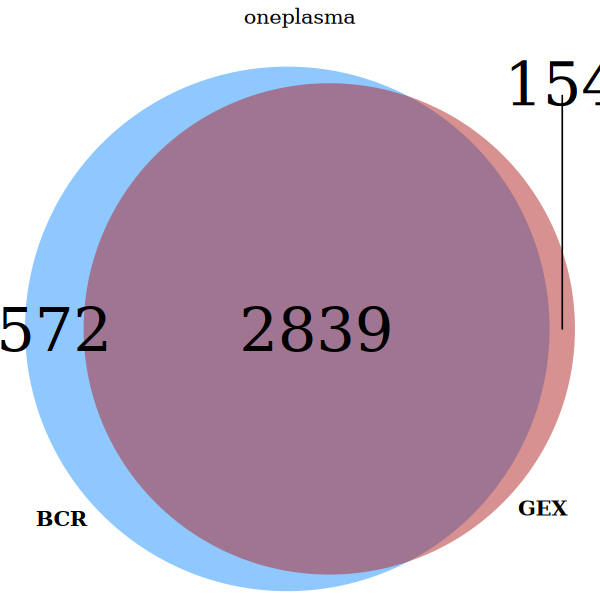

In [360]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl19plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

## 91. Clonotype assignment and repertoire analysis


In [361]:
unlabeled34<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

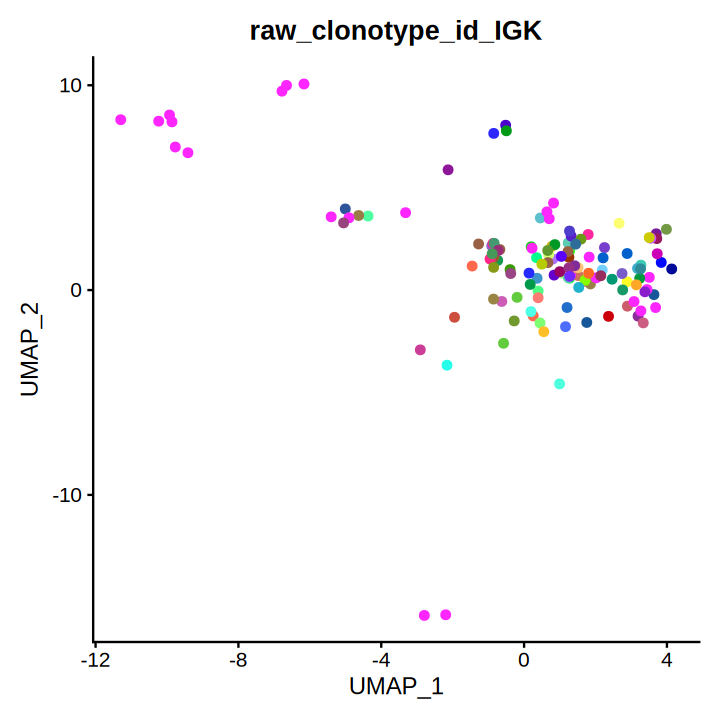

In [362]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

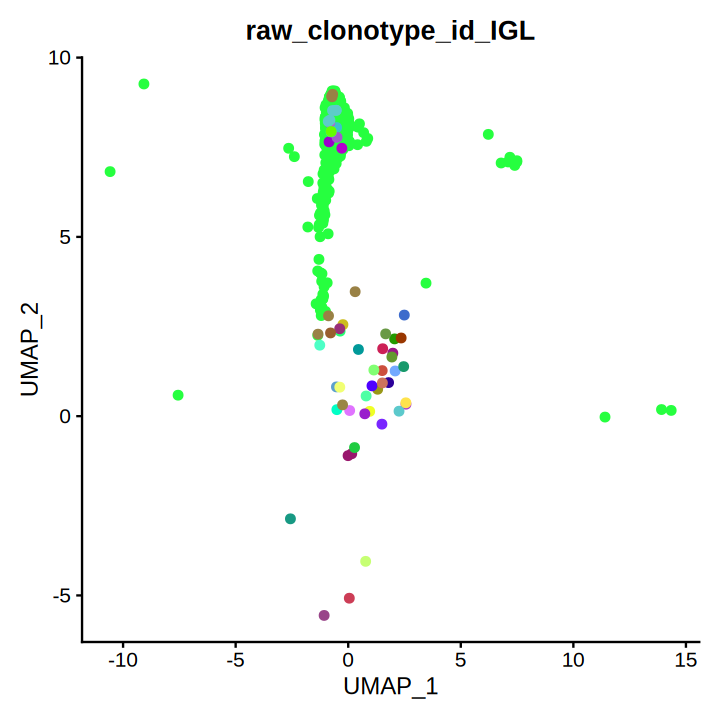

In [363]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [364]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

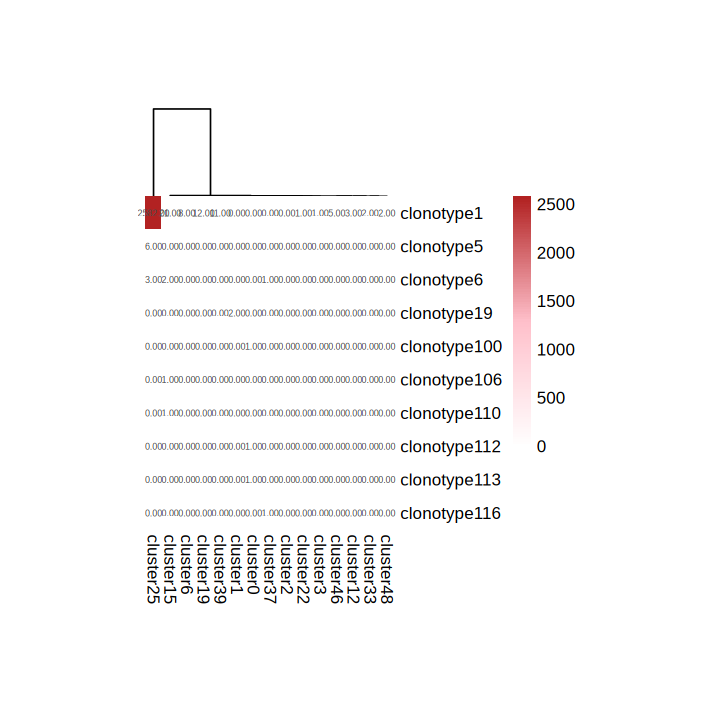

In [365]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta31<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta31$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

## 92. Clonotype assignment and repertoire analysis


In [366]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta31$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl19_IGLV1-44',meta31$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,646,IGL,IGLV1-44,,IGLJ3,IGLC2,true,true,⋯,209,254,254,275,275,368,368,407,407,435


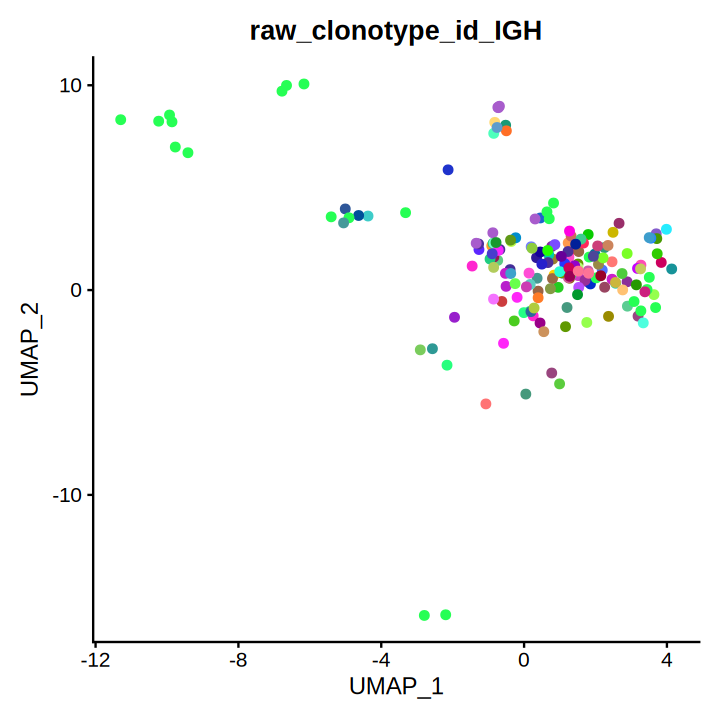

In [367]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [368]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl20plasma")
oneplasma

An object of class Seurat 
36601 features across 1086 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

## 93. Load input data


In [369]:
oneplasmafiltered <- read.csv( file= "../disk1/sc240930/BCR/FYD-5/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc240930/BCR/FYD-5/consensus_annotations.csv")

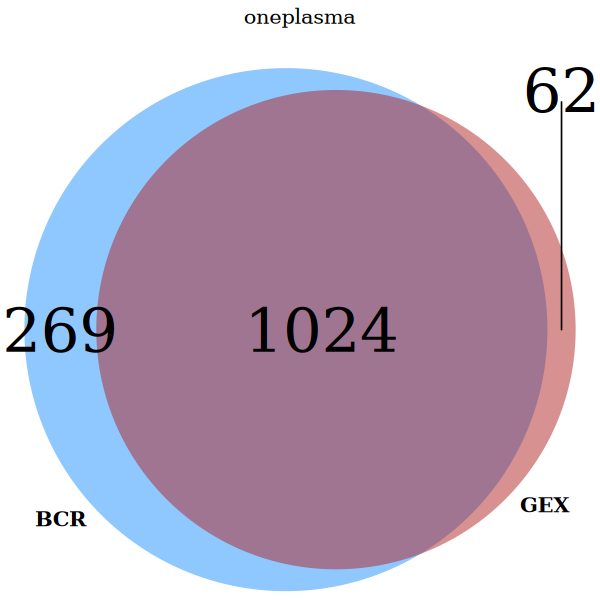

In [370]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl20plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [371]:
unlabeled35<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

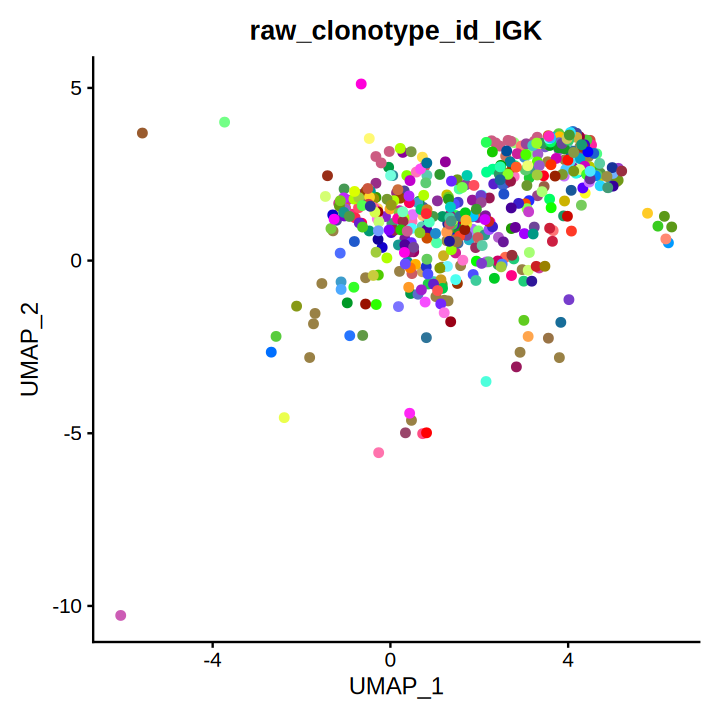

In [372]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

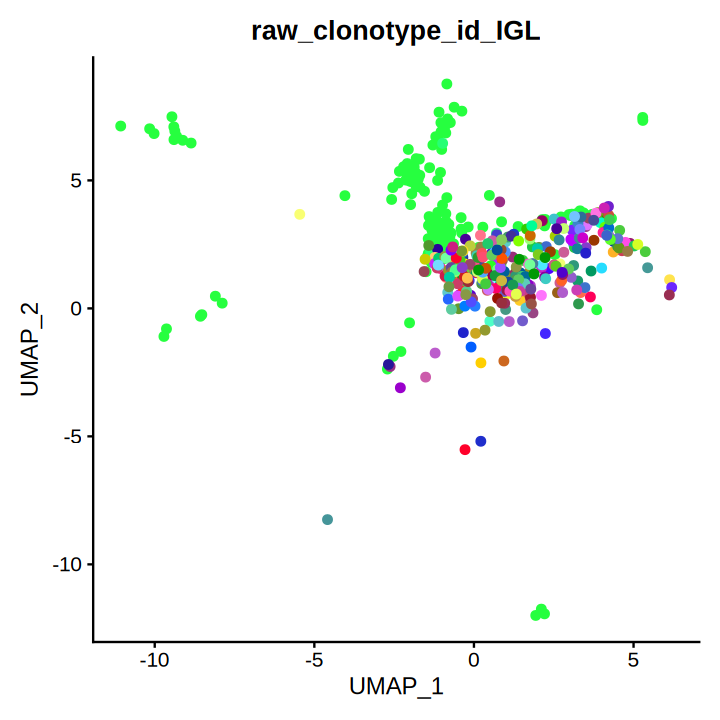

In [373]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 94. Clonotype assignment and repertoire analysis


In [374]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

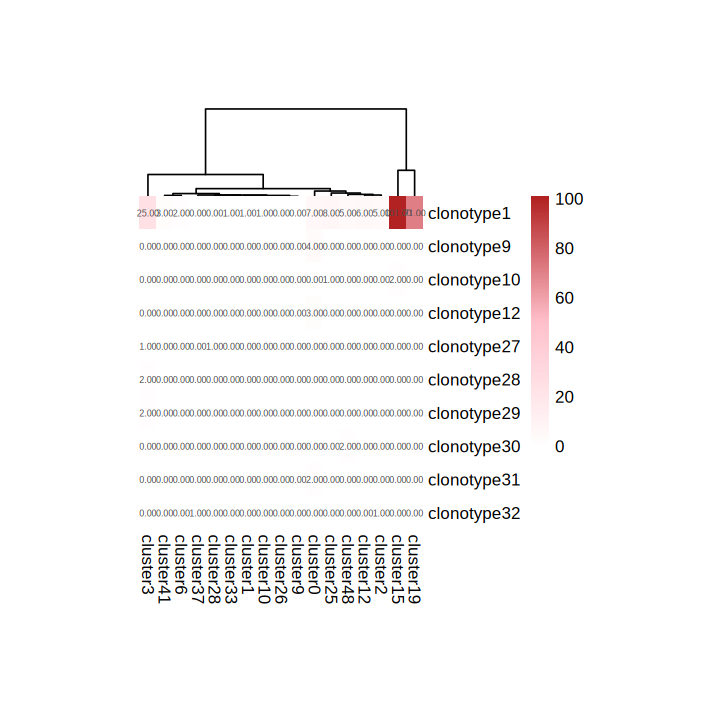

In [375]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta32<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta32$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [376]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta32$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl20_IGLV3-19',meta32$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,636,IGL,IGLV3-19,,IGLJ1,IGLC1,true,true,⋯,196,241,241,262,262,355,355,397,397,425


## 95. Clonotype assignment and repertoire analysis


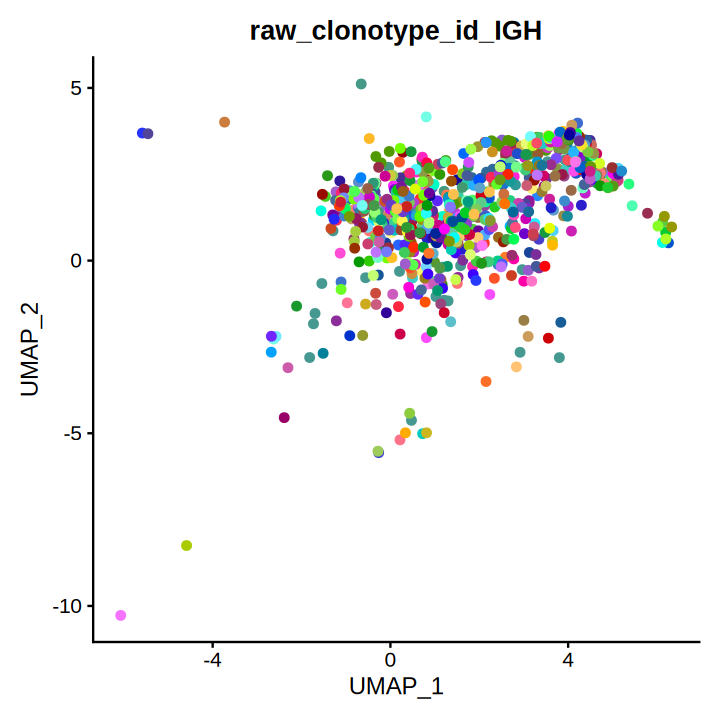

In [377]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [378]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl22plasma")
oneplasma

An object of class Seurat 
36601 features across 588 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [379]:
oneplasmafiltered <- read.csv( file= "../disk1/sc240930/BCR/YYH-5/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../disk1/sc240930/BCR/YYH-5/consensus_annotations.csv")

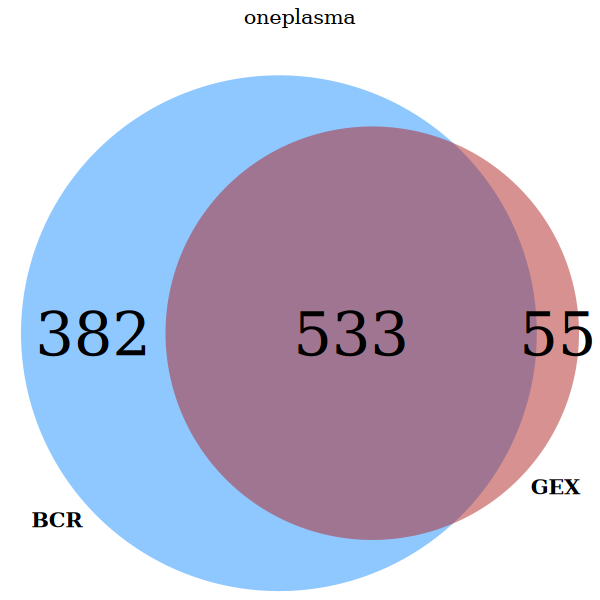

In [380]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl22plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [381]:
unlabeled36<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

## 96. Clonotype assignment and repertoire analysis


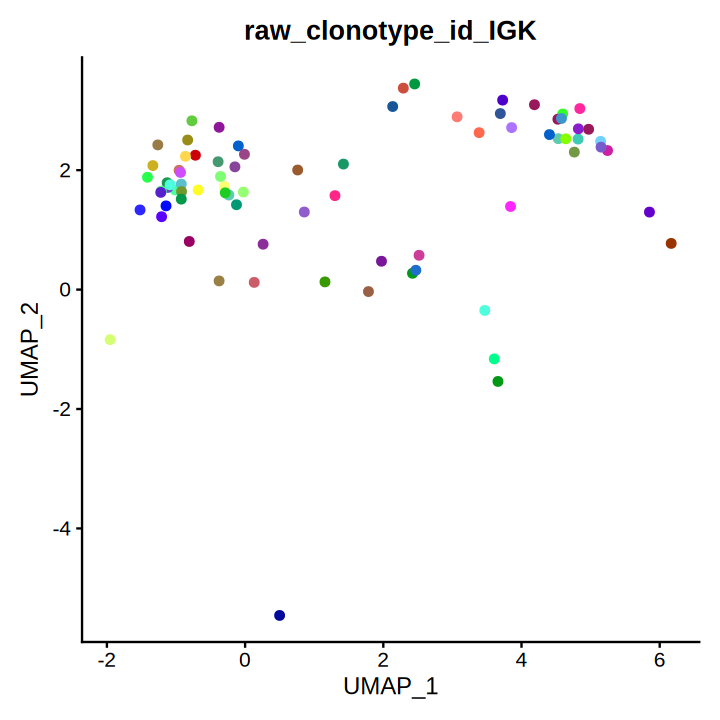

In [382]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

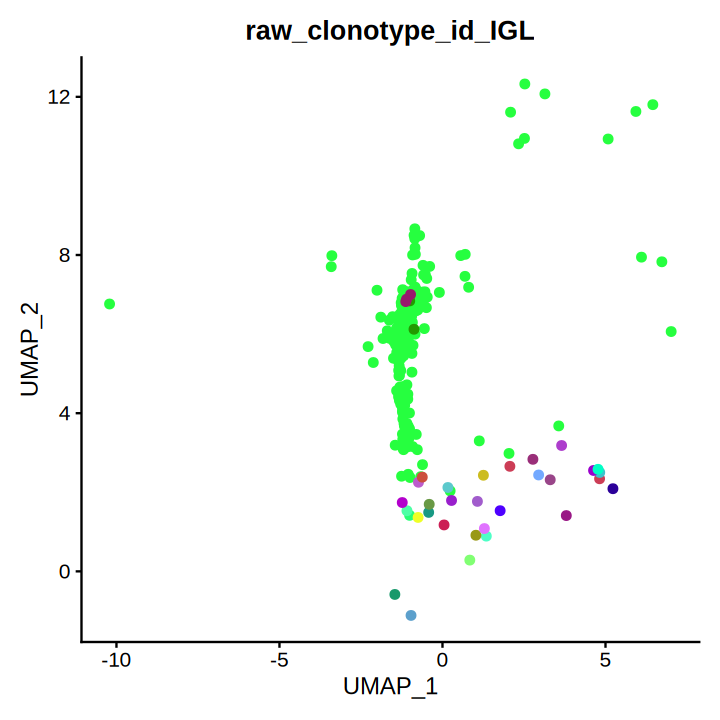

In [383]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [384]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 97. Clonotype assignment and repertoire analysis


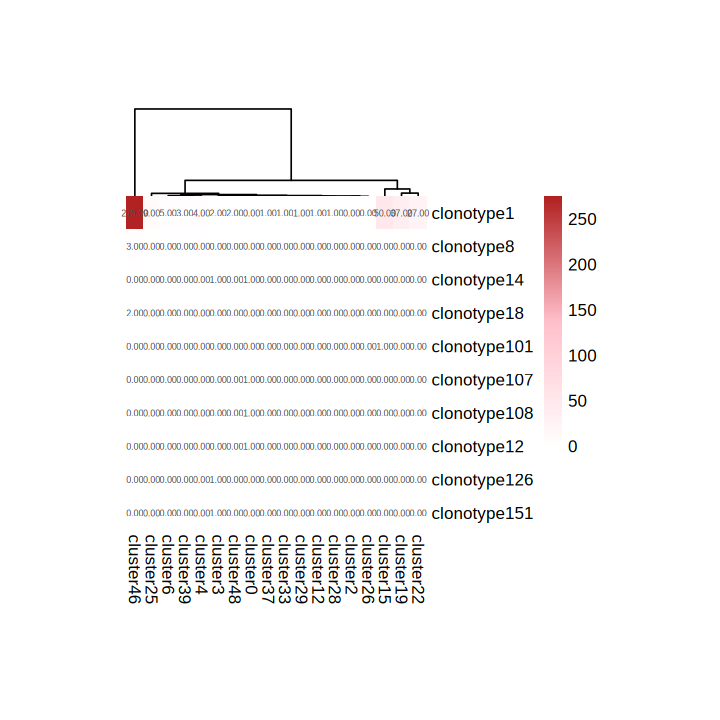

In [385]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta33<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta33$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [386]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta33$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl22_IGLV1-44',meta33$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,678,IGH,IGHV3-21,,IGHJ6,IGHA1,true,true,⋯,232,289,289,307,307,433,433,487,487,518
2,clonotype1,clonotype1_consensus2,646,IGL,IGLV1-44,,IGLJ2,IGLC2,true,true,⋯,209,254,254,275,275,368,368,407,407,435


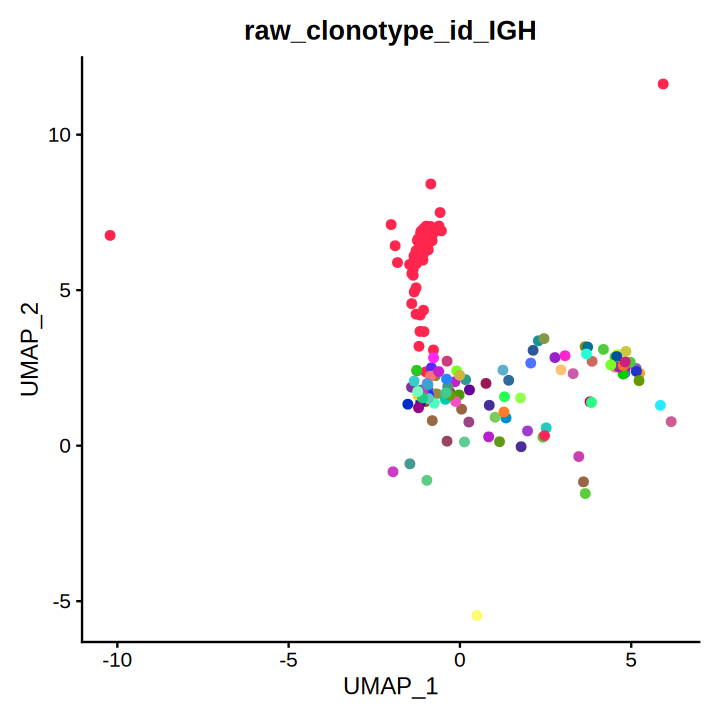

In [387]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [388]:
oneplasma<-subset(x = sce1_plasma, subset = orig.ident == "ALl30plasma")
oneplasma

An object of class Seurat 
36601 features across 9057 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [389]:
oneplasmafiltered <- read.csv( file= "../BCR/sc1019/dskIgD-5/dskIgD-5/outs/filtered_contig_annotations.csv")
oneplasmaconsensus <- read.csv( file= "../BCR/sc1019/dskIgD-5/dskIgD-5/outs/consensus_annotations.csv")

## 98. Clonotype assignment and repertoire analysis


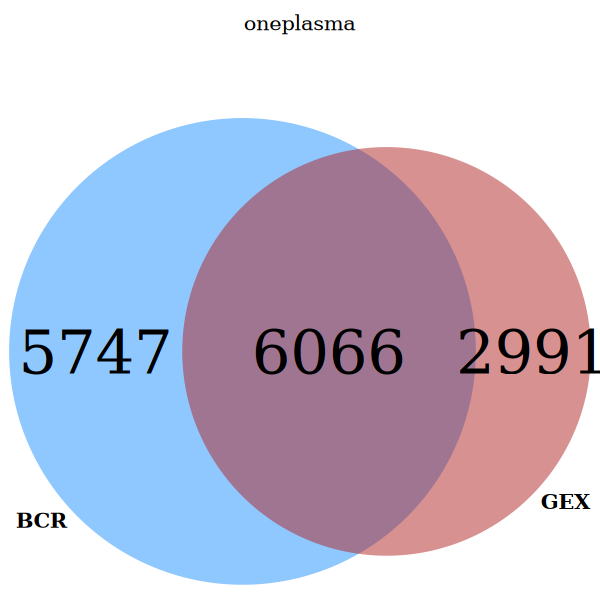

In [390]:
library(VennDiagram)
options(repr.plot.height=5,repr.plot.width=5)
oneplasmafiltered$barcode<-paste('ALl30plasma_',oneplasmafiltered$barcode,sep='')
input<-list(rownames(oneplasma@meta.data),unique(oneplasmafiltered$barcode))
Table<-calculate.overlap(input)
venn<-venn.diagram(main='oneplasma',input,NULL, cat.fontface = "bold",cat.cex = 1,cex = 3,
category = c('GEX',"BCR"),fill = c( "firebrick",'dodgerblue'),lty='blank',
cat.col= 'black',   imagetype = "tiff",  main.fontfamily="serif") #, filename = "Vennup.tif"
grid.draw(venn)

In [391]:
unlabeled37<-setdiff(rownames(oneplasma@meta.data),intersect(rownames(oneplasma@meta.data),oneplasmafiltered$barcode))

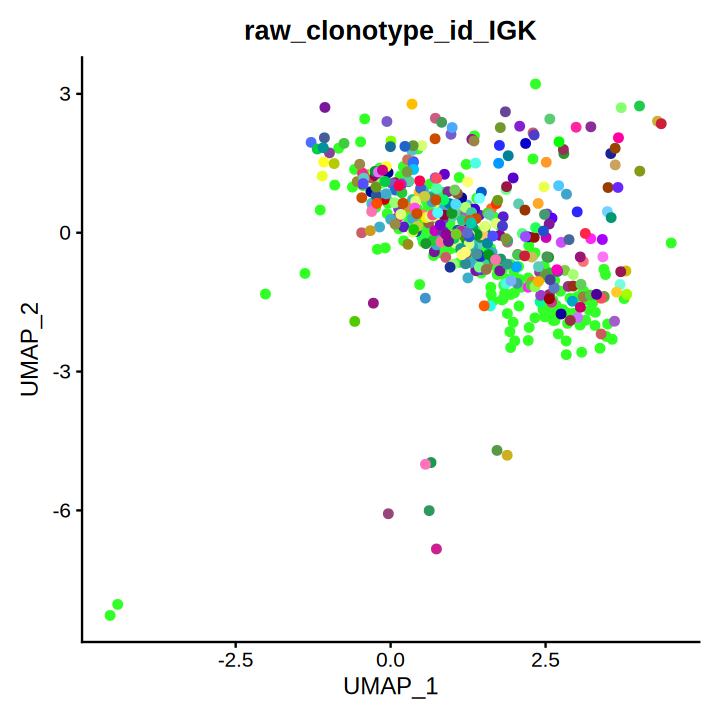

In [392]:
oneplasmafilteredK<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGK'),]
oneplasmafilteredK<-unique(oneplasmafilteredK[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredK)<-oneplasmafilteredK$barcode
colnames(oneplasmafilteredK)<-paste(colnames(oneplasmafilteredK),'IGK',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredK[rownames(oneplasma@meta.data),])

cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGK)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGK",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1277,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

## 99. Clonotype assignment and repertoire analysis


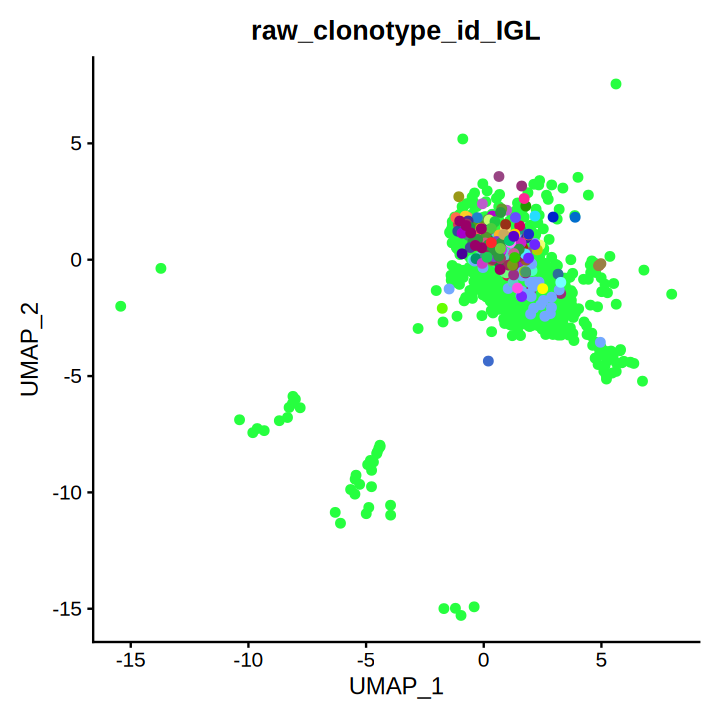

In [393]:
oneplasmafilteredL<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGL'),]
oneplasmafilteredL<-unique(oneplasmafilteredL[,c('barcode',"raw_clonotype_id")])
oneplasmafilteredL <- oneplasmafilteredL[oneplasmafilteredL$raw_clonotype_id!= "", ]
rownames(oneplasmafilteredL)<-oneplasmafilteredL$barcode
colnames(oneplasmafilteredL)<-paste(colnames(oneplasmafilteredL),'IGL',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredL[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGL)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGL",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 1175,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

In [394]:
library(pheatmap)
library(tidyr)
longclone<-as.data.frame(table(oneplasma@meta.data[,c('raw_clonotype_id_IGL','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'raw_clonotype_id_IGL'
wideclone$'raw_clonotype_id_IGL'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

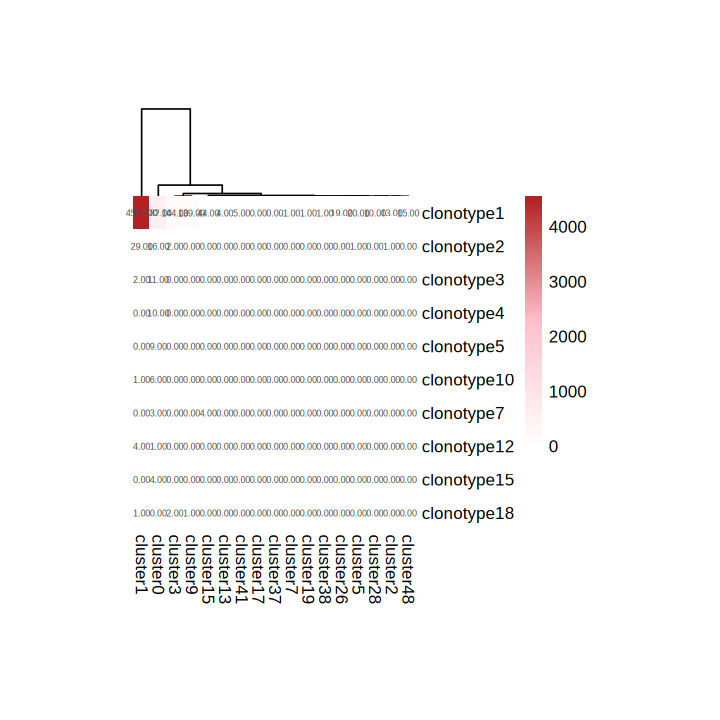

In [395]:
pheatmap(wideclone[1:10,],scale='none',display_numbers = T,fontsize_number=5,cluster_col=T,cluster_row=F,color = colorRampPalette(c("white",'pink',"firebrick"))(100),border=F,cellwidth=10,cellheight=20)
meta34<-oneplasmafilteredL[which(oneplasmafilteredL$'raw_clonotype_id_IGL'%in% c('clonotype1')),]
meta34$'orig.ident'<-unique(oneplasma@meta.data$orig.ident)

In [396]:
oneplasmaconsensus[which(oneplasmaconsensus$'clonotype_id'%in% c('clonotype1')),]
meta34$'raw_clonotype_id_IGL'<-gsub('clonotype1','ALl30_IGLV2-14',meta34$'raw_clonotype_id_IGL')

,clonotype_id,consensus_id,length,chain,v_gene,d_gene,j_gene,c_gene,full_length,productive,⋯,fwr2_start,fwr2_end,cdr2_start,cdr2_end,fwr3_start,fwr3_end,cdr3_start,cdr3_end,fwr4_start,fwr4_end
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,clonotype1,clonotype1_consensus1,648,IGH,IGHV1-24,,IGHJ4,IGHG2,true,true,⋯,213,270,270,288,288,402,402,435,435,466
2,clonotype1,clonotype1_consensus2,580,IGH,IGHV3-23,,IGHJ4,IGHM,true,true,⋯,232,289,289,307,307,421,421,478,478,509
3,clonotype1,clonotype1_consensus3,619,IGH,IGHV2-5,,IGHJ4,IGHG1,true,true,⋯,201,258,258,273,273,387,387,435,435,466
4,clonotype1,clonotype1_consensus4,644,IGH,IGHV2-5,,IGHJ4,IGHG1,true,true,⋯,200,257,257,272,272,386,386,431,431,462
5,clonotype1,clonotype1_consensus5,622,IGH,IGHV2-5,,IGHJ4,IGHA2,true,true,⋯,203,260,260,275,275,389,389,431,431,462
6,clonotype1,clonotype1_consensus6,663,IGH,IGHV3-23,,IGHJ4,IGHA2,true,true,⋯,232,289,289,307,307,421,421,472,472,503
7,clonotype1,clonotype1_consensus7,631,IGH,IGHV3-23,,IGHJ4,IGHG2,true,true,⋯,232,289,289,307,307,421,421,481,481,512
8,clonotype1,clonotype1_consensus8,596,IGH,IGHV3-21,,IGHJ6,IGHD,true,true,⋯,232,289,289,307,307,421,421,463,463,494
9,clonotype1,clonotype1_consensus9,635,IGH,IGHV5-10-1,,IGHJ4,IGHA1,true,true,⋯,210,267,267,285,285,399,399,444,444,475


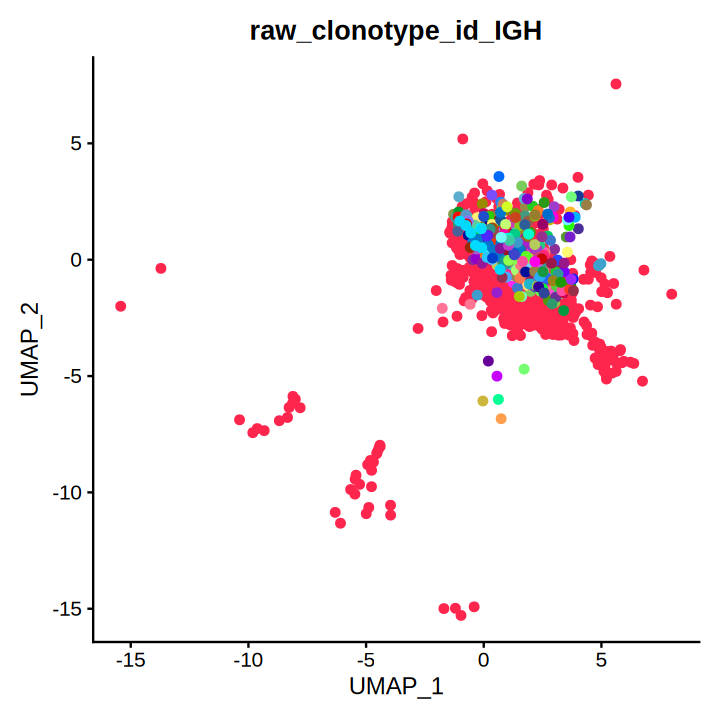

In [397]:
oneplasmafilteredH<-oneplasmafiltered[which(oneplasmafiltered$chain=='IGH'),]
oneplasmafilteredH<-unique(oneplasmafilteredH[,c('barcode',"raw_clonotype_id")])
rownames(oneplasmafilteredH)<-oneplasmafilteredH$barcode
colnames(oneplasmafilteredH)<-paste(colnames(oneplasmafilteredH),'IGH',sep='_')
oneplasma@meta.data<-cbind(oneplasma@meta.data,oneplasmafilteredH[rownames(oneplasma@meta.data),])
cells_non_na <- rownames(oneplasma@meta.data)[!is.na(oneplasma$raw_clonotype_id_IGH)]
cells_keep   <- intersect(cells_non_na, rownames(Embeddings(oneplasma, "UMAP")))
oneplasma2    <- subset(oneplasma, cells = cells_keep)

library(scCustomize)
options(repr.plot.height=6,repr.plot.width=6)
DimPlot_scCustom(oneplasma2, reduction = "UMAP", group.by = "raw_clonotype_id_IGH",pt.size=2,label=F,order=T,colors_use = DiscretePalette_scCustomize(num_colors = 2296,
    palette = "varibow",shuffle_pal = TRUE)) + theme(legend.position = "none")

Identify all the cells with clone information

## 100. Sample metadata and clinical groups


In [398]:
# Loop through each dataframe
for (i in 1:34) {
  # Access the dataframe by name
  df_name <- paste0("meta", i)
  df <- get(df_name)
  colnames(df) <-c('barcode', "clonotype",'orig.ident')  
  # Modify the 14th column by pasting the barcode prefix to its values
  df[[2]] <- paste(unique(df$'orig.ident'), df[[2]],sep="_")
  # Save the modified dataframe back to the original name
  assign(df_name, df)
}


In [399]:
allmeta<-rbind(meta1,meta2,meta3,meta4,meta5,meta6,meta7,meta8,meta9,meta10,meta11,meta12,meta13,meta14,meta15,meta16,meta17,meta18,meta19,meta20,meta21,meta22,meta23,meta24,meta25,meta26,meta27,meta28,meta29,meta30,meta31,meta32,meta33,meta34)

In [400]:
sce1_plasma@meta.data<-cbind(sce1_plasma@meta.data,allmeta[rownames(sce1_plasma@meta.data),])

## 101. Create a labeled clonotype column


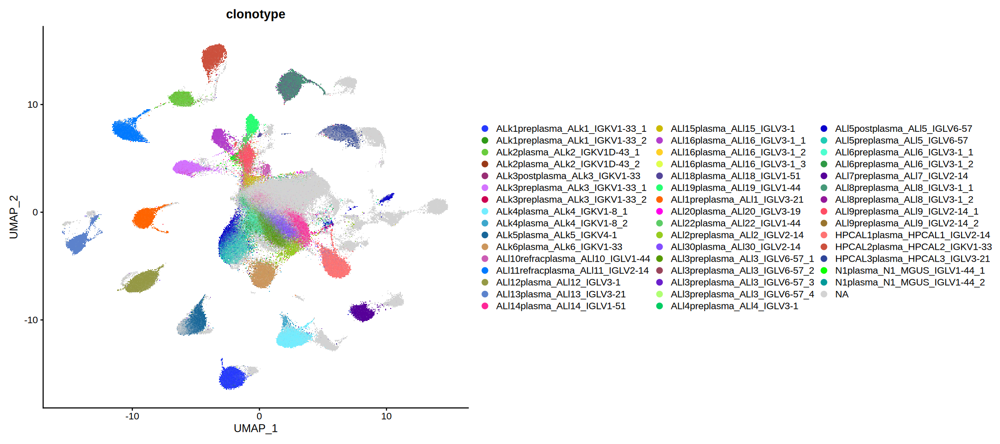

In [401]:
library(scCustomize)
options(repr.plot.height=8, repr.plot.width=18)

# 1) Create a labeled clonotype column
sce1_plasma$clonotype <- ifelse(
  is.na(sce1_plasma$clonotype),
  "NA",
  as.character(sce1_plasma$clonotype)
)
sce1_plasma$clonotype <- factor(sce1_plasma$clonotype)

# 2) Keep all cells that have UMAP coords (no NA filter on clonotype)
cells_keep <- intersect(colnames(sce1_plasma), rownames(Embeddings(sce1_plasma, "UMAP")))
sce1_plasma2 <- subset(sce1_plasma, cells = cells_keep)

# ---- Color mapping (light grey for "NA") ----
labs <- levels(sce1_plasma2$clonotype)
pal_other <- DiscretePalette_scCustomize(
  num_colors = length(labs) - as.integer("NA" %in% labs),
  palette = "varibow", shuffle_pal = TRUE
)

cols <- setNames(pal_other, labs[labs != "NA"])
cols["NA"] <- "#D3D3D3"  # light grey
colors_use <- unname(cols[labs])  # ensure order matches factor levels

# 3) Plot using the new label and colors
DimPlot_scCustom(
  sce1_plasma2,
  pt.size = 1,
  reduction = "UMAP",
  group.by = "clonotype",
  label = FALSE,
  order = TRUE,
  colors_use = colors_use
)



In [402]:
p <- DimPlot_scCustom(
  sce1_plasma2,
  pt.size = 1,
  reduction = "UMAP",
  group.by = "clonotype",
  label = FALSE,
  order = TRUE,
  colors_use = colors_use
)
ggsave("Fig1d.pdf", plot = p, width = 18, height =8)



NOTE: FeaturePlot_scCustom uses a specified `na_cutoff` when plotting to
color cells with no expression as background color separate from color scale.
Please ensure `na_cutoff` value is appropriate for feature being plotted.
Default setting is appropriate for use when plotting from 'RNA' assay.
When `na_cutoff` not appropriate (e.g., module scores) set to NULL to
plot all cells in gradient color palette.

-----This message will be shown once per session.-----


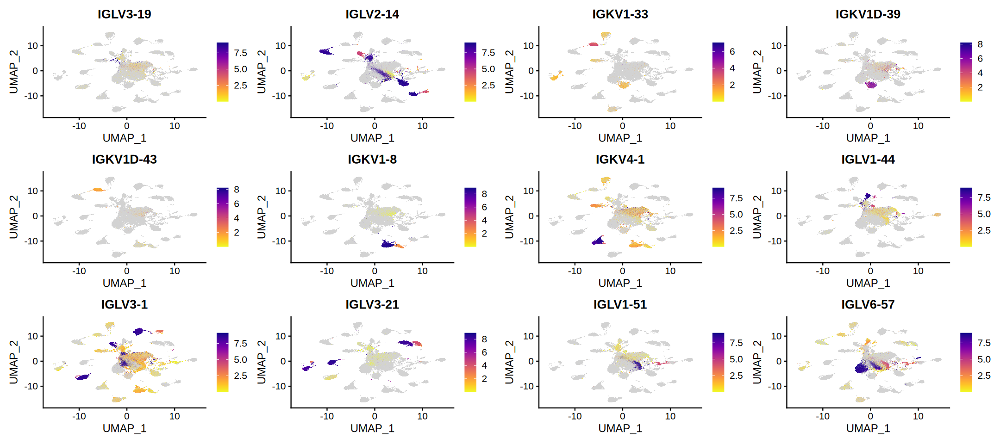

In [403]:
library('RColorBrewer')
FeaturePlot_scCustom(sce1_plasma2, pt.size=1,reduction = "UMAP", feature = c("IGLV3-19","IGLV2-14","IGKV1-33","IGKV1D-39","IGKV1D-43","IGKV1-8","IGKV4-1","IGLV1-44","IGLV3-1","IGLV3-21","IGLV1-51","IGLV2-14","IGLV6-57"),label=FALSE) 

In [404]:
p <- FeaturePlot(sce1_plasma2, pt.size=1,reduction = "UMAP", feature = c("IGLV3-19","IGLV2-14","IGKV1-33","IGKV1D-39","IGKV1D-43","IGKV1-8","IGKV4-1","IGLV1-44","IGLV3-1","IGLV3-21","IGLV1-51","IGLV2-14","IGLV6-57"),label=FALSE) 
ggsave("Figs2b.pdf", plot = p, width = 18, height =13)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

In [405]:
allunlabeled<-c(unlabeled1,unlabeled2,unlabeled3,unlabeled4,unlabeled5,unlabeled6,unlabeled7,unlabeled8,unlabeled9,unlabeled10,unlabeled11,unlabeled12,unlabeled13,unlabeled14,unlabeled15,unlabeled16,unlabeled17,unlabeled18,unlabeled19,unlabeled20,unlabeled21,unlabeled22,unlabeled23,unlabeled24,unlabeled25,unlabeled26,unlabeled27,unlabeled28,unlabeled29,unlabeled30,unlabeled31,unlabeled32,unlabeled33,unlabeled34,unlabeled35,unlabeled36,unlabeled37)
sce1_plasma_clean<- subset(sce1_plasma2, cells = allunlabeled, invert = TRUE)

## 102. Clonotype assignment and repertoire analysis


In [406]:
library(dplyr)

# 1) Normalize "NA"/"" → real NA (handle factor safely)
clo <- as.character(sce1_plasma_clean@meta.data$clonotype)
clo[clo %in% c("NA", "")] <- NA_character_
sce1_plasma_clean@meta.data$clonotype <- factor(clo)

# 2) Add the label column (case-insensitive "plasma")
sce1_plasma_clean$label <- with(sce1_plasma_clean@meta.data,
  case_when(
    grepl("plasma", orig.ident, ignore.case = TRUE) & is.na(clonotype) ~ paste0(orig.ident, "_polyclonal"),
    grepl("plasma", orig.ident, ignore.case = TRUE) & !is.na(clonotype) ~ as.character(clonotype)
  )
)



Attaching package: ‘dplyr’


The following object is masked from ‘package:Biobase’:

    combine


The following objects are masked from ‘package:GenomicRanges’:

    intersect, setdiff, union


The following object is masked from ‘package:GenomeInfoDb’:

    intersect


The following objects are masked from ‘package:IRanges’:

    collapse, desc, intersect, setdiff, slice, union


The following objects are masked from ‘package:S4Vectors’:

    first, intersect, rename, setdiff, setequal, union


The following objects are masked from ‘package:BiocGenerics’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:matrixStats’:

    count


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [407]:
sce1_plasma_clean$labelrep<-sce1_plasma_clean$label
sce1_plasma_clean@meta.data$label<-gsub('N1','ALN1',sce1_plasma_clean@meta.data$label)
sce1_plasma_clean@meta.data$label<-gsub('N2','ALN2',sce1_plasma_clean@meta.data$label)
sce1_plasma_clean@meta.data$label<-gsub("HPCAL",'ALHPC',sce1_plasma_clean@meta.data$label)
sce1_plasma_clean@meta.data <- sce1_plasma_clean@meta.data %>%
separate(label, into = c("labelpart1", "labelpart2"), sep = "_AL") %>%
separate(labelpart1, into = c("labelpart1", "trashed"), sep = "_")
sce1_plasma_clean@meta.data$labelpart2<-paste('AL',sce1_plasma_clean@meta.data$labelpart2,sep='')
sce1_plasma_clean@meta.data$labelpart2<-gsub('ALNA','polyclonal',sce1_plasma_clean@meta.data$labelpart2)
stackplot<-as.data.frame(table(sce1_plasma_clean@meta.data[,c('labelpart1','labelpart2')]))

Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 31113 rows [1644, 1650,
1651, 1652, 1655, 1656, 1661, 1663, 1664, 1667, 1670, 1672, 1685, 1688, 1691,
1693, 1694, 1698, 1699, 1701, ...].”
Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 150721 rows [1641, 1642,
1643, 1645, 1646, 1647, 1648, 1649, 1653, 1654, 1657, 1658, 1659, 1660, 1662,
1665, 1666, 1668, 1669, 1671, ...].”


Ratio of amyloid clones to normal polyclone

In [408]:
# ------------------------------------------------------------
# 0) Build ONE color map from the Seurat object (your UMAP map)
# ------------------------------------------------------------
library(scCustomize)

# make sure clonotype is character + factor with "NA" level
sce1_plasma$clonotype <- ifelse(is.na(sce1_plasma$clonotype), "NA", as.character(sce1_plasma$clonotype))
sce1_plasma$clonotype <- factor(sce1_plasma$clonotype)

cells_keep <- intersect(colnames(sce1_plasma), rownames(Embeddings(sce1_plasma, "UMAP")))
sce1_plasma2 <- subset(sce1_plasma, cells = cells_keep)

labs <- levels(sce1_plasma2$clonotype)

pal_other <- DiscretePalette_scCustomize(
  num_colors  = length(labs) - as.integer("NA" %in% labs),
  palette     = "varibow",
  shuffle_pal = TRUE
)

cols <- setNames(pal_other, labs[labs != "NA"])
cols["NA"] <- "#D3D3D3"  # light grey for NA
# cols is your master mapping: names are clonotypes, values are colors


## 103. Visualization and figure generation


In [409]:
library(ggplot2)


cols_cat <- cols
names(cols_cat) <- ifelse(
  names(cols_cat) == "NA",
  "NA",
  sub("^[^_]*_", "", names(cols_cat))   # take substring after first "_"
)

# If multiple clonotypes map to the same category, keep the first color
cols_cat <- cols_cat[!duplicated(names(cols_cat))]

# Force NA to light grey (in case it got changed)
cols_cat["NA"] <- "#D3D3D3"

# swap names in cols_cat (use placeholders to avoid double-swapping)
nm <- names(cols_cat)
nm <- gsub('HPCAL','ALHPC',nm)
nm <- gsub('N1_MGUS','ALN1_MGUS',nm)
names(cols_cat) <- nm



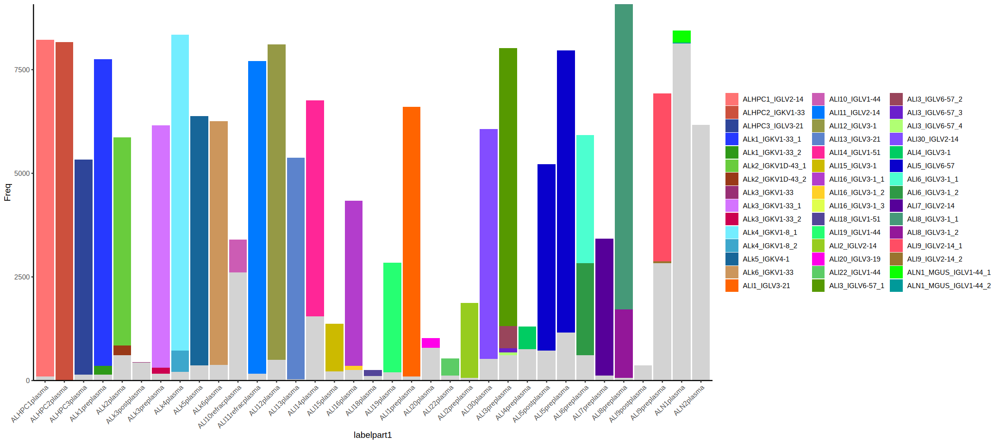

In [410]:
ggplot(stackplot, aes(x = labelpart1, y = Freq, fill = labelpart2)) +
  geom_bar(stat = "identity") +
  scale_fill_manual(values = cols_cat, drop = FALSE, na.value = "#D3D3D3") +
  scale_y_continuous(expand = c(0, 0)) +
  theme_classic() +
  theme(legend.position = "right") +
  guides(fill = guide_legend(title = NULL)) +
  RotatedAxis()

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Clone composition (scaled 0–1)' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Clone composition (scaled 0–1)' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Clone composition (scaled 0–1)' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Clone composition (scaled 0–1)' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Clone composition (scaled 0–1)' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“con

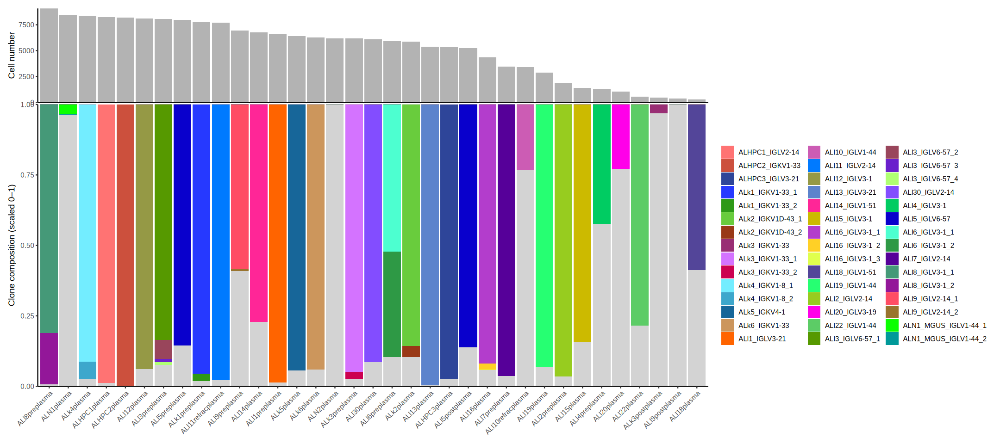

In [411]:
suppressPackageStartupMessages({
  library(dplyr)
  library(ggplot2)
  library(patchwork)
})

# -----------------------------
# 0) Get per-label cell numbers + ordering (high -> low)
# -----------------------------
count_col <- intersect(names(stackplot), c("cell_n", "cell_count", "n_cells", "n"))[1]

cell_df <- if (!is.na(count_col)) {
  stackplot %>%
    dplyr::distinct(labelpart1, cell_n = .data[[count_col]])
} else {
  # Fallback: assume Freq are counts and sum within labelpart1
  tmp <- stackplot %>%
    group_by(labelpart1) %>%
    summarise(cell_n = sum(Freq, na.rm = TRUE), .groups = "drop")

  if (all(tmp$cell_n >= 0.95 & tmp$cell_n <= 1.05)) {
    message(
      "Note: Freq sums to ~1 per labelpart1, so Freq likely represents proportions.\n",
      "Top barplot will not reflect true cell counts unless you provide a cell-count column (e.g., cell_n)."
    )
  }
  tmp
}

cell_df <- cell_df %>% arrange(desc(cell_n))
ord_levels <- cell_df$labelpart1

# Enforce same order for both plots
cell_df <- cell_df %>% mutate(labelpart1 = factor(labelpart1, levels = ord_levels))
stackplot_ord <- stackplot %>% mutate(labelpart1 = factor(labelpart1, levels = ord_levels))

# -----------------------------
# 1) Top: grey cell-number barplot
# -----------------------------
p_n <- ggplot(cell_df, aes(x = labelpart1, y = cell_n)) +
  geom_col(fill = "grey70") +
  scale_y_continuous(expand = c(0, 0)) +
  labs(x = NULL, y = "Cell number") +
  theme_classic() +
  theme(
    axis.text.x  = element_blank(),
    axis.ticks.x = element_blank(),
    plot.margin  = margin(5.5, 5.5, 0, 5.5)
  )

# -----------------------------
# 2) Bottom: clone composition scaled 0–1 (per labelpart1)
# -----------------------------
stack_scaled <- stackplot_ord %>%
  group_by(labelpart1) %>%
  mutate(
    denom = sum(Freq, na.rm = TRUE),
    Freq_scaled = ifelse(denom > 0, Freq / denom, 0)
  ) %>%
  ungroup() %>%
  select(-denom)

p_comp <- ggplot(stack_scaled, aes(x = labelpart1, y = Freq_scaled, fill = labelpart2)) +
  geom_bar(stat = "identity") +
  scale_fill_manual(values = cols_cat, drop = FALSE, na.value = "#D3D3D3") +
  scale_y_continuous(expand = c(0, 0), limits = c(0, 1)) +
  labs(x = NULL, y = "Clone composition (scaled 0–1)") +
  theme_classic() +
  theme(
    legend.position = "right",
    plot.margin     = margin(0, 5.5, 5.5, 5.5)
  ) +
  guides(fill = guide_legend(title = NULL)) +
  RotatedAxis()

# -----------------------------
# 3) Combine in two rows
# -----------------------------
p_n / p_comp + plot_layout(heights = c(1, 3))


In [412]:
# If you already ran the code that creates `p_n` and `p_comp`, just do this:

p_combined <- p_n / p_comp + patchwork::plot_layout(heights = c(1, 3))

ggsave(
  filename = "cellN_and_cloneComposition.pdf",
  plot     = p_combined,
  width    = 14,   # adjust as needed
  height   = 8,    # adjust as needed
  units    = "in",
  device   = cairo_pdf
)


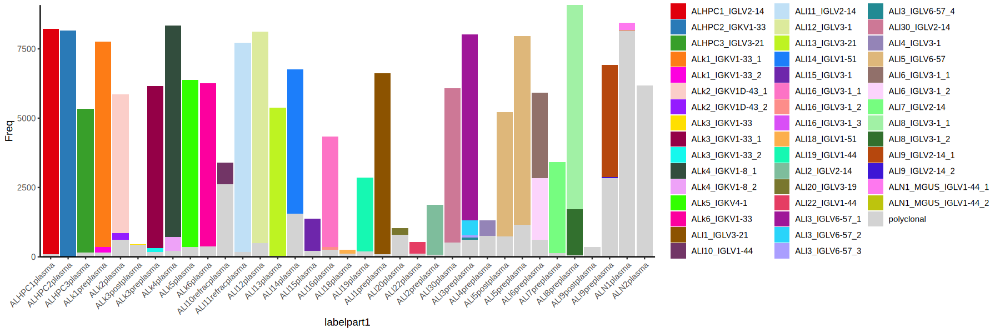

In [413]:
library(ggplot2)
library(Polychrome)

options(repr.plot.height=5,repr.plot.width=15)
set.seed(99)
clonotypes <- unique(stackplot$labelpart2)

# Define how many colors we need (excluding grey for polyclonal)
n_colors <- length(clonotypes) - 1

# Create a distinguishable palette avoiding grey and black
palette <- createPalette(n_colors, seedcolors=c("#E31A1C", "#1F78B4", "#33A02C", "#FF7F00"))  # vivid and distinguishable

# Add light grey as the last color for 'polyclonal'
color_map <- c(palette, "#D3D3D3")  # Light grey

# Ensure names match clonotype order (important!)
names(color_map) <- clonotypes

# Then plot
ggplot(stackplot, aes(x=labelpart1, y=Freq, fill=labelpart2)) +
  geom_bar(stat="identity") +
  scale_fill_manual(values = color_map) +
  scale_y_continuous(expand = c(0, 0)) +
  theme_classic() +
  theme(legend.position = "right") +
  guides(fill = guide_legend(title = NULL)) +
  RotatedAxis()


Intra-patient amyloid clone vs normal polyclone

## 104. Packages and reproducibility setup


In [414]:
library(Seurat)
library(dplyr)

# Store all significant DE results
all_signif_genes <- list()

seurat_obj<-sce1_plasma_clean

# 0) Sanity check: does the column exist?
stopifnot("labelpart1" %in% colnames(seurat_obj@meta.data))

# 1) NormALlze "NA"/"" strings to real NA
seurat_obj$labelpart1 <- as.character(seurat_obj$labelpart1)
seurat_obj$labelpart1[seurat_obj$labelpart1 %in% c("NA", "NaN", "")] <- NA

# 2) Keep only cells with non-NA in labelpart1
keep <- !is.na(seurat_obj$labelpart1)

# Option A: simple column-wise subset (works in all Seurat versions)
seurat_obj <- seurat_obj[, keep]

# Option B (equivalent): via `cells=` arg
# seurat_obj <- subset(seurat_obj, cells = colnames(seurat_obj)[keep])


# Loop over each sample
for (s in unique(seurat_obj$labelpart1)) {
  
  # Subset cells of this sample
  sample_subset <- subset(seurat_obj, subset = labelpart1 == s)
  
  # Skip if "polyclonal" not present
  if (!"polyclonal" %in% sample_subset$labelpart2) next
  
  # Get unique clonotypes (excluding "polyclonal")
  clonos <- unique(sample_subset$labelpart2)
  clonos <- clonos[clonos != "polyclonal"]
  
  # Loop over each IG isotype
  for (ig in clonos) {
    
    # Set clonotype as identity
    Idents(sample_subset) <- factor(sample_subset$labelpart2)

    # Run FindMarkers: IG isotype vs. polyclonal
    markers <- FindMarkers(sample_subset, ident.1 = ig, ident.2 = "polyclonal", 
                           logfc.threshold = 0.25, min.pct = 0.1, test.use = "wilcox")
    
    # Filter significant markers
    signif_markers <- markers %>%
      filter(p_val_adj < 0.05) %>%
      mutate(sample = s, isotype = ig, gene = rownames(.))
    
    # Save result
    all_signif_genes[[paste(s, ig, sep = "_")]] <- signif_markers
  }
}

# Combine all into one table
final_table <- bind_rows(all_signif_genes)

# View result
head(final_table)


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,sample,isotype,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
CCND1...1,0,3.268572,0.963,0.171,0,ALl14plasma,ALl14_IGLV1-51,CCND1
IGHG4...2,0,-8.941859,0.026,0.692,0,ALl14plasma,ALl14_IGLV1-51,IGHG4
IGHG3...3,0,-7.643479,0.127,0.741,0,ALl14plasma,ALl14_IGLV1-51,IGHG3
IGKC...4,0,-19.916531,0.207,0.764,0,ALl14plasma,ALl14_IGLV1-51,IGKC
VPREB3...5,0,1.815712,0.983,0.451,0,ALl14plasma,ALl14_IGLV1-51,VPREB3
TIMP1...6,0,-3.391540,0.100,0.601,0,ALl14plasma,ALl14_IGLV1-51,TIMP1


In [415]:
write.csv(final_table,file='clonevsnormal_final_table_repeat.csv')

Save the paired pre-treatment and post-treatment samples for clone tracing study

In [416]:
library(Seurat)
library(sceasy)

# Subset both groups together in one step
subset_cells <- subset(
  sce1_plasma_clean, 
  subset = orig.ident %in% c("ALk3preplasma", "ALk3postplasma")
)

# Ensure RNA assay is properly formatted
subset_cells[["RNA"]] <- as(subset_cells[["RNA"]], "Assay")

# Save as .h5ad
sceasy::convertFormat(subset_cells, from = "seurat", to = "anndata", outFile = "ALk3_pre_post.h5ad")


Warning message in .regularise_df(obj@meta.data, drop_single_values = drop_single_values):
“Dropping single category variables:singlet, subtype”


AnnData object with n_obs × n_vars = 6595 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'barcode.1', 'clonotype', 'orig.ident.1', 'labelpart1', 'trashed', 'labelpart2', 'labelrep'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'

## 105. Subset both groups together in one step


In [417]:
library(Seurat)
library(sceasy)

# Subset both groups together in one step
subset_cells <- subset(
  sce1_plasma_clean, 
  subset = orig.ident %in% c("ALl5preplasma", "ALl5postplasma")
)

# Ensure RNA assay is properly formatted
subset_cells[["RNA"]] <- as(subset_cells[["RNA"]], "Assay")

# Save as .h5ad
sceasy::convertFormat(subset_cells, from = "seurat", to = "anndata", outFile = "ALl5_pre_post.h5ad")


Warning message in .regularise_df(obj@meta.data, drop_single_values = drop_single_values):
“Dropping single category variables:singlet, subtype”


AnnData object with n_obs × n_vars = 13168 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'barcode.1', 'clonotype', 'orig.ident.1', 'labelpart1', 'trashed', 'labelpart2', 'labelrep'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'

In [418]:
library(Seurat)
library(sceasy)

# Subset both groups together in one step
subset_cells <- subset(
  sce1_plasma_clean, 
  subset = orig.ident %in% c("ALl9preplasma", "ALl9postplasma")
)

# Ensure RNA assay is properly formatted
subset_cells[["RNA"]] <- as(subset_cells[["RNA"]], "Assay")

# Save as .h5ad
sceasy::convertFormat(subset_cells, from = "seurat", to = "anndata", outFile = "ALl9_pre_post.h5ad")


Warning message in .regularise_df(obj@meta.data, drop_single_values = drop_single_values):
“Dropping single category variables:singlet, subtype”


AnnData object with n_obs × n_vars = 7276 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'barcode.1', 'clonotype', 'orig.ident.1', 'labelpart1', 'trashed', 'labelpart2', 'labelrep'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'

Isolate the cell with clone identity

In [419]:
allunlabeled<-c(unlabeled1,unlabeled2,unlabeled3,unlabeled4,unlabeled5,unlabeled6,unlabeled7,unlabeled8,unlabeled9,unlabeled10,unlabeled11,unlabeled12,unlabeled13,unlabeled14,unlabeled15,unlabeled16,unlabeled17,unlabeled18,unlabeled19,unlabeled20,unlabeled21,unlabeled22,unlabeled23,unlabeled24,unlabeled25,unlabeled26,unlabeled27,unlabeled28,unlabeled29,unlabeled30,unlabeled31,unlabeled32,unlabeled33,unlabeled34,unlabeled35,unlabeled36,unlabeled37)
sce1_plasma_clean<- subset(sce1_plasma, cells = allunlabeled, invert = TRUE)

# Identify cells whose orig.ident does NOT include "plasma"
cells_to_keep <- colnames(sce1_plasma_clean)[grepl("plasma", sce1_plasma_clean$orig.ident)]

# Subset the Seurat object
sce1_plasma_clean <- sce1_plasma_clean[, cells_to_keep]


In [420]:
sce1_plasma_clean

An object of class Seurat 
36601 features across 181834 samples within 1 assay 
Active assay: RNA (36601 features, 1755 variable features)
 3 layers present: counts, data, scale.data
 2 dimensional reductions calculated: pca, UMAP

In [421]:
colnames(sce1_plasma_clean@meta.data)

[1] "orig.ident"            "nCount_RNA"            "nFeature_RNA"         
 [4] "percent.mt"            "percent.ig"            "percent.hb"           
 [7] "unintegrated_clusters" "seurat_clusters"       "barcode"              
[10] "singlet"               "subtype"               "mutation"             
[13] "S.Score"               "G2M.Score"             "Phase"                
[16] "old.ident"             "barcode"               "clonotype"            
[19] "orig.ident"

## 106. Clonotype assignment and repertoire analysis


In [422]:
library(pheatmap)
library(tidyr)
library(tidyverse)
sce1_plasma_clean@meta.data$clonotype<- gsub('NA','polyclonal',sce1_plasma_clean@meta.data$clonotype)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0     ✔ readr     2.1.5
✔ lubridate 1.9.4     ✔ stringr   1.6.0
✔ purrr     1.1.0     ✔ tibble    3.3.1
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ lubridate::%within%()    masks IRanges::%within%()
✖ dplyr::collapse()        masks IRanges::collapse()
✖ dplyr::combine()         masks Biobase::combine(), BiocGenerics::combine()
✖ dplyr::count()           masks matrixStats::count()
✖ dplyr::desc()            masks IRanges::desc()
✖ tidyr::expand()          masks Matrix::expand(), S4Vectors::expand()
✖ dplyr::filter()          masks stats::filter()
✖ dplyr::first()           masks S4Vectors::first()
✖ dplyr::lag()             masks stats::lag()
✖ tidyr::pack()            masks Matrix::pack()
✖ BiocGenerics::Position() masks ggplot2::Position(), base::Position()
✖ purrr::reduce()          masks GenomicRanges::reduce(), IRanges::reduce()
✖ dplyr::rename()  

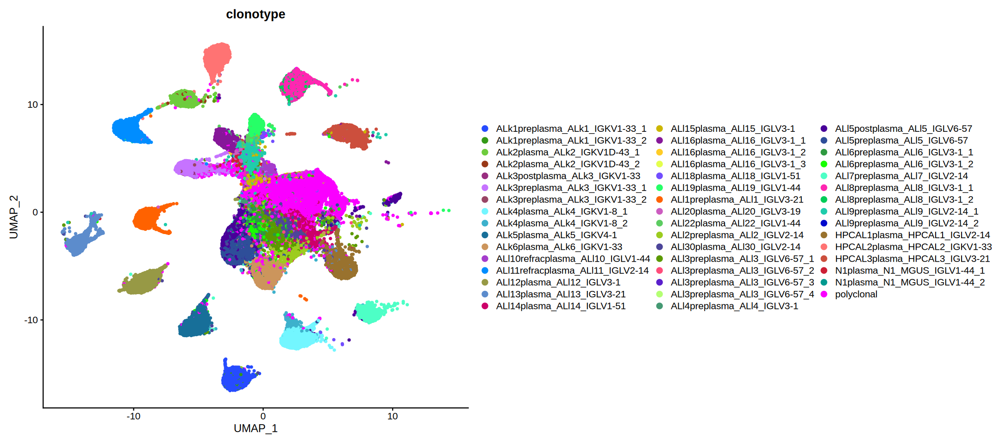

In [423]:
library(scCustomize)
options(repr.plot.height=8,repr.plot.width=18)
DimPlot_scCustom(sce1_plasma_clean, pt.size=1,reduction = "UMAP", group.by = c("clonotype"),label=F) 

In [424]:
longclone<-as.data.frame(table(sce1_plasma_clean@meta.data[,c('clonotype','seurat_clusters')]))
wideclone <- pivot_wider(longclone, names_from = seurat_clusters, values_from = Freq, values_fill = 0)
wideclone<- na.omit(wideclone)
wideclone<-as.data.frame(wideclone)
rownames(wideclone)<-wideclone$'clonotype'
wideclone$'clonotype'<-NULL
# Rank dataframe by row sums (descending order)
wideclone <- wideclone[order(rowSums(wideclone ), decreasing = TRUE), ]
wideclone<-wideclone[,which(colSums(wideclone)>0)]

## 107. Visualization and figure generation


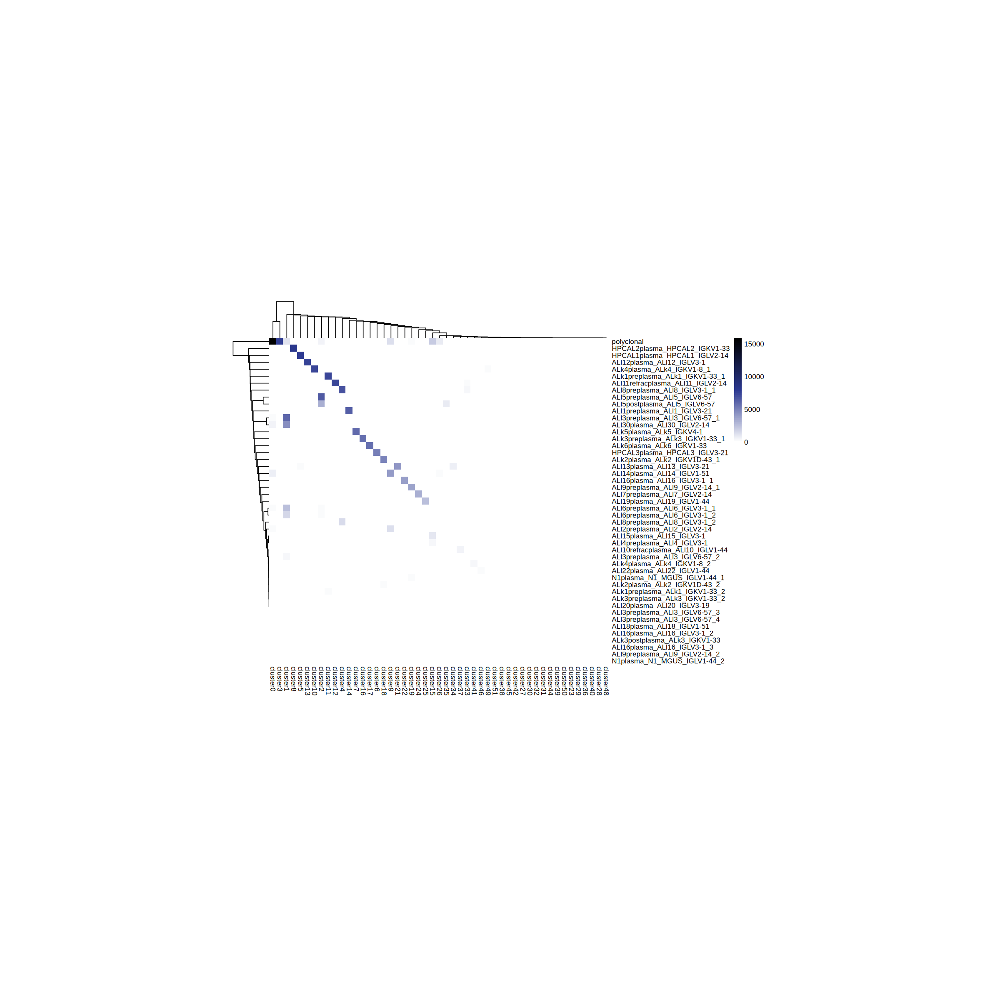

In [425]:
options(repr.plot.height=20,repr.plot.width=20)
pheatmap(wideclone,scale='none',display_numbers = F,fontsize_number=5,cluster_col=T,cluster_row=T,color = colorRampPalette(c('white',"#2c3991",'black'))(100),border=F,cellwidth=10,cellheight=10)

pdf 
  2

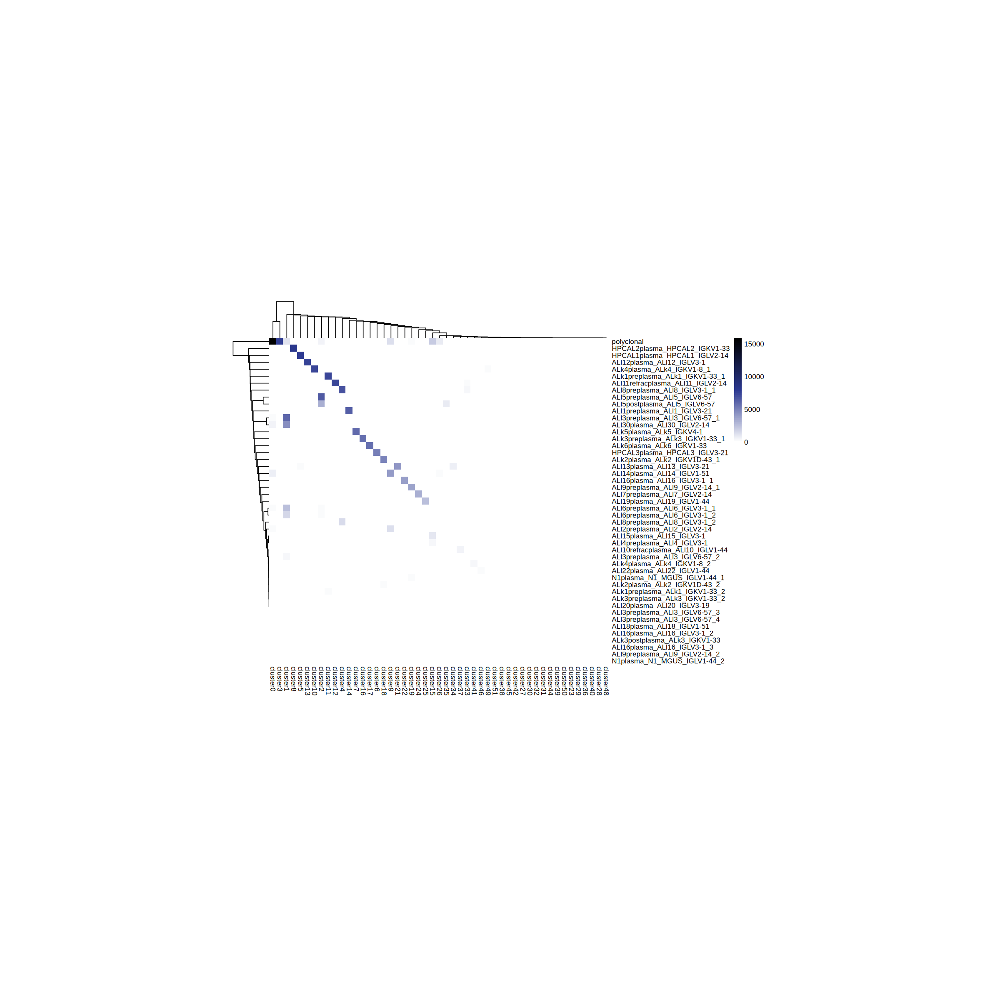

In [426]:
# If needed
# install.packages("pheatmap")

library(pheatmap)

# ---- 1) Create the plot object ----
ph <- pheatmap(
  wideclone,
  scale = "none",
  display_numbers = FALSE,
  fontsize_number = 5,
  cluster_col = TRUE,
  cluster_row = TRUE,
  color = colorRampPalette(c("white", "#2c3991", "black"))(100),
  border_color = NA,      # border = FALSE equivalent for pheatmap
  cellwidth = 10,
  cellheight = 10
)

# ---- 2) Save to PDF (choose ONE of the following options) ----


pdf("wideclone_pheatmap.pdf", width = 12, height = 10)
grid::grid.newpage()
grid::grid.draw(ph$gtable)
dev.off()


In [427]:
write.csv(longclone,file='longclone.csv')

In [428]:
# Assuming `seurat_obj` is your Seurat object
library(ggplot2)

Idents(sce1_plasma_clean)<-"clonotype"
# Generate the UMAP plot with DimPlot_scCustom
umap_plot <- DimPlot_scCustom(sce1_plasma_clean, pt.size=1,reduction = "UMAP", group.by = c("clonotype"),label=T) 

# Extract the ggplot object
plot_data <- ggplot_build(umap_plot)

# Extract color mapping
color_mapping <- unique(plot_data$data[[1]]$colour)  # Unique colors

# Extract numeric cluster indices
numeric_indices <- unique(plot_data$data[[1]]$group)

# Map numeric indices to cluster names from Seurat object
cluster_ids <- as.character(Idents(sce1_plasma_clean))  # Extract cluster names from Seurat object
numeric_to_name <- setNames(cluster_ids, as.numeric(factor(cluster_ids)))

# Map the numeric indices to cluster names
cluster_names <- numeric_to_name[as.character(numeric_indices)]

# Combine cluster names and colors into a data frame
color_cluster_df <- data.frame(
  Cluster = cluster_names,
  Color = color_mapping
)

In [429]:
plasmacellnumber<-as.data.frame(table(sce1_plasma_clean@meta.data$clonotype))
plasmacellnumber$log10Freq<-log10(plasmacellnumber$Freq)
plasmacellnumber<-merge(plasmacellnumber,color_cluster_df,by.y='Cluster',by.x='Var1')
plasmacellnumber <- plasmacellnumber[order(-plasmacellnumber$Freq), ]

## 108. Clonotype assignment and repertoire analysis


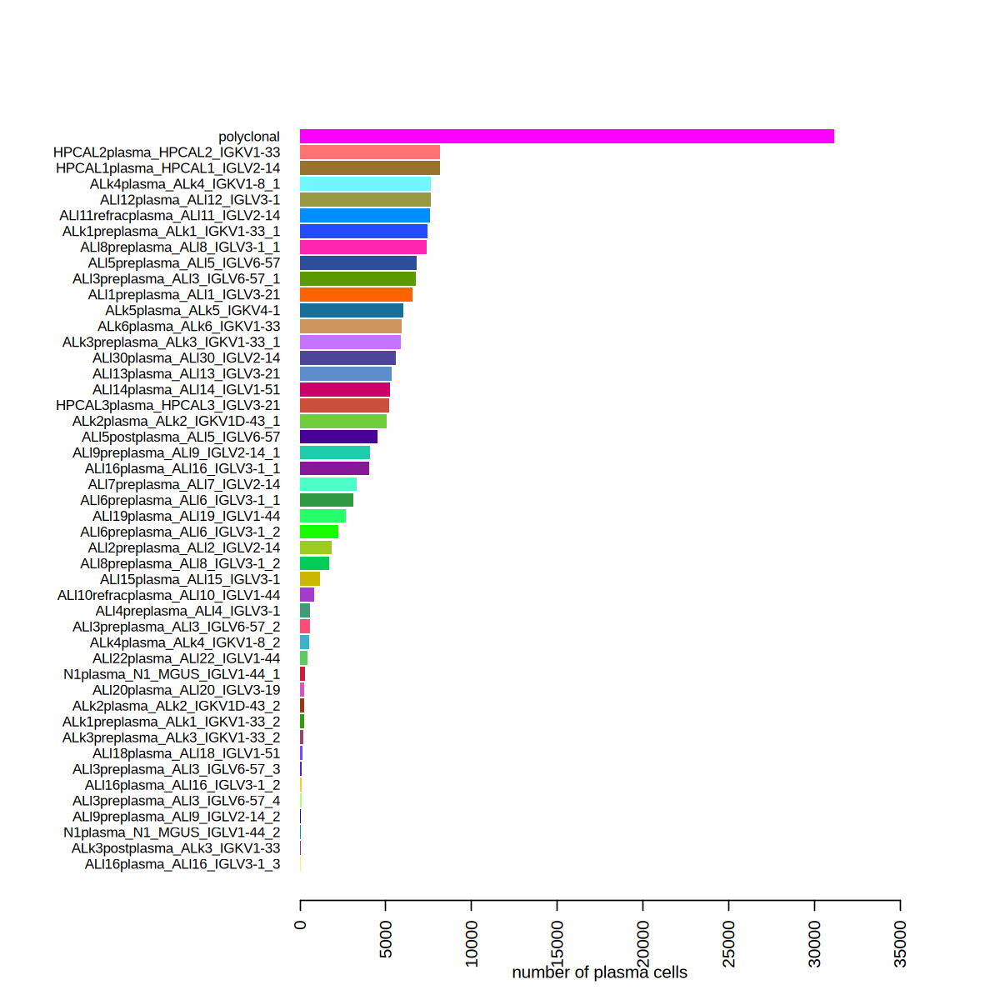

In [430]:
# Adjust the left margin (mar[2]) and reduce label size with cex.names
par(mar = c(5, 15, 5, 5))  # bottom, left, top, right
options(repr.plot.height=10, repr.plot.width=10)

barplot(
  rev(plasmacellnumber$Freq),
  names.arg = rev(plasmacellnumber$Var1),
  col = rev(plasmacellnumber$Color),
  xlab = "number of plasma cells",
  las = 2,
  border = NA,
  horiz = TRUE,
  cex.names = 0.8,  # reduce label size if needed
  xlim = range(pretty(c(0, plasmacellnumber$Freq)))
)


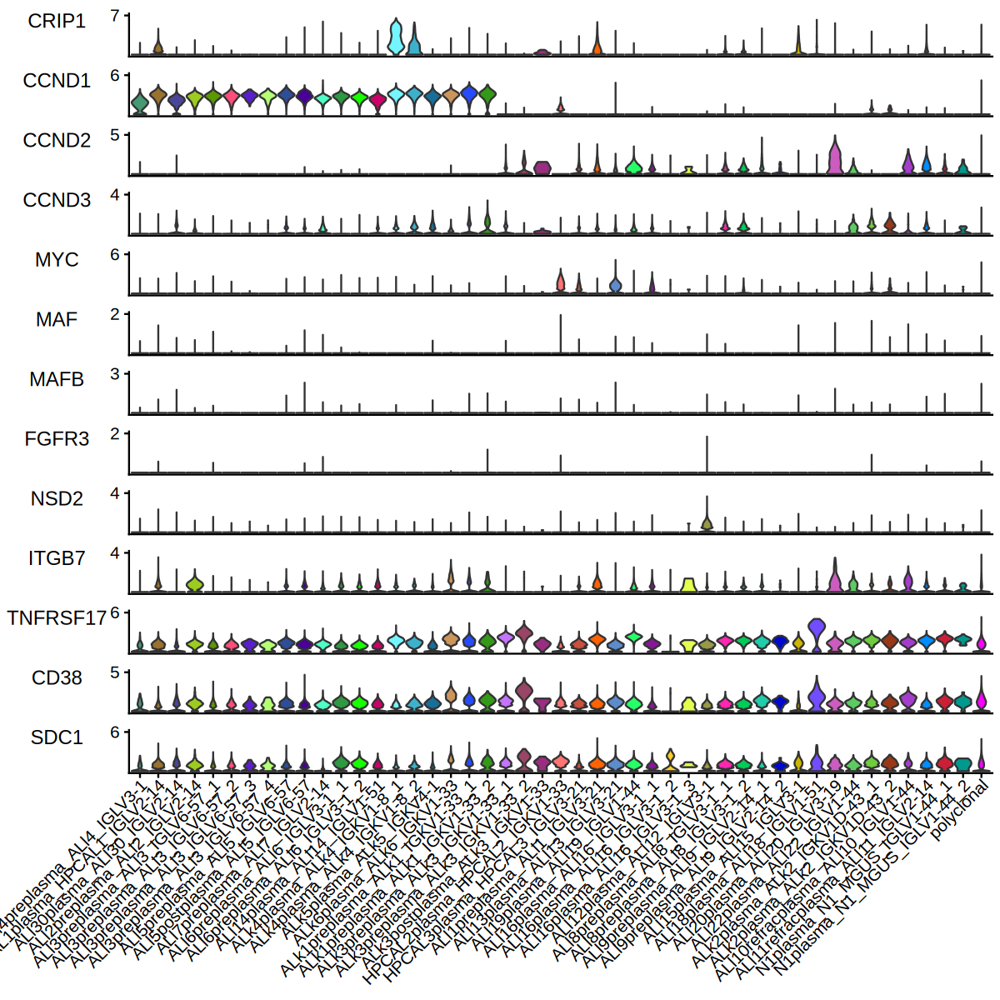

In [431]:
# Create Plots
# Assuming `seurat_obj` is your Seurat object
# Adjust the plot dimensions

# Define the levels properly with all required commas
desired_order2<-c( 'ALl4preplasma_ALl4_IGLV3-1',"HPCAL1plasma_HPCAL1_IGLV2-14",
  "ALl30plasma_ALl30_IGLV2-14",
  "ALl2preplasma_ALl2_IGLV2-14",
    "ALl3preplasma_ALl3_IGLV6-57_1",
    "ALl3preplasma_ALl3_IGLV6-57_2",
    "ALl3preplasma_ALl3_IGLV6-57_3",
    "ALl3preplasma_ALl3_IGLV6-57_4",
  "ALl5preplasma_ALl5_IGLV6-57",
  "ALl5postplasma_ALl5_IGLV6-57",
  "ALl7preplasma_ALl7_IGLV2-14",
    "ALl6preplasma_ALl6_IGLV3-1_1",
    "ALl6preplasma_ALl6_IGLV3-1_2",
  "ALl14plasma_ALl14_IGLV1-51",
    "ALk4plasma_ALk4_IGKV1-8_1",
    "ALk4plasma_ALk4_IGKV1-8_2",
  "ALk5plasma_ALk5_IGKV4-1",
  "ALk6plasma_ALk6_IGKV1-33",
    "ALk1preplasma_ALk1_IGKV1-33_1",
    "ALk1preplasma_ALk1_IGKV1-33_2",
    "ALk3preplasma_ALk3_IGKV1-33_1",
    "ALk3preplasma_ALk3_IGKV1-33_2",
  "ALk3postplasma_ALk3_IGKV1-33",
  "HPCAL2plasma_HPCAL2_IGKV1-33",
  "HPCAL3plasma_HPCAL3_IGLV3-21",
  "ALl1preplasma_ALl1_IGLV3-21",
  "ALl13plasma_ALl13_IGLV3-21",
  "ALl19plasma_ALl19_IGLV1-44",
  "ALl16plasma_ALl16_IGLV3-1_1",
  "ALl16plasma_ALl16_IGLV3-1_2",
  "ALl16plasma_ALl16_IGLV3-1_3",
  "ALl12plasma_ALl12_IGLV3-1",
    "ALl8preplasma_ALl8_IGLV3-1_1",
    "ALl8preplasma_ALl8_IGLV3-1_2",
  "ALl9preplasma_ALl9_IGLV2-14_1",
  "ALl9preplasma_ALl9_IGLV2-14_2",
  "ALl15plasma_ALl15_IGLV3-1",
  "ALl18plasma_ALl18_IGLV1-51",
  "ALl20plasma_ALl20_IGLV3-19",
  "ALl22plasma_ALl22_IGLV1-44",
    "ALk2plasma_ALk2_IGKV1D-43_1",
    "ALk2plasma_ALk2_IGKV1D-43_2",
  "ALl10refracplasma_ALl10_IGLV1-44",
  "ALl11refracplasma_ALl11_IGLV2-14","N1plasma_N1_MGUS_IGLV1-44_1","N1plasma_N1_MGUS_IGLV1-44_2","polyclonal"
)

Idents(sce1_plasma_clean) <- 'clonotype'
Idents(sce1_plasma_clean) <- factor(Idents(sce1_plasma_clean), levels =desired_order2)
rownames(plasmacellnumber)<-plasmacellnumber$Var1
plasmacellnumber <- plasmacellnumber[desired_order2,]

gene_list_plot <- c("CRIP1","CCND1", "CCND2",'CCND3',"MYC","MAF","MAFB",'FGFR3',"NSD2",'ITGB7','TNFRSF17',"CD38","SDC1")

options(repr.plot.height = 10, repr.plot.width = 10)
# Plot the violin plot
Stacked_VlnPlot(
    seurat_object = sce1_plasma_clean, 
    features = gene_list_plot, 
    x_lab_rotate = TRUE,
    colors_use = plasmacellnumber$Color
)

                                                             Var1  Freq   Color
ALl4preplasma_ALl4_IGLV3-1             ALl4preplasma_ALl4_IGLV3-1   553 #459973
HPCAL1plasma_HPCAL1_IGLV2-14         HPCAL1plasma_HPCAL1_IGLV2-14  8121 #99722E
ALl30plasma_ALl30_IGLV2-14             ALl30plasma_ALl30_IGLV2-14  5555 #4C4599
ALl2preplasma_ALl2_IGLV2-14           ALl2preplasma_ALl2_IGLV2-14  1801 #9CCC1F
ALl3preplasma_ALl3_IGLV6-57_1       ALl3preplasma_ALl3_IGLV6-57_1  6713 #5B9900
ALl3preplasma_ALl3_IGLV6-57_2       ALl3preplasma_ALl3_IGLV6-57_2   536 #FF4D7A
ALl3preplasma_ALl3_IGLV6-57_3       ALl3preplasma_ALl3_IGLV6-57_3    94 #5A1FCC
ALl3preplasma_ALl3_IGLV6-57_4       ALl3preplasma_ALl3_IGLV6-57_4    69 #B4FF73
ALl5preplasma_ALl5_IGLV6-57           ALl5preplasma_ALl5_IGLV6-57  6803 #2E4E99
ALl5postplasma_ALl5_IGLV6-57         ALl5postplasma_ALl5_IGLV6-57  4494 #480099
ALl7preplasma_ALl7_IGLV2-14           ALl7preplasma_ALl7_IGLV2-14  3296 #4DFFC6
ALl6preplasma_ALl6_IGLV3-1_1         ALl

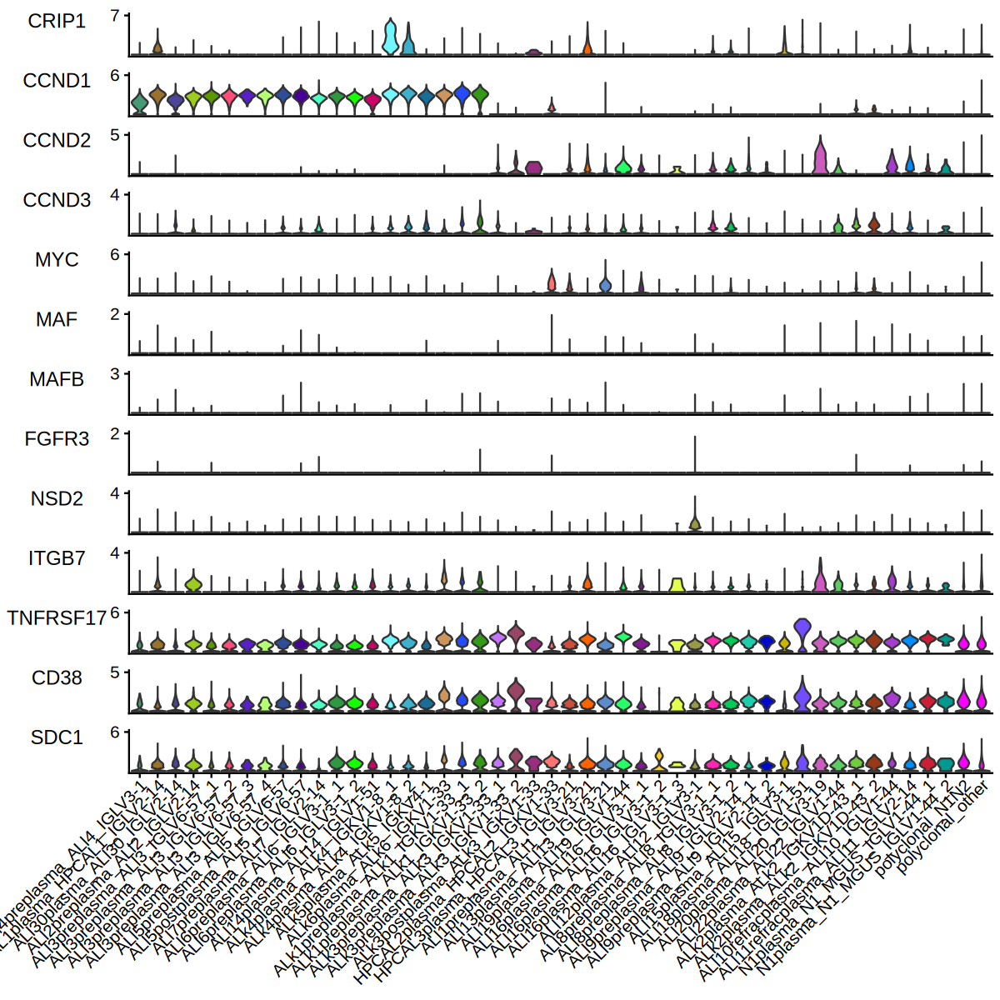

In [432]:
library(Seurat)
library(stringr)
library(scCustomize)

# ============================================================
# 0) Original order
# ============================================================

desired_order2 <- c(
  'ALl4preplasma_ALl4_IGLV3-1',
  "HPCAL1plasma_HPCAL1_IGLV2-14",
  "ALl30plasma_ALl30_IGLV2-14",
  "ALl2preplasma_ALl2_IGLV2-14",
  "ALl3preplasma_ALl3_IGLV6-57_1",
  "ALl3preplasma_ALl3_IGLV6-57_2",
  "ALl3preplasma_ALl3_IGLV6-57_3",
  "ALl3preplasma_ALl3_IGLV6-57_4",
  "ALl5preplasma_ALl5_IGLV6-57",
  "ALl5postplasma_ALl5_IGLV6-57",
  "ALl7preplasma_ALl7_IGLV2-14",
  "ALl6preplasma_ALl6_IGLV3-1_1",
  "ALl6preplasma_ALl6_IGLV3-1_2",
  "ALl14plasma_ALl14_IGLV1-51",
  "ALk4plasma_ALk4_IGKV1-8_1",
  "ALk4plasma_ALk4_IGKV1-8_2",
  "ALk5plasma_ALk5_IGKV4-1",
  "ALk6plasma_ALk6_IGKV1-33",
  "ALk1preplasma_ALk1_IGKV1-33_1",
  "ALk1preplasma_ALk1_IGKV1-33_2",
  "ALk3preplasma_ALk3_IGKV1-33_1",
  "ALk3preplasma_ALk3_IGKV1-33_2",
  "ALk3postplasma_ALk3_IGKV1-33",
  "HPCAL2plasma_HPCAL2_IGKV1-33",
  "HPCAL3plasma_HPCAL3_IGLV3-21",
  "ALl1preplasma_ALl1_IGLV3-21",
  "ALl13plasma_ALl13_IGLV3-21",
  "ALl19plasma_ALl19_IGLV1-44",
  "ALl16plasma_ALl16_IGLV3-1_1",
  "ALl16plasma_ALl16_IGLV3-1_2",
  "ALl16plasma_ALl16_IGLV3-1_3",
  "ALl12plasma_ALl12_IGLV3-1",
  "ALl8preplasma_ALl8_IGLV3-1_1",
  "ALl8preplasma_ALl8_IGLV3-1_2",
  "ALl9preplasma_ALl9_IGLV2-14_1",
  "ALl9preplasma_ALl9_IGLV2-14_2",
  "ALl15plasma_ALl15_IGLV3-1",
  "ALl18plasma_ALl18_IGLV1-51",
  "ALl20plasma_ALl20_IGLV3-19",
  "ALl22plasma_ALl22_IGLV1-44",
  "ALk2plasma_ALk2_IGKV1D-43_1",
  "ALk2plasma_ALk2_IGKV1D-43_2",
  "ALl10refracplasma_ALl10_IGLV1-44",
  "ALl11refracplasma_ALl11_IGLV2-14",
  "N1plasma_N1_MGUS_IGLV1-44_1",
  "N1plasma_N1_MGUS_IGLV1-44_2",
  "polyclonal"
)

# ============================================================
# 1) Recover the original color vector
# ============================================================
# This must be done BEFORE you overwrite plasmacellnumber.
# If plasmacellnumber$Color no longer exists, rerun the original color-generating code first.

if (!exists("plasmacellnumber")) {
  stop("plasmacellnumber does not exist. Please run the original code that creates plasmacellnumber with Color first.")
}

if (!"Color" %in% colnames(plasmacellnumber)) {
  stop(
    "plasmacellnumber has no Color column now.\n",
    "You likely overwrote it with table(sce1_plasma_clean$clonotype_plot).\n\n",
    "Fix: rerun your original code up to the point where plasmacellnumber$Color exists, ",
    "then run this patched block."
  )
}

if (!"Var1" %in% colnames(plasmacellnumber)) {
  stop("plasmacellnumber must contain a Var1 column.")
}

plasmacellnumber$Var1 <- as.character(plasmacellnumber$Var1)
rownames(plasmacellnumber) <- plasmacellnumber$Var1

plasmacellnumber_old <- plasmacellnumber[desired_order2, , drop = FALSE]

old_color_vector <- plasmacellnumber_old$Color
names(old_color_vector) <- plasmacellnumber_old$Var1

if (any(is.na(old_color_vector))) {
  stop(
    "Some original colors are NA. Missing colors for: ",
    paste(names(old_color_vector)[is.na(old_color_vector)], collapse = ", ")
  )
}

# ============================================================
# 2) Create plotting clonotype
# ============================================================

sce1_plasma_clean$clonotype_plot <- as.character(sce1_plasma_clean$clonotype)
sce1_plasma_clean$orig.ident <- as.character(sce1_plasma_clean$orig.ident)

sce1_plasma_clean$clonotype_plot[
  sce1_plasma_clean$clonotype == "polyclonal" &
    str_detect(sce1_plasma_clean$orig.ident, "^(N1|N2)")
] <- "polyclonal_N1N2"

sce1_plasma_clean$clonotype_plot[
  sce1_plasma_clean$clonotype == "polyclonal" &
    !str_detect(sce1_plasma_clean$orig.ident, "^(N1|N2)")
] <- "polyclonal_other"

# New order: same as original, but split polyclonal
desired_order2_plot <- c(
  desired_order2[desired_order2 != "polyclonal"],
  "polyclonal_N1N2",
  "polyclonal_other"
)

# ============================================================
# 3) Preserve the exact old colors
# ============================================================

color_vector_plot <- old_color_vector[desired_order2[desired_order2 != "polyclonal"]]

# Use the original polyclonal color for both split groups
color_vector_plot["polyclonal_N1N2"] <- old_color_vector["polyclonal"]
color_vector_plot["polyclonal_other"] <- old_color_vector["polyclonal"]

# If you want polyclonal_other to be lighter, use this instead:
# color_vector_plot["polyclonal_other"] <- "#E0E0E0"

color_vector_plot <- color_vector_plot[desired_order2_plot]

stopifnot(length(color_vector_plot) == length(desired_order2_plot))
stopifnot(!any(is.na(color_vector_plot)))

# ============================================================
# 4) Set identity
# ============================================================

sce1_plasma_clean$clonotype_plot <- factor(
  sce1_plasma_clean$clonotype_plot,
  levels = desired_order2_plot
)

Idents(sce1_plasma_clean) <- "clonotype_plot"

# ============================================================
# 5) Recalculate cell numbers using clonotype_plot
# ============================================================

plasmacellnumber_plot <- as.data.frame(table(sce1_plasma_clean$clonotype_plot))
colnames(plasmacellnumber_plot) <- c("Var1", "Freq")

plasmacellnumber_plot$Var1 <- as.character(plasmacellnumber_plot$Var1)
rownames(plasmacellnumber_plot) <- plasmacellnumber_plot$Var1

plasmacellnumber_plot <- plasmacellnumber_plot[desired_order2_plot, , drop = FALSE]
plasmacellnumber_plot$Var1 <- desired_order2_plot
plasmacellnumber_plot$Freq[is.na(plasmacellnumber_plot$Freq)] <- 0
plasmacellnumber_plot$Color <- unname(color_vector_plot)

print(plasmacellnumber_plot[, c("Var1", "Freq", "Color")])

# ============================================================
# 6) Plot
# ============================================================

gene_list_plot <- c(
  "CRIP1", "CCND1", "CCND2", "CCND3",
  "MYC", "MAF", "MAFB", "FGFR3", "NSD2",
  "ITGB7", "TNFRSF17", "CD38", "SDC1"
)

gene_list_plot <- gene_list_plot[gene_list_plot %in% rownames(sce1_plasma_clean)]

options(repr.plot.height = 10, repr.plot.width = 10)

Stacked_VlnPlot(
  seurat_object = sce1_plasma_clean,
  features = gene_list_plot,
  x_lab_rotate = TRUE,
  colors_use = plasmacellnumber_plot$Color
)

Assign groups of treatment and response

## 109. Clonotype assignment and repertoire analysis


In [434]:
sce1_plasma_clean$labeltreat <- sce1_plasma_clean$orig.ident
sce1_plasma_clean$labeltreat <- ifelse(grepl("N1|N2", sce1_plasma_clean$labeltreat), "Normal", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl9pre|ALl8pre|ALl6pre|ALl30|ALl20|ALl19|ALl18|ALl14|ALl13|ALl1pre|ALk4|ALk1pre", sce1_plasma_clean$labeltreat), "AL_CR_pre", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl9post|ALl8post|ALl6post|ALl1post|ALk1post", sce1_plasma_clean$labeltreat), "AL_CR_post", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl3pre|ALl22|ALk3pre|ALk2|HPCAL2", sce1_plasma_clean$labeltreat), "AL_VGPR_pre", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALk3post|ALl3post", sce1_plasma_clean$labeltreat), "AL_VGPR_post", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl7pre|ALl12|ALk6|HPCAL1", sce1_plasma_clean$labeltreat), "AL_NR/SD_pre", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl7post", sce1_plasma_clean$labeltreat), "AL_NR/SD_post", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl5pre|ALl4pre|ALl2pre|ALl16", sce1_plasma_clean$labeltreat), "AL_PR_pre", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("ALl5post|ALl4post|ALl2post|ALl11refrac|ALl10refrac", sce1_plasma_clean$labeltreat), "AL_PR_post", sce1_plasma_clean$labeltreat)
sce1_plasma_clean$labeltreat <- ifelse(grepl("HPCAL3|ALl15|ALk5", sce1_plasma_clean$labeltreat), "AL_NotRecorded", sce1_plasma_clean$labeltreat)

In [435]:
# Update Annotation based on clonotype rule
sce1_plasma_clean$Annotation <- with(
  sce1_plasma_clean@meta.data,
  case_when(
    clonotype == "polyclonal" ~ "polyclonal",
    TRUE ~ "diseaseclonal"
  )
)


In [436]:
saveRDS(sce1_plasma_clean,file='./250817-sce1_plasama-nomiss.rds')

In [437]:
library(sceasy)
library(reticulate)
sce1_plasma_clean[["RNA"]] <- as(sce1_plasma_clean[["RNA"]], "Assay")
sceasy::convertFormat(sce1_plasma_clean, from="seurat", to="anndata",outFile='counts_clean.h5ad')

Warning message in .regularise_df(obj@meta.data, drop_single_values = drop_single_values):
“Dropping single category variables:singlet”


AnnData object with n_obs × n_vars = 181834 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'subtype', 'mutation', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'barcode.1', 'clonotype', 'orig.ident.1', 'clonotype_plot', 'labeltreat', 'Annotation'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_umap'

Plot the gene expression programs

In [438]:
sample_info <- read.csv("./sampleannotation-all.csv", stringsAsFactors = FALSE)
colnames(sample_info)

[1] "samplename"          "gender"              "age"                
 [4] "mut"                 "type"                "stage"              
 [7] "dFLC"                "BMPC."               "bestorlast.response"
[10] "response.cycle"      "sample.cycle"        "post.treatment.type"
[13] "survival"

## 110. Gene-expression program analysis


In [439]:
# ============================================================
# Figure 2D revised heatmap:
# GEP usage + CNV score, split by cytogenetics and response
# Companion disease-marker expression heatmap
# ============================================================

library(Seurat)
library(dplyr)
library(tibble)
library(ComplexHeatmap)
library(circlize)
library(RColorBrewer)
library(grid)

# =========================
# 0) User settings
# =========================

signature_file   <- "plasma_cnmf_3_usage_norm_withoutIG_k=13.csv"
cnvscore_file    <- "adata.obs.cnv_score.csv"
annotation_file  <- "./sampleannotation-all.csv"

sample_col       <- "samplename"
group_col        <- "clonotype"

# IMPORTANT: change these column names if your sampleannotation-all.csv uses different names
cytogenetics_col <- "mut"
response_col     <- "bestorlast.response"
mayo_col         <- "stage"

# Optional annotation columns shown above heatmap
annotation_cols_to_show <- c(
  response_col,
  cytogenetics_col,
  mayo_col
)

# GEP rows to show, in manuscript order
gep_rows_to_show <- c(
  "Usage_1",
  "Usage_11",
  "Usage_2",
  "Usage_3",
  "Usage_4",
  "Usage_6",
  "Usage_7",
  "Usage_9",
  "Usage_8",
  "cnv_score"
)

# Rename GEP rows for figure readability
gep_row_labels <- c(
  Usage_1  = "GEP1",
  Usage_11 = "GEP11",
  Usage_2  = "GEP2",
  Usage_3  = "GEP3",
  Usage_4  = "GEP4",
  Usage_6  = "GEP6",
  Usage_7  = "GEP7",
  Usage_9  = "GEP9",
  Usage_8  = "GEP8",
  cnv_score = "CNV score"
)

# Disease marker genes from your Figure S1C
# Replace / expand this list according to your actual S1C markers
disease_marker_genes <- c(
  "CCND1", "CCND2",'CCND3',"MYC","MAF","MAFB",'FGFR3',"NSD2",'ITGB7','TNFRSF17',"CD38","SDC1"
)

# Manual order of cytogenetics / response blocks
# Adjust to your real categories
cytogenetics_order <- c(
  "t(11;14)",
  "t(4;14)",
  "gain1q",
  "hyperdiploid",
  "other",
  "Normal",
  "Unknown"
)

response_order <- c(
  "CR",
  "VGPR",
  "PR",
  "NR/SD",
  "Unknown"
)

# Output
out_pdf <- "Figure2D_revised_GEP_marker_heatmap_bluewhite.pdf"


# =========================
# 1) Helper functions
# =========================

scale_rows <- function(mat) {
  mat <- as.matrix(mat)
  z <- t(scale(t(mat)))
  z[is.na(z)] <- 0
  z
}

starts_with_ci <- function(x, prefix) {
  startsWith(tolower(x), tolower(prefix))
}

make_discrete_colors <- function(x, palette = "Set3") {
  vals <- unique(na.omit(as.character(x)))
  vals <- vals[vals != ""]
  if (length(vals) == 0) return(NULL)

  if (length(vals) <= 12) {
    pal <- brewer.pal(max(3, min(12, length(vals))), palette)
    pal <- pal[seq_len(length(vals))]
  } else {
    pal <- colorRampPalette(brewer.pal(12, palette))(length(vals))
  }

  names(pal) <- vals
  pal
}

longest_prefix_annotation <- function(sample_info, heatmap_cols, sample_col = "samplename") {
  stopifnot(sample_col %in% colnames(sample_info))

  ann_list <- lapply(colnames(sample_info), function(info_name) {
    info_column <- sample_info[[info_name]]

    sapply(heatmap_cols, function(col) {
      matched <- vapply(
        sample_info[[sample_col]],
        function(sn) starts_with_ci(col, sn),
        logical(1)
      )

      if (!any(matched)) return(NA)

      idxs <- which(matched)
      lens <- nchar(sample_info[[sample_col]][idxs],
                    type = "chars",
                    allowNA = FALSE,
                    keepNA = FALSE)
      idx <- idxs[which.max(lens)]

      info_column[idx]
    })
  })

  annotation_df <- as.data.frame(ann_list, stringsAsFactors = FALSE)
  colnames(annotation_df) <- colnames(sample_info)
  rownames(annotation_df) <- heatmap_cols

  annotation_df[[sample_col]] <- NULL

  annotation_df
}


# =========================
# 2) Read and attach cNMF usage + CNV score
#    Safe version: remove old duplicated Usage/cnv columns first
# =========================

signature <- read.csv(signature_file, stringsAsFactors = FALSE)
rownames(signature) <- signature$X
signature$X <- NULL

cnvscore <- read.csv(cnvscore_file, stringsAsFactors = FALSE)

# If cnvscore has a first column containing cell names, use it as rownames
if (!any(rownames(cnvscore) %in% rownames(sce1_plasma_clean@meta.data))) {
  possible_id_col <- colnames(cnvscore)[1]
  if (any(cnvscore[[possible_id_col]] %in% rownames(sce1_plasma_clean@meta.data))) {
    rownames(cnvscore) <- cnvscore[[possible_id_col]]
    cnvscore[[possible_id_col]] <- NULL
  }
}

# Add 0 rows for missing cells, same as your original code
n_cols <- ncol(signature)

new_rows <- matrix(0, nrow = 8, ncol = n_cols)
rownames(new_rows) <- c(
  "ALl9preplasma_GTCACGGAGTGCGTGA-1",
  "ALl5preplasma_GCATGTATCACAGTAC-1",
  "N1plasma_ACGAGGACATCAGTAC-1",
  "N1plasma_GCTCTGTAGAAACGAG-1",
  "ALl6preplasma_TAGACCACAGTATGCT-1",
  "ALl3preplasma_TAAACCGGTACTCTCC-1",
  "N2plasma_CAGGTGCGTCTTGATG-1",
  "ALk6plasma_ATTACTCAGCCAGTTT-1"
)

colnames(new_rows) <- colnames(signature)

signature_updated <- rbind(signature, new_rows)

# Align by cell barcode
meta0 <- sce1_plasma_clean@meta.data

signature_aligned <- signature_updated[rownames(meta0), , drop = FALSE]
cnvscore_aligned  <- cnvscore[rownames(meta0), , drop = FALSE]

# ------------------------------------------------------------
# Critical fix:
# remove old Usage_* and old cnv_score columns before cbind
# ------------------------------------------------------------

usage_cols_new <- colnames(signature_aligned)
cnv_cols_new   <- colnames(cnvscore_aligned)

cols_to_remove <- unique(c(
  usage_cols_new,
  cnv_cols_new,
  grep("^Usage_[0-9]+$", colnames(meta0), value = TRUE),
  "cnv_score"
))

cols_to_remove <- intersect(cols_to_remove, colnames(meta0))

meta0_clean <- meta0[, setdiff(colnames(meta0), cols_to_remove), drop = FALSE]

sce1_plasma_clean@meta.data <- cbind(
  meta0_clean,
  signature_aligned,
  cnvscore_aligned
)

# Check duplicated column names
dup_cols <- colnames(sce1_plasma_clean@meta.data)[
  duplicated(colnames(sce1_plasma_clean@meta.data))
]

if (length(dup_cols) > 0) {
  stop(
    "Still duplicated metadata columns: ",
    paste(unique(dup_cols), collapse = ", ")
  )
}

# =========================
# 3) Average GEP usage and CNV score by clonotype
# =========================

meta <- sce1_plasma_clean@meta.data

features <- c(
  paste0("Usage_", 1:13),
  "cnv_score"
)

features <- intersect(features, colnames(meta))
stopifnot(group_col %in% colnames(meta))

avg_mat <- meta %>%
  group_by(.data[[group_col]]) %>%
  summarise(across(all_of(features), mean, na.rm = TRUE), .groups = "drop") %>%
  column_to_rownames(group_col) %>%
  t()

# Keep selected GEPs and CNV score
gep_rows_to_show <- intersect(gep_rows_to_show, rownames(avg_mat))
avg_mat2 <- avg_mat[gep_rows_to_show, , drop = FALSE]


# =========================
# 4) Build sample annotations using longest-prefix matching
# =========================

sample_info <- read.csv(annotation_file, stringsAsFactors = FALSE)
stopifnot(sample_col %in% colnames(sample_info))

annotation_col <- longest_prefix_annotation(
  sample_info = sample_info,
  heatmap_cols = colnames(avg_mat2),
  sample_col = sample_col
)

# Keep only requested annotation columns that exist
annotation_cols_to_show <- intersect(annotation_cols_to_show, colnames(annotation_col))
annotation_col2 <- annotation_col[, annotation_cols_to_show, drop = FALSE]

# Fill missing block labels
if (cytogenetics_col %in% colnames(annotation_col2)) {
  annotation_col2[[cytogenetics_col]][is.na(annotation_col2[[cytogenetics_col]]) |
                                        annotation_col2[[cytogenetics_col]] == ""] <- "Unknown"
}

if (response_col %in% colnames(annotation_col2)) {
  annotation_col2[[response_col]][is.na(annotation_col2[[response_col]]) |
                                    annotation_col2[[response_col]] == ""] <- "Unknown"
}

# Factor levels for clean block order
if (cytogenetics_col %in% colnames(annotation_col2)) {
  observed_cyto <- unique(annotation_col2[[cytogenetics_col]])
  cytogenetics_order2 <- c(
    cytogenetics_order[cytogenetics_order %in% observed_cyto],
    setdiff(observed_cyto, cytogenetics_order)
  )

  annotation_col2[[cytogenetics_col]] <- factor(
    annotation_col2[[cytogenetics_col]],
    levels = cytogenetics_order2
  )
}

if (response_col %in% colnames(annotation_col2)) {
  observed_resp <- unique(annotation_col2[[response_col]])
  response_order2 <- c(
    response_order[response_order %in% observed_resp],
    setdiff(observed_resp, response_order)
  )

  annotation_col2[[response_col]] <- factor(
    annotation_col2[[response_col]],
    levels = response_order2
  )
}


# =========================
# 5) Average disease marker expression by clonotype
# =========================

disease_marker_genes <- intersect(disease_marker_genes, rownames(sce1_plasma_clean))

if (length(disease_marker_genes) == 0) {
  stop("None of the disease_marker_genes are found in the Seurat object.")
}

expr_df <- tryCatch(
  {
    FetchData(
      sce1_plasma_clean,
      vars = disease_marker_genes,
      layer = "data"
    )
  },
  error = function(e) {
    FetchData(
      sce1_plasma_clean,
      vars = disease_marker_genes,
      slot = "data"
    )
  }
)

expr_df[[group_col]] <- sce1_plasma_clean@meta.data[[group_col]]

marker_avg_mat <- expr_df %>%
  group_by(.data[[group_col]]) %>%
  summarise(across(all_of(disease_marker_genes), mean, na.rm = TRUE), .groups = "drop") %>%
  column_to_rownames(group_col) %>%
  t()

# Match columns to GEP heatmap
shared_cols <- intersect(colnames(avg_mat2), colnames(marker_avg_mat))
avg_mat2 <- avg_mat2[, shared_cols, drop = FALSE]
marker_avg_mat <- marker_avg_mat[, shared_cols, drop = FALSE]
annotation_col2 <- annotation_col2[shared_cols, , drop = FALSE]


# =========================
# 6) Scale rows for heatmap visualization
# =========================

gep_z <- scale_rows(avg_mat2)
marker_z <- scale_rows(marker_avg_mat)

# Improve row labels
rownames(gep_z) <- ifelse(
  rownames(gep_z) %in% names(gep_row_labels),
  gep_row_labels[rownames(gep_z)],
  rownames(gep_z)
)
# =========================
# 6.5) Clean annotation columns for ComplexHeatmap
# =========================

annotation_col2 <- as.data.frame(annotation_col2, stringsAsFactors = FALSE)

for (cc in colnames(annotation_col2)) {
  # If any column is accidentally a list column, flatten it
  if (is.list(annotation_col2[[cc]])) {
    annotation_col2[[cc]] <- vapply(
      annotation_col2[[cc]],
      function(x) {
        if (length(x) == 0 || all(is.na(x))) {
          NA_character_
        } else {
          as.character(x[1])
        }
      },
      character(1)
    )
  }

  annotation_col2[[cc]] <- as.character(annotation_col2[[cc]])

  annotation_col2[[cc]][is.na(annotation_col2[[cc]]) | annotation_col2[[cc]] == ""] <- "Unknown"
}

# Re-apply factor ordering after cleaning
if (cytogenetics_col %in% colnames(annotation_col2)) {
  observed_cyto <- unique(annotation_col2[[cytogenetics_col]])
  cytogenetics_order2 <- c(
    cytogenetics_order[cytogenetics_order %in% observed_cyto],
    setdiff(observed_cyto, cytogenetics_order)
  )

  annotation_col2[[cytogenetics_col]] <- factor(
    annotation_col2[[cytogenetics_col]],
    levels = cytogenetics_order2
  )
}

if (response_col %in% colnames(annotation_col2)) {
  observed_resp <- unique(annotation_col2[[response_col]])
  response_order2 <- c(
    response_order[response_order %in% observed_resp],
    setdiff(observed_resp, response_order)
  )

  annotation_col2[[response_col]] <- factor(
    annotation_col2[[response_col]],
    levels = response_order2
  )
}

# Check again
str(annotation_col2)

# =========================
# 7) Define colors
# =========================

gep_col_fun <- colorRamp2(
  c(-2, 0, 2),
  c("#2166AC", "white", "#B2182B")
)

marker_col_fun <- colorRamp2(
  c(-2, 0, 2),
  c("#2166AC", "white", "#B2182B")
)

ann_colors <- list()

for (ann_name in colnames(annotation_col2)) {
  tmp_col <- make_discrete_colors(annotation_col2[[ann_name]])
  if (!is.null(tmp_col)) {
    ann_colors[[ann_name]] <- tmp_col
  }
}

# Important: make sure ann_colors only contains columns present in annotation_col2
ann_colors <- ann_colors[names(ann_colors) %in% colnames(annotation_col2)]

top_ha <- HeatmapAnnotation(
  df = annotation_col2,
  col = ann_colors,
  annotation_name_side = "left",
  annotation_name_gp = gpar(fontsize = 8),
  simple_anno_size = unit(3.5, "mm"),
  show_annotation_name = TRUE
)

# =========================
# 8) Column split: cytogenetics first, response second
# =========================

if (!all(c(cytogenetics_col, response_col) %in% colnames(annotation_col2))) {
  stop("cytogenetics_col and/or response_col not found in annotation_col2. Please check column names.")
}

column_split_df <- data.frame(
  Cytogenetics = annotation_col2[[cytogenetics_col]],
  Response     = annotation_col2[[response_col]]
)

rownames(column_split_df) <- rownames(annotation_col2)


# =========================
# 9) Heatmaps
# =========================

ht_gep <- Heatmap(
  gep_z,
  name = "GEP\nz-score",
  col = gep_col_fun,
  top_annotation = top_ha,

  cluster_rows = FALSE,

  # This clusters samples within each cytogenetics/response block
  cluster_columns = TRUE,
  clustering_distance_columns = "euclidean",
  clustering_method_columns = "complete",

  column_split = column_split_df,
  cluster_column_slices = FALSE,

  show_column_names = TRUE,
  column_names_gp = gpar(fontsize = 6),
  column_names_rot = 90,

  row_names_side = "left",
  row_names_gp = gpar(fontsize = 9),

  border = FALSE,
  rect_gp = gpar(col = NA),

  heatmap_legend_param = list(
    title = "Row-scaled\nscore",
    legend_height = unit(35, "mm")
  ),

  column_title_gp = gpar(fontsize = 8, fontface = "bold"),
  column_title_rot = 0
)

ht_marker <- Heatmap(
  marker_z,
  name = "Marker\nz-score",
  col = marker_col_fun,

  cluster_rows = TRUE,

  # Do not recluster columns here; inherit the order from the main GEP heatmap
  cluster_columns = FALSE,
  column_split = column_split_df,
  cluster_column_slices = FALSE,

  show_column_names = FALSE,

  row_names_side = "left",
  row_names_gp = gpar(fontsize = 8),

  border = FALSE,
  rect_gp = gpar(col = NA),

  heatmap_legend_param = list(
    title = "Row-scaled\nexpression",
    legend_height = unit(35, "mm")
  )
)


# =========================
# 10) Draw and save
# =========================

pdf(out_pdf, width = 16, height = 10)

draw(
  ht_gep %v% ht_marker,
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  merge_legends = TRUE
)

dev.off()

message("Saved revised heatmap to: ", out_pdf)

ComplexHeatmap version 2.18.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))
! pheatmap() has been masked by ComplexHeatmap::pheatmap(). Most of the arguments
   in the original pheatmap() are identically supported in the new function. You 
   can still use the original function by explicitly calling pheatmap::pheatmap().



Attaching package: ‘ComplexHeatmap’


The following ob

'data.frame':	47 obs. of  3 variables:
 $ bestorlast.response: Factor w/ 5 levels "CR","VGPR","PR",..: 1 1 2 2 2 2 2 1 1 5 ...
 $ mut                : Factor w/ 6 levels "Unknown","IgH/CCND1(t(11;14))",..: 2 2 3 3 2 2 2 2 2 2 ...
 $ stage              : chr  "2" "2" "2" "2" ...


pdf 
  2

Saved revised heatmap to: Figure2D_revised_GEP_marker_heatmap_bluewhite.pdf



In [440]:
# ============================================================
# Figure 2D revised heatmap:
# GEP usage + inferCNV score, split by mut and response
# Companion disease-marker expression heatmap
# ============================================================

library(Seurat)
library(dplyr)
library(tibble)
library(ComplexHeatmap)
library(circlize)
library(RColorBrewer)
library(grid)

# =========================
# 0) User settings
# =========================

signature_file   <- "plasma_cnmf_3_usage_norm_withoutIG_k=13.csv"
cnvscore_file    <- "adata.obs.cnv_score.csv"
annotation_file  <- "./sampleannotation-all.csv"

sample_col       <- "samplename"
group_col        <- "clonotype"

# Annotation columns in sampleannotation-all.csv
cytogenetics_col <- "mut"
response_col     <- "bestorlast.response"
mayo_col         <- "stage"

# Put mut first in the annotation bar
annotation_cols_to_show <- c(
  cytogenetics_col,
  response_col,
  mayo_col
)

# GEP rows to show
gep_rows_to_show <- c(
  "Usage_1",
  "Usage_11",
  "Usage_2",
  "Usage_3",
  "Usage_4",
  "Usage_6",
  "Usage_7",
  "Usage_9",
  "Usage_8",
  "cnv_score"
)

# Rename GEP rows
gep_row_labels <- c(
  Usage_1   = "GEP1",
  Usage_11  = "GEP11",
  Usage_2   = "GEP2",
  Usage_3   = "GEP3",
  Usage_4   = "GEP4",
  Usage_6   = "GEP6",
  Usage_7   = "GEP7",
  Usage_9   = "GEP9",
  Usage_8   = "GEP8",
  cnv_score = "inferCNV score"
)

# Disease marker genes from Figure S1C
disease_marker_genes <- c(
  "CCND1",
  "CCND2",
  "CCND3",
  "MYC",
  "MAF",
  "MAFB",
  "FGFR3",
  "NSD2",
  "ITGB7",
  "TNFRSF17",
  "CD38",
  "SDC1"
)

# Optional manual order.
# Any observed values not listed here will be appended automatically.
cytogenetics_order <- c(
  "t(11;14)",
  "t(4;14)",
  "gain1q",
  "hyperdiploid",
  "other",
  "Normal",
  "Unknown"
)

response_order <- c(
  "CR",
  "VGPR",
  "PR",
  "NR/SD",
  "Unknown"
)

out_pdf <- "Figure2D_revised_GEP_marker_heatmap.pdf"


# =========================
# 1) Helper functions
# =========================

starts_with_ci <- function(x, prefix) {
  startsWith(tolower(x), tolower(prefix))
}

scale_rows_keep_na <- function(mat) {
  mat <- as.matrix(mat)
  z <- mat

  for (i in seq_len(nrow(mat))) {
    x <- mat[i, ]

    if (all(is.na(x))) {
      z[i, ] <- NA_real_
    } else if (sd(x, na.rm = TRUE) == 0) {
      z[i, ] <- 0
    } else {
      z[i, ] <- as.numeric(scale(x))
    }
  }

  z
}

make_discrete_colors <- function(x, palette = "Spectral") {
  x <- as.character(x)

  if (is.factor(x)) {
    vals <- levels(x)
  } else {
    vals <- unique(na.omit(x))
  }

  vals <- vals[!is.na(vals) & vals != ""]

  if (length(vals) == 0) return(NULL)

  spectral_base <- rev(brewer.pal(11, palette))

  if (length(vals) <= 11) {
    pal <- spectral_base[round(seq(1, 11, length.out = length(vals)))]
  } else {
    pal <- colorRampPalette(spectral_base)(length(vals))
  }

  names(pal) <- vals
  pal
}
longest_prefix_annotation <- function(sample_info, heatmap_cols, sample_col = "samplename") {
  stopifnot(sample_col %in% colnames(sample_info))

  sample_info <- as.data.frame(sample_info, stringsAsFactors = FALSE)

  out <- data.frame(row.names = heatmap_cols)

  annotation_names <- setdiff(colnames(sample_info), sample_col)

  for (info_name in annotation_names) {
    out[[info_name]] <- sapply(heatmap_cols, function(col) {
      matched <- vapply(
        sample_info[[sample_col]],
        function(sn) starts_with_ci(col, sn),
        logical(1)
      )

      if (!any(matched)) return(NA_character_)

      idxs <- which(matched)

      lens <- nchar(
        sample_info[[sample_col]][idxs],
        type = "chars",
        allowNA = FALSE,
        keepNA = FALSE
      )

      idx <- idxs[which.max(lens)]

      val <- sample_info[[info_name]][idx]

      if (length(val) == 0 || is.na(val) || val == "") {
        NA_character_
      } else {
        as.character(val)
      }
    })
  }

  out
}

# =========================
# 2) Read and attach cNMF usage + CNV score
#    CNV score file has only one score column; bind by row order
# =========================

signature <- read.csv(signature_file, stringsAsFactors = FALSE)
rownames(signature) <- signature$X
signature$X <- NULL

# Read CNV score simply.
# The file has only one column: the score.
# Do NOT use row.names = 1 because duplicated rownames cause error.
cnvscore <- read.csv(
  cnvscore_file,
  stringsAsFactors = FALSE,
  check.names = FALSE
)

if (ncol(cnvscore) != 1) {
  stop(
    "cnvscore file should contain exactly one score column. Current ncol = ",
    ncol(cnvscore)
  )
}

colnames(cnvscore) <- "cnv_score"

# Add 0 rows for missing cells, same as your original code
n_cols <- ncol(signature)

new_rows <- matrix(0, nrow = 8, ncol = n_cols)

rownames(new_rows) <- c(
  "ALl9preplasma_GTCACGGAGTGCGTGA-1",
  "ALl5preplasma_GCATGTATCACAGTAC-1",
  "N1plasma_ACGAGGACATCAGTAC-1",
  "N1plasma_GCTCTGTAGAAACGAG-1",
  "ALl6preplasma_TAGACCACAGTATGCT-1",
  "ALl3preplasma_TAAACCGGTACTCTCC-1",
  "N2plasma_CAGGTGCGTCTTGATG-1",
  "ALk6plasma_ATTACTCAGCCAGTTT-1"
)

colnames(new_rows) <- colnames(signature)

signature_updated <- rbind(signature, new_rows)

meta0 <- sce1_plasma_clean@meta.data

# Align signature by cell barcode
signature_aligned <- signature_updated[rownames(meta0), , drop = FALSE]

# Bind CNV score by row order
if (nrow(cnvscore) != nrow(meta0)) {
  stop(
    "cnvscore row number does not match metadata row number.\n",
    "nrow(cnvscore) = ", nrow(cnvscore), "\n",
    "nrow(meta0) = ", nrow(meta0), "\n",
    "Because cnvscore has no cell barcode column, row-order binding requires exactly matched row numbers."
  )
}

cnvscore_aligned <- data.frame(
  cnv_score = as.numeric(cnvscore[[1]]),
  row.names = rownames(meta0)
)

# Remove old duplicated Usage_* and cnv_score columns before binding
cols_to_remove <- unique(c(
  colnames(signature_aligned),
  "cnv_score",
  grep("^Usage_[0-9]+$", colnames(meta0), value = TRUE)
))

cols_to_remove <- intersect(cols_to_remove, colnames(meta0))

meta0_clean <- meta0[, setdiff(colnames(meta0), cols_to_remove), drop = FALSE]

sce1_plasma_clean@meta.data <- cbind(
  meta0_clean,
  signature_aligned,
  cnvscore_aligned
)

dup_cols <- colnames(sce1_plasma_clean@meta.data)[
  duplicated(colnames(sce1_plasma_clean@meta.data))
]

if (length(dup_cols) > 0) {
  stop(
    "Still duplicated metadata columns: ",
    paste(unique(dup_cols), collapse = ", ")
  )
}
# =========================
# 3) Average GEP usage and CNV score by clonotype
# =========================

meta <- sce1_plasma_clean@meta.data

features <- c(
  paste0("Usage_", 1:13),
  "cnv_score"
)

features <- intersect(features, colnames(meta))

if (!"cnv_score" %in% features) {
  warning("cnv_score was not found in metadata. The heatmap will use GEP rows only.")
}

stopifnot(group_col %in% colnames(meta))

avg_mat <- meta %>%
  group_by(.data[[group_col]]) %>%
  summarise(across(all_of(features), mean, na.rm = TRUE), .groups = "drop") %>%
  column_to_rownames(group_col) %>%
  t()

gep_rows_to_show <- intersect(gep_rows_to_show, rownames(avg_mat))
avg_mat2 <- avg_mat[gep_rows_to_show, , drop = FALSE]
# =========================
# 4) Build sample annotations using longest-prefix matching
# =========================

sample_info <- read.csv(annotation_file, stringsAsFactors = FALSE)
stopifnot(sample_col %in% colnames(sample_info))

annotation_col <- longest_prefix_annotation(
  sample_info = sample_info,
  heatmap_cols = colnames(avg_mat2),
  sample_col = sample_col
)

missing_anno_cols <- setdiff(annotation_cols_to_show, colnames(annotation_col))

if (length(missing_anno_cols) > 0) {
  stop(
    "These annotation columns were not found: ",
    paste(missing_anno_cols, collapse = ", "),
    "\nAvailable annotation columns are:\n",
    paste(colnames(annotation_col), collapse = ", ")
  )
}

annotation_col2 <- annotation_col[, annotation_cols_to_show, drop = FALSE]

# Clean annotation columns
annotation_col2 <- as.data.frame(annotation_col2, stringsAsFactors = FALSE)

for (cc in colnames(annotation_col2)) {
  if (is.list(annotation_col2[[cc]])) {
    annotation_col2[[cc]] <- vapply(
      annotation_col2[[cc]],
      function(x) {
        if (length(x) == 0 || all(is.na(x))) {
          NA_character_
        } else {
          as.character(x[1])
        }
      },
      character(1)
    )
  }

  annotation_col2[[cc]] <- as.character(annotation_col2[[cc]])
  annotation_col2[[cc]][is.na(annotation_col2[[cc]]) | annotation_col2[[cc]] == ""] <- "Unknown"
}

# Factor order for mut
observed_cyto <- unique(annotation_col2[[cytogenetics_col]])

cytogenetics_order2 <- c(
  cytogenetics_order[cytogenetics_order %in% observed_cyto],
  setdiff(observed_cyto, cytogenetics_order)
)

annotation_col2[[cytogenetics_col]] <- factor(
  annotation_col2[[cytogenetics_col]],
  levels = cytogenetics_order2
)

# Factor order for response
observed_resp <- unique(annotation_col2[[response_col]])

response_order2 <- c(
  response_order[response_order %in% observed_resp],
  setdiff(observed_resp, response_order)
)

annotation_col2[[response_col]] <- factor(
  annotation_col2[[response_col]],
  levels = response_order2
)


# =========================
# 5) Average disease marker expression by clonotype
# =========================

disease_marker_genes <- intersect(disease_marker_genes, rownames(sce1_plasma_clean))

if (length(disease_marker_genes) == 0) {
  stop("None of the disease_marker_genes are found in the Seurat object.")
}

expr_df <- tryCatch(
  {
    FetchData(
      sce1_plasma_clean,
      vars = disease_marker_genes,
      layer = "data"
    )
  },
  error = function(e) {
    FetchData(
      sce1_plasma_clean,
      vars = disease_marker_genes,
      slot = "data"
    )
  }
)

expr_df[[group_col]] <- sce1_plasma_clean@meta.data[[group_col]]

marker_avg_mat <- expr_df %>%
  group_by(.data[[group_col]]) %>%
  summarise(across(all_of(disease_marker_genes), mean, na.rm = TRUE), .groups = "drop") %>%
  column_to_rownames(group_col) %>%
  t()


# =========================
# 6) Match columns across GEP, marker, annotation
# =========================

shared_cols <- Reduce(
  intersect,
  list(
    colnames(avg_mat2),
    colnames(marker_avg_mat),
    rownames(annotation_col2)
  )
)

if (length(shared_cols) == 0) {
  stop("No shared clonotypes found across GEP matrix, marker matrix, and annotations.")
}

avg_mat2 <- avg_mat2[, shared_cols, drop = FALSE]
marker_avg_mat <- marker_avg_mat[, shared_cols, drop = FALSE]
annotation_col2 <- annotation_col2[shared_cols, , drop = FALSE]


# =========================
# 7) Make inferCNV score blank if missing/all-zero
# =========================

if ("cnv_score" %in% rownames(avg_mat2)) {
  if (all(is.na(avg_mat2["cnv_score", ])) ||
      all(avg_mat2["cnv_score", ] == 0, na.rm = TRUE)) {
    avg_mat2["cnv_score", ] <- NA_real_
  }
}


# =========================
# 8) Scale rows
# =========================

gep_z <- scale_rows_keep_na(avg_mat2)
marker_z <- scale_rows_keep_na(marker_avg_mat)

rownames(gep_z) <- ifelse(
  rownames(gep_z) %in% names(gep_row_labels),
  gep_row_labels[rownames(gep_z)],
  rownames(gep_z)
)


# =========================
# 9) Colors
# =========================

# Blue-black-yellow for GEP and inferCNV
gep_col_fun <- colorRamp2(
  c(-2, 0, 2),
  c("#2166AC", "black", "#FFD92F")
)

# Use same blue-black-yellow for marker heatmap for visual consistency
marker_col_fun <- colorRamp2(
  c(-2, 0, 2),
  c("#2166AC", "black", "#FFD92F")
)

# Spectral annotation colors
ann_colors <- list()

for (ann_name in colnames(annotation_col2)) {
  tmp_col <- make_discrete_colors(annotation_col2[[ann_name]], palette = "Spectral")
  if (!is.null(tmp_col)) {
    ann_colors[[ann_name]] <- tmp_col
  }
}

ann_colors <- ann_colors[names(ann_colors) %in% colnames(annotation_col2)]

top_ha <- HeatmapAnnotation(
  df = annotation_col2,
  col = ann_colors,
  annotation_name_side = "left",
  annotation_name_gp = gpar(fontsize = 8),
  annotation_name_rot = 0,
  simple_anno_size = unit(3.5, "mm"),
  show_annotation_name = TRUE
)


# =========================
# 10) Column split:
#     vertical white gaps by mut first, response second
# =========================

column_split_df <- data.frame(
  mut = annotation_col2[[cytogenetics_col]],
  response = annotation_col2[[response_col]]
)

rownames(column_split_df) <- rownames(annotation_col2)


# =========================
# 11) Heatmaps
# =========================

ht_gep <- Heatmap(
  gep_z,
  name = "GEP / inferCNV\nz-score",
  col = gep_col_fun,
  na_col = "white",

  top_annotation = top_ha,

  cluster_rows = FALSE,

  # Cluster clonotypes within each mut/response block
  cluster_columns = TRUE,
  clustering_distance_columns = "euclidean",
  clustering_method_columns = "complete",

  # Facet by mut/response with vertical white gaps
  column_split = column_split_df,
  cluster_column_slices = FALSE,
  column_gap = unit(3, "mm"),

  # Do not omit clonotype names
  show_column_names = TRUE,
  column_names_gp = gpar(fontsize = 6),
  column_names_rot = 90,

  show_row_names = TRUE,
  row_names_side = "left",
  row_names_gp = gpar(fontsize = 9),

  border = FALSE,
  rect_gp = gpar(col = NA),

  heatmap_legend_param = list(
    title = "Row-scaled\nscore",
    legend_height = unit(35, "mm")
  ),

  column_title_gp = gpar(fontsize = 8, fontface = "bold"),
  column_title_rot = 0
)

ht_marker <- Heatmap(
  marker_z,
  name = "Marker\nz-score",
  col = marker_col_fun,
  na_col = "white",

  cluster_rows = TRUE,

  # Match column split/order to GEP heatmap
  cluster_columns = FALSE,
  column_split = column_split_df,
  cluster_column_slices = FALSE,
  column_gap = unit(3, "mm"),

  # Do not omit clonotype names
  show_column_names = TRUE,
  column_names_gp = gpar(fontsize = 6),
  column_names_rot = 90,

  show_row_names = TRUE,
  row_names_side = "left",
  row_names_gp = gpar(fontsize = 8),

  border = FALSE,
  rect_gp = gpar(col = NA),

  heatmap_legend_param = list(
    title = "Row-scaled\nexpression",
    legend_height = unit(35, "mm")
  )
)


# =========================
# 12) Draw and save
# =========================

pdf(out_pdf, width = 18, height = 11)

draw(
  ht_gep %v% ht_marker,
  heatmap_legend_side = "right",
  annotation_legend_side = "right",
  merge_legends = TRUE
)

dev.off()

message("Saved revised heatmap to: ", out_pdf)

pdf 
  2

Saved revised heatmap to: Figure2D_revised_GEP_marker_heatmap.pdf



In [441]:
library(tidyverse)
library(rstatix)
library(ggpubr)  # optional

# ---------- 0) INPUTS ----------
# avg_mat: rows=subtypes, cols=samples (subtype scores)
# annotation_col2: rownames=sample IDs; columns = annotations
stopifnot(all(colnames(avg_mat) %in% rownames(annotation_col2)))

# ---------- 1) LONG FORMAT ----------
long_df <- avg_mat %>%
  as.data.frame() %>%
  rownames_to_column("subtype") %>%
  pivot_longer(-subtype, names_to = "sample", values_to = "score") %>%
  left_join(annotation_col2 %>% rownames_to_column("sample"), by = "sample") %>%
  # ---- NEW FILTER ----
  filter(!grepl("post", sample, ignore.case = TRUE),
         !grepl("N1", sample, ignore.case = TRUE),
         !grepl("polyclonal", sample, ignore.case = TRUE),
         !grepl("refrac", sample, ignore.case = TRUE))


# ---------- 2) STATS FUNCTION (UNCHANGED) ----------
compare_by <- function(df, ann_var, nonparam = TRUE) {
  message("Processing ", ann_var)
  if (!(ann_var %in% colnames(df))) return(NULL)
  v <- df[[ann_var]]
  
  if (is.numeric(v)) {
    out <- df %>%
      group_by(subtype) %>%
      summarise(
        n = n(),
        method = "spearman",
        rho = suppressWarnings(cor(score, !!sym(ann_var), method = "spearman", use = "complete.obs")),
        p = suppressWarnings(cor.test(score, !!sym(ann_var), method = "spearman")$p.value),
        .groups = "drop"
      ) %>%
      mutate(ann_var = ann_var, p_adj = p.adjust(p, method = "BH"))
    
  } else {
    df2 <- df %>%
      filter(!is.na(.data[[ann_var]])) %>%
      mutate(group = droplevels(factor(.data[[ann_var]])))
    
    if (nonparam) {
      out <- df2 %>%
        group_by(subtype) %>%
        kruskal_test(score ~ group) %>%
        ungroup() %>%
        rename(p = p) %>%
        mutate(method = "kruskal", ann_var = ann_var, p_adj = p.adjust(p, method = "BH"))
    } else {
      out <- df2 %>%
        group_by(subtype) %>%
        anova_test(score ~ group) %>%
        ungroup() %>%
        filter(Effect == "group") %>%
        transmute(
          subtype,
          method = "anova",
          ann_var = ann_var,
          p = p,
          p_adj = p.adjust(p, method = "BH")
        )
    }
  }
  out
}

# ---------- 3) RUN FOR ALL ANNOTATIONS ----------
ann_list <- setdiff(colnames(annotation_col2), "sample")
stats_all <- map_dfr(ann_list, ~compare_by(long_df, .x, nonparam = TRUE))

# Peek the strongest signals
stats_all %>% arrange(p_adj) %>% head(30)

# ---------- 4) PLOTTING HELPERS ----------
dir.create("subtype_diff_plots", showWarnings = FALSE)

alpha_sig <- 0.05         # FDR threshold to plot “significant” subtypes
top_n_if_none <- 12       # If nothing is significant, plot the top N by smallest FDR
min_groups_categ <- 2     # Require ≥2 groups for boxplots

# Numeric annotation (Spearman): faceted scatter+smooth over significant subtypes
plot_numeric_ann <- function(df, ann_var, stats_tbl) {
  st <- stats_tbl %>% filter(ann_var == !!ann_var, method == "spearman")
  if (nrow(st) == 0) return(invisible(NULL))
  
  # choose which subtypes to show
  sig_st <- st %>% filter(!is.na(p_adj) & p_adj < alpha_sig) %>% arrange(p_adj)
  if (nrow(sig_st) == 0) {
    sig_st <- st %>% arrange(p_adj) %>% head(top_n_if_none)
  }
  keep_subtypes <- sig_st$subtype
  
  lab_df <- sig_st %>%
    mutate(lbl = paste0(subtype, "\nρ=", sprintf("%.2f", rho), ", FDR=", scales::label_pvalue(accuracy = 0.001)(p_adj)))
  facet_labels <- setNames(lab_df$lbl, lab_df$subtype)
  
  p <- df %>%
    filter(subtype %in% keep_subtypes) %>%
    ggplot(aes(x = .data[[ann_var]], y = score)) +
    geom_point(alpha = 0.5, size = 0.9) +
    geom_smooth(method = "lm", se = TRUE) +
    facet_wrap(~ subtype, scales = "free_y", labeller = as_labeller(facet_labels)) +
    labs(title = paste0("Spearman: ", ann_var, " vs subtype scores"),
         x = ann_var, y = "Subtype score") +
    theme_bw(base_size = 12)
  
  outfile <- file.path("subtype_diff_plots", paste0(ann_var, "_spearman.png"))
  ggsave(outfile, p, width = 12, height = 8, dpi = 300)
  message("Saved: ", outfile)
}

# Categorical annotation (Kruskal): faceted boxplot+jitter over significant subtypes
plot_categorical_ann <- function(df, ann_var, stats_tbl) {
  st <- stats_tbl %>% filter(ann_var == !!ann_var, method == "kruskal")
  if (nrow(st) == 0) return(invisible(NULL))
  
  # choose which subtypes to show
  sig_st <- st %>% filter(!is.na(p_adj) & p_adj < alpha_sig) %>% arrange(p_adj)
  if (nrow(sig_st) == 0) {
    sig_st <- st %>% arrange(p_adj) %>% head(top_n_if_none)
  }
  keep_subtypes <- sig_st$subtype
  
  # ensure grouping factor has >=2 levels within each subtype
  df2 <- df %>% mutate(group = droplevels(factor(.data[[ann_var]])))
  vALld_subtypes <- df2 %>% group_by(subtype) %>%
    summarise(n_groups = n_distinct(group[!is.na(group)]), .groups = "drop") %>%
    filter(n_groups >= min_groups_categ) %>% pull(subtype)
  
  keep_subtypes <- intersect(keep_subtypes, vALld_subtypes)
  if (length(keep_subtypes) == 0) return(invisible(NULL))
  
  lab_df <- sig_st %>%
    filter(subtype %in% keep_subtypes) %>%
    mutate(lbl = paste0(subtype, "\nKW FDR=", scales::label_pvalue(accuracy = 0.001)(p_adj)))
  facet_labels <- setNames(lab_df$lbl, lab_df$subtype)
  
  p <- df2 %>%
    filter(subtype %in% keep_subtypes) %>%
    ggplot(aes(x = group, y = score)) +
    geom_boxplot(outlier.shape = NA) +
    geom_point(position = position_jitter(width = 0.15, height = 0), alpha = 0.5, size = 0.9) +
    facet_wrap(~ subtype, scales = "free_y", labeller = as_labeller(facet_labels)) +
    labs(title = paste0("Kruskal–Wallis: ", ann_var, " vs subtype scores"),
         x = ann_var, y = "Subtype score") +
    theme_bw(base_size = 12) +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))
  
  outfile <- file.path("subtype_diff_plots", paste0(ann_var, "_kruskal.png"))
  ggsave(outfile, p, width = 12, height = 8, dpi = 300)
  message("Saved: ", outfile)
}

# ---------- 5) AUTO-PLOT FOR EVERY ANNOTATION ----------
for (ann_var in ann_list) {
  v <- long_df[[ann_var]]
  if (is.numeric(v)) {
    plot_numeric_ann(long_df, ann_var, stats_all)
  } else {
    plot_categorical_ann(long_df, ann_var, stats_all)
  }
}

# ---------- 6) (Optional) Write the stats table ----------
readr::write_csv(stats_all %>% arrange(p_adj), "subtype_diff_plots/subtype_diff_stats.csv")

message("Done. Plots and stats saved in ./subtype_diff_plots")



Attaching package: ‘rstatix’


The following object is masked from ‘package:IRanges’:

    desc


The following object is masked from ‘package:stats’:

    filter



Attaching package: ‘ggpubr’


The following object is masked from ‘package:VennDiagram’:

    rotate


Processing mut

Processing bestorlast.response

Processing stage



subtype,.y.,n,statistic,df,p,method,ann_var,p_adj
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>
Usage_1,score,40,26.877605,4,0.000021,kruskal,mut,0.0002940
Usage_6,score,40,17.460273,4,0.001570,kruskal,bestorlast.response,0.0219800
Usage_4,score,40,15.720765,4,0.003420,kruskal,mut,0.0239400
Usage_12,score,40,9.136641,4,0.057800,kruskal,mut,0.1162000
Usage_3,score,40,10.866962,4,0.028100,kruskal,mut,0.1162000
Usage_5,score,40,9.071619,4,0.059300,kruskal,mut,0.1162000
Usage_6,score,40,9.454157,4,0.050700,kruskal,mut,0.1162000
Usage_7,score,40,9.908792,4,0.042000,kruskal,mut,0.1162000
cnv_score,score,40,8.794767,4,0.066400,kruskal,mut,0.1162000


Saved: subtype_diff_plots/mut_kruskal.png

Saved: subtype_diff_plots/bestorlast.response_kruskal.png

Saved: subtype_diff_plots/stage_kruskal.png

Done. Plots and stats saved in ./subtype_diff_plots



## 111. INPUTS


In [442]:
library(tidyverse)
library(rstatix)
library(ggpubr)  # optional

# ---------- 0) INPUTS ----------
# avg_mat: rows=subtypes, cols=samples (subtype scores)
# annotation_col2: rownames=sample IDs; columns = annotations
stopifnot(all(colnames(avg_mat) %in% rownames(annotation_col2)))

# ---------- 1) LONG FORMAT ----------
long_df <- avg_mat %>%
  as.data.frame() %>%
  rownames_to_column("subtype") %>%
  pivot_longer(-subtype, names_to = "sample", values_to = "score") %>%
  left_join(annotation_col2 %>% rownames_to_column("sample"), by = "sample") %>%
  # ---- NEW FILTER ----
  filter(!grepl("post", sample, ignore.case = TRUE),
         !grepl("N1", sample, ignore.case = TRUE),
         !grepl("polyclonal", sample, ignore.case = TRUE),
         !grepl("refrac", sample, ignore.case = TRUE))

# ---------- 2) OUTLIER REMOVAL (FOR SPEARMAN ONLY) ----------
# Remove IQR outliers within each subtype for BOTH:
#   - y = score
#   - x = numeric annotation ann_var
remove_outliers_spearman <- function(df, ann_var) {
  stopifnot(ann_var %in% colnames(df))
  df %>%
    filter(!is.na(score), !is.na(.data[[ann_var]])) %>%
    group_by(subtype) %>%
    mutate(
      out_score = rstatix::is_outlier(score),
      out_x     = rstatix::is_outlier(.data[[ann_var]])
    ) %>%
    ungroup() %>%
    filter(!out_score, !out_x) %>%
    select(-out_score, -out_x)
}

# ---------- 3) STATS FUNCTION (SPEARMAN UPDATED) ----------
compare_by <- function(df, ann_var, nonparam = TRUE) {
  message("Processing ", ann_var)
  if (!(ann_var %in% colnames(df))) return(NULL)
  v <- df[[ann_var]]

  if (is.numeric(v)) {
    # ---- OUTLIER REMOVAL BEFORE SPEARMAN ----
    df_no <- remove_outliers_spearman(df, ann_var)

    out <- df_no %>%
      group_by(subtype) %>%
      summarise(
        n = n(),
        method = "spearman",
        rho = {
          x <- .data[[ann_var]]
          y <- score
          if (n() < 3 || length(unique(x)) < 2 || length(unique(y)) < 2) NA_real_
          else suppressWarnings(cor(y, x, method = "spearman", use = "complete.obs"))
        },
        p = {
          x <- .data[[ann_var]]
          y <- score
          if (n() < 3 || length(unique(x)) < 2 || length(unique(y)) < 2) NA_real_
          else suppressWarnings(cor.test(y, x, method = "spearman")$p.value)
        },
        .groups = "drop"
      ) %>%
      mutate(
        ann_var = ann_var,
        p_adj = p.adjust(p, method = "BH")
      )

  } else {
    df2 <- df %>%
      filter(!is.na(.data[[ann_var]])) %>%
      mutate(group = droplevels(factor(.data[[ann_var]])))

    if (nonparam) {
      out <- df2 %>%
        group_by(subtype) %>%
        kruskal_test(score ~ group) %>%
        ungroup() %>%
        rename(p = p) %>%
        mutate(method = "kruskal", ann_var = ann_var, p_adj = p.adjust(p, method = "BH"))
    } else {
      out <- df2 %>%
        group_by(subtype) %>%
        anova_test(score ~ group) %>%
        ungroup() %>%
        filter(Effect == "group") %>%
        transmute(
          subtype,
          method = "anova",
          ann_var = ann_var,
          p = p,
          p_adj = p.adjust(p, method = "BH")
        )
    }
  }

  out
}

# ---------- 4) RUN FOR ALL ANNOTATIONS ----------
ann_list <- setdiff(colnames(annotation_col2), "sample")
stats_all <- map_dfr(ann_list, ~compare_by(long_df, .x, nonparam = TRUE))

# Peek the strongest signals
stats_all %>% arrange(p_adj) %>% head(30)

# ---------- 5) PLOTTING HELPERS ----------
dir.create("subtype_diff_plots", showWarnings = FALSE)

alpha_sig <- 0.05         # FDR threshold to plot “significant” subtypes
top_n_if_none <- 12       # If nothing is significant, plot the top N by smallest FDR
min_groups_categ <- 2     # Require ≥2 groups for boxplots

# Numeric annotation (Spearman): faceted scatter+smooth over significant subtypes
# NOTE: This function expects df to ALREADY have outliers removed for this ann_var.
plot_numeric_ann <- function(df_no_out, ann_var, stats_tbl) {
  st <- stats_tbl %>% filter(ann_var == !!ann_var, method == "spearman")
  if (nrow(st) == 0) return(invisible(NULL))

  # choose which subtypes to show
  sig_st <- st %>% filter(!is.na(p_adj) & p_adj < alpha_sig) %>% arrange(p_adj)
  if (nrow(sig_st) == 0) {
    sig_st <- st %>% arrange(p_adj) %>% head(top_n_if_none)
  }
  keep_subtypes <- sig_st$subtype

  # facet labels
  lab_df <- sig_st %>%
    mutate(lbl = paste0(
      subtype,
      "\nρ=", ifelse(is.na(rho), "NA", sprintf("%.2f", rho)),
      ", FDR=", scales::label_pvalue(accuracy = 0.001)(p_adj),
      "\n(n=", n, ")"
    ))
  facet_labels <- setNames(lab_df$lbl, lab_df$subtype)

  p <- df_no_out %>%
    filter(subtype %in% keep_subtypes) %>%
    ggplot(aes(x = .data[[ann_var]], y = score)) +
    geom_point(alpha = 0.5, size = 0.9) +
    geom_smooth(method = "lm", se = TRUE) +
    facet_wrap(~ subtype, scales = "free_y", labeller = as_labeller(facet_labels)) +
    labs(
      title = paste0("Spearman (outliers removed): ", ann_var, " vs subtype scores"),
      x = ann_var, y = "Subtype score"
    ) +
    theme_bw(base_size = 12)

  outfile <- file.path("subtype_diff_plots", paste0(ann_var, "_spearman.pdf"))
  ggsave(outfile, p, width = 12, height = 8, device = grDevices::pdf)
  message("Saved: ", outfile)
}

# Categorical annotation (Kruskal): faceted boxplot+jitter over significant subtypes
plot_categorical_ann <- function(df, ann_var, stats_tbl) {
  st <- stats_tbl %>% filter(ann_var == !!ann_var, method == "kruskal")
  if (nrow(st) == 0) return(invisible(NULL))

  # choose which subtypes to show
  sig_st <- st %>% filter(!is.na(p_adj) & p_adj < alpha_sig) %>% arrange(p_adj)
  if (nrow(sig_st) == 0) {
    sig_st <- st %>% arrange(p_adj) %>% head(top_n_if_none)
  }
  keep_subtypes <- sig_st$subtype

  # ensure grouping factor has >=2 levels within each subtype
  df2 <- df %>% mutate(group = droplevels(factor(.data[[ann_var]])))
  valid_subtypes <- df2 %>%
    group_by(subtype) %>%
    summarise(n_groups = n_distinct(group[!is.na(group)]), .groups = "drop") %>%
    filter(n_groups >= min_groups_categ) %>%
    pull(subtype)

  keep_subtypes <- intersect(keep_subtypes, valid_subtypes)
  if (length(keep_subtypes) == 0) return(invisible(NULL))

  lab_df <- sig_st %>%
    filter(subtype %in% keep_subtypes) %>%
    mutate(lbl = paste0(subtype, "\nKW FDR=", scales::label_pvalue(accuracy = 0.001)(p_adj)))
  facet_labels <- setNames(lab_df$lbl, lab_df$subtype)

  p <- df2 %>%
    filter(subtype %in% keep_subtypes) %>%
    ggplot(aes(x = group, y = score)) +
    geom_boxplot(outlier.shape = NA) +
    geom_point(position = position_jitter(width = 0.15, height = 0), alpha = 0.5, size = 0.9) +
    facet_wrap(~ subtype, scales = "free_y", labeller = as_labeller(facet_labels)) +
    labs(
      title = paste0("Kruskal–Wallis: ", ann_var, " vs subtype scores"),
      x = ann_var, y = "Subtype score"
    ) +
    theme_bw(base_size = 12) +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

  outfile <- file.path("subtype_diff_plots", paste0(ann_var, "_kruskal.pdf"))
  ggsave(outfile, p, width = 12, height = 8, device = grDevices::pdf)
  message("Saved: ", outfile)
}

# ---------- 6) AUTO-PLOT FOR EVERY ANNOTATION ----------
for (ann_var in ann_list) {
  v <- long_df[[ann_var]]
  if (is.numeric(v)) {
    df_no <- remove_outliers_spearman(long_df, ann_var)
    plot_numeric_ann(df_no, ann_var, stats_all)
  } else {
    plot_categorical_ann(long_df, ann_var, stats_all)
  }
}

# ---------- 7) WRITE THE STATS TABLE ----------
readr::write_csv(stats_all %>% arrange(p_adj), "subtype_diff_plots/subtype_diff_stats.csv")

message("Done. Plots and stats saved in ./subtype_diff_plots")


Processing mut

Processing bestorlast.response

Processing stage



subtype,.y.,n,statistic,df,p,method,ann_var,p_adj
<chr>,<chr>,<int>,<dbl>,<int>,<dbl>,<chr>,<chr>,<dbl>
Usage_1,score,40,26.877605,4,0.000021,kruskal,mut,0.0002940
Usage_6,score,40,17.460273,4,0.001570,kruskal,bestorlast.response,0.0219800
Usage_4,score,40,15.720765,4,0.003420,kruskal,mut,0.0239400
Usage_12,score,40,9.136641,4,0.057800,kruskal,mut,0.1162000
Usage_3,score,40,10.866962,4,0.028100,kruskal,mut,0.1162000
Usage_5,score,40,9.071619,4,0.059300,kruskal,mut,0.1162000
Usage_6,score,40,9.454157,4,0.050700,kruskal,mut,0.1162000
Usage_7,score,40,9.908792,4,0.042000,kruskal,mut,0.1162000
cnv_score,score,40,8.794767,4,0.066400,kruskal,mut,0.1162000


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Kruskal–Wallis: mut vs subtype scores' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Kruskal–Wallis: mut vs subtype scores' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Kruskal–Wallis: mut vs subtype scores' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Kruskal–Wallis: mut vs subtype scores' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Kruskal–Wallis: mut vs subtype scores' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call.graphics(C_text, as.graph

CD38 expression in plasma cell clones

In [443]:
# Tag bestorlast.response based on row names
sce1_plasma_clean@meta.data$response.tag <- ifelse(
  grepl("post|refrac", sce1_plasma_clean@meta.data$orig.ident, ignore.case = TRUE),
  "post",
  "pre"
)
sce1_plasma_clean@meta.data$response<-paste(sce1_plasma_clean@meta.data$response,sce1_plasma_clean@meta.data$response.tag,sep="_")

In [444]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(ggpubr)
library(Polychrome)

# 1) Extract CD38 expression + clonotype info
cd38_expr <- FetchData(sce1_plasma_clean, vars = c("CD38", "clonotype"))

# 2) Summarize average CD38 expression by cell type
cd38_summary <- cd38_expr %>%
  group_by(clonotype) %>%
  summarise(mean_CD38 = mean(CD38, na.rm = TRUE), .groups = "drop")

# 3) Colors: Polychrome palette
celltypes <- sort(unique(sce1_plasma_clean@meta.data$clonotype))
n_ct <- length(celltypes)

# Generate up to 40 distinct colors (Polychrome max ~40)
pal <- Polychrome::createPalette(n_ct, c("#000000", "#FFFFFF"))  
set.seed(123)                     # reproducibility
pal <- sample(pal, n_ct)          # randomize order
cell_colors <- setNames(pal, celltypes)

     


In [445]:
# ================== INPUTS ====================
# cd38_summary: data.frame with a 'clonotype' column (rows = clonotypes or observations)
# sample_info:  CSV with at least a 'samplename' column plus any annotation columns to attach
sample_info <- read.csv("./sampleannotation-all.csv", stringsAsFactors = FALSE)

# Robust cleanup (optional but helpful)
sample_info <- sample_info %>%
  mutate(across(everything(), ~ if (is.character(.x)) str_trim(.x) else .x)) %>%
  mutate(samplename = str_trim(samplename))

cd38_summary <- cd38_summary %>%
  mutate(across(everything(), ~ if (is.character(.x)) str_trim(.x) else .x)) %>%
  mutate(clonotype = str_trim(clonotype))

# ================== PREFIX MATCH: clonotype -> samplename ==================
# For each clonotype, find the first/longest samplename that is a prefix of the clonotype.
# (Longest wins to avoid partial overlaps like "S1" vs "S10")
samps <- sample_info$samplename
stopifnot(!any(is.na(samps)), all(nzchar(samps)))

# sort sample names by length (desc) so the first match is the longest
ord <- order(nchar(samps), decreasing = TRUE)
samps_sorted <- samps[ord]

match_to_sample <- function(ct) {
  if (is.na(ct) || !nzchar(ct)) return(NA_character_)
  hit <- samps_sorted[startsWith(ct, samps_sorted)]
  if (length(hit) == 0) return(NA_character_)
  hit[1]
}

matched_samplename <- vapply(cd38_summary$clonotype, match_to_sample, character(1))

cd38_summary_annot <- cd38_summary %>%
  mutate(samplename = matched_samplename) %>%
  left_join(sample_info, by = "samplename")
# Now cd38_summary_annot has all sample-level annotation columns appended.

# ================== OPTIONAL: BUILD ANN COLORS ==================
# Create a list of color mappings for (character/factor) annotation columns you may want to plot.
# Skip numeric columns and 'samplename' itself.
annotation_cols <- setdiff(
  names(sample_info),
  "samplename"
)

# Keep only categorical-like columns
annotation_cols <- annotation_cols[
  vapply(sample_info[annotation_cols], function(x) is.character(x) || is.factor(x), logical(1))
]

ann_colors <- list()
base_palette <- brewer.pal(9, "Spectral")

for (colname in annotation_cols) {
  vals <- unique(na.omit(cd38_summary_annot[[colname]]))
  if (length(vals) == 0) next
  # cap at a reasonable number; expand palette if needed
  pal <- colorRampPalette(base_palette)(max(length(vals), 3))
  ann_colors[[colname]] <- setNames(pal[seq_along(vals)], vals)
}

cd38_summary_annot <- cd38_summary_annot %>%
  mutate(timepoint = case_when(
    str_detect(tolower(samplename), "post") ~ "post",
    str_detect(tolower(samplename), "refrac") ~ "post",
    TRUE ~ "pre"
  ))


Kruskal–Wallis χ²=7.494, df=3, p=0.0577

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'CD38 expression across response groups (Kruskal–Wallis)' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'CD38 expression across response groups (Kruskal–Wallis)' in 'mbcsToSbcs': dot substituted for <80>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'CD38 expression across response groups (Kruskal–Wallis)' in 'mbcsToSbcs': dot substituted for <93>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'CD38 expression across response groups (Kruskal–Wallis)' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'CD38 expression across 

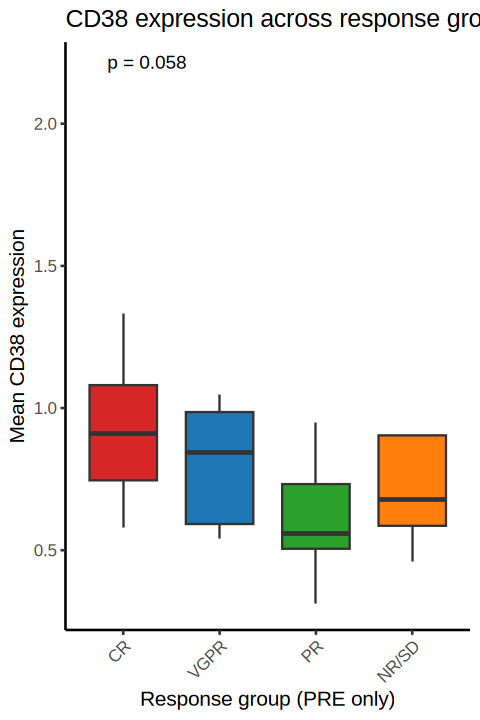

In [446]:
options(repr.plot.height=6,repr.plot.width=4)

# ================== PREP ==================
desired_levels <- c("CR","VGPR","PR","NR/SD")

plot_df <- cd38_summary_annot %>%
  filter(!is.na(mean_CD38),
         !is.na(clonotype),
         !is.na(timepoint),
         tolower(timepoint) == "pre") %>%     # keep PRE only
  mutate(
    response4 = case_when(
      str_detect(str_to_lower(clonotype), "polyclonal") ~ NA_character_,  # drop Normal
      TRUE ~ bestorlast.response
    ),
    response4 = factor(response4, levels = desired_levels)
  ) %>%
  filter(!is.na(response4))   # exclude Normal + missing

# ================== KRUSKAL–WALLIS ==================
kw <- kruskal.test(mean_CD38 ~ response4, data = plot_df)
message(sprintf("Kruskal–Wallis χ²=%.3f, df=%d, p=%.3g",
                kw$statistic, kw$parameter, kw$p.value))


# Add this before the plot:
scanpy_cols <- c(
  "CR"    = "#d62728",  # red
  "VGPR"  = "#1f77b4",  # blue
  "PR"    = "#2ca02c",  # green
  "NR/SD" = "#ff7f0e"   # orange
)


# ================== PLOT ==================
p<-ggplot(plot_df, aes(x = response4, y = mean_CD38, fill = response4)) +
  geom_boxplot(width = 0.7, outlier.shape = NA) +
  stat_compare_means(
    method = "kruskal.test",
    label = "p.format",
    label.y = max(plot_df$mean_CD38, na.rm = TRUE) * 1.05
  ) +
   scale_fill_manual(values = scanpy_cols, drop = FALSE, guide = "none") +

  theme_classic(base_size = 12) +
  labs(x = "Response group (PRE only)",
       y = "Mean CD38 expression",
       title = "CD38 expression across response groups (Kruskal–Wallis)") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
ggsave("Fig1g.pdf", plot = p, width = 4, height =6)
p